# MSE MachLe -- Data import and data visualization
**Helmut Grabner, Spring Term, 2021**

### Objectives:

+ Getting to know Jupyter Notbook
+ Importing data from packages
+ Visualization and exploration of datasets

### Tasks:

+ Load a dataset from a library
+ If required clean or manipulate your data
+ Explore and visualize attributes and observations of your dataset

### Questions:

+ Does your data have missing values? 
+ What types of attributes does your dataframe consist?
+ Are you able to observe any relation between attributes? 


### Hints:
+ Simple and **clean** datasets can be found under: https://github.com/mwaskom/seaborn-data
+ Use libraries for data retrieval (seaborn, sklearn), data cleaning (pandas, numpy) and data visualisation (seaborn, matplotlib).

## (1) Edgar Anderson's Iris Data
This famous iris data set gives the measurements in centimeters of the variables sepal length and width and petal length and width, respectively, for flowers from each species of iris. The species are Iris setosa, versicolor, and virginica.



In [ ]:
#Load a dataset from a library
import seaborn as sns
df = sns.load_dataset("iris")

In [ ]:
# Explore your dataset 

# How many observations and attributes does the dataset include?
# INSERT YOUR CODE HERE
print(f"Obervations :", df.shape[0], '\n', "Attributes :", df.shape[1], '\n')

# Does the Dataset include missing values?
# INSERT YOUR CODE HERE
print("Missing Values :", '\n' , df.isna().sum())

# Display the first 10 observations.
# INSERT YOUR CODE HERE
df.head(10)


In [ ]:
# Visualize attributes and observations of your data set.

# import required libraries
%matplotlib inline
import matplotlib.pyplot as plt

# example: boxplot
sns.boxplot(y= "sepal_length" , x= "species" , data=df)
plt.title("Boxplot of sepal length")
plt.show()

# example: histogram
sns.distplot(df["petal_length"], kde=True, rug=True, bins = 10)
plt.title("Histogram and distribution of petal width")
plt.show()
    
# example: pairsplot
sns.pairplot(data= df, hue="species")
plt.suptitle("Pairsplot by Species", y =1.05 )
plt.show()

In [ ]:
#Create additional plots of the dataset. What do you observe?

# INSERT YOUR CODE HERE
sns.boxplot(y= "sepal_length" , x= "petal_length", data=df)
plt.title("Boxplot of sepal length")
plt.show()

### Add your interpretations & findings here:

...


## (2) A more complex dataset

Choose another dataset which is more complex, i.e. has at least 100 observations and 8 attributes (e.g. sns.load_dataset("titanic")). Try to visualize your dataset and explain your observations.

Look at the hints to find new datasets.

In [ ]:
# INSERT YOUR CODE HERE
import seaborn as sns
import matplotlib.pyplot as plt

dat = sns.load_dataset("titanic")

sns.pairplot(data= dat, hue="survived")
plt.show()

### Add your interpretations & findings here:

...



# MSE MachLe -- Similarities, k-NN & Perforamnce Measurements (SOLUTION)
**Helmut Grabner, Spring Term, 2021**

### Objectives:
+ calculate different distances in Python
+ perform k-NN classification
+ calculating different performance measurements for classification problems
+ visualizing ROC curve

### Questions:
+ What is meant by "curse of dimensionality"
+ k-NN: what happens if you set k=1, or k=n?
+ Pros and Cons of the approaches
+ Explain the difference between RPC and ROC.
+ Explain the difference between recall and precision.

### Hints:
+ curse of dimensionolity: https://en.wikipedia.org/wiki/Curse_of_dimensionality
+ k-NN classifier: https://scikit-learn.org/stable/modules/generated/sklearn.neighbors.KNeighborsClassifier.html#sklearn.neighbors.KNeighborsClassifier
+ Classification metrics: https://scikit-learn.org/stable/modules/model_evaluation.html#classification-metrics
+ ROC: https://scikit-learn.org/stable/modules/generated/sklearn.metrics.roc_curve.html


# (1) Distances - Curse of dimensionality
Draw two random points in n-dimensions and calulate their distance using Euclidian Norm and repeat 1000 times. Normalize by the maximim possible values. For 2 dimensions the maximum distance ist $\sqrt{2}$, how does it generalize to higher dimensions?

What do you obsereve? Interpret results!

Distance for 2 dimensons : 0.368 , with variance:  0.0327
Distance for 3 dimensons : 0.387 , with variance:  0.0213
Distance for 10 dimensons : 0.402 , with variance:  0.0062
Distance for 100 dimensons : 0.408 , with variance:  0.0006
Distance for 1000 dimensons : 0.408 , with variance:  0.0001
Distance for 10000 dimensons : 0.408 , with variance:  0.0


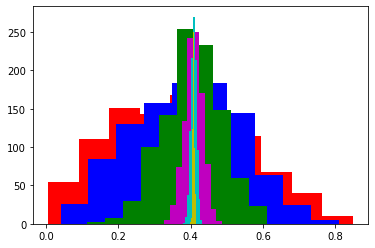

In [3]:
import scipy.spatial.distance as dist
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

c=['r', 'b', 'g', 'm', 'c', 'y']

cnt=-1
for dim in [2, 3, 10, 100, 1000, 10000]:
  cnt = cnt +1
  myDists=[]
  for i in range(1000):
      #draw two random points
      x = np.random.uniform(0, 1, dim)
      y = np.random.uniform(0, 1, dim)

      ### START YOUR CODE HERE ###

      #normalize = ...
      normalize = np.sqrt(dim)
      
      ### END YOUR CODE HERE ###
      
      curDist = dist.euclidean(x, y)/normalize
      myDists.append( curDist )
  print ('Distance for', dim, 'dimensons :' , 
         round(np.mean(myDists),3), ', with variance: ',round(np.var(myDists),4))
  plt.hist(myDists, color=c[cnt])

Same experiment as above, but use a differn distance funtion, e.g., $L_1$ or $L_\infty$. What changes?

Distance for 2 dimensons : 0.333 , with variance:  0.0271
Distance for 3 dimensons : 0.331 , with variance:  0.0178
Distance for 10 dimensons : 0.334 , with variance:  0.0053
Distance for 100 dimensons : 0.331 , with variance:  0.0005
Distance for 1000 dimensons : 0.334 , with variance:  0.0001
Distance for 10000 dimensons : 0.333 , with variance:  0.0


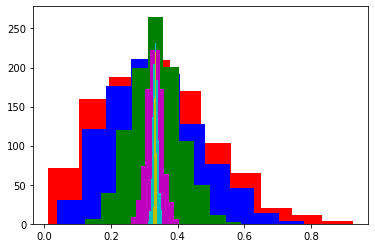

In [4]:
cnt=-1
for dim in [2, 3, 10, 100, 1000, 10000]:
  cnt = cnt +1
  myDists=[]
  for i in range(1000):
      
      ### START YOUR CODE HERE ###

      x = np.random.uniform(0, 1, dim)
      y = np.random.uniform(0, 1, dim)
      curDist = dist.cityblock(x, y) 
      myDists.append( curDist / (dim) )
      
      ### END YOUR CODE HERE ###

  print ('Distance for', dim, 'dimensons :' , round(np.mean(myDists),3), ', with variance: ',round(np.var(myDists),4))
  plt.hist(myDists, color=c[cnt])

### Add your interpretations & findings here:

...

# (2) Performance measruements - Breast cancer

Split the data into testsize 30% and trainsize 70% and perform classification using a k-NN classifier with k = 5.
Calculate accuracy, recall, precision and f1-score for your classifier and plot the confusion matrix.
+ Interprete your performance metrics, what measurement should be given high weight in this particular example?
+ Plot the ROC with the given function and calculate the area under curve (see hints)
+ Plot the RPC with the given function and calculate the average precision.

Performance measurements 
 accuracy  :  0.93 
 recall    :  0.936 
 precision :  0.954 
 f1-score  :  0.945


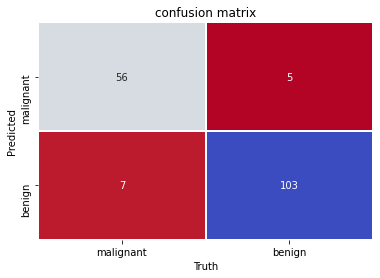

In [6]:
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
from sklearn.datasets import load_breast_cancer
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import roc_curve, roc_auc_score
from sklearn.metrics import precision_recall_curve
from sklearn.metrics import average_precision_score
from sklearn.metrics import confusion_matrix,f1_score,precision_score,recall_score,accuracy_score
%matplotlib inline
np.random.seed(1)

# load data
cancer = load_breast_cancer()

#### START YOUR CODE HERE ####
x = cancer.data 
y = cancer.target
labels = cancer.target_names
features = cancer.feature_names

# Split data into train and test dataset
trainX, testX, trainy, testy = train_test_split(x, y, test_size=0.3)

# Fit model to test data
model =  KNeighborsClassifier(n_neighbors = 5).fit(trainX, trainy)

# Get predictions
pred = model.predict(testX)

# create performance measurements
conf = confusion_matrix(pred, testy)
acc = accuracy_score(pred, testy)
rec = recall_score(pred, testy)
prec = precision_score(pred, testy)
f1 = f1_score(pred, testy)

print( "Performance measurements", "\n",
       "accuracy  : ", round(acc,3),"\n",
       "recall    : ", round(rec,3), "\n",
       "precision : ", round(prec,3),"\n",
       "f1-score  : ", round(f1,3))

sns.heatmap(conf, annot=True, fmt='d', cbar=False, cmap="coolwarm_r", xticklabels=labels, yticklabels=labels, linewidth = 1)
plt.title("confusion matrix")
plt.xlabel('Truth')
plt.ylabel('Predicted')
plt.show()
#### END YOUR CODE HERE ####


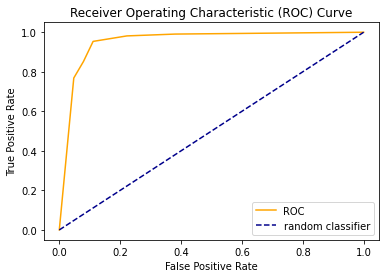

AUC:  0.953


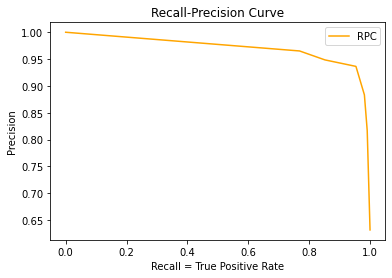

Average Precision:  0.954


In [7]:
# Predict probabilities for the test
probs = model.predict_proba(testX)

# Keep Probabilities of the positive class only
probs = probs[:, 1]

def plot_roc_curve(fpr, tpr):
    plt.plot(fpr, tpr, color='orange', label='ROC')
    plt.plot([0, 1], [0, 1], color='darkblue', linestyle='--', label = 'random classifier')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver Operating Characteristic (ROC) Curve')
    plt.legend()
    plt.show()

def plot_rpc(recall, precision):
    plt.plot(recall, precision, color='orange', label='RPC')
    plt.ylabel('Precision')
    plt.xlabel('Recall = True Positive Rate')
    plt.title('Recall-Precision Curve')
    plt.legend()
    plt.show()


#### START YOUR OCDE HERE ####
# Plot roc curve
fpr, tpr, thresholds = roc_curve(testy, probs)
plot_roc_curve(fpr, tpr)

# Compute Area Under the Curve (AUC) using the trapezoidal rule
auc = roc_auc_score(testy, probs)
print("AUC: " , round(auc,3))

# plot RPC
precision, recall, _ = precision_recall_curve(testy, probs)
plot_rpc(recall, precision)
average_precision = average_precision_score(testy, probs)
#Compute average precision
print("Average Precision: " , round(average_precision,3))

#### END YOUR OCDE HERE ####

### Add your interpretations & findings here:

...

# (3) k-NN, Diabetes data

Fit a k-NN classifier to the given dataset containing data from diabetes patients.
Choose as k, the values 1, 5 and n (number of train samples) and plot the corresponding confusion matrix.

+ What do you observe in the extreme cases for k.
+ What is the best k?
+ How can you choose the best k automatically?


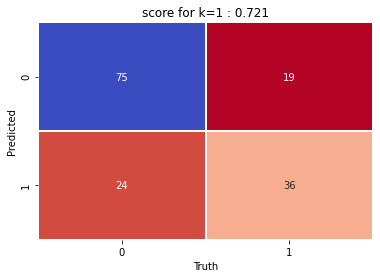

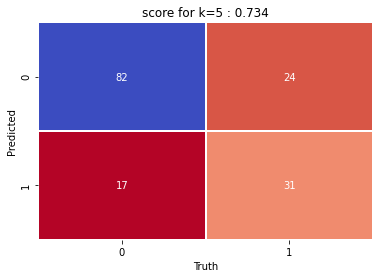

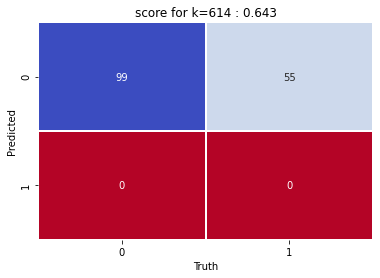

In [ ]:
import seaborn as sns
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, f1_score
import numpy as np
np.random.seed(1)
%matplotlib inline

# get data
df = pd.read_csv('diabetes.csv')
X = df.drop(columns=['Diabetes'])
y = df['Diabetes'].values

#split dataset into train and test data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2)

# Perform a k-NN on the given dataset and plot the confusion matrix

n = X_train.shape[0]
for i in [1,5,n]:

    #### START YOUR CODE HERE ####

    # Create KNN classifier
    # knn = ...
    
    # Fit the classifier to the data
    
    knn = KNeighborsClassifier(n_neighbors = i)
    knn.fit(X_train,y_train)
    
    #### END YOUR CODE HERE ####
    
    # predict test data
    pred = knn.predict(X_test)
    # Returns the mean accuracy on the given test data and labels
    score = knn.score(X_test, y_test)
    # get the confusion matrix
    conf = confusion_matrix(pred, y_test)
    # plot
    sns.heatmap(conf, annot=True, fmt='d', cbar=False, cmap="coolwarm_r",  linewidth = 1)
    plt.title('score for k={} : {}'.format(i,round(score,3)))
    plt.xlabel('Truth')
    plt.ylabel('Predicted')
    plt.show()
    



### Add your interpretations & findings here:

...

# MSE MachLe -- Hyperparameter Tuning (SOLUTION)
**Helmut Grabner, Spring Term, 2021**

### Objectives:
+ Performing k-NN classifier 
+ Using Train/ Val/ Test- Sets
+ Using cross validation to optimize hyperparameters

### Questions:
+ Pros. & Cons.

### Hints:
+ k-NN classifier: https://scikit-learn.org/stable/modules/generated/sklearn.neighbors.KNeighborsClassifier.html#sklearn.neighbors.KNeighborsClassifier

+ Cross Validation: https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.cross_val_score.html#sklearn.model_selection.cross_val_score





## (1) k-NN: whats the optmal k?

Following up the example from last week, we aim for automatically dertermining the best configuration (i.e., the Hyperparamter k). Loop from 1 to 100 to find the best k for k-NN. Split the data-set into 90% trainings and 10% test examples.

In [24]:
import seaborn as sns
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
import numpy as np
np.random.seed(1)
%matplotlib inline
import time

# get data
df = pd.read_csv('diabetes.csv')
X = df.drop(columns=['Diabetes'])
y = df['Diabetes'].values

#split dataset into train and test data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1, random_state=1)

print ("Trainingset Size:", len(X_train))
print ("Testset Size:", len(X_test))

Trainingset Size: 691
Testset Size: 77


## (1a) Validation-Set
Split your training data again into two sets: 90% used for training and 10% used for validation.

- How many samples are in the three sets now?
- Use the validation set to estimate the best k for the k-NN classifier.
- Train a final classifier on the best k and evaluate its performance on the test set.

In [25]:
#split the trainset again
#### START YOUR CODE HERE ####
X_train_val, X_val, y_train_val, y_val = train_test_split(X_train, y_train, test_size=0.1, random_state=1)

print ("Trainingset Size:", len(X_train_val))
print ("Validationset Size:", len(X_val))
print ("Testset Size:", len(X_test))
#### END YOUR CODE HERE ####

Trainingset Size: 621
Validationset Size: 70
Testset Size: 77


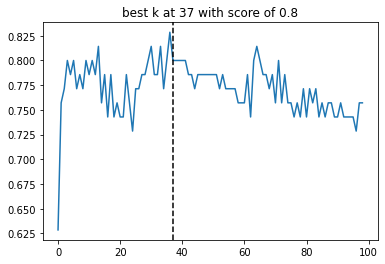

Time taken: 1.3328535730000013


In [26]:
# single crossvalidation for given K
from sklearn.neighbors import KNeighborsClassifier

# Loop from 1 to 100 to find the best k for k-NN. 
# Use the the performance (accuracy) on the validation set to estimate the best k

start = time.process_time()

#### START YOUR CODE HERE ####
#create a new KNN model
scores = []
for k in range(1,100):

  #train classifier
  knn_val = KNeighborsClassifier(n_neighbors=k).fit(X_train_val, y_train_val)
  
  # predict validation data
  pred = knn_val.predict(X_val)
  # Returns the mean accuracy on the given test data and labels
  val_score = knn_val.score(X_val, y_val)

  scores.append(val_score)

best_k = np.argmax(scores)+1
best_score = scores[best_k]

plt.plot(scores)
plt.title("best k at {} with score of {}".format(best_k, round(best_score,3)))
plt.axvline(x=best_k, c="k",  ls="--")
plt.show()

#### END YOUR CODE HERE ####

print("Time taken:", time.process_time() - start)

In [27]:
# Fit the classifier to the data and evaluate on test set

#### START YOUR CODE HERE ####
knn = KNeighborsClassifier(n_neighbors=best_k).fit(X_train, y_train)
# predict test data
pred = knn.predict(X_test)
# Returns the mean accuracy on the given test data and labels
score = knn.score(X_test, y_test)
print ("Test Score: ", score)

#### END YOUR CODE HERE ####

Test Score:  0.7532467532467533


## (1b) Cross-Validation

- Instead of using a validation set use the whole training data und 10-fold cross-validation and the mean cross validation score to estimate the best k. 
- Train a final classifier on the best k and evaluate its performance on the test set.

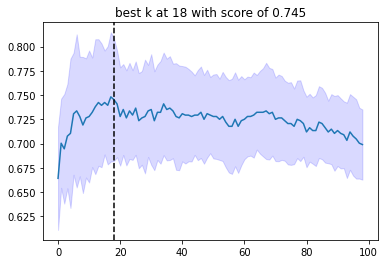

Time taken: 6.945231190000001


In [41]:
# single crossvalidation for given K
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import cross_val_score

# Loop from 1 to 100 to find the best k for k-NN. 
# Use the mean of the cross validation scores to estimate the best k

start = time.process_time()

#### START YOUR CODE HERE ####
#create a new KNN model
scores = np.array([])
scores_std =np.array([])
for k in range(1,100):

  knn_cv = KNeighborsClassifier(n_neighbors=k)

  #train model with cv of 10
  cv_scores = cross_val_score(knn_cv, X_train, y_train, cv=10)
  
  #print each cv score (accuracy) and average them
  scores = np.append(scores, np.mean(cv_scores))
  scores_std = np.append(scores_std, np.std(cv_scores))

best_k = np.argmax(scores)+1
best_score = scores[best_k]

plt.plot(scores)
plt.title("best k at {} with score of {}".format(best_k, round(best_score,3)))
plt.fill_between(range(0, len(scores)), scores + scores_std, scores - scores_std, alpha=0.15, color='blue')
plt.axvline(x=best_k, c="k",  ls="--")
plt.show()

#### END YOUR CODE HERE ####

print("Time taken:", time.process_time() - start)

In [29]:
# Fit the classifier to the data and evaluate on test set

#### START YOUR CODE HERE ####
knn = KNeighborsClassifier(n_neighbors=best_k).fit(X_train, y_train)
# predict test data
pred = knn.predict(X_test)
# Returns the mean accuracy on the given test data and labels
score = knn.score(X_test, y_test)
print ("Test Score: ", score)

#### END YOUR CODE HERE ####

Test Score:  0.7922077922077922


## Add your interpretations & findings here:

Compare the results from (1a) and (1b). 

- What are the advantages/ disavantages?
- Any thoughts on how to make (1a) more "robust"?


# MSE MachLe -- Bagging and Boosting Examples
**Helmut Grabner, Spring Term, 2021**

## Bagging example

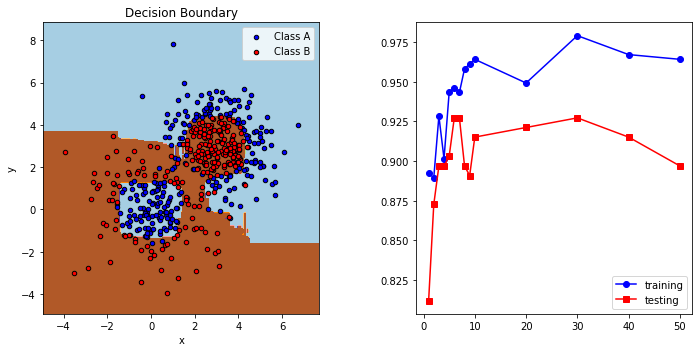

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
from IPython import display

from sklearn.ensemble import AdaBoostClassifier
from sklearn.ensemble import BaggingClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.datasets import make_gaussian_quantiles
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix,f1_score,precision_score,recall_score,accuracy_score


# Construct dataset
X1, y1 = make_gaussian_quantiles(cov=2.,
                                 n_samples=200, n_features=2,
                                 n_classes=2, random_state=1)
X2, y2 = make_gaussian_quantiles(mean=(3, 3), cov=1.5,
                                 n_samples=300, n_features=2,
                                 n_classes=2, random_state=1)
X = np.concatenate((X1, X2))
y = np.concatenate((y1, - y2 + 1))


#get training and test error
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33)

acc_train_history = []
acc_test_history = []
acc_numWeakClassifier = []

#for numWeakClassifier in [1]:
for numWeakClassifier in [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 20, 30, 40, 50]:

    # Create and fit an Bagging Classifier based on Decision Trees
    #decision stump - PLAY AROUND!
    #bdt = BaggingClassifier(DecisionTreeClassifier(max_depth=1), max_samples=0.5,
    #                           n_estimators=numWeakClassifier)
    #grown tree
    bdt = BaggingClassifier(DecisionTreeClassifier(max_depth=None), max_samples=0.5,
                               n_estimators=numWeakClassifier)


    bdt.fit(X_train, y_train)

    # Get predictions
    pred_train = bdt.predict(X_train)
    pred_test = bdt.predict(X_test)
    
    # create performance measurements
    acc_train = accuracy_score(pred_train, y_train)
    acc_test = accuracy_score(pred_test, y_test)
    #print ("Training acc: ", acc_train)
    #print ("Testing acc:  ", acc_test)
    
    acc_train_history.append(acc_train)
    acc_test_history.append(acc_test)
    acc_numWeakClassifier.append(numWeakClassifier)

    plot_colors = "br"
    plot_step = 0.02
    class_names = "AB"

    plt.figure(figsize=(15, 5))

    # Plot the decision boundaries
    plt.subplot(131)
    x_min, x_max = X[:, 0].min() - 1, X[:, 0].max() + 1
    y_min, y_max = X[:, 1].min() - 1, X[:, 1].max() + 1
    xx, yy = np.meshgrid(np.arange(x_min, x_max, plot_step),
                         np.arange(y_min, y_max, plot_step))

    Z = bdt.predict(np.c_[xx.ravel(), yy.ravel()])
    Z = Z.reshape(xx.shape)
    cs = plt.contourf(xx, yy, Z, cmap=plt.cm.Paired)
    plt.axis("tight")

    # Plot the training points
    for i, n, c in zip(range(2), class_names, plot_colors):
        idx = np.where(y == i)
        plt.scatter(X[idx, 0], X[idx, 1],
                    c=c, cmap=plt.cm.Paired,
                    s=20, edgecolor='k',
                    label="Class %s" % n)
    plt.xlim(x_min, x_max)
    plt.ylim(y_min, y_max)
    plt.legend(loc='upper right')
    plt.xlabel('x')
    plt.ylabel('y')
    plt.title('Decision Boundary')

    # Plot the two-class decision scores
    plt.subplot(132)
    plt.plot(acc_numWeakClassifier, acc_train_history, 'bo-', label="training")
    plt.plot(acc_numWeakClassifier, acc_test_history, 'rs-', label="testing")
    plt.legend()

    plt.tight_layout()
    plt.subplots_adjust(wspace=0.35)
    #plt.show()
    
    display.clear_output(wait=True)
    plt.pause(1.0/50.0)


## Boosting example

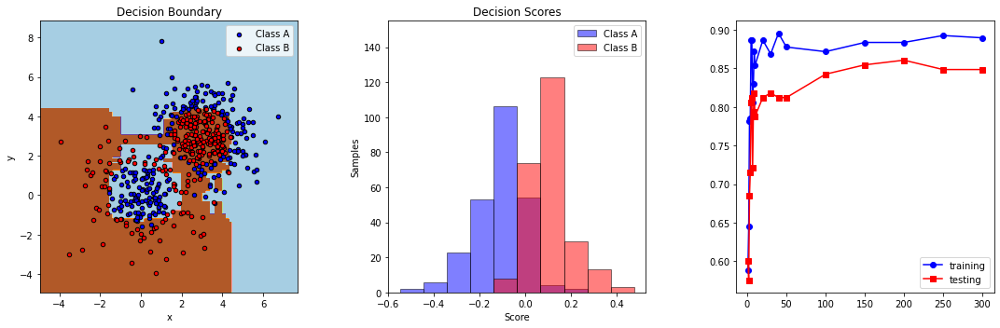

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
from IPython import display

from sklearn.ensemble import AdaBoostClassifier
from sklearn.ensemble import BaggingClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.datasets import make_gaussian_quantiles
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix,f1_score,precision_score,recall_score,accuracy_score


# Construct dataset
X1, y1 = make_gaussian_quantiles(cov=2.,
                                 n_samples=200, n_features=2,
                                 n_classes=2, random_state=1)
X2, y2 = make_gaussian_quantiles(mean=(3, 3), cov=1.5,
                                 n_samples=300, n_features=2,
                                 n_classes=2, random_state=1)
X = np.concatenate((X1, X2))
y = np.concatenate((y1, - y2 + 1))


#get training and test error
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33)

acc_train_history = []
acc_test_history = []
acc_numWeakClassifier = []

#for numWeakClassifier in [1]:
for numWeakClassifier in [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 20, 30, 40, 50, 100, 150, 200, 250, 300]:

    # Create and fit an AdaBoosted decision tree (stump)
    # NOTE: only linear decision -- decision STUMP!
    bdt = AdaBoostClassifier(DecisionTreeClassifier(max_depth=1),
                             algorithm="SAMME",
                             n_estimators=numWeakClassifier)

    bdt.fit(X_train, y_train)

    # Get predictions
    pred_train = bdt.predict(X_train)
    pred_test = bdt.predict(X_test)
    
    # create performance measurements
    acc_train = accuracy_score(pred_train, y_train)
    acc_test = accuracy_score(pred_test, y_test)
    #print ("Training acc: ", acc_train)
    #print ("Testing acc:  ", acc_test)
    
    acc_train_history.append(acc_train)
    acc_test_history.append(acc_test)
    acc_numWeakClassifier.append(numWeakClassifier)

    plot_colors = "br"
    plot_step = 0.02
    class_names = "AB"

    plt.figure(figsize=(15, 5))

    # Plot the decision boundaries
    plt.subplot(131)
    x_min, x_max = X[:, 0].min() - 1, X[:, 0].max() + 1
    y_min, y_max = X[:, 1].min() - 1, X[:, 1].max() + 1
    xx, yy = np.meshgrid(np.arange(x_min, x_max, plot_step),
                         np.arange(y_min, y_max, plot_step))

    Z = bdt.predict(np.c_[xx.ravel(), yy.ravel()])
    Z = Z.reshape(xx.shape)
    cs = plt.contourf(xx, yy, Z, cmap=plt.cm.Paired)
    plt.axis("tight")

    # Plot the training points
    for i, n, c in zip(range(2), class_names, plot_colors):
        idx = np.where(y == i)
        plt.scatter(X[idx, 0], X[idx, 1],
                    c=c, cmap=plt.cm.Paired,
                    s=20, edgecolor='k',
                    label="Class %s" % n)
    plt.xlim(x_min, x_max)
    plt.ylim(y_min, y_max)
    plt.legend(loc='upper right')
    plt.xlabel('x')
    plt.ylabel('y')
    plt.title('Decision Boundary')

    # Plot the two-class decision scores
    twoclass_output = bdt.decision_function(X)
    plot_range = (twoclass_output.min(), twoclass_output.max())
    plt.subplot(132)
    for i, n, c in zip(range(2), class_names, plot_colors):
        plt.hist(twoclass_output[y == i],
                 bins=10,
                 range=plot_range,
                 facecolor=c,
                 label='Class %s' % n,
                 alpha=.5,
                 edgecolor='k')
    x1, x2, y1, y2 = plt.axis()
    plt.axis((x1, x2, y1, y2 * 1.2))
    plt.legend(loc='upper right')
    plt.ylabel('Samples')
    plt.xlabel('Score')
    plt.title('Decision Scores')

    plt.subplot(133)
    plt.plot(acc_numWeakClassifier, acc_train_history, 'bo-', label="training")
    plt.plot(acc_numWeakClassifier, acc_test_history, 'rs-', label="testing")
    plt.legend()

    plt.tight_layout()
    plt.subplots_adjust(wspace=0.35)
    #plt.show()
    
    display.clear_output(wait=True)
    plt.pause(1.0/50.0)


# MSE MachLe -- Trees and Forests (SOLUTION)
**Helmut Grabner, Spring Term, 2021**

### Objectives:
+ Application of decisiontrees and their visualization
+ Apply Random Fores on categorical target variables
+ Apply Random Fores to text data

### Questions:
+ How is the splitting of the data into subsets made in bagging/boosting ?
+ What is the goal we try to achieve in bagging/boosting?
+ What additional method is used by Random Forest compared to bagging trees.
+ How many trees make a Forest?
+ How does Random Forest relate to decision trees and bagging.
+ Why are Random Forest robust against outliers?

### Hints:
+ Decision Trees: https://scikit-learn.org/stable/modules/generated/sklearn.tree.DecisionTreeClassifier.html#sklearn.tree.DecisionTreeClassifier
+ Tree Plot:  https://scikit-learn.org/stable/modules/generated/sklearn.tree.plot_tree.html
+ Random Forest: https://scikit-learn.org/stable/modules/generated/sklearn.ensemble.RandomForestClassifier.html
+ OOB: https://scikit-learn.org/stable/auto_examples/ensemble/plot_ensemble_oob.html


## (1) Decision Trees

- Split the data into a train and a testset.

- Apply a decisiontree classifier to the data and visualize your decision tree.

- Make a prediction for the test set and plot the confusion matrix. 

- Try different settings for the parameters  `min_samples_leaf` and `max_depth` in the classifier. What is you best accuracy?

- Try to interprete the estimate of the class distribution ('values' in the nodes) of your tree. 



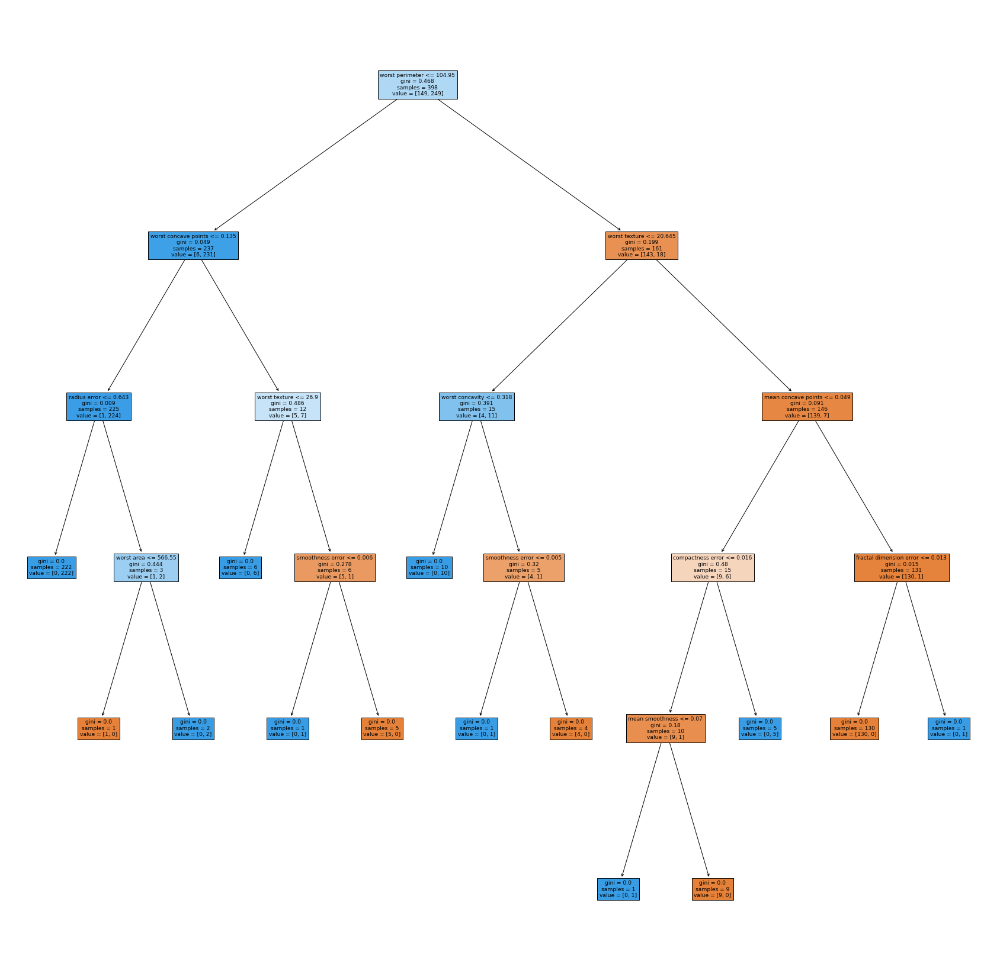

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.datasets import load_breast_cancer
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from sklearn.tree import DecisionTreeClassifier, plot_tree
%matplotlib inline
np.random.seed(1)
plt.figure(figsize=(30,30))

# Load data
cancer = load_breast_cancer()
X = cancer.data
y = cancer.target

# Apply a decisiontree classifier to the data and visualize your decision tree
#### START YOUR CODE HERE ####
trainX, testX, trainy, testy = train_test_split(X, y, test_size=0.3)

# fit model 
clf = DecisionTreeClassifier(min_samples_leaf=1 , max_depth = None)
clf = clf.fit(trainX, trainy)

# Plot tree
plot_tree(clf, filled=True, feature_names=cancer.feature_names)
plt.show()

#### END YOUR CODE HERE ####


### Add your interpretations and findings here:
...

In [ ]:
# Make a prediction for the test set, Try different settings for the parameters "min_samples_leaf" and "max_depth" 

#### START YOUR CODE HERE ####
# Get predictions
pred = clf.predict(testX)

acc_0 = accuracy_score(pred, testy)
print( "Performance measurements", "\n",
       "accuracy  : ", round(acc_0,3),"\n")

#### END YOUR CODE HERE ####

Performance measurements 
 accuracy  :  0.912 



## (2) Random Forest
- Split the data into a train and a testset. 
- Apply a random forest classifier to the data.
- Print the test and train accuracy and compare it to the out of bag score (hint: set `oob_score = True` in classifier).

- Visualize the importance plot and interprete it.


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.datasets import load_breast_cancer
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
%matplotlib inline
np.random.seed(1)

# Load data
cancer = load_breast_cancer()
X = cancer.data
y = cancer.target

labels = cancer.target_names
features = cancer.feature_names


# Apply a random forest to the data 
#### START YOUR CODE HERE ####

#split the dataset into training and testing
trainX, testX, trainy, testy = train_test_split(X, y, test_size=0.3)

# fit model 
clf = RandomForestClassifier(n_estimators=100, oob_score=True)
clf = clf.fit(trainX, trainy)

# predict
pred_train = clf.predict(trainX)
pred = clf.predict(testX)

# accuracy
acc_test = accuracy_score(pred, testy)
acc_train = accuracy_score(pred_train, trainy)
acc_oob = clf.oob_score_

#### END YOUR CODE HERE ####

print( "Performance measurements", "\n",
       "train accuracy      : ", round(acc_train,3),"\n",
       "test accuracy       : ", round(acc_test,3), "\n",
       "out of bag accuracy : ", round(acc_oob,3),"\n"
       )



Performance measurements 
 train accuracy      :  1.0 
 test accuracy       :  0.959 
 out of bag accuracy :  0.955 



## Add your interpretations and findings here:
...

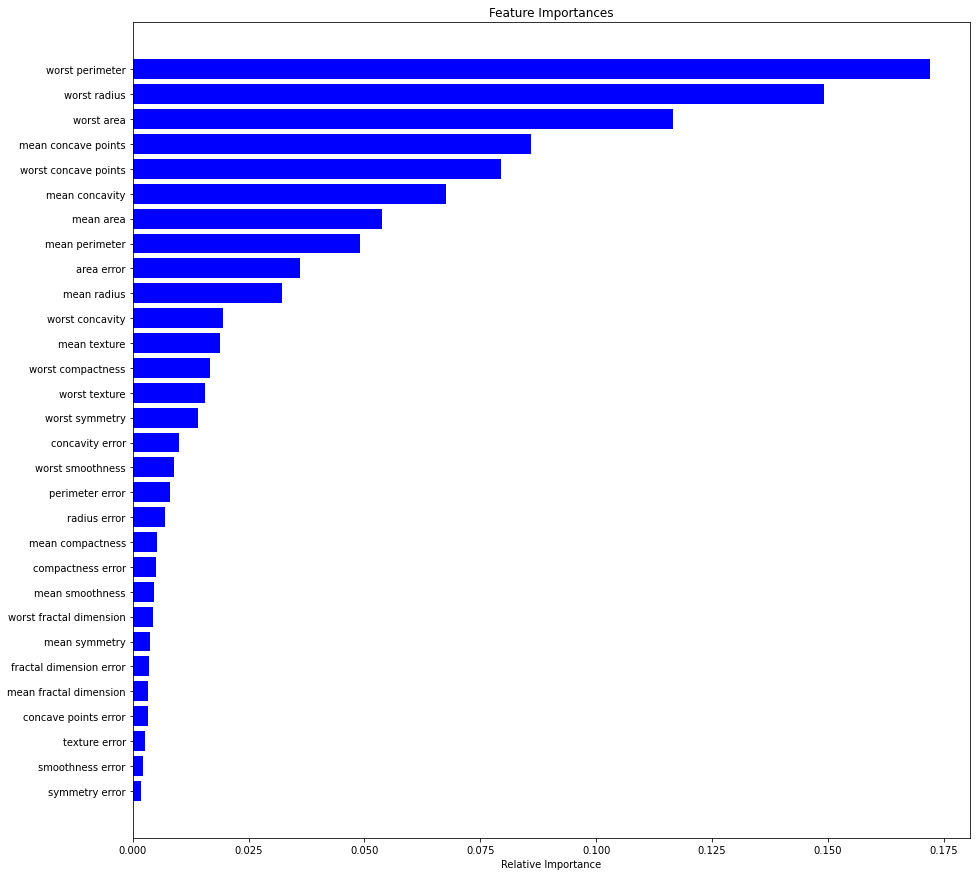

In [ ]:
# retrieve the relative importance of each variable and visualize the importance plot

#### START YOUR CODE HERE ####

importances = clf.feature_importances_

#### END YOUR CODE HERE ####

indices = np.argsort(importances)
plt.figure(figsize=(15,15))
plt.title('Feature Importances')
plt.barh(range(len(indices)), importances[indices], color='b', align='center')
plt.yticks(range(len(indices)), [features[i] for i in indices])
plt.xlabel('Relative Importance')
plt.show()

### Add your interpretations and findings here:
...

## (3) Sentiment analysis with IMDB reviews

In this notebook we work with the IMDb dataset, it is a binary sentiment analysis dataset consisting of 50,000 reviews from the Internet Movie Database (IMDB) labeled as positive (1) or negative (0). 

A negative review has a score ≤ 4 out of 10, and a positive review has a score ≥ 7 out of 10. We will apply a very simple preprocessing to the textreviews and then train a baseline randomforest on bag of words features. 

You can test the trained model on new reviews from the internet or by writting your own review for a movie you like or don't like.

Follow the instructions in the cells!

In [ ]:
# Downloading the reviews and labels
import numpy as np
import pandas as pd
import re
import matplotlib.pyplot as plt
from sklearn.metrics import accuracy_score
from sklearn.ensemble import RandomForestClassifier
from sklearn.feature_extraction.text import CountVectorizer  
%matplotlib inline

df = pd.read_csv('movie_data.csv', encoding='utf-8')
df.head()

,review,sentiment
0,I went and saw this movie last night after bei...,1
1,Actor turned director Bill Paxton follows up h...,1
2,As a recreational golfer with some knowledge o...,1
3,"I saw this film in a sneak preview, and it is ...",1
4,Bill Paxton has taken the true story of the 19...,1


In [ ]:
# data labelling
df = df.sample(frac=1,random_state=1).reset_index(drop=True)
X = df.loc[0:50000, 'review'].values
y = df.loc[0:50000, 'sentiment'].values

# data preparation
def text_proc(X):
    documents = []
    for i in range(0, len(X)):  
        # Remove all the special characters
        document = re.sub(r'\W', ' ', str(X[i]))
        # remove all single characters
        document = re.sub(r'\s+[a-zA-Z]\s+', ' ', document)
        # Remove single characters from the start
        document = re.sub(r'\^[a-zA-Z]\s+', ' ', document) 
        # Substituting multiple spaces with single space
        document = re.sub(r'\s+', ' ', document, flags=re.I)
        # Removing prefixed 'b'
        document = re.sub(r'^b\s+', '', document)
        # Removing html stuff
        document = re.sub("br", '', document)
        # Substituting multiple spaces with single space
        document = re.sub(r'\s+', ' ', document, flags=re.I)
        # Converting to Lowercase
        document = document.lower()
        documents.append(document)
    
    return documents

documents = text_proc(X)

# vectorize the input data
vectorizer = CountVectorizer(max_features=6000, min_df=5, max_df=0.7)
X = vectorizer.fit_transform(documents).toarray()

# Define train and test data
X_train = X[0:25000]
y_train = y[0:25000]
X_test = X[25000:50000]
y_test = y[25000:50000]

In [ ]:
# create a random forest classifier and make sentiment predictions for the movie reviews
# compare your test accuracy with your out of bag score and interprete it

#### START YOUR CODE HERE ####

clf = RandomForestClassifier(n_estimators=100, random_state=36, oob_score=True)
clf = clf.fit(X_train, y_train)
y_pred = clf.predict(X_test)

# accuracy
acc = accuracy_score(y_pred, y_test)

#### START YOUR CODE HERE ####

print( "Performance measurements", "\n",
       "test accuracy       : ", round(acc,3), "\n",
       "out of bag accuracy : ", round(clf.oob_score_,3),"\n"
       )


Performance measurements 
 test accuracy       :  0.844 
 out of bag accuracy :  0.825 



### Add your interpretations and findings here:
...

In [ ]:
# Write a positive, a negative and a neutral movie review into the saample list and interprete the prediction probability

sample=list(["YOUR_SENTENCE",
             "YOUR_SENTENCE",
             "YOUR_SENTENCE"
            ])

sample=list(["this was a very bad movie and the actor was so horrible",
             "this was a very bad movie and the actor was so horrible but i still liked it very much",
             "this was actually a great movie."
            ])

X_pred = text_proc(sample)
X_pred = vectorizer.transform(X_pred).toarray() 
print(clf.predict_proba(X_pred))

[[0.83 0.17]
 [0.77 0.23]
 [0.09 0.91]]


### Add your interpretations and findings here:
...

## Feature Engineering and Machine Learning

In [22]:
# Imports
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import re
import numpy as np
from sklearn import tree
from sklearn.model_selection import GridSearchCV

# Figures inline and set visualization style
%matplotlib inline
sns.set()

# Import data
df_train = pd.read_csv('titanic/train.csv')
df_test = pd.read_csv('titanic/test.csv')

# Store target variable of training data in a safe place
survived_train = df_train.Survived

# Concatenate training and test sets
data = pd.concat([df_train.drop(['Survived'], axis=1), df_test])

# View head
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1309 entries, 0 to 417
Data columns (total 11 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   PassengerId  1309 non-null   int64  
 1   Pclass       1309 non-null   int64  
 2   Name         1309 non-null   object 
 3   Sex          1309 non-null   object 
 4   Age          1046 non-null   float64
 5   SibSp        1309 non-null   int64  
 6   Parch        1309 non-null   int64  
 7   Ticket       1309 non-null   object 
 8   Fare         1308 non-null   float64
 9   Cabin        295 non-null    object 
 10  Embarked     1307 non-null   object 
dtypes: float64(2), int64(4), object(5)
memory usage: 122.7+ KB


## Why feature engineer at all?

To extract more information from your data. For example, check out the 'Name' column:

In [23]:
# View head of 'Name' column
data.Name.tail()

413              Spector, Mr. Woolf
414    Oliva y Ocana, Dona. Fermina
415    Saether, Mr. Simon Sivertsen
416             Ware, Mr. Frederick
417        Peter, Master. Michael J
Name: Name, dtype: object

Notice that this columns contains strings (text) that contain 'Title' such as 'Mr', 'Master' and 'Dona'. You can use regular expressions to extract the Title (to learn more about regular expressions, check out my write up of our last [FB Live code along event](https://www.datacamp.com/community/tutorials/web-scraping-python-nlp)):

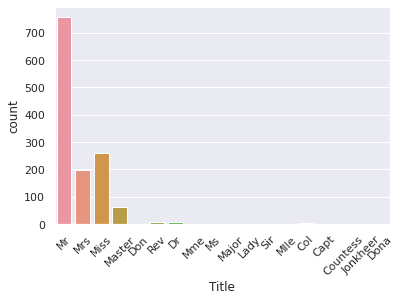

In [24]:
# Extract Title from Name, store in column and plot barplot
data['Title'] = data.Name.apply(lambda x: re.search(' ([A-Z][a-z]+)\.', x).group(1))
sns.countplot(x='Title', data=data);
plt.xticks(rotation=45);

* There are several titles and it makes sense to put them in fewer buckets:

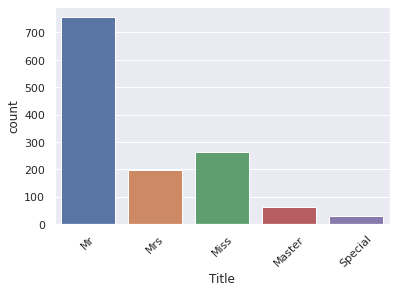

In [25]:
data['Title'] = data['Title'].replace({'Mlle':'Miss', 'Mme':'Mrs', 'Ms':'Miss'})
data['Title'] = data['Title'].replace(['Don', 'Dona', 'Rev', 'Dr',
                                            'Major', 'Lady', 'Sir', 'Col', 'Capt', 'Countess', 'Jonkheer'],'Special')
sns.countplot(x='Title', data=data);
plt.xticks(rotation=45);

* Check out your data again and make sure that we have a 'Title' column:

In [26]:
# View head of data
data.tail()

,PassengerId,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked,Title
413,1305,3,"Spector, Mr. Woolf",male,NaN,0,0,A.5. 3236,8.0500,NaN,S,Mr
414,1306,1,"Oliva y Ocana, Dona. Fermina",female,39.0,0,0,PC 17758,108.9000,C105,C,Special
415,1307,3,"Saether, Mr. Simon Sivertsen",male,38.5,0,0,SOTON/O.Q. 3101262,7.2500,NaN,S,Mr
416,1308,3,"Ware, Mr. Frederick",male,NaN,0,0,359309,8.0500,NaN,S,Mr
417,1309,3,"Peter, Master. Michael J",male,NaN,1,1,2668,22.3583,NaN,C,Master


### Being cabinless may be important

* There are several NaNs (missing values) in the 'Cabin' column. It is reasonable to presume that those NaNs didn't have a cabin, which may tell us something about 'Survival' so now create a new column that encodes this information:

In [27]:
# Did they have a Cabin?
data['Has_Cabin'] = ~data.Cabin.isnull()

# View head of data
data.head()

,PassengerId,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked,Title,Has_Cabin
0,1,3,"Braund, Mr. Owen Harris",male,22.0,1,0,A/5 21171,7.2500,NaN,S,Mr,False
1,2,1,"Cumings, Mrs. John Bradley (Florence Briggs Th...",female,38.0,1,0,PC 17599,71.2833,C85,C,Mrs,True
2,3,3,"Heikkinen, Miss. Laina",female,26.0,0,0,STON/O2. 3101282,7.9250,NaN,S,Miss,False
3,4,1,"Futrelle, Mrs. Jacques Heath (Lily May Peel)",female,35.0,1,0,113803,53.1000,C123,S,Mrs,True
4,5,3,"Allen, Mr. William Henry",male,35.0,0,0,373450,8.0500,NaN,S,Mr,False


* Drop columns that contain no more useful information (or that we're not sure what to do with:) `['Cabin', 'Name', 'PassengerId', 'Ticket']`:

In [28]:
# Drop columns and view head
data.drop(['Cabin', 'Name', 'PassengerId', 'Ticket'], axis=1, inplace=True)
data.head()

,Pclass,Sex,Age,SibSp,Parch,Fare,Embarked,Title,Has_Cabin
0,3,male,22.0,1,0,7.2500,S,Mr,False
1,1,female,38.0,1,0,71.2833,C,Mrs,True
2,3,female,26.0,0,0,7.9250,S,Miss,False
3,1,female,35.0,1,0,53.1000,S,Mrs,True
4,3,male,35.0,0,0,8.0500,S,Mr,False


**Recap:**
* You've engineered some new features such as 'Title' and 'Has_Cabin': congrats!

**Up next:** deal with missing values and bin your numerical data, transform all features into numeric variables. Then you'll build your final model for this session.

If you're enoying this session, retweet or share on FB now and follow us on Twitter: [@hugobowne](https://twitter.com/hugobowne) & [@DataCamp](https://twitter.com/datacamp).

### Dealing with missing values

* Figure out if there are any missing values left:

In [29]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1309 entries, 0 to 417
Data columns (total 9 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   Pclass     1309 non-null   int64  
 1   Sex        1309 non-null   object 
 2   Age        1046 non-null   float64
 3   SibSp      1309 non-null   int64  
 4   Parch      1309 non-null   int64  
 5   Fare       1308 non-null   float64
 6   Embarked   1307 non-null   object 
 7   Title      1309 non-null   object 
 8   Has_Cabin  1309 non-null   bool   
dtypes: bool(1), float64(2), int64(3), object(3)
memory usage: 93.3+ KB


* Impute missing values:

In [30]:
# Impute missing values for Age, Fare, Embarked
data['Age'] = data.Age.fillna(data.Age.median())
data['Fare'] = data.Fare.fillna(data.Fare.median())
data['Embarked'] = data['Embarked'].fillna('S')
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1309 entries, 0 to 417
Data columns (total 9 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   Pclass     1309 non-null   int64  
 1   Sex        1309 non-null   object 
 2   Age        1309 non-null   float64
 3   SibSp      1309 non-null   int64  
 4   Parch      1309 non-null   int64  
 5   Fare       1309 non-null   float64
 6   Embarked   1309 non-null   object 
 7   Title      1309 non-null   object 
 8   Has_Cabin  1309 non-null   bool   
dtypes: bool(1), float64(2), int64(3), object(3)
memory usage: 93.3+ KB


In [31]:
data.head()

,Pclass,Sex,Age,SibSp,Parch,Fare,Embarked,Title,Has_Cabin
0,3,male,22.0,1,0,7.2500,S,Mr,False
1,1,female,38.0,1,0,71.2833,C,Mrs,True
2,3,female,26.0,0,0,7.9250,S,Miss,False
3,1,female,35.0,1,0,53.1000,S,Mrs,True
4,3,male,35.0,0,0,8.0500,S,Mr,False


### Bin numerical data

* Use the `pandas` function `qcut` to bin your numerical data:

In [32]:
# Binning numerical columns
data['CatAge'] = pd.qcut(data.Age, q=4, labels=False )
data['CatFare']= pd.qcut(data.Fare, q=4, labels=False)
data.head()

,Pclass,Sex,Age,SibSp,Parch,Fare,Embarked,Title,Has_Cabin,CatAge,CatFare
0,3,male,22.0,1,0,7.2500,S,Mr,False,0,0
1,1,female,38.0,1,0,71.2833,C,Mrs,True,3,3
2,3,female,26.0,0,0,7.9250,S,Miss,False,1,1
3,1,female,35.0,1,0,53.1000,S,Mrs,True,2,3
4,3,male,35.0,0,0,8.0500,S,Mr,False,2,1


* You can now safely drop 'Age' and 'Fare' columns:

In [33]:
data = data.drop(['Age', 'Fare'], axis=1)
data.head()

,Pclass,Sex,SibSp,Parch,Embarked,Title,Has_Cabin,CatAge,CatFare
0,3,male,1,0,S,Mr,False,0,0
1,1,female,1,0,C,Mrs,True,3,3
2,3,female,0,0,S,Miss,False,1,1
3,1,female,1,0,S,Mrs,True,2,3
4,3,male,0,0,S,Mr,False,2,1


## Create a new column: number of members in family onboard

In [35]:
# Create column of number of Family members onboard
#data['Fam_Size'] = ____

In [36]:
# Drop columns
data = data.drop(['SibSp','Parch'], axis=1)
data.head()

,Pclass,Sex,Embarked,Title,Has_Cabin,CatAge,CatFare
0,3,male,S,Mr,False,0,0
1,1,female,C,Mrs,True,3,3
2,3,female,S,Miss,False,1,1
3,1,female,S,Mrs,True,2,3
4,3,male,S,Mr,False,2,1


## Transform all variables into numerical variables

In [37]:
# Transform into binary variables
data_dum = pd.get_dummies(data, drop_first=True)
data_dum.head()

,Pclass,Has_Cabin,CatAge,CatFare,Sex_male,Embarked_Q,Embarked_S,Title_Miss,Title_Mr,Title_Mrs,Title_Special
0,3,False,0,0,1,0,1,0,1,0,0
1,1,True,3,3,0,0,0,0,0,1,0
2,3,False,1,1,0,0,1,1,0,0,0
3,1,True,2,3,0,0,1,0,0,1,0
4,3,False,2,1,1,0,1,0,1,0,0


**Recap:**
* You've engineered some new features such as 'Title' and 'Has_Cabin';
* You've dealt with missing values, binned your numerical data and transformed all features into numeric variables.

**Up next:**  It's time ... to build your final model!

If you're enoying this session, retweet or share on FB now and follow us on Twitter: [@hugobowne](https://twitter.com/hugobowne) & [@DataCamp](https://twitter.com/datacamp).

## Building models with our new dataset!

* As before, first you'll split your `data` back into training and test sets; then you'll transform them into arrays:

In [38]:
# Split into test.train
data_train = data_dum.iloc[:891]
data_test = data_dum.iloc[891:]

# Transform into arrays for scikit-learn
X = data_train.values
test = data_test.values
y = survived_train.values

You're now going to build a decision tree on your brand new feature-engineered dataset. To choose your hyperparameter `max_depth`, you'll use a variation on test train split called cross validation.

<img src="img/cv.png" width="400">

We begin by splitting the dataset into 5 groups or *folds*. Then we hold out the first fold as a test set, fit our model on the remaining four folds, predict on the test set and compute the metric of interest. Next we hold out the second fold as our test set, fit on the remaining data, predict on the test set and compute the metric of interest. Then similarly with the third, fourth and fifth. 		
 
As a result we get five values of accuracy, from which we can compute statistics	of interest, such as the median and/or mean and 95% confidence intervals. 

We do this for each value of each hyperparameter that we're tuning and choose the set of hyperparameters that performs the best. This is called _grid search_.

* Let's get it! In the following, you'll use cross validation and grid search to choose the best `max_depth` for your new feature engineered dataset:

In [39]:
# Setup the hyperparameter grid
dep = np.arange(1,9)
param_grid = {'max_depth' : dep}

# Instantiate a decision tree classifier: clf
clf = tree.DecisionTreeClassifier()

# Instantiate the GridSearchCV object: clf_cv
clf_cv = GridSearchCV(clf, param_grid=param_grid, cv=5)

# Fit it to the data
clf_cv.fit(X, y)

# Print the tuned parameter and score
print("Tuned Decision Tree Parameters: {}".format(clf_cv.best_params_))
print("Best score is {}".format(clf_cv.best_score_))


Tuned Decision Tree Parameters: {'max_depth': 3}
Best score is 0.8103069487163392


* Make predictions on your test set, create a new column 'Survived' and store your predictions in it. Save 'PassengerId' and 'Survived' columns of `df_test` to a .csv and submit to Kaggle.

In [41]:
Y_pred = clf_cv.predict(test)
df_test['Survived'] = Y_pred
df_test[['PassengerId', 'Survived']].to_csv('./dec_tree_feat_eng.csv', index=False)

* What was the accuracy?

_Accuracy_ = 78.9.

## Next steps

See if you can do some more feature engineering and try some new models out to improve on this score. I'll post all of this on github and on the DataCamp community and it would be great to see all of you improve on these models.

There's a lot more pre-processing that you'd like to learn about, such as scaling your data. You'll also find scikit-learn pipelines super useful. Check out our [Supervised Learning with scikit-learn course](https://www.datacamp.com/courses/supervised-learning-with-scikit-learn) and the [scikit-learn docs](http://scikit-learn.org/stable/) for all of this and more.

# MSE MachLe -- (Deep) Neural Networks (SOLUTION)
**Helmut Grabner, Spring Term, 2021**

### Objectives:
+ Get an idea on how deep neural net are modeled.
+ Apply the methods you learned in this lecture to "real world data".

### Questions:
+ What are basic elemts of neural networks?
+ How can neural networks be optimized?
+ Why does one need the non-linearities?
+ What is the role of activation functions in a neural network?


### Hints:
+ Google Colab: https://colab.research.google.com/notebooks/welcome.ipynb#recent=true

+ Go to "upload" to open this notebook in Google Colab.

+ If you want to install tensorflow on your local machine, run the following code in a notebok cell: `!pip install tensorflow`

+ Tensorflow/Keras Cheat Sheet: https://s3.amazonaws.com/assets.datacamp.com/blog_assets/Keras_Cheat_Sheet_Python.pdf


## (1) Neural Net with Fashion MNIST (1 point)

+ This Notebook should be solved in google Colab since you would have to install tensorflow on your local device. By running this notebook on google Colab you can skip the installing part.

This notebook trains a neural network model to classify images of clothing, like sneakers and shirts. It's okay if you don't understand all the details in this notebook. It should only give you an idea of what else exists besides the classical statistical/machine learning methods.

This guide uses the Fashion MNIST dataset by Zalando  which contains 70,000 grayscale images in 10 categories. The images show individual articles of clothing at low resolution (28 by 28 pixels).

Here, 60,000 images are used to train the network and 10,000 images to evaluate how accurately the network learned to classify images. You can access the Fashion MNIST directly from TensorFlow.


In [1]:
# load required packages
import tensorflow as tf
from tensorflow.keras.datasets import fashion_mnist
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Flatten, Conv2D, Dropout, MaxPooling2D,Activation, BatchNormalization
import numpy as np
import matplotlib.pyplot as plt
print(tf.__version__) #version should be at least 1.15.x

2.4.1


In [15]:
# load and split data
(train_images, train_labels), (test_images, test_labels) = fashion_mnist.load_data()
train_images = train_images.reshape((len(train_images),28,28))
test_images = test_images.reshape((len(test_images),28,28))

# names of class labels
class_names = ['T-shirt/top', 'Trouser', 'Pullover', 'Dress', 'Coat',
               'Sandal', 'Shirt', 'Sneaker', 'Bag', 'Ankle boot']

In [3]:
# shapes of train and test data -- check if data is loaded correctly, i.e., the dimensions match
print("shape for training (x) data : ", train_images.shape) # should be: 60'000 Images with 28x28 pixels
print("shape for training (y) data : ", train_labels.shape)  # 60'000 Labels with 10 classes
print("shape for test (x) data     : ", test_images.shape)  # 10'000 Images with 28x28 pixels
print("shape for test (y) data     : ", test_labels.shape)  # 10'000 Labels with 10 classes

shape for training (x) data :  (60000, 28, 28)
shape for training (y) data :  (60000,)
shape for test (x) data     :  (10000, 28, 28)
shape for test (y) data     :  (10000,)


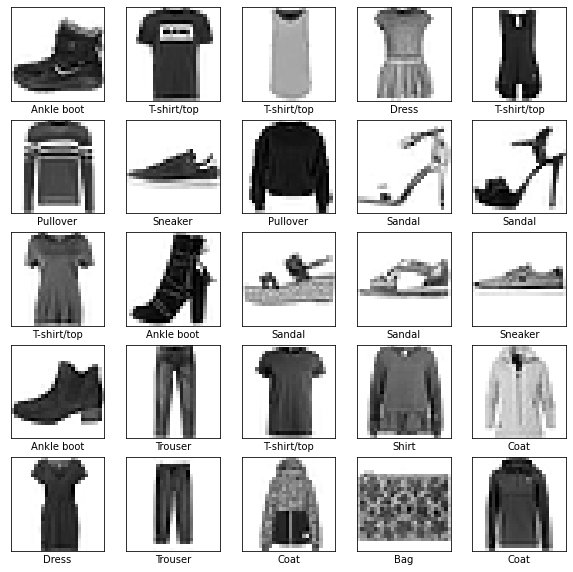

In [4]:
# to give you an overview of the data plot first 25 images with corresponding labels
plt.figure(figsize=(10,10))
for i in range(25):
    plt.subplot(5,5,i+1)
    plt.xticks([])
    plt.yticks([])
    plt.grid(False)
    plt.imshow(train_images[i], cmap=plt.cm.binary)
    plt.xlabel(class_names[train_labels[i]])
plt.show()

### Train a Deep Neural Network
Here we start building the (deep) neural net, the first and the last layer are given. The model should also give you an output as it is now with an accuracy of approximately 80%. The idea is that you change and/or add layers to the model to get a better accuracy.

See the hints for different neural network architectures/styles!

Among the possible Laysers you can add are :
+ `Flatten()`
+ `Dense()` (specify a activation function i.e. use the argument, `activation=...`)
+ `Dropout()`
+ `Conv2D()` and `MaxPooling2D()` [optional]

It is your choice how deep or complex you want to build your neural network.

*Hint:* Consider that for a Conv2D model you have to reshape your data to (60000, 28, 28, **1**) respectively (10'000, 28, 28, **1**) and **remove** the Flatten layer !

Describe your interpretations, observations and performance regarding your neural network in the last cell.

In [17]:
# you can also run this model without adding layers, to see how the most simple model performs
model = Sequential()
#model.add(Flatten(input_shape=(28, 28))) #remove this layer if you want to use Covolutional neural networks

#### START YOUR CODE HERE ####
train_images=train_images.reshape(60000,28,28,1)
test_images=test_images.reshape(10000,28,28,1)

model.add(Conv2D(filters = 32,kernel_size=(3,3), strides =1, padding='same', input_shape= (28,28,1), activation="relu"))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=(2,2)))
model.add(Dropout(0.3))
model.add(Conv2D(filters = 64,kernel_size=(4,4), strides =1, padding='same',activation="relu"))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=(2,2)))
model.add(Dropout(0.4))
model.add(Conv2D(filters = 128,kernel_size=(5,5), strides =1, padding='same',activation="relu"))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=(2,2)))
model.add(Dropout(0.5))
model.add(Flatten())
model.add(Dense(128, activation='relu'))
#### END YOUR CODE HERE ####

#final output layer for 10 classes (do not modify this layer)
model.add(Dense(10, activation = 'softmax'))

# print a summary of your model
model.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_3 (Conv2D)            (None, 28, 28, 32)        320       
_________________________________________________________________
batch_normalization_3 (Batch (None, 28, 28, 32)        128       
_________________________________________________________________
max_pooling2d_3 (MaxPooling2 (None, 14, 14, 32)        0         
_________________________________________________________________
dropout_3 (Dropout)          (None, 14, 14, 32)        0         
_________________________________________________________________
conv2d_4 (Conv2D)            (None, 14, 14, 64)        32832     
_________________________________________________________________
batch_normalization_4 (Batch (None, 14, 14, 64)        256       
_________________________________________________________________
max_pooling2d_4 (MaxPooling2 (None, 7, 7, 64)         

In the following cell the the model that you specified above will be compiled an fitted to your data. 

If you want you can adapt parameters such as `optimizer` and/or `epochs`, no worries if you don't get all the details.


Epoch 1/10
1875/1875 [==============================] - 9s 4ms/step - loss: 0.7303 - accuracy: 0.7470 - val_loss: 0.3498 - val_accuracy: 0.8718
Epoch 2/10
1875/1875 [==============================] - 8s 4ms/step - loss: 0.3548 - accuracy: 0.8673 - val_loss: 0.3284 - val_accuracy: 0.8813
Epoch 3/10
1875/1875 [==============================] - 8s 4ms/step - loss: 0.3125 - accuracy: 0.8840 - val_loss: 0.2836 - val_accuracy: 0.8962
Epoch 4/10
1875/1875 [==============================] - 8s 4ms/step - loss: 0.2854 - accuracy: 0.8944 - val_loss: 0.2748 - val_accuracy: 0.8997
Epoch 5/10
1875/1875 [==============================] - 8s 4ms/step - loss: 0.2677 - accuracy: 0.9016 - val_loss: 0.2490 - val_accuracy: 0.9103
Epoch 6/10
1875/1875 [==============================] - 8s 4ms/step - loss: 0.2533 - accuracy: 0.9052 - val_loss: 0.2530 - val_accuracy: 0.9086
Epoch 7/10
1875/1875 [==============================] - 8s 4ms/step - loss: 0.2460 - accuracy: 0.9084 - val_loss: 0.2372 - val_accuracy:

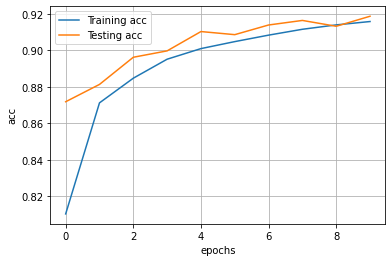

In [18]:
# compile model
# you can modify the parameter optimizer with different optimization methods
model.compile(optimizer = 'adam', 
              loss='sparse_categorical_crossentropy', 
              metrics=['accuracy'])

# fit model to train data
# you can add more 'iterations' by raising the parameter epochs
log = model.fit(train_images, 
                train_labels, 
                epochs = 10,
                validation_data = (test_images, test_labels))

# make predictions for test data
predictions = model.predict(test_images)

# plot accuracy per epoch
plt.plot(log.history['accuracy'], label='Training acc')
plt.plot(log.history['val_accuracy'], label='Testing acc')
plt.xlabel("epochs")
plt.ylabel("acc")
plt.legend()
plt.grid()


The cell below visualizes the input of your predictions with the corresponding images. 

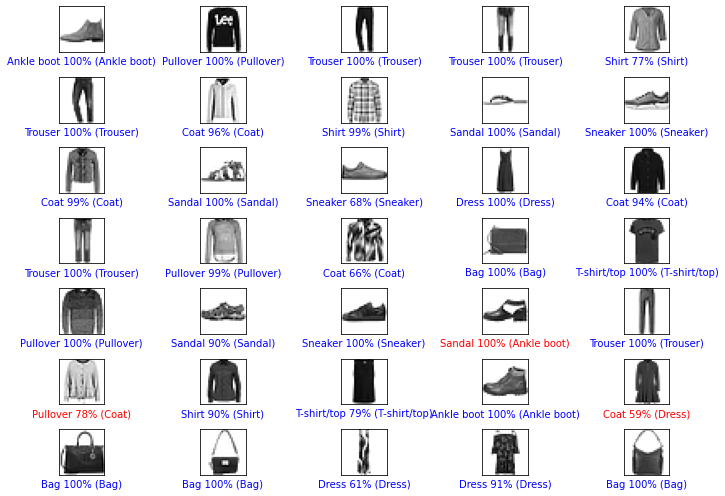

In [8]:
# This function plots the first n predictions with their true label (in brackets) and image

test_images=test_images.reshape(10000,28,28)

def plot_image(i, predictions_array, true_label, img):
  predictions_array, true_label, img = predictions_array, true_label[i], img[i]
  plt.xticks([])
  plt.yticks([])
  plt.imshow(img, cmap=plt.cm.binary)
  predicted_label = np.argmax(predictions_array)
  if predicted_label == true_label:
    color = 'blue'
  else:
    color = 'red'
  plt.xlabel("{} {:2.0f}% ({})".format(class_names[predicted_label],
                                100*np.max(predictions_array),
                                class_names[true_label]),
                                color=color)

# plot prediction and image
num_rows = 7
num_cols = 5
num_images = num_rows*num_cols
plt.figure(figsize=(2*num_cols, 1*num_rows))
for i in range(num_images):
  plt.subplot(num_rows, num_cols, i+1)
  plot_image(i, predictions[i], test_labels, test_images)
plt.tight_layout()
plt.show()

### Add your interpretations and findings:
...

## (2) Classical method with Fashion MNIST

You have seen the deeplearning approach for the problem above.
Try to predict the classes for the fashion mnist dataset with the classical machine learning methods you learned in the lecture.




<img src="ost_logo.png" width="240" height="240" align="right"/>
<div style="text-align: left"> <b> Machine Learning </b> <br> MSE FTP MachLe <br> 
<a href="mailto:christoph.wuersch@ost.ch"> Christoph Würsch </a> </div>

# ML07 A2 Simple SVM examples
MSE_FTP_MachLe, WÜRC 

Excecute the following examples to get a feeling for the SVM and how to use it with scikit-learn. We start with a random two dimensional data set.

In [1]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn import svm

#### Creation of data
We create 2 times 100 data points as follows:

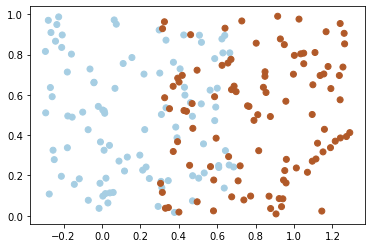

In [2]:
%matplotlib inline
np.random.seed(42)
y = np.concatenate((np.repeat(-1,100),np.repeat(1,100))) 
X = np.random.rand(200,2) 
X[:,0] += 0.3*y
np.shape(y)
plt.scatter(X[:,0],X[:,1],c=y, cmap=plt.cm.Paired)
plt.show()

#### Training and prediction using a SVM
Execute the following code and adpot the code to make predictions for a few other points. Does the result make sense?

In [3]:
C = 0.4
svc = svm.SVC(kernel='linear', C=C).fit(X,y)

In [4]:
svc.predict([(-0.4,1)])

array([-1])

#### Cross validation
Play around with the code below. Which parameter C gives the best leave-one-out cross validation error?

In [5]:
from sklearn import model_selection
C = 0.03
svc = svm.SVC(kernel='linear', C=C)
loo = model_selection.LeaveOneOut()
# svc.fit(...).score() gives 1 if prediction is correct 0 otherwise 
res = [svc.fit(X[train], y[train]).score(X[test], y[test]) for train, test in loo.split(X)]
#res is a vector with 0,1
np.mean(res) #The average accuracy

0.78

In [6]:
from sklearn import model_selection
Clist = np.logspace(-3,3,14)
for C in Clist:
    svc = svm.SVC(kernel='linear', C=C)
    loo = model_selection.LeaveOneOut()
    # svc.fit(...).score() gives 1 if prediction is correct 0 otherwise 
    res = [svc.fit(X[train], y[train]).score(X[test], y[test]) for train, test in loo.split(X)]
    #res is a vector with 0,1
    print('C: %f \t accuracy: %f' % (C,np.mean(res))) #The average accuracy


C: 0.001000 	 accuracy: 0.000000
C: 0.002894 	 accuracy: 0.000000
C: 0.008377 	 accuracy: 0.000000
C: 0.024245 	 accuracy: 0.780000
C: 0.070170 	 accuracy: 0.780000
C: 0.203092 	 accuracy: 0.780000
C: 0.587802 	 accuracy: 0.765000
C: 1.701254 	 accuracy: 0.790000
C: 4.923883 	 accuracy: 0.785000
C: 14.251027 	 accuracy: 0.785000
C: 41.246264 	 accuracy: 0.785000
C: 119.377664 	 accuracy: 0.785000
C: 345.510729 	 accuracy: 0.785000
C: 1000.000000 	 accuracy: 0.785000


### Parameter Optimization
The following code is adapted from [here](https://github.com/robhowley/scikit-learn-tutorials/blob/master/model-selection.py) (originally from the scikit-learn repos) and shows how to systematically perform a parameter optimization. 

To do so, we split the data into a train and test set. First, we use the training set to find the parameters which give the best accuracy.
#### Finding the optimal parameter for the training set
We evaluate a linear and a RBF kernel with different parameters.

In [7]:
from __future__ import print_function

from sklearn import datasets
from sklearn.model_selection import train_test_split
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import classification_report
from sklearn.svm import SVC

n_samples = len(y)

# Split the dataset in two equal parts
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.5, random_state=0)

# Set the parameters by cross-validation
tuned_parameters = [{'kernel': ['linear'], 'C': [1, 10, 15, 100, 1000]},
                    {'kernel': ['rbf'], 'gamma': [1e-3, 1e-4],
                     'C': [1, 10, 100, 1000]}]

score = 'accuracy'

print("# Tuning hyper-parameters for %s" % score)
print()

clf = GridSearchCV(SVC(C=1), tuned_parameters, cv=5,
                   scoring=score)
clf.fit(X_train, y_train)

print("Best parameters set found on development set:")
print()
print(clf.best_params_)
print()
print("Grid scores on development set:")
print()
results = clf.cv_results_
for i in range(len(results["params"])):
    print("%0.3f (+/-%0.03f) for %r" % (results["mean_test_score"][i], results["std_test_score"][i] * 2, results["params"][i]))

# Tuning hyper-parameters for accuracy

Best parameters set found on development set:

{'C': 1, 'kernel': 'linear'}

Grid scores on development set:

0.790 (+/-0.194) for {'C': 1, 'kernel': 'linear'}
0.780 (+/-0.174) for {'C': 10, 'kernel': 'linear'}
0.780 (+/-0.174) for {'C': 15, 'kernel': 'linear'}
0.790 (+/-0.194) for {'C': 100, 'kernel': 'linear'}
0.790 (+/-0.194) for {'C': 1000, 'kernel': 'linear'}
0.530 (+/-0.049) for {'C': 1, 'gamma': 0.001, 'kernel': 'rbf'}
0.530 (+/-0.049) for {'C': 1, 'gamma': 0.0001, 'kernel': 'rbf'}
0.530 (+/-0.049) for {'C': 10, 'gamma': 0.001, 'kernel': 'rbf'}
0.530 (+/-0.049) for {'C': 10, 'gamma': 0.0001, 'kernel': 'rbf'}
0.780 (+/-0.136) for {'C': 100, 'gamma': 0.001, 'kernel': 'rbf'}
0.530 (+/-0.049) for {'C': 100, 'gamma': 0.0001, 'kernel': 'rbf'}
0.790 (+/-0.194) for {'C': 1000, 'gamma': 0.001, 'kernel': 'rbf'}
0.780 (+/-0.136) for {'C': 1000, 'gamma': 0.0001, 'kernel': 'rbf'}


#### Evaluation of the optimal parameters on untouched test-set
We see that a SVM with a linear kernel is most appropriate. We now evaluate this parameters on the test set which we did not touch so far. Since we did not touch the test set yet, this performance is a good proxy for new unseen data (if it comes from the same distribution).

In [8]:
y_true, y_pred = y_test, clf.predict(X_test)
print(classification_report(y_true, y_pred))
np.mean(y_true == y_pred)

              precision    recall  f1-score   support

          -1       0.74      0.85      0.79        47
           1       0.85      0.74      0.79        53

    accuracy                           0.79       100
   macro avg       0.79      0.79      0.79       100
weighted avg       0.80      0.79      0.79       100



0.79

In [9]:
# Plot the decision boundaries and margins of the classifier
def PlotDecisionBoundary(model, X,y):

    #plot decision boundary for model in case of 2D feature space
    x1=X[:,0]
    x2=X[:,1]
    
    # Create grid to evaluate model
    xx = np.linspace(min(x1), max(x1), len(x1))
    yy = np.linspace(min(x1), max(x2), len(x2))
    YY, XX = np.meshgrid(yy, xx)
    xy = np.vstack([XX.ravel(), YY.ravel()]).T

    train_size = len(x1)

    # Assigning different colors to the classes
    colors = y
    colors = np.where(colors == 1, '#8C7298', '#4786D1')

    # Get the separating hyperplane
    Z = model.decision_function(xy).reshape(XX.shape)
    plt.scatter(x1, x2, c=colors)

    # Draw the decision boundary and margins
    plt.contour(XX, YY, Z, colors='k', levels=[-1, 0, 1], alpha=0.5, linestyles=['--', '-', '--'])

    # Highlight support vectors with a circle around them
    plt.scatter(model.support_vectors_[:, 0], model.support_vectors_[:, 1], s=100,
               linewidth=1, facecolors='none', edgecolors='k')
    plt.title('g=%f | C=%f' % (model.gamma, model.C))


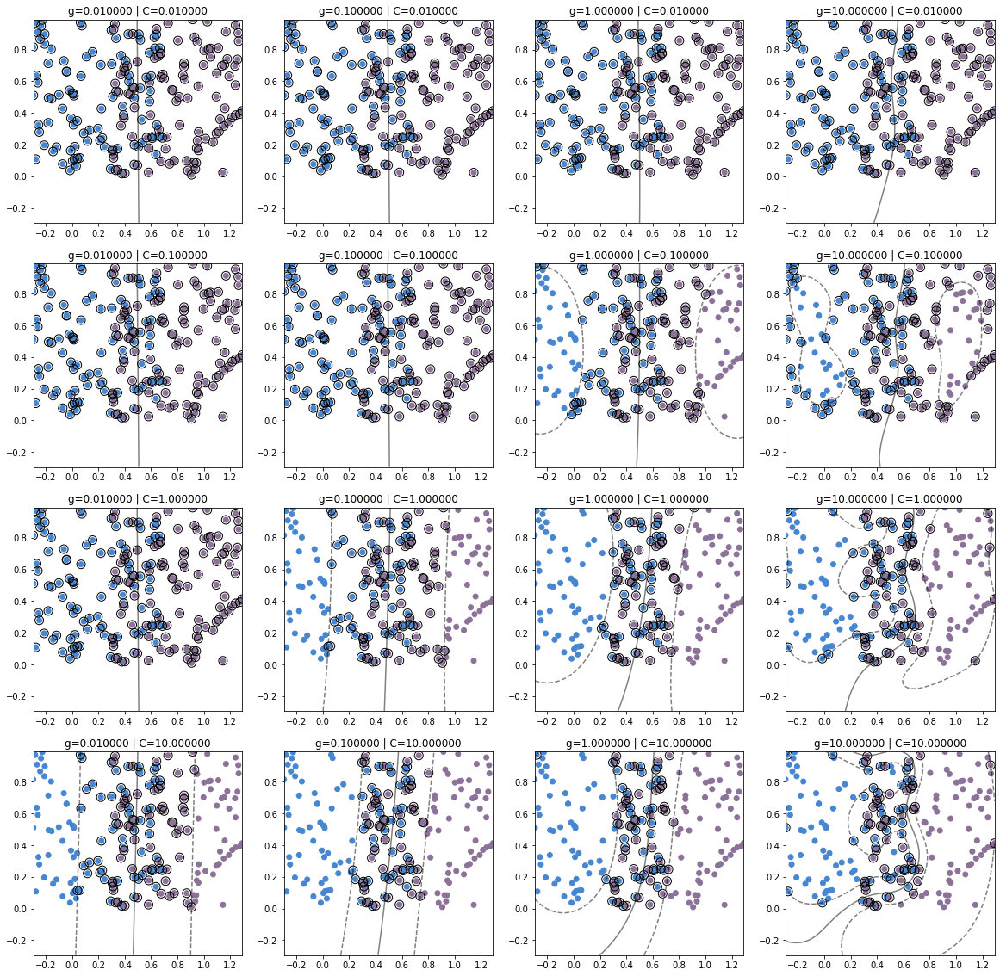

In [10]:

CList=np.logspace(-2,1,4)
gammaList=np.logspace(-2,1,4)
k=0

plt.figure(figsize=(20,20))

for C in CList:
    for gamma in gammaList:
        k=k+1
        svc = svm.SVC(kernel='rbf', C=C, gamma=gamma, probability=True).fit(X,y)
        plt.subplot(len(CList), len(gammaList), k)

        PlotDecisionBoundary(svc, X,y)
    



<img src="ost_logo.png" width="240" height="240" align="right"/>
<div style="text-align: left"> <b> Machine Learning </b> <br> MSE FTP MachLe <br> 
<a href="mailto:christoph.wuersch@ost.ch"> Christoph Würsch </a> </div>

# ML07: A3 Support Vector Machine: Pima Indians
MSE_FTP_MachLe, WÜRC


In [1]:
%matplotlib inline
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns

## Pima-Indian dataset

The data set `pima-indians-diabetes.csv` contains medical indicators collected from 768 patients of the indigenous Pima tribe (Phoenix, AZ). The subjects were between 21 and 81 years old. The following characteristics were recorded:

`NumTimesPrg`: Number of pregnancies
`PlGlcConc`: Blood sugar 2h after oral uptake of sugar (oGTT) (mg/dl)
`BloodP`: Diastolic blood pressure (mm Hg)
`SkinThick`: thickness of the skin fold at the triceps (mm)
`TwoHourSerIns`: Insulin concentration after 2h oGTT ( 𝜇 IU/ mg)
`BMI`:Body Mass Index (kg/m 2 )
`DiPedFunc`: Hereditary predisposition
`Age`: Age (years)
`HasDiabetes` :Diagnosis Diabetes Type II

The classification goal is to make the diagnosis of type II diabetes based on the factors, i.e. to make a prediction model for the variable `y= HasDiabetes` using a support vector machine (SVM) with a radial basis function kernel.

![Pima Indians](women-Pima-shinny-game-field-hockey.jpg)


### Explorative Data Analysis (EDA)

Load the dataset `pima-indians-diabetes.csv` and create a `pandas` data frame from it. We take care that the column captions are imported correctly. 

In [2]:
pima = pd.read_csv('./pima-indians-diabetes.csv', header=None)
pima.columns = ["NumTimesPrg", "PlGlcConc", "BloodP", "SkinThick", "TwoHourSerIns", "BMI", "DiPedFunc", "Age", "HasDiabetes"]

Display the first 5 entries of the dataset.


In [3]:
pima.head(5)

,NumTimesPrg,PlGlcConc,BloodP,SkinThick,TwoHourSerIns,BMI,DiPedFunc,Age,HasDiabetes
0,6,148,72,35,0,33.6,0.627,50,1
1,1,85,66,29,0,26.6,0.351,31,0
2,8,183,64,0,0,23.3,0.672,32,1
3,1,89,66,23,94,28.1,0.167,21,0
4,0,137,40,35,168,43.1,2.288,33,1



It is already noticeable here that the insulin values of some patients have the value '0'. 

### (a) Calculate the percentage of patients with diabetes and display a statistics using `df.describe`
We can calculate the percentage of the patients with diabetes by determining the mean value of the response column 'HasDiabetes'. Using the `dataframe.describe()`, we can print the main statistics of the dataset.

In [4]:
perc_diab = pima['HasDiabetes'].mean()

print('percentage of diabetes: %f ' % np.round(perc_diab*100, 2))

y = pima['HasDiabetes']
X = pima.drop('HasDiabetes', axis=1)

X_names = X.columns

percentage of diabetes: 34.900000 


In [5]:
pima.describe()

,NumTimesPrg,PlGlcConc,BloodP,SkinThick,TwoHourSerIns,BMI,DiPedFunc,Age,HasDiabetes
count,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000
mean,3.845052,120.894531,69.105469,20.536458,79.799479,31.992578,0.471876,33.240885,0.348958
std,3.369578,31.972618,19.355807,15.952218,115.244002,7.884160,0.331329,11.760232,0.476951
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.078000,21.000000,0.000000
25%,1.000000,99.000000,62.000000,0.000000,0.000000,27.300000,0.243750,24.000000,0.000000
50%,3.000000,117.000000,72.000000,23.000000,30.500000,32.000000,0.372500,29.000000,0.000000
75%,6.000000,140.250000,80.000000,32.000000,127.250000,36.600000,0.626250,41.000000,1.000000
max,17.000000,199.000000,122.000000,99.000000,846.000000,67.100000,2.420000,81.000000,1.000000


Some characteristics take the value 0, although this makes no medical sense. These are

- `PlGlcConc`
- `BloodP`
- `SkinThick`
- `TwoHourSerins`
- `BMI`

For example, the insulin value has at least a quarter missing. For these characteristics, we replace the 0 values with `np.nan` and then count again. For all other characteristics we do not know whether there are any other missing values.

### (b) Exlude samples with zero entries or missing values

Replace the 0 values with `np.nan`and print again a statstical description of the dataset using `df.describe()`. Then drop `np.nan` values using `df.dropna()`.

In [6]:
print(X_names.values)

['NumTimesPrg' 'PlGlcConc' 'BloodP' 'SkinThick' 'TwoHourSerIns' 'BMI'
 'DiPedFunc' 'Age']


In [7]:
pima2 = pima.loc[:,X_names.values]
target= pima['HasDiabetes']
pima2.replace(0, np.nan,inplace=True)
pima2['HasDiabetes']=target

pima2.dropna(axis=0,inplace=True)
pima=pima2

In [8]:
pima.describe()

,NumTimesPrg,PlGlcConc,BloodP,SkinThick,TwoHourSerIns,BMI,DiPedFunc,Age,HasDiabetes
count,336.000000,336.000000,336.000000,336.000000,336.000000,336.000000,336.000000,336.000000,336.000000
mean,3.851190,122.279762,70.244048,28.663690,155.348214,32.297321,0.518702,31.836310,0.330357
std,3.148352,30.784649,12.363401,10.249863,118.777281,6.368558,0.327689,10.458446,0.471043
min,1.000000,56.000000,24.000000,7.000000,15.000000,18.200000,0.085000,21.000000,0.000000
25%,1.000000,99.000000,62.000000,21.000000,76.000000,27.800000,0.268000,24.000000,0.000000
50%,3.000000,119.000000,70.000000,28.500000,125.500000,32.750000,0.446500,28.000000,0.000000
75%,6.000000,144.000000,78.000000,36.000000,190.000000,36.250000,0.688250,38.000000,1.000000
max,17.000000,197.000000,110.000000,52.000000,846.000000,57.300000,2.329000,81.000000,1.000000


### (c) Plot a histogram of the of each feature and the the target using `df.hist()`

<Figure size 432x288 with 0 Axes>

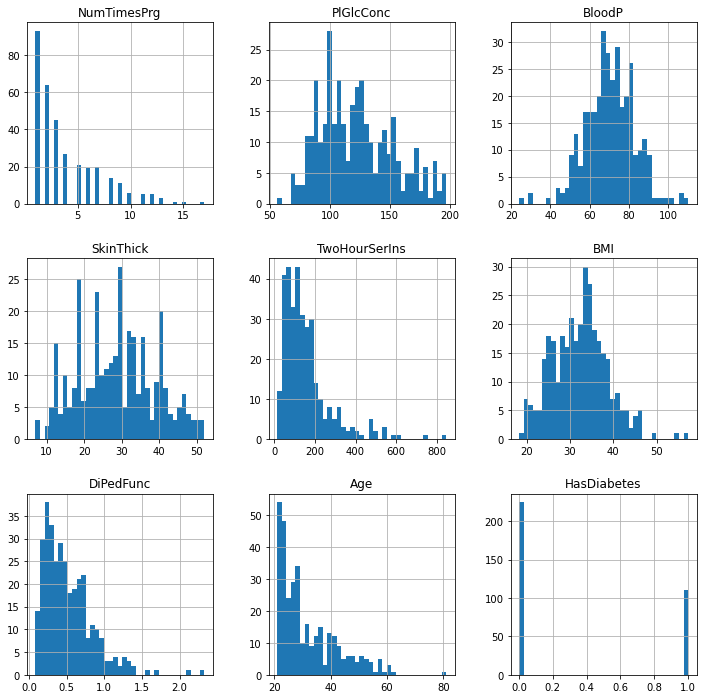

In [9]:
plt.figure()
pima.hist(figsize=(12,12),bins=37)
plt.show()

### (d) Split the data in 80% training and 20% test data

   Use `train_test_split` from `sklearn.model_selection`. If you feed a `pandas.Dataframe` as an input to the method, you will also get `pandas.Dataframes` as output for the training and test features. This is quite practical.

In [10]:
from sklearn.model_selection import train_test_split

Xtr, Xtest, ytrain, ytest = train_test_split(pima.loc[:,X_names.values],pima.HasDiabetes,train_size=0.8)

Xtr.head()

,NumTimesPrg,PlGlcConc,BloodP,SkinThick,TwoHourSerIns,BMI,DiPedFunc,Age
99,1.0,122.0,90.0,51.0,220.0,49.7,0.325,31
159,17.0,163.0,72.0,41.0,114.0,40.9,0.817,47
477,7.0,114.0,76.0,17.0,110.0,23.8,0.466,31
685,2.0,129.0,74.0,26.0,205.0,33.2,0.591,25
341,1.0,95.0,74.0,21.0,73.0,25.9,0.673,36


### (e) Standardize the features using the `StandardScaler` from `sklearn.preprocessing`
Standardize the features using the `StandardScaler` from `sklearn.preprocessing` and display the histograms of the features again.

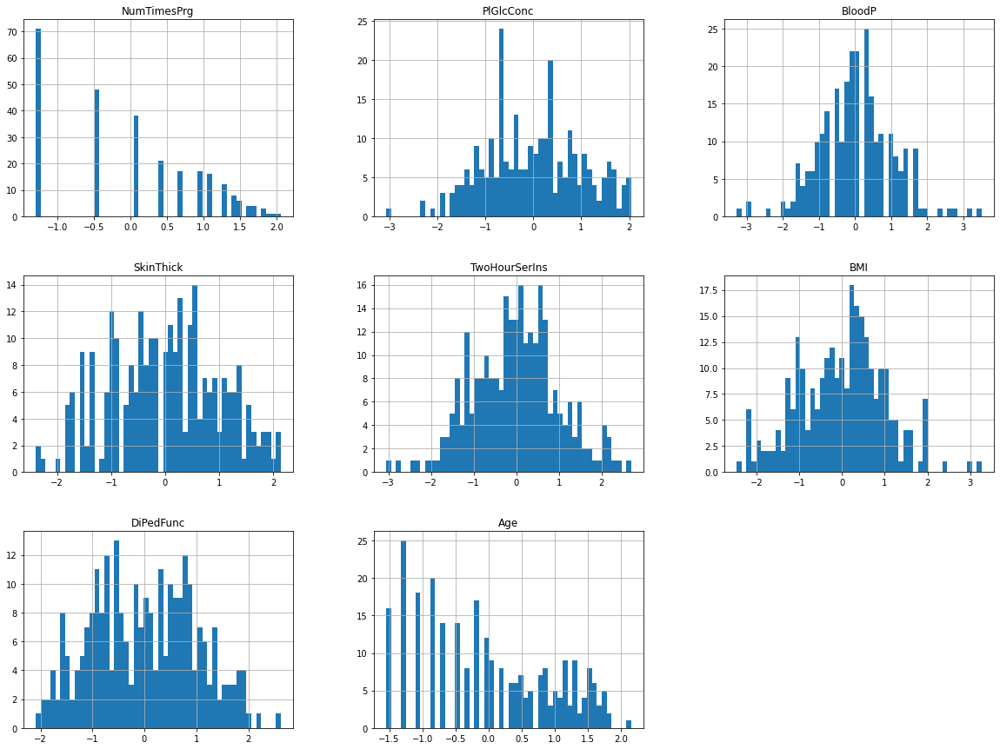

In [11]:
from sklearn.preprocessing import StandardScaler, PowerTransformer

scaler = PowerTransformer()

Xtrain_scale = scaler.fit_transform(Xtr)
Xtest_scale = scaler.transform(Xtest)

Xtrain = pd.DataFrame(Xtrain_scale, columns=X.columns)
Xtrain.hist(bins=50, figsize=(20, 15))
plt.show()

###  (f) Train a support vector machine with a radial basis function kernel and determine the accuracy on the test data.



In [12]:
from sklearn.svm import SVC
from sklearn.model_selection import StratifiedShuffleSplit
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import accuracy_score

model=SVC(kernel='rbf', gamma=1, C=1)
model.fit(Xtrain, ytrain)
ypred=model.predict(Xtest)
print('Accuracy: %f' % accuracy_score(ytest, ypred))



Accuracy: 0.735294


### (g) Perform a cross validated grid search `GridSearchCV` to find the best parameters for $\gamma$ and $C$ and determine the best parameters and score
- vary the value of $C$ in the range in a logarithmic scale from $10^{-3}$ to $10^{+3}$ (7 steps)
- vary the value of $\gamma$ in the range in a logarithmic scale from $10^{-3}$ to $10^{+3}$ (7 steps)
- print a classification report and a confusion matrix of the best classifier using `classification_report` and `confusion_matrix` from `sklearn.metrics`.


In [13]:
C_range = np.logspace(-3, 3, 7)
gamma_range = np.logspace(-3, 3, 7)
param_grid = dict(gamma=gamma_range, C=C_range)

model=SVC()

cv = StratifiedShuffleSplit(n_splits=5, test_size=0.2, random_state=42)
grid = GridSearchCV(model, param_grid=param_grid, cv=cv,n_jobs=-1)
grid.fit(Xtrain, ytrain)

print("The best parameters are %s with a score of %0.2f"
      % (grid.best_params_, grid.best_score_))



The best parameters are {'C': 1000.0, 'gamma': 0.1} with a score of 0.77


In [14]:
from sklearn.metrics import classification_report, confusion_matrix

ypred = grid.best_estimator_.predict(Xtest)
target_names = ['negative', 'positive']
print(classification_report(ytest, ypred, target_names=target_names))
print(confusion_matrix(ytest, ypred))

              precision    recall  f1-score   support

    negative       0.74      1.00      0.85        50
    positive       0.00      0.00      0.00        18

    accuracy                           0.74        68
   macro avg       0.37      0.50      0.42        68
weighted avg       0.54      0.74      0.62        68

[[50  0]
 [18  0]]


C:\Users\christoph.wuersch\.conda\envs\ML\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


### (h) Plot the resulting decision boundary of the SVM classifier for different values of $\gamma$ and $C$ as contour plot in 2D
 
Use the following features as the only features for the prediction such that we can display the decision boundary in a 2D plot. 
- feature 1: `TwoHourSerIns` (x1-axis)
- feature 2: `Age` (x2-axis) 

Vary the C parameters in the following ranges:
- `C_range = [1e-2, 1, 1e2]`
- `gamma_range = [1e-1, 1, 1e1]`

You can use the helper function `PlotDecisionBoundary(model, X2D, y)` to plot the decision boundary and the margins of the classifier. 


In [15]:
print(X_names.values)

Xtrain_2D=Xtrain.loc[:,['TwoHourSerIns','Age']]


['NumTimesPrg' 'PlGlcConc' 'BloodP' 'SkinThick' 'TwoHourSerIns' 'BMI'
 'DiPedFunc' 'Age']


In [28]:
def PlotDecisionBoundary(model, X2D, y):

    gamma=model.gamma
    C=model.C
    x1=X2D.iloc[:,0]
    x2=X2D.iloc[:,1]
        
    # evaluate decision function in a grid
    xx, yy = np.meshgrid(np.linspace(-2, 2, 200), np.linspace(-2, 2, 200))
    
    Z = clf.decision_function(np.c_[xx.ravel(), yy.ravel()])
    Z = Z.reshape(xx.shape)

    # visualize decision function for these parameters
    
    plt.title("gamma=10^%d, C=10^%d" % (np.log10(gamma), np.log10(C)),
            size='medium')

    # visualize parameter's effect on decision function
    plt.pcolormesh(xx, yy, -Z, cmap=plt.cm.RdBu,shading='nearest')
    plt.contour(xx, yy, -Z)
    plt.scatter(x1, x2, c=y, cmap=plt.cm.RdBu_r, edgecolors='k')
    plt.xlim([-2,2])
    plt.ylim([-2,2])


In [29]:
# Now we need to fit a classifier for all parameters in the 2d version
# (we use a smaller set of parameters here because it takes a while to train)

C_range = [1e-2, 1, 1e2]
gamma_range = [1e-1, 1, 1e1]
classifiers = []
for C in C_range:
    for gamma in gamma_range:
        clf = SVC(kernel='poly', degree=2, C=C, gamma=gamma)
        clf.fit(Xtrain_2D, ytrain)
        classifiers.append((C, gamma, clf))

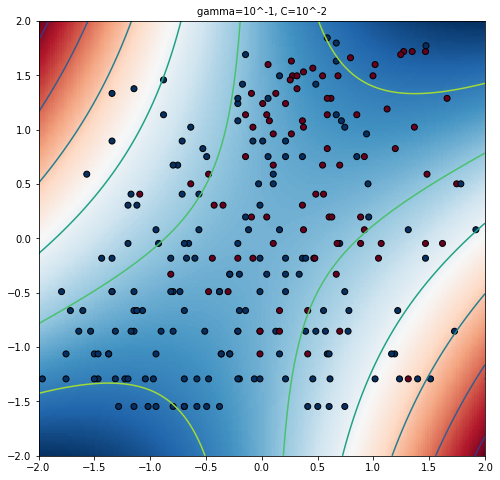

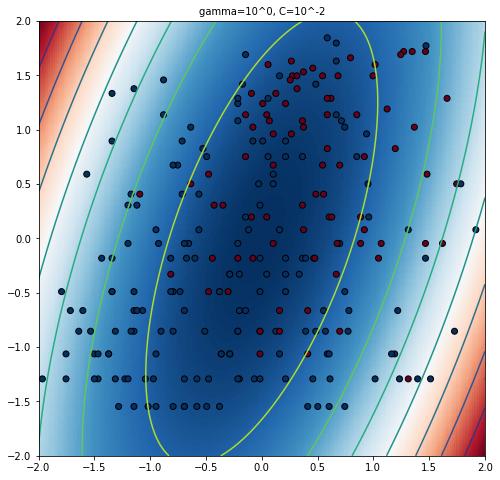

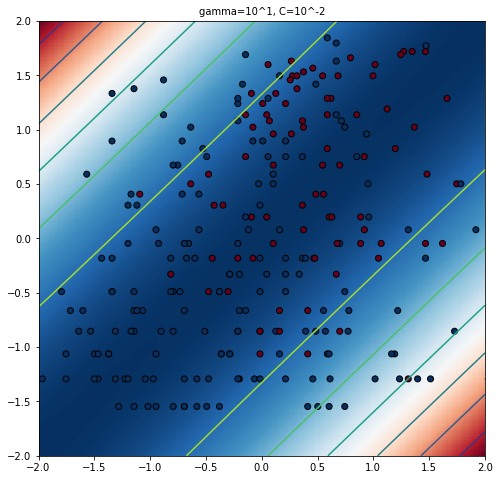

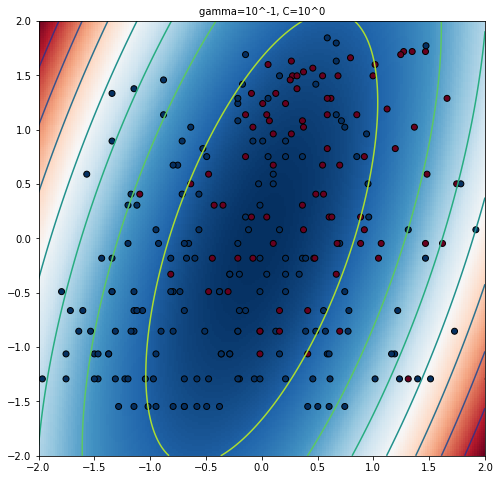

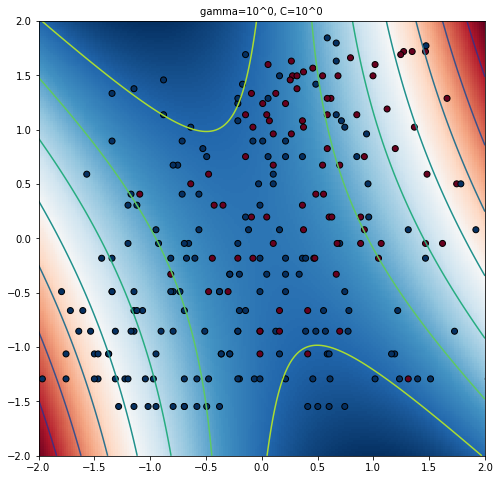

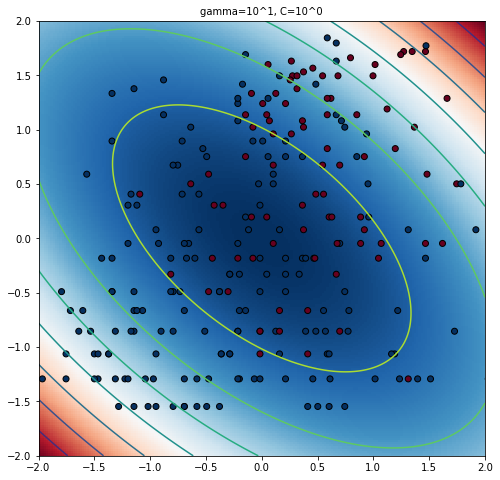

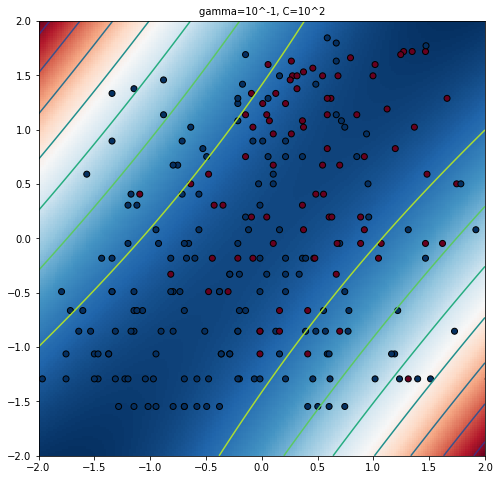

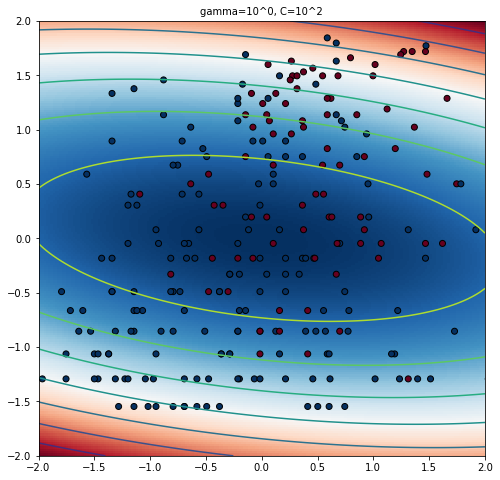

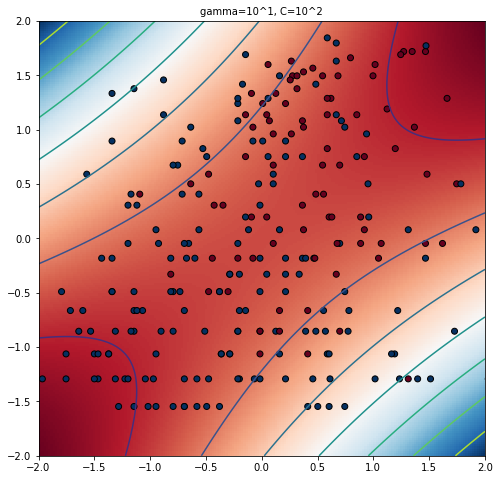

In [30]:
# #############################################################################
# Visualization
#
# draw visualization of parameter effects


for (k, (C, gamma, clf)) in enumerate(classifiers):

    plt.figure(figsize=(8, 8))
    # visualize decision function for these parameters
    # plt.subplot(len(C_range), len(gamma_range), k + 1)
    PlotDecisionBoundary(clf, Xtrain_2D, ytrain)
#plt.savefig('diabetes.pdf')

<img src="ost_logo.png" width="240" height="240" align="right"/>
<div style="text-align: left"> <b> Machine Learning </b> <br> MSE FTP MachLe <br> 
<a href="mailto:christoph.wuersch@ost.ch"> Christoph Würsch </a> </div>

# ML07: A4 SVM with polynomial and linear kernel

MSE, FTP_MachLe, WÜRC


Whenever you have a model that is represented with inner products, you can plug in a kernel function. For instance, a linear kernel is the same as applying linear transformations to feature space. And, in this case, it’s the same as a support vector classifier, because the decision boundary is linear.
- With __polynomial kernels__, you’re projecting the original feature space into a polynomial feature space. So the decision boundary that separates the classes is defined with a higher order polynomial.

In [1]:
import random
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

def generate_random_dataset(size):
    """ Generate a random dataset and that follows a quadratic  distribution
    """
    x = []
    y = []
    target = []
    for i in range(size):
        # class zero
        x.append(np.round(random.uniform(0, 2.5), 1))
        y.append(np.round(random.uniform(0, 20), 1))
        target.append(0)
        # class one
        x.append(np.round(random.uniform(1, 5), 2))
        y.append(np.round(random.uniform(20, 25), 2))
        target.append(1)
        x.append(np.round(random.uniform(3, 5), 2))
        y.append(np.round(random.uniform(5, 25), 2))
        target.append(1)
    df_x = pd.DataFrame(data=x)
    df_y = pd.DataFrame(data=y)
    df_target = pd.DataFrame(data=target)
    data_frame = pd.concat([df_x, df_y], ignore_index=True, axis=1)
    data_frame = pd.concat([data_frame, df_target], ignore_index=True, axis=1)
    data_frame.columns = ['x', 'y', 'target']
    return data_frame



In [2]:
# Generate dataset
size = 100
dataset = generate_random_dataset(size)

X = dataset[['x', 'y']]
y = dataset['target']
dataset.to_csv('dataset.csv')


In [3]:
dataset.head()

,x,y,target
0,0.60,7.50,0
1,4.32,24.32,1
2,3.33,8.55,1
3,1.90,8.90,0
4,3.22,23.99,1


### (a) Split the data in 70% training  and 30% test data
 using `train_test_split` from `sklearn.model_selection`.

In [4]:
from sklearn.model_selection import train_test_split
x_train, x_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

### (b) Plot the training data as scatter plot using different colors for both classes.

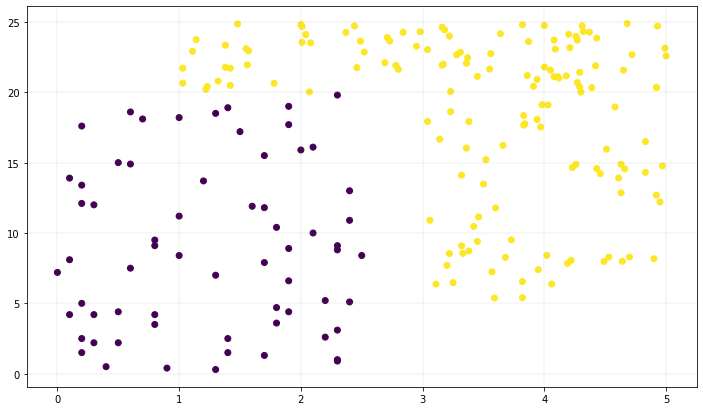

In [5]:
# Plotting the training set
fig, ax = plt.subplots(figsize=(12, 7))
# adding major gridlines
ax.grid(color='grey', linestyle='-', linewidth=0.25, alpha=0.5)

ax.scatter(x_train.x, x_train.y, c=y_train)

plt.show()

### (c) Fit an SVM with a second-degree polynomial kernel using $\gamma=0.1$ and $C=1$

There’s a little space between the two groups of data points. But closer to the center, it’s not clear which data point belongs to which class.
A quadratic curve might be a good candidate to separate these classes. 
__So let’s fit an SVM with a second-degree polynomial kernel.__

In [6]:
from sklearn import svm
model = svm.SVC(kernel='poly', degree=2,C=1,gamma=0.10)
model.fit(x_train, y_train)

SVC(C=1, degree=2, gamma=0.1, kernel='poly')

### (d) Plot the margins and decision boundary of the classifier
- use the function `PlotDecisionBoundary(model,X,y)`
- The input arguments the instance of the trained model, the 2D array of the featues `X` and the 1D array of the target `y`.

In [7]:
# Plot the dataset
def PlotDecisionBoundary(model, X,y):

    #plot decision boundary for model in case of 2D feature space
    x1=X[:,0]
    x2=X[:,1]
    # Create grid to evaluate model
    xx = np.linspace(min(x1), max(x1), len(x1))
    yy = np.linspace(min(x1), max(x2), len(x2))
    YY, XX = np.meshgrid(yy, xx)
    xy = np.vstack([XX.ravel(), YY.ravel()]).T

    train_size = len(x1)

    # Assigning different colors to the classes
    colors = y
    colors = np.where(colors == 1, '#8C7298', '#4786D1')

    # Get the separating hyperplane
    Z = model.decision_function(xy).reshape(XX.shape)

    fig, ax = plt.subplots(figsize=(12, 7))
    ax.scatter(x1, x2, c=colors)

    # Draw the decision boundary and margins
    ax.contour(XX, YY, Z, colors='k', levels=[-1, 0, 1], alpha=0.5, linestyles=['--', '-', '--'])

    # Highlight support vectors with a circle around them
    ax.scatter(model.support_vectors_[:, 0], model.support_vectors_[:, 1], s=100,
               linewidth=1, facecolors='none', edgecolors='k')
    plt.title('g=%f | C=%f' % (model.gamma,model.C))
    #plt.savefig('PolynomialKernel.pdf')
    plt.show()

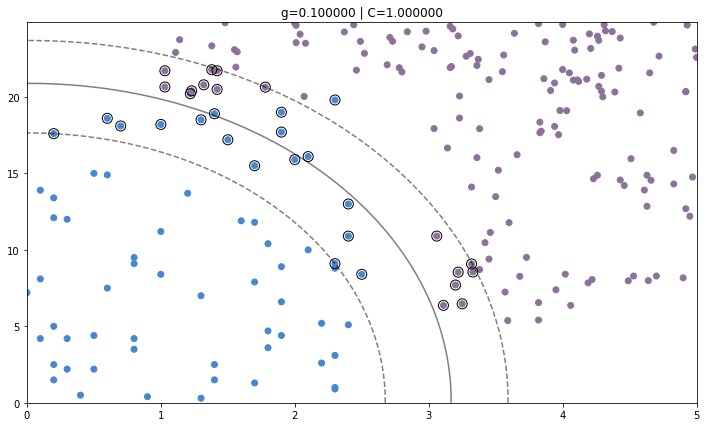

In [8]:
PlotDecisionBoundary(model, x_train.values,y_train)

### (e) Vary the hyperparameter $\gamma$ logarithmically in the range from $10^{-2}$ to $10^{+2}$ in 5 steps. 
 - set $C=1$ and plot for each value of the parameter $\gamma$ the decision boundary and the marigns.

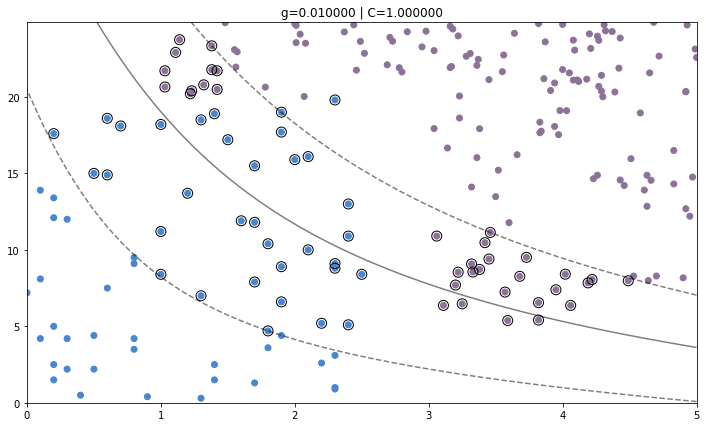

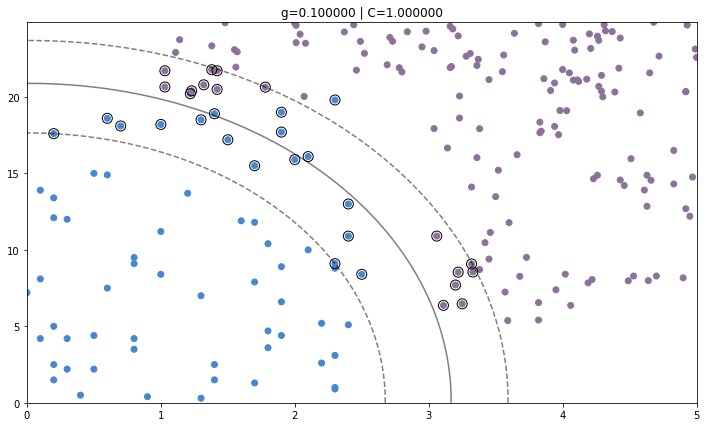

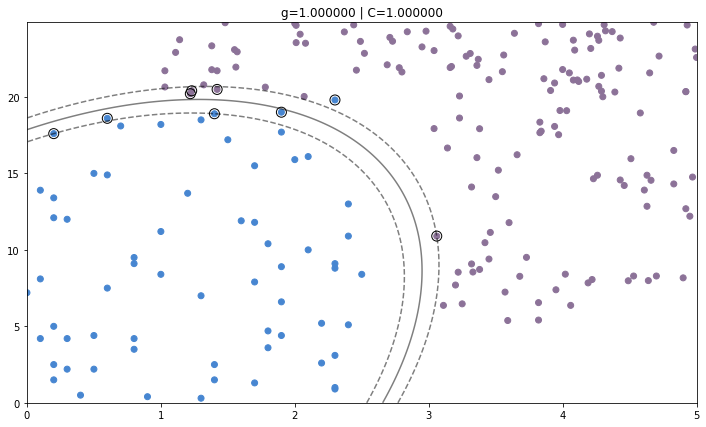

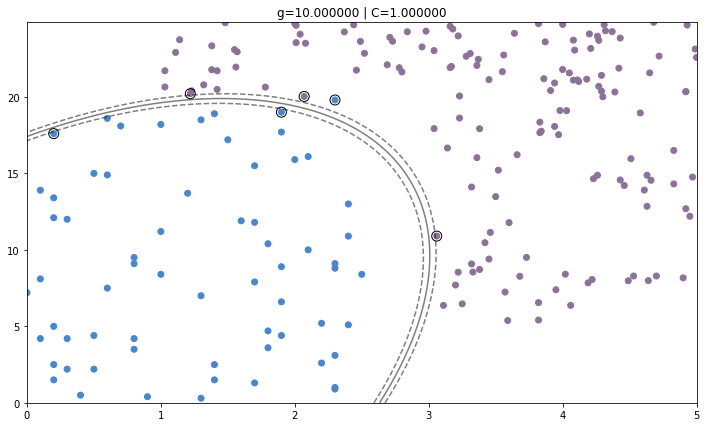

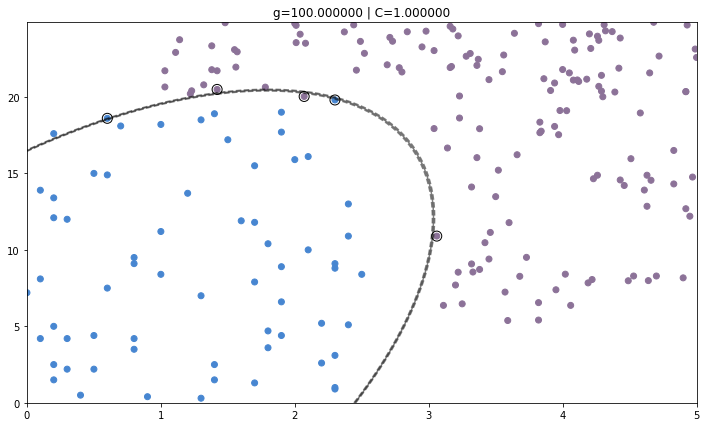

In [9]:
gammaList=np.logspace(-2,2,5)

for gamma in gammaList:
    model = svm.SVC(kernel='poly', degree=2, C=1, gamma=gamma)
    model.fit(x_train, y_train)
    PlotDecisionBoundary(model, x_train.values,y_train)
    

### (f) Vary the hyperparameter $C$ logarithmically in the range from $10^{0}$ to $10^{4}$ in 5 steps. 
 - set $\gamma=0.01$ and plot for each value of the parameter $C$ the decision boundary and the marigns.

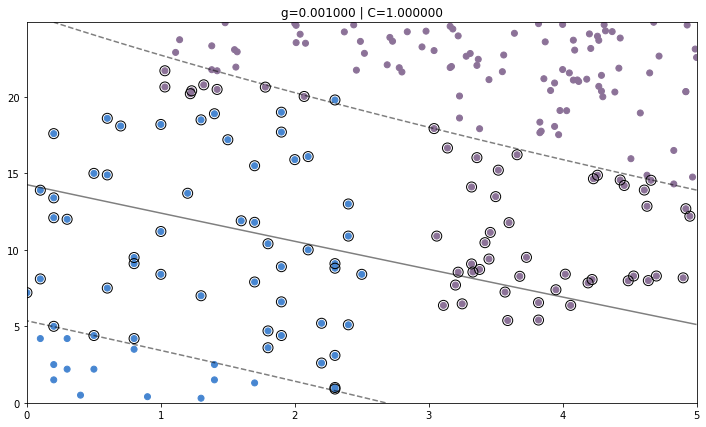

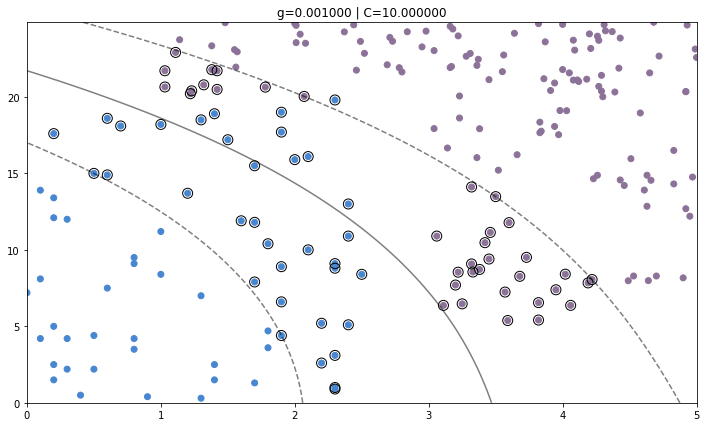

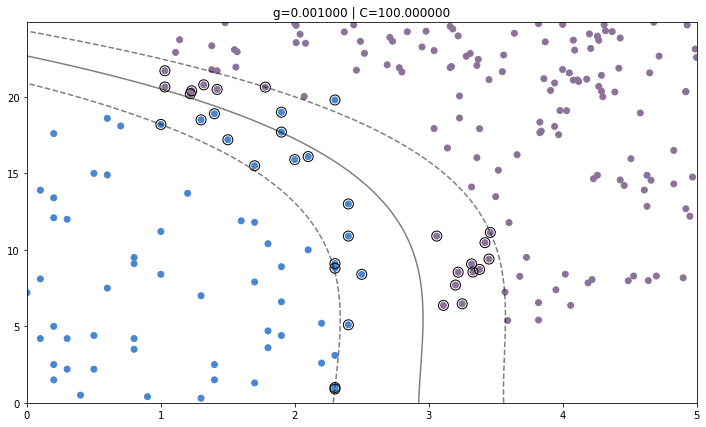

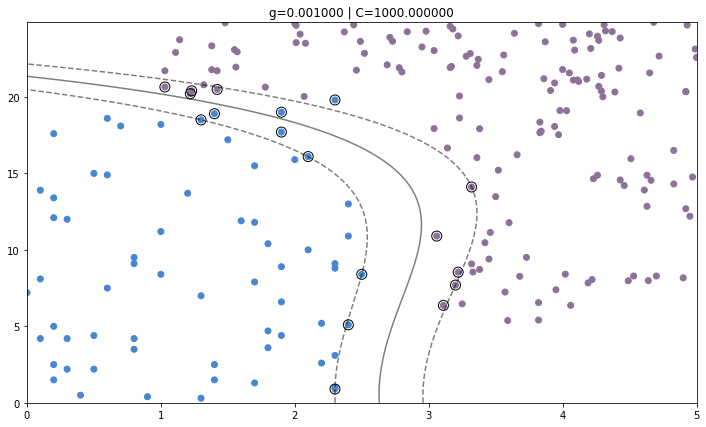

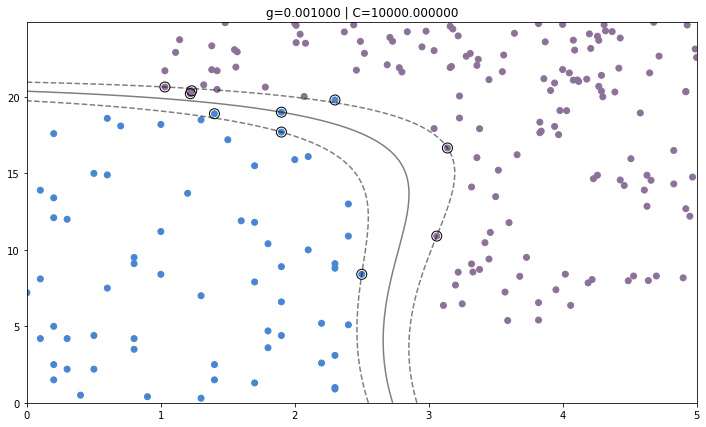

In [10]:
gamma=0.001
CList=np.logspace(0,4,5)

for C in CList:
    model = svm.SVC(kernel='rbf',C=C,gamma=gamma)
    model.fit(x_train, y_train)
    PlotDecisionBoundary(model, x_train.values,y_train)

   # Corona Test: Application of Bayes' rule
   MSE_FTP_MachLe
    

The following probabilities are given:

- the **prior probability** of getting infected: $p(c)=10^{-3}$
- the **conditional probability** of having a positive test result given you are infected (true positive rate): $p(t\vert c)=\frac{9}{10} $
- the **conditional probability** of having a positive test result given you are not infected (false positive): $p(t\vert \bar{c})=\frac{5}{100}$

$$
\begin{aligned}
p(c) &=10^{-3} = 0.1 \% \\
p(t\vert c)&=\frac{9}{10}= 90 \%\\
p(t\vert \bar{c})&=\frac{1}{100} = 1\%
\end{aligned}
$$

What is the probability that you actually are infected, given a positive test result?
We can use Bayes' rule to invert the conditionals:

$$ \begin{align}
p(c\vert t) &=   \frac{p(t\vert c)\cdot p(c)}{p(t)}
=\frac{p(t\vert c)\cdot p(c)}{\sum_{c_i} p(t,c)} \\
&=\frac{p(t\vert c)\cdot p(c)}{\sum_{c_i} p(t\vert c_i )\cdot p(c_i)}
=\frac{p(t\vert c)\cdot p(c)}{p(t\vert c )\cdot p(c)+p(t\vert \bar{c} )\cdot p(\bar{c})}\\
&=\frac{p(t\vert c)\cdot p(c)}{p(t\vert c )\cdot p(c)+p(t\vert \bar{c} )\cdot (1-p(c))}
\end{align} $$

In [5]:
# CORONA: for binary variables, this nomenclature is practical.
p_1c    =1e-3
p_0c    =1-p_1c
p_1t_1c =9/10
p_1t_0c =1/100

p_1c_1t=(p_1t_1c*p_1c)/(p_1t_1c*p_1c+p_1t_0c*(1-p_1c))

print(p_1c_1t)

0.08264462809917356


<img src="ost_logo.png" width="240" height="240" align="right"/>
<div style="text-align: left"> <b> Machine Learning </b> <br> MSE FTP MachLe <br> 
<a href="mailto:christoph.wuersch@ost.ch"> Christoph Würsch </a> </div>

# The Naive Bayes Classifier
MSE FTP_MachLe, Christoph Würsch



Naive Bayes is a conditional probability model: given a problem instance to be classified, represented by a vector ${\displaystyle \mathbf {x} =(x_{1},\ldots ,x_{n})}$ representing some $n$ features (independent variables), it assigns to this instance probabilities

$${\displaystyle p(C_{k}\mid x_{1},\ldots ,x_{n})\,}$$

for each of $K$ possible outcomes or classes ${\displaystyle C_{k}}$ 

The problem with the above formulation is that if the number of features $n$ is large or if a feature can take on a large number of values, then basing such a model on probability tables is infeasible. We therefore reformulate the model to make it more tractable. Using __Bayes' theorem__, the conditional probability can be decomposed as:

$$ {\displaystyle p(C_{k}\mid \mathbf {x} )={\frac {p(C_{k})\ p(\mathbf {x} \mid C_{k})}{p(\mathbf {x} )}}\,} $$

Using Bayesian probability terminology, the above equation can be written as

$${\displaystyle {\text{posterior}}={\frac {{\text{prior}}\cdot {\text{likelihood}}}{\text{evidence}}}\,}$$

In practice, there is interest only in the numerator of that fraction, because the denominator does not depend on $C$ and the values of the features ${\displaystyle x_{i}}$ are given, so that the denominator is effectively constant. The numerator is equivalent to the joint probability model

${\displaystyle p(C_{k},x_{1},\ldots ,x_{n})\,}$ which can be rewritten as follows, using the chain rule for repeated applications of the definition of conditional probability:

$${\displaystyle {\begin{aligned}p(C_{k},x_{1},\ldots ,x_{n})&=p(x_{1},\ldots ,x_{n},C_{k})\\&=p(x_{1}\mid x_{2},\ldots ,x_{n},C_{k})\ p(x_{2},\ldots ,x_{n},C_{k})\\&=p(x_{1}\mid x_{2},\ldots ,x_{n},C_{k})\ p(x_{2}\mid x_{3},\ldots ,x_{n},C_{k})\ p(x_{3},\ldots ,x_{n},C_{k})\\&=\cdots \\&=p(x_{1}\mid x_{2},\ldots ,x_{n},C_{k})\ p(x_{2}\mid x_{3},\ldots ,x_{n},C_{k})\cdots p(x_{n-1}\mid x_{n},C_{k})\ p(x_{n}\mid C_{k})\ p(C_{k})\\\end{aligned}}}$$


__Now the "naive" conditional independence assumptions come into play: assume that all features in ${\displaystyle \mathbf {x} }$ are mutually independent, conditional on the category ${\displaystyle C_{k}}$.__ Under this assumption,

$${\displaystyle p(x_{i}\mid x_{i+1},\ldots ,x_{n},C_{k})=p(x_{i}\mid C_{k})\,}$$
Thus, the joint model can be expressed as

$${\displaystyle {\begin{aligned}p(C_{k}\mid x_{1},\ldots ,x_{n})&\varpropto p(C_{k},x_{1},\ldots ,x_{n})\\&=p(C_{k})\ p(x_{1}\mid C_{k})\ p(x_{2}\mid C_{k})\ p(x_{3}\mid C_{k})\ \cdots \\&=p(C_{k})\prod _{i=1}^{n}p(x_{i}\mid C_{k})\,,\end{aligned}}}$$

where ${\displaystyle \varpropto }$ denotes proportionality.

This means that __under the above independence assumptions__, the conditional distribution over the class variable $C$ is:

$${\displaystyle p(C_{k}\mid x_{1},\ldots ,x_{n})={\frac {1}{Z}}p(C_{k})\prod _{i=1}^{n}p(x_{i}\mid C_{k})}$$

where the evidence 
$${\displaystyle Z=p(\mathbf {x} )=\sum _{k}p(C_{k})\ p(\mathbf {x} \mid C_{k})}$$
is a scaling factor dependent only on ${\displaystyle x_{1},\ldots ,x_{n}}$ that is, a constant if the values of the feature variables are known.

Source: https://en.wikipedia.org/wiki/Naive_Bayes_classifier

## An introductory example: Mrs Marple plays Golf

Let's analyze the probabilty for Mrs Marple to play Golf on a given day. Mrs Marple has recorded her decisions on 14 different days. Depending on the `Temperature`, the `Outlook`, the `Humidity` and `Wind Condition` of the day, we want to predict, whether she is going to play Golf or not.

- $X_1$: `Temperature`
- $X_2$: `Outlook`
- $X_3$: `Humidity`
- $X_4$: `Windy?`


- $ \mathrm{dom}(X_1) = \left \lbrace \text{hot, cold, mild} \right \rbrace$
- $ \mathrm{dom}(X_2) = \left \lbrace \text{sunny, overcast, rain} \right \rbrace$
- $ \mathrm{dom}(X_3) = \left \lbrace \text{normal, high} \right \rbrace$
- $ \mathrm{dom}(X_4) = \left \lbrace \text{True, False} \right \rbrace$


The response $y$ is: `Play Golf?`.


In [4]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

df=pd.read_excel('PlayGolf_NaiveBayes.xls')
df.head(20)

,Temperature,Outlook,Humidity,Windy,Play Golf?
0,hot,sunny,high,False,no
1,hot,sunny,high,True,no
2,hot,overcast,high,False,yes
3,cool,rain,normal,False,yes
4,cool,overcast,normal,True,yes
5,mild,sunny,high,False,no
6,cool,sunny,normal,False,yes
7,mild,rain,normal,False,yes
8,mild,sunny,normal,True,yes
9,mild,overcast,high,True,yes


### 1. Calculation of the Prior

The prior probabilty is the probability to play Golf at all. For this we only have to look at the last column.

$$p(y=\text{yes})=\frac{9}{14}$$
$$p(y=\text{no})=\frac{5}{14}$$


### 2. Calculation of the conditional probabilities $p(X_i \vert y)$

As a next step, we have to calculate all conditional probabilities, i.e. the probability for every feature $X_i$ given $y=\text{yes}$ and $y=\text{no}$. We can use a contingency table (`pandas.cosstab`) to calculate these probabilities.


In [5]:
pd.crosstab(df['Temperature'],df['Play Golf?'],margins=True,normalize=False)

Play Golf?,no,yes,All
Temperature,,,
cool,1,3,4
hot,2,2,4
mild,2,4,6
All,5,9,14


From this table, we can calculate the following:

- $p(X_1=\text{cool} \vert y=\text{yes} ) = \frac{3}{9}$
- $p(X_1=\text{hot } \vert y=\text{yes} )  = \frac{2}{9}$
- $p(X_1=\text{mild} \vert y=\text{yes} ) = \frac{4}{9}$

- $p(X_1=\text{cool} \vert y=\text{no } ) = \frac{1}{5}$
- $p(X_1=\text{hot } \vert y=\text{no } )  = \frac{2}{5}$
- $p(X_1=\text{mild} \vert y=\text{no } ) = \frac{2}{5}$



In [6]:
pd.crosstab(df['Outlook'],df['Play Golf?'],margins=True)

Play Golf?,no,yes,All
Outlook,,,
overcast,0,4,4
rain,2,3,5
sunny,3,2,5
All,5,9,14


From this table, we can calculate the following conditionals:

- $p(X_2=\text{overcast} \vert y=\text{yes} ) = \frac{4}{9}$
- $p(X_2=\text{rain } \vert y=\text{yes} )  = \frac{3}{9}$
- $p(X_2=\text{sunny} \vert y=\text{yes} ) = \frac{2}{9}$

- $p(X_2=\text{overcast} \vert y=\text{no } ) = \frac{0}{5}$
- $p(X_2=\text{rain } \vert y=\text{no } )  = \frac{2}{5}$
- $p(X_2=\text{sunny} \vert y=\text{no } ) = \frac{3}{5}$

In [7]:
pd.crosstab(df['Humidity'],df['Play Golf?'],margins=True)


Play Golf?,no,yes,All
Humidity,,,
high,4,3,7
normal,1,6,7
All,5,9,14


From this table, we can calculate the following conditionals:

- $p(X_3=\text{high  } \vert y=\text{yes} ) = \frac{3}{9}$
- $p(X_3=\text{normal} \vert y=\text{yes} )  = \frac{6}{9}$

- $p(X_3=\text{high  } \vert y=\text{no } ) = \frac{4}{5}$
- $p(X_3=\text{normal} \vert y=\text{no } )  = \frac{1}{5}$


In [8]:
pd.crosstab(df['Windy'],df['Play Golf?'],margins=True)

Play Golf?,no,yes,All
Windy,,,
False,2,6,8
True,3,3,6
All,5,9,14


And finally for the last feature $X_4$, we get

- $p(X_4=\text{False  } \vert y=\text{yes} ) = \frac{6}{9}$
- $p(X_4=\text{True} \vert y=\text{yes} )  = \frac{3}{9}$

- $p(X_4=\text{False  } \vert y=\text{no } ) = \frac{2}{5}$
- $p(X_4=\text{True} \vert y=\text{no } )  = \frac{3}{5}$

### 3. Making predictions

What is now the decision to play Golf under the the following conditions?

$$X= \left\lbrace X_1, X_2, X_3, X_4 \right \rbrace = \left \lbrace \text{hot, sunny, high, True} \right \rbrace$$

It is not necessary, to calculate the evidence $Z=p(X)$, because we can compare the following two nominators:

$$ p(y=\text{yes} \vert X ) \propto p(X_1 \vert y) \cdot p(X_2 \vert y) \cdot p(X_3 \vert y) \cdotp(X_4 \vert y) \cdot p(y)$$
and
$$ p(y=\text{no} \vert X ) \propto p(X_1 \vert \bar{y}) \cdot p(X_2 \vert \bar{y}) \cdot p(X_3 \vert \bar{y}) \cdotp(X_4 \vert y) \cdot p(\bar{y})$$


By looking at our tables, we get for the probability to play Golf $y=\text{yes}$:

$$ p(y=\text{yes} \vert X) = \frac{1}{Z} \cdot p(X_1 \vert y) \cdot p(X_2 \vert y) \cdot p(X_3 \vert y) \cdotp(X_4 \vert y) \cdot p(y) =
\frac{2}{9} \cdot \frac{2}{9} \cdot \frac{3}{9} \cdot \frac{3}{9} \cdot \frac{9}{14} = \frac{2^2}{9^2}\cdot \frac{1}{14 Z}$$

By looking at our tables, we get for the probability __not__ to play Golf: $y=\text{no}$:

$$ p(y=\text{not} \vert X) = \frac{1}{Z} \cdot p(X_1 \vert \bar{y}) \cdot p(X_2 \vert \bar{y}) \cdot p(X_3 \vert \bar{y}) \cdotp(X_4 \vert \bar{y}) \cdot p(\bar{y}) =
\frac{2}{5} \cdot \frac{2}{5} \cdot \frac{4}{5} \cdot \frac{3}{5} \cdot \frac{5}{14} = \frac{2^4}{5^3}\cdot \frac{1}{14 Z}$$

Now, we can compare these two probabilites and calculate the *ratio*:

$$\frac{p(y=\text{yes} \vert X = \left \lbrace \text{hot, sunny, high, True} \right \rbrace)}{p(y=\text{no} \vert X = \left \lbrace \text{hot, sunny, high, True} \right \rbrace)} = \frac{2^2 \cdot 5^3}{9^2 \cdot 2^4} = \frac{125}{4\cdot 81} =\frac{125}{324} < 1$$

### 4. What happens, if one of the counts is zero? 

In this case, the posterior $p(y \vert X)$ is zero as well. To avoid this, __Additive Smoothing (Laplace Smoothing)__ is normally applied to the data. 

$$p_i = \frac{n_i +1 }{n+k}$$

where:
- $n_i$: is the actual count of characteristic $i$ of the feature $X$, $(i=1 \dots k)$ conditioned on $y$
- $k$: is the number of classes (characteristics) in the considered feature $X$ conditioned on $y$
- $n$: is the total number of counts of this feature conditioned on $y$

Interested readers can have a look at: https://en.wikipedia.org/wiki/Additive_smoothing


<img src="ost_logo.png" width="240" height="240" align="right"/>
<div style="text-align: left"> <b> Machine Learning </b> <br> MSE FTP MachLe <br> 
<a href="mailto:christoph.wuersch@ost.ch"> Christoph Würsch </a> </div>

# Bayesian Inference for a Gaussian
## Extended Solution for A10, Series 8
- Author: Christoph Würsch, OST
- MSE FTP_MachLE


Assume a Gaussian likelihood function of the follwing form with known variance $\sigma$.

$$
p(\mathbf{X} \mid \mu) = \prod_{n=1}^{N} p(x_n \mid \mu) = \frac{1}{(2\pi\sigma^2)^{N/2}} 
\exp \left\lbrace -\frac{1}{2\sigma^2} \sum_{n=1}^{N} \left(x_n-\mu \right)^2 \right\rbrace
$$

In this case, the posterior probability distribution will again be a Gaussian distribution $\mathcal{N}$ and has the same form as the prior. The prior is then called a *conjugate* prior to the posterior.

Again we emphasize that the likelihood function $p(\mathbf{X} \mid \mu)$ is not a probability distribution
over $\mu$ and is not normalized. We see that the likelihood function takes the form of the exponential of a quadratic
form in $\mu$. Thus if we choose a prior $p(\mu)$ given by a Gaussian, it will be a *conjugate* distribution for this likelihood function because the corresponding posterior will be a product of two exponentials of quadratic functions of $\mu$ and hence will also be Gaussian $\mathcal{N}$. We therefore take our prior distribution to be

$$
p(\mu) = \mathcal{N} \left(\mu \mid \mu_0, \sigma_0^2 \right)
$$ 

And the posterior distribution is given by:

$$
p(\mu \mid \mathbf{X}) \propto p(\mathbf{X} \mid \mu) \cdot p(\mu)
$$

We consider only the terms in the exponentials and neglect the normalization factor. In this case, we have:

$$
	\exp \left \lbrace -\frac{1}{2 \sigma^2} \sum_{n=1}^{N} (x_n-\mu)^2 \right \rbrace \cdot
	\exp \left \lbrace -\frac{1}{2 \sigma_0^2} (\mu-\mu_0)^2 \right \rbrace
$$

Now, we only look at the quadratic term $Q$. The posterior probability distribution is a function of $\mu$. So we are interested only in the linear and quadratic terms in $\mu$.

\begin{aligned}
Q =& \left \lbrace -\frac{1}{2\sigma^2} \sum_{n=1}^{N} (x_n-\mu)^2  -\frac{1}{2 \sigma_0^2} (\mu-\mu_0)^2 \right \rbrace \\   
  &= \left \lbrace -\frac{1}{2 \sigma^2} \sum_{n=1}^{N} (x_n^2-2 x_n \mu + \mu^2)  
	-\frac{1}{2 \sigma_0^2} (\mu^2-2 \mu \mu_0 +\mu_0^2 ) \right \rbrace \\
 &= \left \lbrace -\frac{1}{2 \sigma^2} \left( \sum_{n=1}^{N} x_n^2 -2 \mu \sum_{n=1}^{N} x_n + N \mu^2 \right)   
	-\frac{1}{2 \sigma_0^2} (\mu^2-2 \mu \mu_0 +\mu_0^2 ) \right \rbrace \\
 &=\left \lbrace -\mu^2 \left( \frac{1}{2\sigma_0^2} + \frac{N}{2\sigma^2} \right) + 2\mu \left( \frac{\sum_{n=1}^{N} x_n}{2\sigma^2} + \frac{\mu_0}{2\sigma_0^2}\right) + \dots \right \rbrace 
 -\frac{1}{2} \left \lbrace \left( \frac{1}{\sigma_0^2} + \frac{N}{\sigma^2} \right)
	\left[ \mu - \frac{\frac{\sum_n x_n}{\sigma^2} + \frac{\mu_0}{\sigma_0^2}}{\frac{1}{\sigma_0^2} + \frac{N}{\sigma^2}} \right]^2+\dots \right \rbrace 
\end{aligned}


The term in front of the square bracket is the inverse variance:
\begin{equation}
	\frac{1}{\sigma_N^2}    =\frac{N}{\sigma^2}+\frac{1}{\sigma_0^2}
\end{equation}
	
The shift term in the quare bracket is the mean $\mu_N$:
	
\begin{aligned}
	\mu_N&=\frac{ \frac{\sum_n x_n}{\sigma^2} + \frac{\mu_0}{\sigma_0^2}} 
	      {\frac{1}{\sigma_0^2} + \frac{N}{\sigma^2}}\\
	&= \frac{\sigma_0^2 \sum_n x_n + \sigma_0^2\mu_0}{\sigma^2+N\sigma_0^2}\\
	&= \frac{\sigma^2}{\sigma^2+N\sigma_0^2} \cdot \mu_0 +
	   \frac{N \sigma_0^2}{\sigma^2+N\sigma_0^2} \cdot \frac{1}{N} \sum_n x_n\\
	&= \frac{\sigma^2}{\sigma^2+N\sigma_0^2} \cdot \mu_0 +
	\frac{N \sigma_0^2}{\sigma^2+N\sigma_0^2} \cdot \mu_{\mathrm{ML}}
\end{aligned}

It is worth spending a moment studying the form of the posterior mean and variance. 
	Using simple manipulation involving completing the square in the exponent, you could show that the
	posterior distribution is given by:

\begin{equation}\label{PosteriorA}
p(\mu \mid \mathbf{X})  = \mathcal{N}\left(\mu \mid \mu_N , \sigma_N^2 \right)
\end{equation}

\begin{equation}\label{VariancePosteriorA}
\frac{1}{\sigma_N^2}    =\frac{N}{\sigma^2}+\frac{1}{\sigma_0^2}
\end{equation}

\begin{equation}\label{MeanPosteriorA}
\mu_N = \frac{\sigma^2}{N\sigma_0^2+\sigma^2}\cdot \mu_0 
+\frac{N \sigma_0^2}{N\sigma_0^2+\sigma^2} \cdot \mu_{\mathrm{ML}}
\end{equation}

in which $\mu_{\mathrm{ML}}$ is the maximum likelihood solution for $\mu$ given by the sample mean

\begin{equation}\label{SampleMeanA}
\mu_{\mathrm{ML}} = \frac{1}{N} \sum_{n=1}^{N} x_n
\end{equation}

## Python example for a Bayesian Update
Let's do a concrete example using Python to demonstrate this. We cose a simple Gaussian prior for $\mu$ with $\mu_0=0$ and $\sigma_0^2=4$.

\begin{equation}
p(\mu) = \mathcal{N} \left(\mu \mid 0, 4 \right)
\end{equation}

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

mu0=0.0
sigma0=1.0

def NormalGauss(x,mu0=mu0,sigma0=sigma0):
    y = 1/np.sqrt(2*np.pi*sigma0)*np.exp(-1/(2*sigma0)*(x-mu0)**2)
    return y

### (i) The prior $p(\mu)$ belief about the mean of the data $x_i$

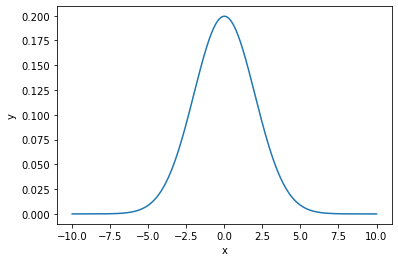

In [2]:
x=np.linspace(-10,10,1000)
prior=NormalGauss(x, mu0=0, sigma0=4)
plt.figure()
plt.plot(x,prior)
plt.set_grid=True
plt.xlabel('x')
plt.ylabel('y')
plt.show()


### (ii) The distribution of the data $x_i$


In our model we assume that the distribution of the data is also a Gaussian distribution. Therefore we can caluclate the likelihood of the data $x_i$ given the model and estimate the maximum likelihood mean $\mu_{\mathrm{ML}}$ and $\sigma_{\mathrm{ML}}^2$.

Now, lets draw $N=30$ samples from another Gaussian distribution that describes the distribution of the samples.
These will be our measurement points $x_i$. We assume that the mean and the variance of the data distribution is given by:
\begin{aligned}
\mu=2 \\
\sigma^2=1
\end{aligned}



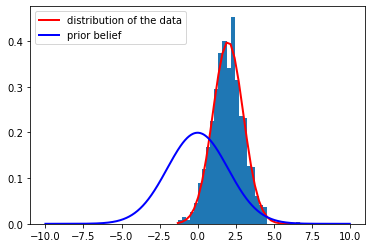

In [3]:
mu, sigma = 2, 1 # mean and standard deviation

#number of samples
N=30

s = np.random.normal(mu, sigma, 1000)

count, bins, ignored = plt.hist(s, N, density=True)
Data=NormalGauss(bins, mu0=mu, sigma0=sigma)

plt.plot(bins, Data ,linewidth=2, color='r',label='distribution of the data')
plt.plot(x,prior,linewidth=2, color='b',label='prior belief')
plt.legend()
plt.show()


We calculate the empirical mean and variance of the data $x_i$.

In [4]:
mu_ML=np.mean(s)
var_ML=np.var(s)

print('mean: ',mu_ML)
print('variance: ',var_ML)


mean:  1.9775767874121195
variance:  1.0319758765876823


### (iii) Calculation of the posterior distribution

According to our calculations, we have for the posterior:

\begin{equation}
p(\mu \mid \mathbf{X})  = \mathcal{N}\left(\mu \mid \mu_N , \sigma_N^2 \right)
\end{equation}

\begin{equation}
\frac{1}{\sigma_N^2}    =\frac{N}{\sigma^2}+\frac{1}{\sigma_0^2}
\end{equation}

\begin{equation}
\mu_N = \frac{\sigma^2}{N\sigma_0^2+\sigma^2}\cdot \mu_0 
+\frac{N \sigma_0^2}{N\sigma_0^2+\sigma^2} \cdot \mu_{\mathrm{ML}}
\end{equation}

in which $\mu_{\mathrm{ML}}$ is the maximum likelihood solution for $\mu$ given by the sample mean

\begin{equation}
\mu_{\mathrm{ML}} = \frac{1}{N} \sum_{n=1}^{N} x_n
\end{equation}

In [5]:
sigma_N=1/(N/var_ML+1/sigma0)
print('sigma_N^2:', sigma_N)

mu_N=sigma/(N*sigma0+sigma)*mu0+N*sigma0/(N*sigma0+sigma)*mu_ML
print('mu_N:', mu_N)

sigma_N^2: 0.03325524229239507
mu_N: 1.9137839878181802


First of all, we note that the __mean of the posterior distribution $\mu_N$__ given by the equation above is a compromise
between the prior mean $\mu_0$ and the maximum likelihood solution $\mu_{\mathrm{ML}}$. If the number of
observed data points $N = 0$, then this equation reduces to the prior mean as expected. For $N \rightarrow \infty$,
the posterior mean is given by the maximum likelihood solution.

Similarly, consider the result  for the __variance of the posterior distribution__.
We see that this is most naturally expressed in terms of the inverse variance,
which is called the precision. Furthermore, the precisions are additive, so that the precision
of the posterior is given by the precision of the prior plus one contribution of the data
precision from each of the observed data points. As we increase the number of observed
data points, the precision steadily increases, corresponding to a posterior distribution with
steadily decreasing variance. With no observed data points, we have the prior variance,
whereas if the number of data points $N \rightarrow \infty$, the variance $\sigma_N^2$ goes to zero and the
posterior distribution becomes infinitely peaked around the maximum likelihood solution.

We therefore see that the maximum likelihood result of a point estimate for $\mu$ given by
$\mu_{\mathrm{ML}}$ is recovered precisely from the Bayesian formalism in the limit of an infinite number of
observations. Note also that for finite $N$, if we take the limit  $\sigma_0^2 \rightarrow \infty$ which the prior has
infinite variance then the posterior mean $\mu$ reduces to the maximum likelihood result, while the posterior variance is given by $\sigma_N^2=\frac{\sigma^2}{N}$. 




Now lets change the number of *measurement points* $N$ contiunously and draw the different distributions:

sigma_N^2: 0.5078681732780657
mu_N: 0.9887883937060598


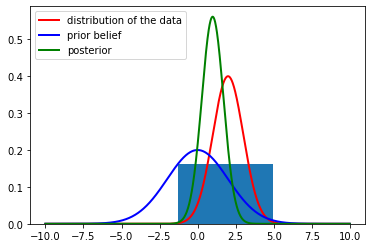

sigma_N^2: 0.3403641448985118
mu_N: 1.318384524941413


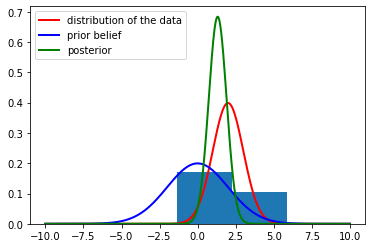

sigma_N^2: 0.20508362955179602
mu_N: 1.5820614299296958


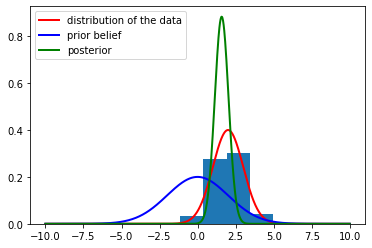

sigma_N^2: 0.114258041727362
mu_N: 1.7578460332552173


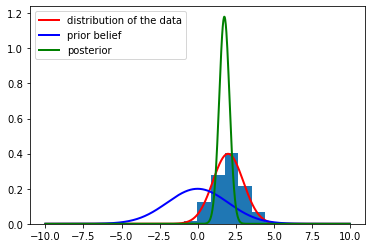

sigma_N^2: 0.0791879824180504
mu_N: 1.8254554960727258


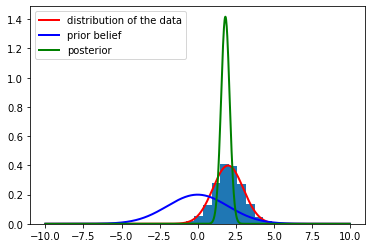

sigma_N^2: 0.06059049660857295
mu_N: 1.8612487410937595


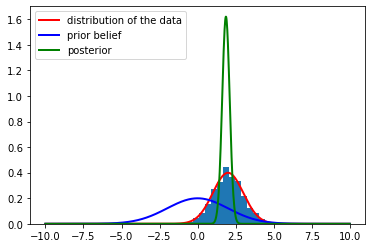

sigma_N^2: 0.04906699601802294
mu_N: 1.8834064642020185


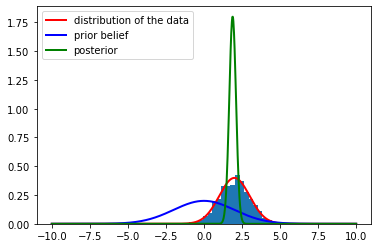

sigma_N^2: 0.012735415438460854
mu_N: 1.9531622591724636


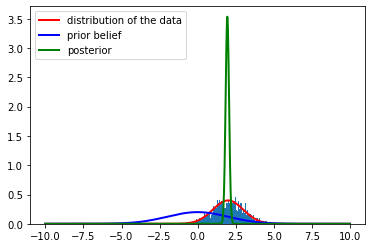

In [6]:
#number of samples
NList=[1,2,4,8,12,16,20,80]
x=np.linspace(-10,10,1000)

for N in NList:

    s = np.random.normal(mu, sigma, 1000)

    count, bins, ignored = plt.hist(s, N, density=True)
    Data=NormalGauss(x, mu0=mu, sigma0=sigma)
    sigma_N=1/(N/var_ML+1/sigma0)
    print('sigma_N^2:', sigma_N)

    mu_N=sigma/(N*sigma0+sigma)*mu0+N*sigma0/(N*sigma0+sigma)*mu_ML
    print('mu_N:', mu_N)
    
    plt.plot(x, Data ,linewidth=2, color='r',label='distribution of the data')
    plt.plot(x,prior,linewidth=2, color='b',label='prior belief')

    Posterior=NormalGauss(x, mu0=mu_N, sigma0=sigma_N)
    plt.plot(x,Posterior,linewidth=2, color='g',label='posterior')
    plt.legend()
    plt.show()
    
    

__What we observe is, that the posterior distribution gets more and more peaked around the data distribution and the estimate of the true mean $\mu_N$ gets very narrowly centered around the data mean. The more data we have, the less important our intial estimate about the prior distribution becomes.__


<img src="ost_logo.png" width="240" height="240" align="right"/>
<div style="text-align: left"> <b> Machine Learning </b> <br> MSE FTP MachLe <br> 
<a href="mailto:christoph.wuersch@ost.ch"> Christoph Würsch </a> </div>

## Inspector Clouseau: Extended Solution

- Author: Christoph Würsch
- Subject: MSE TSM_MachLe
- Bayesian Theorem, Probabilistic Thinking

Lets first import pandas and define the quantities that are given by the excercise.

The nomenclature is as follows:

conditional probabilities:
- $p(y \vert x) =$ `p1y_1x`
- $p(y \vert \bar{x}) =$ `p1y_0x`
- $p(\bar{y} \vert x) =$ `p0y_1x`
- $p(\bar{y} \vert \bar{x}) =$ `p0y_0x`



In [1]:
import pandas as pd

# prior probabilities
p1B = 0.6
p0B = 1-p1B
p1M = 0.2
p0M = 1-p1M

### conditional probabilities

$$p(K \vert B,M) = 0.1$$
$$p(K \vert B,\bar{M}) = 0.6$$
$$p(K \vert \bar{B},M) = 0.2$$
$$p(K \vert \bar{B},\bar{M}) = 0.3$$

In [2]:
#conditional probabilities for the knife 1K means K=True
p1K_1B1M=0.1
p1K_1B0M=0.6
p1K_0B1M=0.2
p1K_0B0M=0.3

#conditional probabilities for not the knife 0K means K=False
p0K_1B1M=1-p1K_1B1M
p0K_1B0M=1-p1K_1B0M
p0K_0B1M=1-p1K_0B1M
p0K_0B0M=1-p1K_0B0M

Using __Bayes Theroem__ we can invert the conditonal probabilities.

$$ p(B\vert K)= \frac{p(K \vert B) \cdot p(B)}{p(K)}$$ 

To calculate the prior $p(K)$, we even have to marginalize over the states $b \in \mathrm{dom}(B)$ of the butler B.

$$ p(B\vert K)= \frac{p(K \vert B) \cdot p(B)}{p(K)} = \frac{p(K \vert B) \cdot p(B)}{\sum_{b \in \mathrm{dom}(B)} p(K \vert B) \cdot p(B)}  $$ 

Since the conditionals also depend on the state of the Maid M, we have to marginalize over the states  $m \in \mathrm{dom}(M)$ of the Maid M. If we know the full joint probability density $p(k,b,m)$ for all states of $K,B$ and $M$, we could just marignalize over the joint probability distribution:

$$p(K)=\sum_{b \in \mathrm{dom}(B)} \left \lbrace \sum_{m \in \mathrm{dom}(M)} p(K,b,m)  \right \rbrace$$



But now that we are only given the *conditional probabilites*, we have to use __Bayes' therorem__ to calculate the joint probability distribution:

$$ p(k,b,m)=p(k \vert b,m) \cdot p(b) \cdot p(m) $$

So we have to sum up over the conditional multiplied by the priors $p(b)$ and $p(m)$:

$$p(K)=\sum_{b \in \mathrm{dom}(B)} \left \lbrace \sum_{m \in \mathrm{dom}(M)} p(K \vert b,m)\cdot p(m)  \right \rbrace \cdot p(b)$$

Using this, we get:


$$p(B \vert K) = \frac{\left \lbrace \sum_{m \in \mathrm{dom}(M)} p(K \vert B,m)\cdot p(m)  \right \rbrace \cdot p(B) }{\sum_{b \in \mathrm{dom}(B)} \left \lbrace \sum_{m \in \mathrm{dom}(M)} p(K \vert b,m)\cdot p(m)  \right \rbrace \cdot p(b)}$$
    

In [3]:
# (a) calculate the probability that the butler ist the murderer
# given the fact that a knife was found as the corpus delicti
# p(B | K)

num=p1B*(p1K_1B1M*p1M+p1K_1B0M*p0M)
p1K=p1B*(p1K_1B1M*p1M+p1K_1B0M*p0M)+p0B*(p1K_0B1M*p1M+p1K_0B0M*p0M)
p0K=p1B*(p0K_1B1M*p1M+p0K_1B0M*p0M)+p0B*(p0K_0B1M*p1M+p0K_0B0M*p0M)

p1B_1K=num/p1K

print('The marginal for K=1 is p(K=1): ', p1K)
print('The marginal for K=0 is p(K=0): ', p0K)
print('test: p(K=0)+p(K=1): ', p0K+p1K)

print('p(M | K):', p1B_1K)

The marginal for K=1 is p(K=1):  0.41200000000000003
The marginal for K=0 is p(K=0):  0.5880000000000001
test: p(K=0)+p(K=1):  1.0
p(M | K): 0.7281553398058251


In [4]:
# calculation of the joint probability distribution
p1K1B1M=p1K_1B1M*p1B*p1M
p1K1B0M=p1K_1B0M*p1B*p0M
p1K0B1M=p1K_0B1M*p0B*p1M
p1K0B0M=p1K_0B0M*p0B*p0M

p0K1B1M=p0K_1B1M*p1B*p1M
p0K1B0M=p0K_1B0M*p1B*p0M
p0K0B1M=p0K_0B1M*p0B*p1M
p0K0B0M=p0K_0B0M*p0B*p0M


In [5]:

p= [p1K1B1M, p1K1B0M, p1K0B1M, p1K0B0M, p0K1B1M, p0K1B0M, p0K0B1M, p0K0B0M]
#create a dictionary and later a dataframe
d={'K': [1,1,1,1,0,0,0,0], 'B': [1,1,0,0,1,1,0,0], 'M': [1,0,1,0,1,0,1,0], 'p(K,B,M)':p}


df=pd.DataFrame(data=d)

df.head(8)

,K,B,M,"p(K,B,M)"
0,1,1,1,0.012
1,1,1,0,0.288
2,1,0,1,0.016
3,1,0,0,0.096
4,0,1,1,0.108
5,0,1,0,0.192
6,0,0,1,0.064
7,0,0,0,0.224


Let's test whether we did all calculations right: The probabilities must sum up to one.

In [6]:
df.iloc[:,3].sum()

1.0

Now, we can easily calculate the marginals:

Marginal for the __Knife=True__:
    $$p(K=\mathrm{True})=\sum_{b \in \mathrm{dom}(B)} \left \lbrace \sum_{m \in \mathrm{dom}(M)} p(K=\mathrm{True}, b,m)  \right \rbrace$$

In [7]:
#marginal for the Knife K
print('p(K=True)=',df[df['K']==1].iloc[:,3].sum())
print('p(K=False)=',df[df['K']==0].iloc[:,3].sum())

p(K=True)= 0.41200000000000003
p(K=False)= 0.5880000000000001


Marginal for the __Butler=True__:
    $$p(B=\mathrm{True})=\sum_{k \in \mathrm{dom}(K)} \left \lbrace \sum_{m \in \mathrm{dom}(M)} p(k, B=\mathrm{True}, m) \right \rbrace$$

In [8]:
#marginal for the Butler B
print('p(B=True)=',df[df['B']==1].iloc[:,3].sum())
print('p(B=False)=',df[df['B']==0].iloc[:,3].sum())

p(B=True)= 0.6000000000000001
p(B=False)= 0.4


Marginal for the __Maid=True__:
    $$p(M=\mathrm{True})=\sum_{k \in \mathrm{dom}(K)} \left \lbrace \sum_{b \in \mathrm{dom}(B)} p(k, b, M=\mathrm{True}) \right \rbrace$$

In [9]:
#marginal for the MAid M
print('p(M=True)=',df[df['M']==1].iloc[:,3].sum())
print('p(M=False)=',df[df['M']==0].iloc[:,3].sum())

p(M=True)= 0.2
p(M=False)= 0.8


<img src="ost_logo.png" width="240" height="240" align="right"/>
<div style="text-align: left"> <b> Machine Learning </b> <br> MSE FTP MachLe <br> 
<a href="mailto:christoph.wuersch@ost.ch"> Christoph Würsch </a> </div>

# Bayesian Regression using `pymc3`
- Author: Christoph Würsch
- Subject: FTP_MachLe (MSE)

## Motivation from Cam Davidson Pilon

"The __Bayesian method__ is the *natural approach to inference*, yet it is hidden from readers behind chapters of slow, mathematical analysis. The typical text on Bayesian inference involves two to three chapters on probability theory, then enters what Bayesian inference is. Unfortunately, due to mathematical intractability of most Bayesian models, the reader is only shown simple, artificial examples. [...]

If Bayesian inference is the destination, then mathematical analysis is a particular path towards it. On the other hand, computing power is cheap enough that we can afford to take an alternate route via probabilistic programming. 

The latter path is much more useful, as it denies the necessity of mathematical intervention at each step, that is, we remove often-intractable mathematical analysis as a prerequisite to Bayesian inference. Simply put, this latter computational path proceeds via small intermediate jumps from beginning to end, where as the first path proceeds by enormous leaps, often landing far away from our target. Furthermore, without a strong mathematical background, the analysis required by the first path cannot even take place."


__References:__

https://docs.pymc.io/
https://github.com/CamDavidsonPilon/Probabilistic-Programming-and-Bayesian-Methods-for-Hackers
https://camdavidsonpilon.github.io/Probabilistic-Programming-and-Bayesian-Methods-for-Hackers/
https://github.com/CamDavidsonPilon/Probabilistic-Programming-and-Bayesian-Methods-for-Hackers/zipball/master



In [1]:
from pymc3 import *

import numpy as np
import matplotlib.pyplot as plt


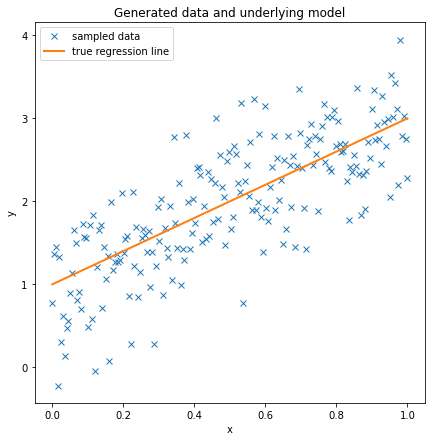

In [2]:
size = 200
true_intercept = 1
true_slope = 2

x = np.linspace(0, 1, size)
# y = a + b*x
true_regression_line = true_intercept + true_slope * x
# add noise
y = true_regression_line + np.random.normal(scale=.5, size=size)

data = dict(x=x, y=y)

fig = plt.figure(figsize=(7, 7))
ax = fig.add_subplot(111, xlabel='x', ylabel='y', title='Generated data and underlying model')
ax.plot(x, y, 'x', label='sampled data')
ax.plot(x, true_regression_line, label='true regression line', lw=2.)
plt.legend(loc=0);
plt.savefig('LinearRegressionData_pymc3.pdf')

__Hamiltonian Monte Carlo (HMC)__ is a Markov chain Monte Carlo (MCMC) algorithm that avoids the random walk behavior and sensitivity to correlated parameters that plague many MCMC methods *by taking a series of steps informed by first-order gradient information*. These features allow it to converge to high-dimensional target distributions much more quickly than simpler methods such as __random walk, Metropolis or Gibbs sampling__.

The __No-U-Turn Sampler (NUTS)__ is an extension to HMC that eliminates the need to set a number of steps L. NUTS uses a recursive algorithm to build a set of likely candidate points that spans a wide swath of the target distribution, stopping automatically when it starts to double back and retrace its steps. Empirically, NUTS performs at least as efficiently as and sometimes more efficiently than a well tuned standard HMC method, without requiring user intervention or costly tuning runs. 

__The No-U-Turn Sampler: Adaptively Setting Path Lengths in Hamiltonian Monte Carlo__
*Matthew D. Hoffman, Andrew Gelman*
https://arxiv.org/abs/1111.4246

In [3]:
#%% Bayesian regression

with Model() as model: # model specifications in PyMC3 are wrapped in a with-statement
    #tau = precision = 1/variance = 1/sigma^2 
    # Define priors
    sigma     = HalfCauchy('sigma', beta=10, testval=1.)
    intercept = Normal('Intercept', 0, tau=1/20**2)
    x_coeff   = Normal('x', 0, tau=1/20**2)

    # Define likelihood
    likelihood = Normal('y', mu=intercept + x_coeff * x,
                        tau=1/sigma**2, observed=y)
    # Inference!
    trace = sample(6000, cores=2) # draw 3000 posterior samples using NUTS sampling
    
    


Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (2 chains in 2 jobs)
NUTS: [x, Intercept, sigma]
Sampling 2 chains, 0 divergences: 100%|█████████████████████████████████████| 13000/13000 [00:05<00:00, 2282.68draws/s]


C:\Users\christoph.wuersch\.conda\envs\ML\lib\site-packages\arviz\plots\backends\matplotlib\distplot.py:38: UserWarning: Argument backend_kwargs has not effect in matplotlib.plot_distSupplied value won't be used
  "Argument backend_kwargs has not effect in matplotlib.plot_dist"
C:\Users\christoph.wuersch\.conda\envs\ML\lib\site-packages\arviz\plots\backends\matplotlib\distplot.py:38: UserWarning: Argument backend_kwargs has not effect in matplotlib.plot_distSupplied value won't be used
  "Argument backend_kwargs has not effect in matplotlib.plot_dist"
C:\Users\christoph.wuersch\.conda\envs\ML\lib\site-packages\arviz\plots\backends\matplotlib\distplot.py:38: UserWarning: Argument backend_kwargs has not effect in matplotlib.plot_distSupplied value won't be used
  "Argument backend_kwargs has not effect in matplotlib.plot_dist"
C:\Users\christoph.wuersch\.conda\envs\ML\lib\site-packages\arviz\plots\backends\matplotlib\distplot.py:38: UserWarning: Argument backend_kwargs has not effect in 

<Figure size 504x504 with 0 Axes>

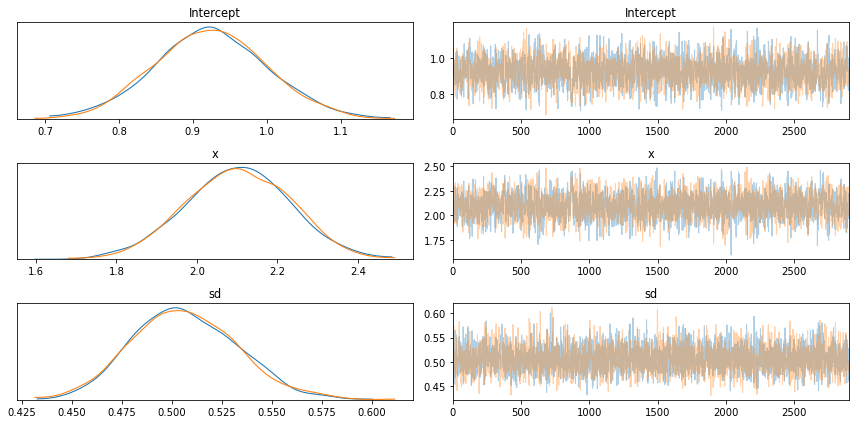

In [10]:
plt.figure(figsize=(7, 7))
traceplot(trace[100:])
plt.tight_layout();
plt.savefig('pymc3_posterior.pdf')

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (2 chains in 2 jobs)
NUTS: [sd, x, Intercept]
Sampling 2 chains, 0 divergences: 100%|███████████████████████████████████████| 7000/7000 [00:03<00:00, 1907.20draws/s]
The acceptance probability does not match the target. It is 0.894041977851728, but should be close to 0.8. Try to increase the number of tuning steps.
C:\Users\christoph.wuersch\.conda\envs\ML\lib\site-packages\arviz\plots\backends\matplotlib\distplot.py:38: UserWarning: Argument backend_kwargs has not effect in matplotlib.plot_distSupplied value won't be used
  "Argument backend_kwargs has not effect in matplotlib.plot_dist"
C:\Users\christoph.wuersch\.conda\envs\ML\lib\site-packages\arviz\plots\backends\matplotlib\distplot.py:38: UserWarning: Argument backend_kwargs has not effect in matplotlib.plot_distSupplied value won't be used
  "Argument backend_kwargs has not effect in matplotlib.plot_dist"
C:\Users\christoph.wuersch\

<Figure size 504x504 with 0 Axes>

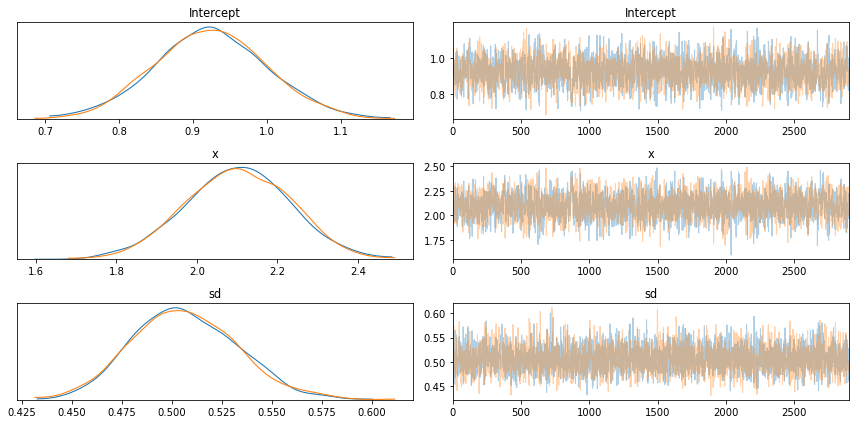

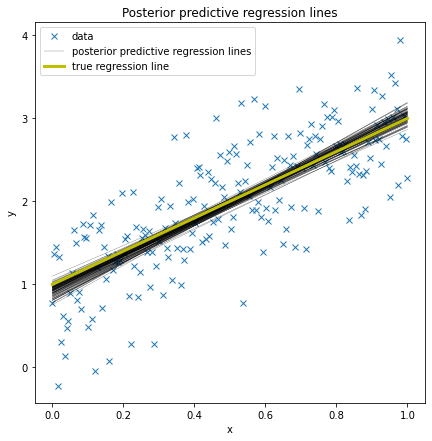

In [5]:

#%% glm     
#    The new glm() function instead takes a Patsy linear model specifier from 
#    which it creates a design matrix. glm() then adds random variables for 
#    each of the coefficients and an appopriate likelihood to the model.
    
    
with Model() as model:
    # specify glm and pass in data. The resulting linear model, its likelihood and
    # and all its parameters are automatically added to our model.
    glm.GLM.from_formula('y ~ x', data)
    trace = sample(3000, cores=2) # draw 3000 posterior samples using NUTS sampling


#%% glm
    
    
plt.figure(figsize=(7, 7))
traceplot(trace[100:])
plt.tight_layout();

plt.figure(figsize=(7, 7))
plt.plot(x, y, 'x', label='data')
plot_posterior_predictive_glm(trace, samples=100,
                              label='posterior predictive regression lines')
plt.plot(x, true_regression_line, label='true regression line', lw=3., c='y')

plt.title('Posterior predictive regression lines')
plt.legend(loc=0)
plt.xlabel('x')
plt.ylabel('y');




<img src="ost_logo.png" width="240" height="240" align="right"/>
<div style="text-align: left"> <b> Machine Learning </b> <br> MSE FTP MachLe <br> 
<a href="mailto:christoph.wuersch@ost.ch"> Christoph Würsch </a> </div>

# Brownian Motion
MSE FTP_MachLe HS2020

Christoph Würsch, Institute for Computational Engineering, ICE, OST



**In probability theory and related fields, a stochastic or random process is a mathematical object usually defined as a family of random variables. Many stochastic processes can be represented by time series.**

A stochastic process (also called random process) is the mathematical description of temporally ordered, random processes. The theory of stochastic processes represents a significant extension of probability theory and forms the basis for stochastic analysis. 


###  Time series and discrete stochastic processes [1]

Let $T$ be a set of equidistant time points $T = \left\lbrace t_1, t_2, \dots \right\rbrace$.

1. A **discrete stoachstic process** is a set of random variables $\lbrace X_1, X_2, \dots \rbrace$. Each
single random variable $X_i$ has a univariate distribution function $F_i$ and can be observed at time $t_i$.
2. A **time series** $\lbrace x_1, x_2, \dots \rbrace$ is a realization of a discrete stochastic process $\lbrace X_1, X_2, \dots \rbrace$. In other words, the value $x_i$ is a realization of the random variable $X_i$ measured at time $t_i$.

[1] Time Series Analysis and Its Applications by Robert H. Shumway and David S. Stoffner, Springer 2011.


**Example**: The **Wiener process** $W_{t}$ is characterised by the following properties:
1. $W_0=0$
2. $W$ has independent increments: for every $t>0$, the future increments $W_{t+u}-W_{t} \geq 0$, are *independent of the past values* $W_{s}$, $s\leq t$
3. $W$ has *Gaussian increments*: $W_{t+u}-W_{t}$ is normally distributed with mean $0$ and variance $u$, $W_{t+u}-W_{t}\sim \mathcal{N}(0,u).$ 
4. $W$ has continuous paths: $W_{t}$ is continuous in $t$.

In [1]:
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

We simulate Brownian motions with 5000 time steps:

In [2]:
n = 5000

 We simulate two independent one-dimensional Brownian processes to form a single two-dimensional Brownian process. The (discrete) Brownian motion makes independent Gaussian jumps at each time step. Therefore, we merely have to compute the cumulative sum of independent normal random variables (one for each time step):

In [3]:
x = np.cumsum(np.random.randn(n))
y = np.cumsum(np.random.randn(n))

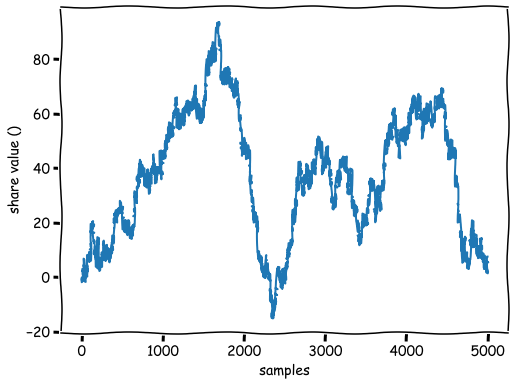

In [4]:
with plt.xkcd():
    plt.figure(figsize=(8,6))
    t=np.arange(n)
    plt.plot(t,x)
    plt.grid(True)
    plt.xlabel('samples')
    plt.ylabel('share value ()')

 Now, to display the Brownian motion, we could just use plot(x, y). However, the result would be monochromatic and a bit boring. We would like to use a gradient of color to illustrate the progression of the motion in time (the hue is a function of time). matplotlib does not support this feature natively, so we rather us scatter(). This function allows us to assign a different color to each point at the expense of dropping out line segments between points. To work around this issue, we linearly interpolate the process to give the illusion of a continuous line:

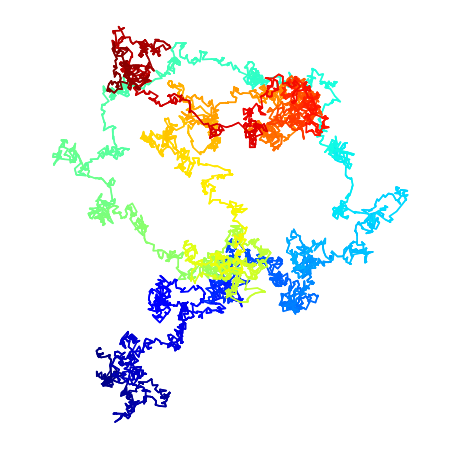

In [5]:
# We add 10 intermediary points between two
# successive points. We interpolate x and y.
k = 10
x2 = np.interp(np.arange(n * k), np.arange(n) * k, x)
y2 = np.interp(np.arange(n * k), np.arange(n) * k, y)
fig, ax = plt.subplots(1, 1, figsize=(8, 8))
# Now, we draw our points with a gradient of colors.
ax.scatter(x2, y2, c=range(n * k), linewidths=0,
           marker='o', s=3, cmap=plt.cm.jet,)
ax.axis('equal')
ax.set_axis_off()

<img src="ost_logo.png" width="240" height="240" align="right"/>
<div style="text-align: left"> <b> Machine Learning </b> <br> MSE FTP MachLe <br> 
<a href="mailto:christoph.wuersch@ost.ch"> Christoph Würsch </a> </div>

## Lab 9, A3: Illustration of prior and posterior Gaussian process for different kernels


__Multivariate Gaussian distributions__ are useful for modeling finite collections of real-valued variables because of their nice analytical properties. Gaussian processes $\mathcal{GP}$ are the extension of multivariate Gaussians to *infinite-sized collections of real-valued variables*. In particular, this extension will allow us to think of Gaussian processes as
distributions not just over random vectors but in fact __distributions over random functions__.

Unlike classical learning algorithm, Bayesian algorithms do not attempt to identify “best-fit” models of the data (or similarly, make “best guess” predictions for new test inputs). Instead, they compute __a posterior distribution over models__ (or similarly, compute posterior predictive distributions for new test inputs). These distributions provide a useful way to quantify our uncertainty in model estimates, and to exploit our knowledge of this uncertainty in order to make more robust predictions on new test points.



## Gaussian Process


A __stochastic process__ is a collection of random variables, $\left\lbrace f(x) : x \in \mathcal{X} \right\rbrace$, indexed by elements from some set $\mathcal{X}$, known as the index set. 

__A Gaussian process is a stochastic process such that any finite subcollection of random variables has a multivariate Gaussian distribution.__ In particular, a collection of random variables $\left\lbrace f(x) : x \in \mathcal{X} \right\rbrace$  is said to be drawn from a Gaussian process $\mathcal{GP}$ with mean function $m(·)$ and covariance function $k(·, ·)$ if for any finite set of elements $x_1, . . . , x_m \in \mathcal{X}$, the associated finite set of random variables $f(x_1), \dots, f(x_m)$ have distribution,



When we form a Gaussian process $\mathcal{GP}$ we assume data is *jointly Gaussian* with a particular mean and covariance,

$$
p(\mathbf{f}|\mathbf{X}) \sim \mathcal{N}(\mathbf{m}(\mathbf{X}), \mathbf{K}(\mathbf{X})),
$$

$$
\mathbf{f}  \sim \mathcal{GP}(\mathbf{m}(\mathbf{x}), \mathbf{k}(\mathbf{x,x'})),
$$

where the conditioning is on the inputs $\mathbf{X}$ which are used for computing the mean and covariance. For this reason they are known as mean and covariance functions. To make things clearer, let us assume, that the mean function $\mathbf{m}(\mathbf{X})$ is zero, i.e. the jointly Gaussian distribution is centered around zero.

In this case, the Gaussian process perspective takes the marginal likelihood of the data to be a joint Gaussian density with a covariance given by $\mathbf{K}$. So the model likelihood is of the form,
$$
p(\mathbf{y}|\mathbf{X}) = \frac{1}{(2\pi)^{\frac{n}{2}}|\mathbf{K}|^{\frac{1}{2}}} \exp\left(-\frac{1}{2}\mathbf{y}^\top \left(\mathbf{K}+\sigma^2 \mathbf{I}\right)^{-1}\mathbf{y}\right)
$$
where the input data, $\mathbf{X}$, influences the density through the covariance matrix, $\mathbf{K}$ whose elements are computed through the covariance function, $k(\mathbf{x}, \mathbf{x}^\prime)$.

This means that the negative log likelihood (the objective function) is given by,
$$
E(\boldsymbol{\theta}) = \frac{1}{2} \log |\mathbf{K}| + \frac{1}{2} \mathbf{y}^\top \left(\mathbf{K} + \sigma^2\mathbf{I}\right)^{-1}\mathbf{y}
$$
where the *parameters* of the model are also embedded in the covariance function, they include the parameters of the kernel (such as lengthscale and variance), and the noise variance, $\sigma^2$. These parameters are called *hyperparametres*. Often, they are specified as the logarithm of the hyperparameters and are then called *loghyperparameters*.

### Making Predictions - computing the posterior

We therefore have a probability density that represents *functions*. How do we make predictions with this density? The density is known as a process because it is *consistent*. By consistency, here, we mean that the model makes predictions for $\mathbf{f}$ that are unaffected by future values of $\mathbf{f}^*$ that are currently unobserved (such as test points). If we think of $\mathbf{f}^*$ as test points, we can still write down a joint probability density over the training observations, $\mathbf{f}$ and the test observations, $\mathbf{f}^*$. This joint probability density will be Gaussian, with a covariance matrix given by our covariance function, $k(\mathbf{x}_i, \mathbf{x}_j)$. 

$$
\begin{bmatrix}\mathbf{f} \\ \mathbf{f}^*\end{bmatrix} \sim \mathcal{N}\left(\mathbf{0}, \begin{bmatrix} \mathbf{K} & \mathbf{K}_\ast \\ \mathbf{K}_\ast^\top & \mathbf{K}_{\ast,\ast}\end{bmatrix}\right)
$$

where here $\mathbf{K}$ is the covariance computed between all the training points, $\mathbf{K}_\ast$ is the covariance matrix computed between the training points and the test points and $\mathbf{K}_{\ast,\ast}$ is the covariance matrix computed betwen all the tests points and themselves. 


#### Conditional Density

Just as in naive Bayes, we first define the $joint density$, $p(\mathbf{y}, \mathbf{X})$ and now we need to define __conditional distributions__ that answer particular questions of interest. In particular we might be interested in finding out the values of the function for the prediction function at the test data given those at the training data, $p(\mathbf{f}_*|\mathbf{f})$. Or if we include noise in the training observations then we are interested in the conditional density for the prediction function at the test locations given the training observations, $p(\mathbf{f}^*|\mathbf{y})$. 

As ever all the various questions we could ask about this density can be answered using the *sum rule* and the *product rule*. For the multivariate normal density the mathematics involved is that of *linear algebra*, with a particular emphasis on the *partitioned inverse* or [*block matrix inverse*](http://en.wikipedia.org/wiki/Invertible_matrix#Blockwise_inversion), but they are beyond the scope of this course, so you don't need to worry about remembering them or rederiving them. We are simply writing them here because it is this *conditional* density that is necessary for making predictions.

The conditional density is also a multivariate normal,
$$
p(\mathbf{f}^* | \mathbf{y}) \sim \mathcal{N}(\boldsymbol{\mu}_f,\mathbf{C}_f)
$$
with a mean given by
$$
\boldsymbol{\mu}_f = \mathbf{K}_*^\top \left[\mathbf{K} + \sigma^2 \mathbf{I}\right]^{-1} \mathbf{y}
$$
and a covariance given by 
$$
\mathbf{C}_f = \mathbf{K}_{*,*} - \mathbf{K}_*^\top \left[\mathbf{K} + \sigma^2 \mathbf{I}\right]^{-1} \mathbf{K}_\ast.
$$

But now let's look at some frequently used covariance functions:

## (a) Analyze the code

In [1]:
import numpy as np

from matplotlib import pyplot as plt

from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.gaussian_process.kernels import (RBF, Matern, RationalQuadratic,
                                              ExpSineSquared, DotProduct,
                                              ConstantKernel)

We first instantiate a list of __kernels__ that we want to analyze.
The following kernels (covariance functions) will be analyzed:



In [2]:
kernels = [1.0 * RBF(length_scale=1.0, length_scale_bounds=(1e-1, 10.0)),
           1.0 * RationalQuadratic(length_scale=1.0, alpha=0.1),
           1.0 * ExpSineSquared(length_scale=1.0, periodicity=3.0,
                                length_scale_bounds=(0.1, 10.0),
                                periodicity_bounds=(1.0, 10.0)),
           ConstantKernel(0.1, (0.01, 10.0))
               * (DotProduct(sigma_0=1.0, sigma_0_bounds=(0.0, 10.0)) ** 2),
           1.0 * Matern(length_scale=1.0, length_scale_bounds=(1e-1, 10.0),
                        nu=1.5)]

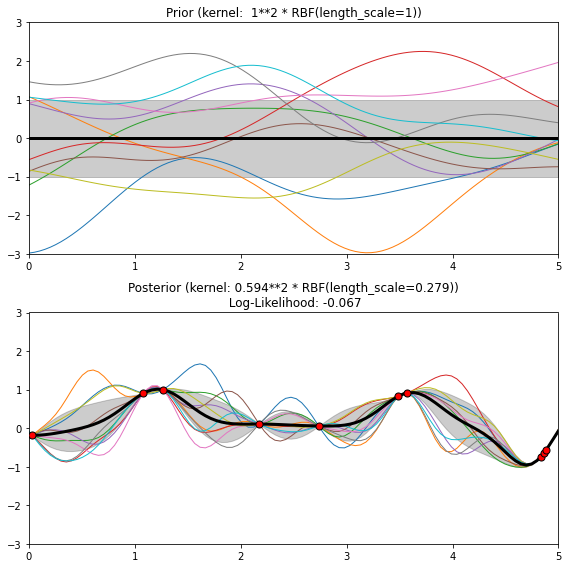

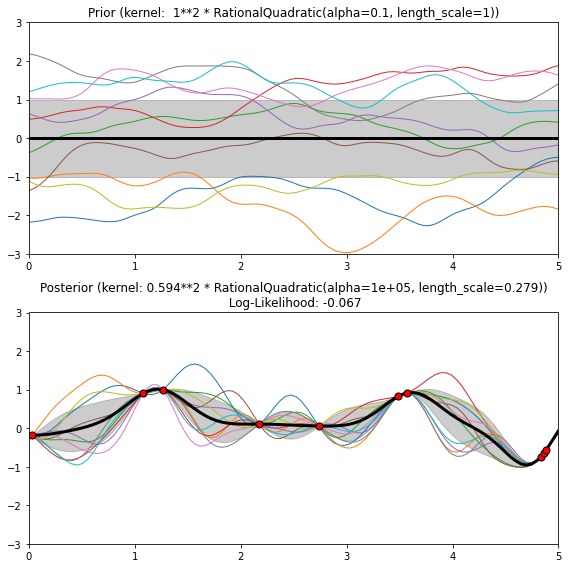

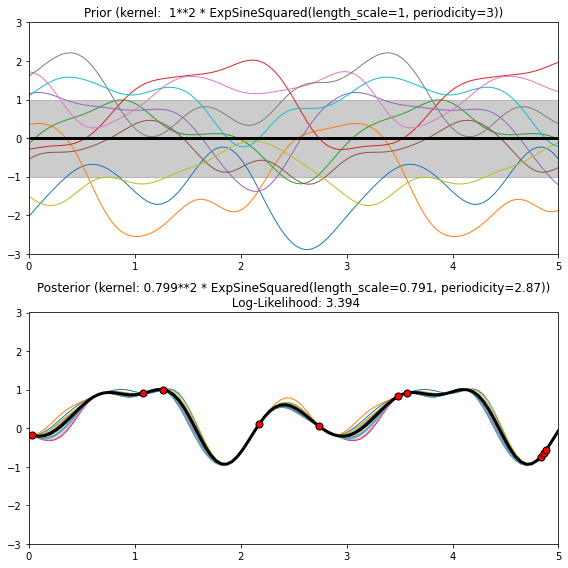

C:\Users\christoph.wuersch\.conda\envs\ML\lib\site-packages\sklearn\gaussian_process\kernels.py:301: RuntimeWarning: divide by zero encountered in log
  return np.log(np.vstack(bounds))
C:\Users\christoph.wuersch\.conda\envs\ML\lib\site-packages\sklearn\gaussian_process\_gpr.py:370: UserWarning: Predicted variances smaller than 0. Setting those variances to 0.
  warnings.warn("Predicted variances smaller than 0. "


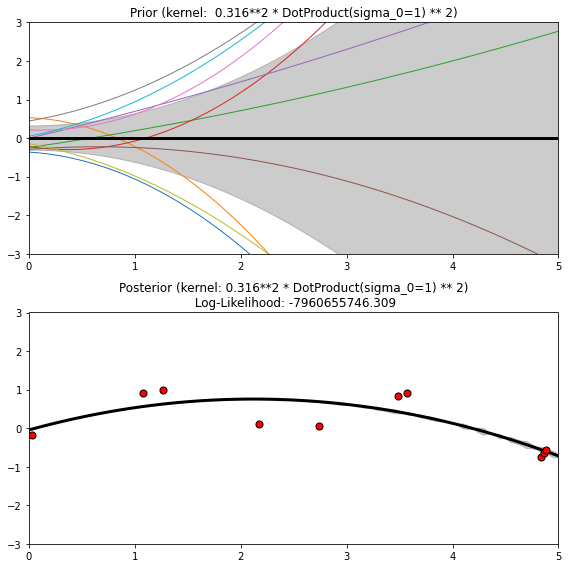

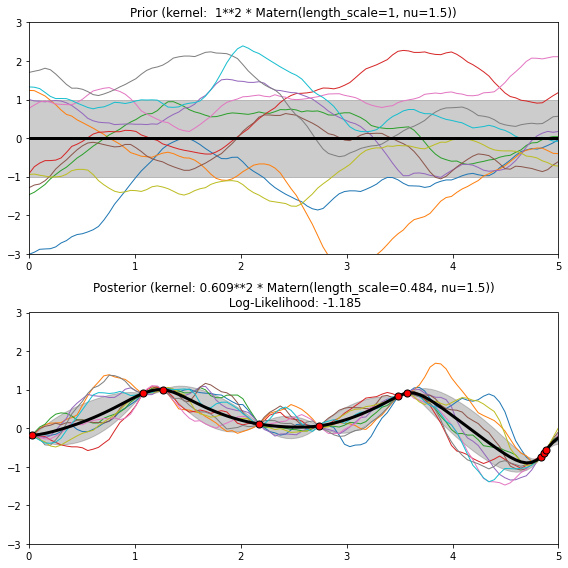

In [3]:
for fig_index, kernel in enumerate(kernels):
    
    # Specify Gaussian Process
    gp = GaussianProcessRegressor(kernel=kernel)

    # Plot prior
    plt.figure(fig_index, figsize=(8, 8))
    plt.subplot(2, 1, 1)
    X_ = np.linspace(0, 5, 100)
    y_mean, y_std = gp.predict(X_[:, np.newaxis], return_std=True)
    plt.plot(X_, y_mean, 'k', lw=3, zorder=9)
    plt.fill_between(X_, y_mean - y_std, y_mean + y_std,
                     alpha=0.2, color='k')
    y_samples = gp.sample_y(X_[:, np.newaxis], 10)
    plt.plot(X_, y_samples, lw=1)
    plt.xlim(0, 5)
    plt.ylim(-3, 3)
    plt.title("Prior (kernel:  %s)" % kernel, fontsize=12)

    # Generate data and fit GP
    rng = np.random.RandomState(4)
    X = rng.uniform(0, 5, 10)[:, np.newaxis]
    y = np.sin((X[:, 0] - 2.5) ** 2)
    gp.fit(X, y)

    # Plot posterior
    plt.subplot(2, 1, 2)
    X_ = np.linspace(0, 5, 100)
    y_mean, y_std = gp.predict(X_[:, np.newaxis], return_std=True)
    plt.plot(X_, y_mean, 'k', lw=3, zorder=9)
    plt.fill_between(X_, y_mean - y_std, y_mean + y_std,
                     alpha=0.2, color='k')

    y_samples = gp.sample_y(X_[:, np.newaxis], 10)
    plt.plot(X_, y_samples, lw=1)
    plt.scatter(X[:, 0], y, c='r', s=50, zorder=10, edgecolors=(0, 0, 0))
    plt.xlim(0, 5)
    plt.ylim(-3, 3)
    plt.title("Posterior (kernel: %s)\n Log-Likelihood: %.3f"
              % (gp.kernel_, gp.log_marginal_likelihood(gp.kernel_.theta)),
              fontsize=12)
    plt.tight_layout()
    plt.show()

## (b) Kernel functions

Have a look at the samples drawn from the given Gaussian processes for each kernel: RBF,
Matern, RationalQuadratic, ExpSineSquared, DotProduct and ConstantKernel. Give
an example for data that could be described by these covariance functions.

### (i) The RBF kernel (also called Squared Exponential (SE) kernel)
The radial basis function kernel or short RBF kernel is a __stationary__ kernel. __Stationary__ means, the kernel $K(x,x')=K(x-x')$ is __invariant to translations__. It is also known as the “squared exponential” kernel. It is parameterized by a length-scale parameter $\lambda$, which can either be a scalar (isotropic variant of the kernel) or a vector with the same number of dimensions as the inputs (anisotropic variant of the kernel). The kernel is given by:

$$ k(x,x')= \sigma_0^2 \exp \left[ -\frac{1}{2} \left( \frac{x-x'}{\lambda} \right)^2 \right]$$

This kernel is infinitely differentiable, which implies that $\mathcal{GP}$s with this kernel as covariance function have mean square derivatives of all orders, and __are thus very smooth__. 

__Example__: We can use it to model and predict very smooth processes or signals.

### (ii) the Rational-Quadratic kernel

The *RationalQuadratic kernel* can be seen as a scale mixture (an infinite sum) of RBF kernels with different characteristic length-scales. It is parameterized by a length-scale parameter $\lambda$ and a scale mixture parameter $\alpha$. Only the isotropic variant where $\lambda$ is a scalar is supported at the moment. The kernel is given by:


$$ k(x,x')=\left( 1 + \frac{( x-x')^2 }{2\alpha \lambda^2} \right)^{-\alpha}$$





###  (iii) the Exp-Sine-Squared kernel

The Exp-Sine-Squared kernel allows __modeling periodic functions__. It is parameterized by a length-scale parameter $\lambda$ and a periodicity parameter $p$. Only the isotropic variant where  is a scalar is supported at the moment. The kernel is given by:

$$k(x, x') = \exp \left[-\frac{ 2\cdot\sin^2  \left( \pi/ p \cdot \vert x-x' \vert \right)}{ \lambda^2}  \right]$$

__Example__: modeling periodic changes, e.g. daily temperature changes, seasonally changing quantities, such as the $\mathrm{CO}_2$ concentration.

### (iv) the Matérn kernel

The Matern kernel is a __stationary__ kernel and a generalization of the RBF kernel. It has an additional parameter $\nu$ which controls the smoothness of the resulting function. 
It is parameterized by a length-scale parameter $\lambda$ , which can either be a scalar (isotropic variant of the kernel) or a vector with the same number of dimensions as the inputs (anisotropic variant of the kernel). The kernel is given by:

$$k(x_i, x_j) = \sigma^2\frac{1}{\Gamma(\nu)2^{\nu-1}}\Bigg(\gamma\sqrt{2\nu} \frac{\vert x-x'\vert}{\lambda})\Bigg)^\nu \cdot K_\nu \Bigg(\gamma\sqrt{2\nu} \frac{\vert x-x'\vert}{\lambda})\Bigg)$$

where $K_{\nu}$ is a modified Bessel function. 
- It is __stationary and isotropic__. In the limit of $\nu \rightarrow \infty$, the matérn kernel converges to the RBF covariance function. 
- for a finite $\nu$, the matérn kernel generates much rougher sample functions
- for the special case of $\nu= \frac{1}{2}$, the kernel gets $K(x, x') = \exp \left( − \frac{ \vert x − x' \vert}{\lambda} \right)$. This is called a Ornstein-Uhlenbeck process, yielding very rough sample functions (https://en.wikipedia.org/wiki/Ornstein%E2%80%93Uhlenbeck_process)

__Example__: modeling stock prices, random walks, non-differentiable stochastic processes

### (v) the Dot-Product kernel
The Dot-Product kernel is __non-stationary__ and can be obtained from linear regression by putting $\sim \mathcal{N}(0,1)$ priors on the coefficients of  $x_d (d=1\dots D)$ and a prior of $\sim \mathcal{N}(0,\sigma_0^2)$ on the bias. The Dot-Product kernel is invariant to a rotation of the coordinates about the origin, but not translations. It is parameterized by a parameter $\sigma_0^2$. For $\sigma_0^2=0$, the kernel is called the __homogeneous linear kernel__, otherwise it is inhomogeneous. The kernel is given by

$$ k(x,x')=\sigma_0^2 +x\cdot x'$$

The Dot-Product kernel is commonly combined with exponentiation. 

__Example__: polynomial regression

## (c) How to model a periodic signal with noise using a $\mathcal{GP}$

Kernel functions are __additive__ and __multiplicative__. To model a purely periodic process with white noise, we can construct a new kernel, consisitng of the Exp-Sine-Squared kernel plus the white noise kernel. In order to allow the model to adapt to variations of the amplitude $A$ of the periodic signal, we vary the periodic kernel using an RBF-kernel.



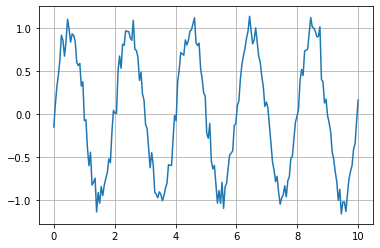

In [4]:
import numpy as np
import matplotlib.pyplot as plt


A = 1         #amplitude
p = 2         #periodicity
sigma0=0.001    #noise level
N = 200;      #number of points



noise = np.random.normal(0,0.1,N)
X=np.linspace(0,10,N)
y=A*np.sin(2*np.pi*(X/p))+noise
X=X[:, np.newaxis]
y=y[:, np.newaxis]
#generate noisy sine wave

plt.figure()
plt.plot(X,y)
plt.grid(True)




In [5]:
from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.gaussian_process.kernels \
    import RBF, WhiteKernel, RationalQuadratic, ExpSineSquared

# variation of the amplitude of the sine
k1 = A**2 * RBF(length_scale=30)                         
# periodic component with variable amplitude
k2 = ExpSineSquared(length_scale=20, periodicity=p)   
# noise terms
k3 = WhiteKernel(noise_level=sigma0**2)  

kernel_gpml = k1*k2 + k3


gp = GaussianProcessRegressor(kernel=kernel_gpml,
                              alpha=0.0,
                              optimizer=None,
                              normalize_y=True)
gp.fit(X, y)


GaussianProcessRegressor(alpha=0.0,
                         kernel=1**2 * RBF(length_scale=30) * ExpSineSquared(length_scale=20, periodicity=2) + WhiteKernel(noise_level=1e-06),
                         normalize_y=True, optimizer=None)

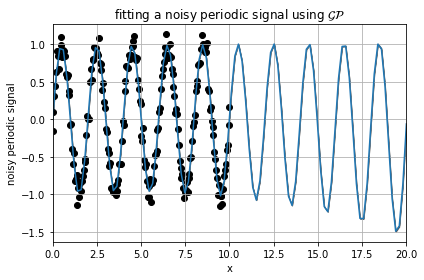

In [6]:
X_ = np.linspace(X.min(), X.max() + 10, 100)[:, np.newaxis]
y_pred, y_std = gp.predict(X_, return_std=True)

# Illustration
plt.scatter(X, y, c='k')
plt.plot(X_, y_pred)
plt.fill_between(X_[:,0], y_pred[:,0] - y_std,
                 y_pred[:,0] + y_std,
                 alpha=0.5, color='k')
plt.xlim(X_.min(), X_.max())
plt.xlabel("x")
plt.ylabel('noisy periodic signal')
plt.title('fitting a noisy periodic signal using $\mathcal{GP}$')
plt.tight_layout()
plt.grid(True)
plt.show()

## (d) Matérn kernel

The Matern kernel is a __stationary__ kernel and a generalization of the RBF kernel. It has an additional parameter $\nu$ which controls the smoothness of the resulting function. 
It is parameterized by a length-scale parameter $\lambda$ , which can either be a scalar (isotropic variant of the kernel) or a vector with the same number of dimensions as the inputs (anisotropic variant of the kernel). The kernel is given by:

$$k(x_i, x_j) = \sigma^2\frac{1}{\Gamma(\nu)2^{\nu-1}}\Bigg(\gamma\sqrt{2\nu} \frac{\vert x-x'\vert}{\lambda})\Bigg)^\nu \cdot K_\nu \Bigg(\gamma\sqrt{2\nu} \frac{\vert x-x'\vert}{\lambda})\Bigg)$$

where $K_{\nu}$ is a modified Bessel function. 
- It is __stationary and isotropic__. In the limit of $\nu \rightarrow \infty$, the matérn kernel converges to the RBF covariance function. 
- for a finite $\nu$, the matérn kernel generates much rougher sample functions
- for the special case of $\nu= \frac{1}{2}$, the kernel gets $K(x, x') = \exp \left( − \frac{ \vert x − x' \vert}{\lambda} \right)$. This is called a Ornstein-Uhlenbeck process, yielding very rough sample functions (https://en.wikipedia.org/wiki/Ornstein%E2%80%93Uhlenbeck_process)

__Example__: modeling stock prices, random walks, non-differentiable stochastic processes

## Summary

We close our inspection of our Gaussian processes by pointing out some reasons why Gaussian processes are an attractive model for use in regression problems and in some cases may be preferable to alternative models (such as linear and locally-weighted linear regression):

1.  As Bayesian methods, Gaussian process models __allow one to quantify uncertainty in predictions__ resulting not just from intrinsic noise in the problem but also the errors in the parameter estimation procedure. Furthermore, many methods for model selection and hyperparameter selection in Bayesian methods are immediately applicable to Gaussian processes (though we did not address any of these advanced topics here).
2.  Like locally-weighted linear regression, Gaussian process regression is __non-parametric__ and hence can model essentially arbitrary functions of the input points.
3.  Gaussian process regression models provide a natural way to introduce __kernels into a regression modeling framework__. By careful choice of kernels, Gaussian process regression models can sometimes take advantage of structure in the data.
4. Gaussian process regression models, though perhaps somewhat tricky to understand conceptually, nonetheless lead to simple and straightforward linear algebra implementations.




## References

[1] Carl E. Rasmussen and Christopher K. I. Williams. Gaussian Processes for Machine Learning. MIT Press, 2006. Online: http://www.gaussianprocess.org/gpml/

[2] Chuong B. Do: Gaussian Processes, University of Stanford (2007)

[3] Neil D. Lawrence, Nicolas Durande: GPy introduction covariance functions, Machine Learning Summer School, Sydney, Australia (2015)


<img src="ost_logo.png" width="240" height="240" align="right"/>
<div style="text-align: left"> <b> Machine Learning </b> <br> MSE FTP MachLe <br> 
<a href="mailto:christoph.wuersch@ost.ch"> Christoph Würsch </a> </div>

In [1]:
%matplotlib inline



# Lab 9, A4: Gaussian process regression (GPR) with noise-level estimation

This example illustrates that GPR with a sum-kernel including a `WhiteKernel` can estimate the noise level of data. 


In [2]:
import numpy as np

from matplotlib import pyplot as plt
from matplotlib.colors import LogNorm

from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.gaussian_process import kernels


# Generate noisy sine wave
nSamples=300;
rng = np.random.RandomState(0)
X = rng.uniform(0, 5, nSamples)[:, np.newaxis]
y = 0.5 * np.sin(3 * X[:, 0]) + rng.normal(0, 0.3, X.shape[0])

### (a) Inspect and interpret the data using a plot
Have a look at the data and make a good guess for the kernel to be selected.

Text(0.5, 1.0, 'raw noisy data')

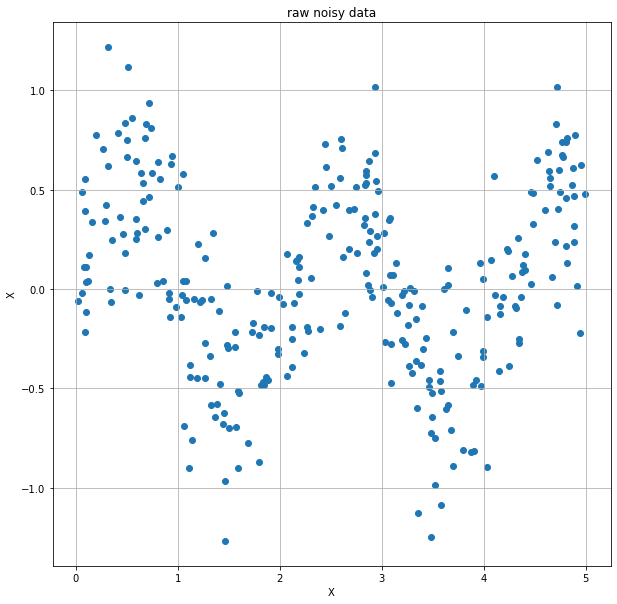

In [3]:
plt.figure(figsize=(10,10))
plt.scatter(X,y)
plt.grid(True)
plt.xlabel('X')
plt.ylabel('X')
plt.title('raw noisy data')


### (b) Create a suitable kernel for the covariance function
The data shows a sin-like oscillation that is noisy. So it makes sense to select for the __oscillating part__ of the covariance either
1. the sin-exponential kernel
2. the RBF-kernel

For the __noisy part__, we could either choose a white noise kernel (WhiteKernel).
We start with the RBF-kernel and additive white noise.

In [4]:

# First run: using the RBF kernel and white noise

kernel = 1.0 * kernels.RBF(length_scale=1.0, length_scale_bounds=(1e-2, 1e3)) \
    + kernels.WhiteKernel(noise_level=1e-5, noise_level_bounds=(1e-10, 1e+1))
gp1 = GaussianProcessRegressor(kernel=kernel, alpha=1e-5).fit(X, y)



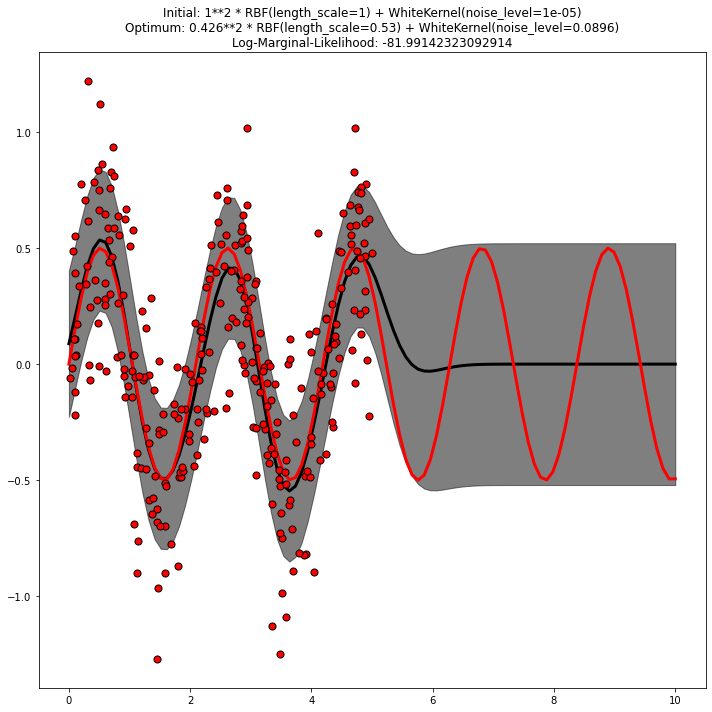

<Figure size 432x288 with 0 Axes>

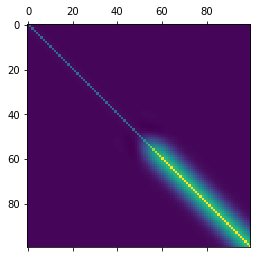

In [5]:
X_ = np.linspace(0, 10, 100)
y_mean, y_cov = gp1.predict(X_[:, np.newaxis], return_cov=True)

plt.figure(figsize=(10,10))
plt.plot(X_, y_mean, 'k', lw=3, zorder=9)
plt.fill_between(X_, y_mean - np.sqrt(np.diag(y_cov)),
                 y_mean + np.sqrt(np.diag(y_cov)),
                 alpha=0.5, color='k')
plt.plot(X_, 0.5*np.sin(3*X_), 'r', lw=3, zorder=9)
plt.scatter(X[:, 0], y, c='r', s=50, zorder=10, edgecolors=(0, 0, 0))
plt.title("Initial: %s\nOptimum: %s\nLog-Marginal-Likelihood: %s"
          % (kernel, gp1.kernel_,
             gp1.log_marginal_likelihood(gp1.kernel_.theta)))
plt.tight_layout()
y_cov.shape

plt.figure()
plt.matshow(y_cov)
plt.show()


In [6]:
#Get out the hyperparameters
gp1.kernel_

0.426**2 * RBF(length_scale=0.53) + WhiteKernel(noise_level=0.0896)

### (c) using the ExpSineSquared kernel

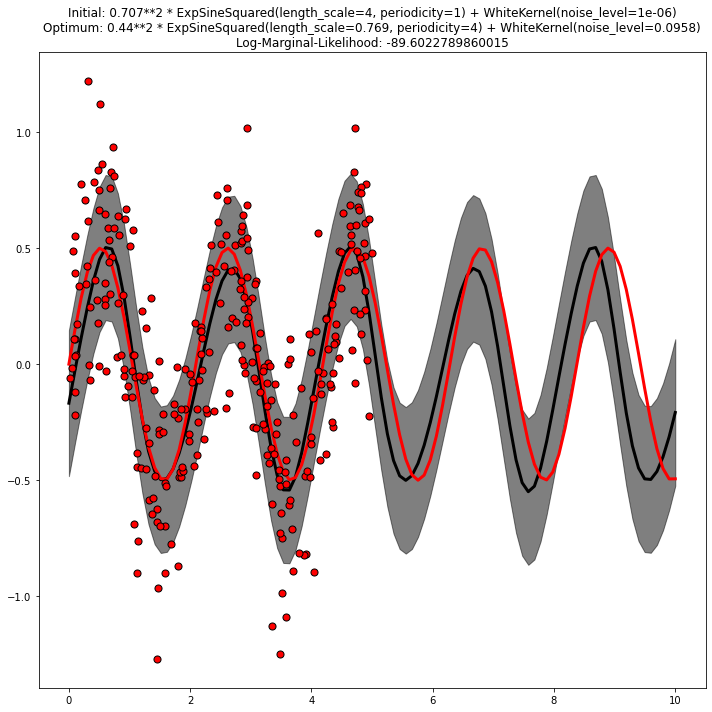

<Figure size 432x288 with 0 Axes>

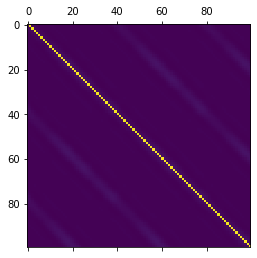

In [7]:
# Second run: using the sin-exponential kernel and white noise
kernel = 0.5 * kernels.ExpSineSquared(length_scale=4.0,  periodicity=1,
                                      length_scale_bounds=(1e-1, 1e3),
                                     periodicity_bounds=(1e-1, 4)) \
    + kernels.WhiteKernel(noise_level=1e-6, noise_level_bounds=(1e-10, 1e+1))
gp = GaussianProcessRegressor(kernel=kernel, alpha=1E-5).fit(X, y)

X_ = np.linspace(0, 10, 100)
y_mean, y_cov = gp.predict(X_[:, np.newaxis], return_cov=True)


plt.figure(figsize=(10,10))
plt.plot(X_, y_mean, 'k', lw=3, zorder=9)
plt.fill_between(X_, y_mean - np.sqrt(np.diag(y_cov)),
                 y_mean + np.sqrt(np.diag(y_cov)),
                 alpha=0.5, color='k')
plt.plot(X_, 0.5*np.sin(3*X_), 'r', lw=3, zorder=9)
plt.scatter(X[:, 0], y, c='r', s=50, zorder=10, edgecolors=(0, 0, 0))
plt.title("Initial: %s\nOptimum: %s\nLog-Marginal-Likelihood: %s"
          % (kernel, gp.kernel_,
             gp.log_marginal_likelihood(gp.kernel_.theta)))
plt.tight_layout()

plt.figure()
plt.matshow(y_cov)
plt.show()


In [8]:
#Get out the hyperparameters
gp.kernel_


0.44**2 * ExpSineSquared(length_scale=0.769, periodicity=4) + WhiteKernel(noise_level=0.0958)

### References

[1] Jan Hendrik Metzen <jhm@informatik.uni-bremen.de>



<img src="ost_logo.png" width="240" height="240" align="right"/>
<div style="text-align: left"> <b> Machine Learning </b> <br> MSE FTP MachLe <br> 
<a href="mailto:christoph.wuersch@ost.ch"> Christoph Würsch </a> </div>

# Simple Gaussian Process
MSE FTP_MachLe HS2020
Christoph Würsch, Institute for Computational Engineering ICE, OST

__A Gaussian process is a stochastic process such that any finite subcollection of random variables has a multivariate Gaussian distribution.__ In particular, a collection of random variables $\left\lbrace f(x) : x \in \mathcal{X} \right\rbrace$  is said to be drawn from a Gaussian process $\mathcal{GP}$ with mean function $m(·)$ and covariance function $k(·, ·)$ if for any finite set of elements $x_1, . . . , x_m \in \mathcal{X}$, the associated finite set of random variables $f(x_1), \dots, f(x_m)$ have distribution,



When we form a Gaussian process $\mathcal{GP}$ we assume data is *jointly Gaussian* with a particular mean and covariance,

$$
p(\mathbf{f}|\mathbf{X}) \sim \mathcal{N}(\mathbf{m}(\mathbf{X}), \mathbf{K}(\mathbf{X})),
$$

$$
\mathbf{f}  \sim \mathcal{GP}(\mathbf{m}(\mathbf{x}), \mathbf{k}(\mathbf{x,x'})),
$$

where the conditioning is on the inputs $\mathbf{X}$ which are used for computing the mean and covariance. For this reason they are known as mean and covariance functions. To make things clearer, let us assume, that the mean function $\mathbf{m}(\mathbf{X})$ is zero, i.e. the jointly Gaussian distribution is centered around zero.

Generate random $x$-values:

In [1]:
import numpy as np
from matplotlib import pyplot as plt
from scipy.spatial import distance_matrix as dm
import matplotlib
from collections import OrderedDict

cmaps = OrderedDict()
cmaps['Sequential'] = ['Greys', 'Purples', 'Blues', 'Greens', 'Oranges', 'Reds', 
                        'YlOrBr', 'YlOrRd', 'OrRd', 'PuRd', 'RdPu', 'BuPu', 'GnBu', 'PuBu', 'YlGnBu', 'PuBuGn', 'BuGn', 'YlGn']
cmaps['Diverging'] = ['PiYG', 'PRGn', 'BrBG', 'PuOr', 'RdGy', 'RdBu',
                      'RdYlBu', 'RdYlGn', 'Spectral', 'coolwarm', 'bwr', 'seismic']


#%% Sample a function from a Gaussian Process (GP) 
N=300;
X = np.linspace(-5, 5, N).reshape(N,1) ;

Calculate the **distance matrix** $D$ :

$
\begin{equation}
D_{ij}=\sqrt[p]{\left \vert x_i-x_j \right \vert ^p} 
\end{equation} $

In [2]:
#calculate the distance matrix
D=dm(X,X,p=2)
print(D)

[[ 0.          0.03344482  0.06688963 ...  9.93311037  9.96655518
  10.        ]
 [ 0.03344482  0.          0.03344482 ...  9.89966555  9.93311037
   9.96655518]
 [ 0.06688963  0.03344482  0.         ...  9.86622074  9.89966555
   9.93311037]
 ...
 [ 9.93311037  9.89966555  9.86622074 ...  0.          0.03344482
   0.06688963]
 [ 9.96655518  9.93311037  9.89966555 ...  0.03344482  0.
   0.03344482]
 [10.          9.96655518  9.93311037 ...  0.06688963  0.03344482
   0.        ]]


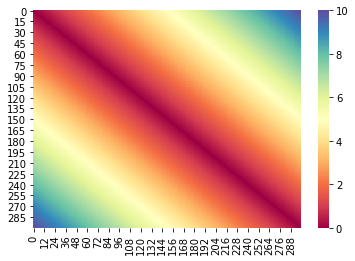

In [3]:
import seaborn as sns
sns.heatmap(D, cmap=cmaps['Diverging'][8]);

Calculate the mean vector $\vec{m}$ and the covariance matrix $K_{ij}=d_{ij}^p$ 

C:\Users\christoph.wuersch\.conda\envs\ML\lib\site-packages\ipykernel_launcher.py:5: RuntimeWarning: covariance is not positive-semidefinite.
  """


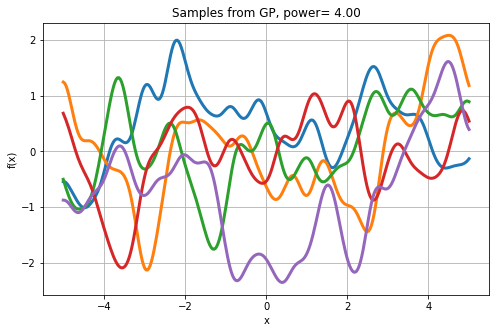

In [4]:
power=4;

mean =np.zeros(N)
cov  =np.exp(-1/2*np.power(D,power))
y=np.random.multivariate_normal(mean, cov, 5).T

fig1=plt.figure(figsize=(8,5))
plt.plot(X,y,lw=3); plt.grid(True); plt.xlabel('x'); plt.ylabel('f(x)')
plt.title('Samples from GP, power= %1.2f' % np.float(power))
plt.savefig('SamplesGP %1.2f.png' % np.float(power),dpi= 600)

<img src="ost_logo.png" width="240" height="240" align="right"/>
<div style="text-align: left"> <b> Machine Learning </b> <br> MSE FTP MachLe <br> 
<a href="mailto:christoph.wuersch@ost.ch"> Christoph Würsch </a> </div>

# Lab10 A2 Value Iteration GridWorld

## Reinforcement Learning — Implement Grid World

### Introduction of Value Iteration
[Based on a code by Jeremy Zhang](https://towardsdatascience.com/reinforcement-learning-implement-grid-world-from-scratch-c5963765ebff)


Gridworld is the most basic as well as classic problem in reinforcement learning and by implementing it on your own, I believe, is the best way to understand the basis of reinforcement learning. 

The rule is simple. 
- Your agent/robot starts at the left-bottom corner(the ‘start’ sign) and ends at either +1 or -1 which is the corresponding reward. 
- At each step, the agent has 4 possible actions including up, down, left and right, whereas the black block is a wall where your agent won’t be able to penetrate through. 
- If the agent hits the wall, it will remain at the same position.




Grid Board
---
<img src="board2.png" alt="drawing" width="600"/>

In [1]:
import numpy as np

In [2]:
BOARD_ROWS = 3
BOARD_COLS = 4
WIN_STATE = (0, 3)
LOSE_STATE = (1, 3)
START = (2, 0)
DETERMINISTIC = True
DO_PRINT=False

When our agent takes an action, the `Environment` should have a function to accept an action and return a legal position of next state.

In [3]:
class Environment:
    def __init__(self, state=START):
        self.board = np.zeros([BOARD_ROWS, BOARD_COLS])
        self.board[WIN_STATE[0],WIN_STATE[1]]=+1
        self.board[LOSE_STATE[0],LOSE_STATE[1]]=-1
        self.board[1, 1] = -1
        self.state = state
        self.isEnd = False
        self.determine = DETERMINISTIC
        
    def giveReward(self):
        if self.state == WIN_STATE:
            return 1
        elif self.state == LOSE_STATE:
            return -1
        else:
            return 0
    
    def isEndFunc(self):
        if (self.state == WIN_STATE) or (self.state == LOSE_STATE):
            self.isEnd = True
    
    # (a) method to set the parameters alpha, gamma and epsilon
    def SetParameters(self,lr=0.2,gamma=0.9,exp_rate=0.2):
        self.lr=lr
        self.gamma=gamma
        self.exp_rate=exp_rate
    
    def nxtPosition(self, action):
        """
        action: up, down, left, right
        -------------
        0 | 1 | 2| 3|
        1 |
        2 |
        return next position
        """
        if self.determine:
            if action == "up":
                nxtState = (self.state[0]-1, self.state[1])
            elif action == "down":
                nxtState = (self.state[0]+1, self.state[1])
            elif action == "left":
                nxtState = (self.state[0], self.state[1]-1)
            else:
                nxtState = (self.state[0], self.state[1]+1)
            # if next state legal
            if ((nxtState[0] >= 0) and (nxtState[0] <= (BOARD_ROWS-1))):
                if ((nxtState[1] >= 0) and (nxtState[1] <= (BOARD_COLS-1))):
                    if nxtState != (1, 1):
                        return nxtState
            return self.state
    
    def showBoard(self):
        self.board[self.state] = 1
        for i in range(0, BOARD_ROWS):
            print('-----------------')
            out = '| '
            for j in range(0, BOARD_COLS):
                if self.board[i, j] == 1:
                    token = '+1'
                if self.board[i, j] == -1:
                    token = '-1'
                if self.board[i, j] == 0:
                    token = '0'
                out += token + ' | '
            print(out)
        print('-----------------')    

In [4]:
env = Environment()
env.state

(2, 0)

In [5]:
env.showBoard()

-----------------
| 0 | 0 | 0 | +1 | 
-----------------
| 0 | -1 | 0 | -1 | 
-----------------
| +1 | 0 | 0 | 0 | 
-----------------


## Agent and Value Iteration

This is the artificial intelligence part, as our agent should be able to learn from the process and thinks like a human. The key of the magic is value iteration.

### Value Iteration

What our agent will finally learn is a policy $\pi$, and a policy is a mapping from state $s$ to action $a$, simply instructs what the agent should do at each state. In our case, instead of learning a mapping from state to action, we will leverage **value iteration** to learn a mapping of state to value (which is the estimated reward) and based on the estimation, at each state, our agent will choose the best action that gives the highest estimated reward.
There is not going to be any cranky, head-scratching math involved, as the core of value iteration is amazingly concise.

$$\displaystyle V(s_t) \leftarrow V(s_t) + \alpha \left[R+ V(s_{t+1})-V(s_t) \right] $$

This is the essence of value iteration. This formula almost applies to all reinforcement learning problems. Value iteration, just as its name, updates its value (estimated reward) at each iteration (end of game).

At first, our agent knows nothing about the grid world (environment), so it would simply initialises all rewards as 0. Then, it starts to explore the world by randomly walking around, surely it will endure lots of failure at the beginning, but that is totally fine. Once it reaches end of the game, either reward +1 or reward -1, the whole game reset and the reward **propagates in a backward fashion and eventually the estimated value of all states along the way will be updated based on the formula above**.


The $V(S_t)$ on the left is the updated value of that state, and the right one is the current non-updated value and $\alpha$ is *learning rate*. The formula is simply saying that **the updated value of a state equals to the current value plus a temporal difference**, which is what the agent learned from this iteration of game playing minus the previous estimate. 

In [6]:
class Agent:
    
    def __init__(self):
        self.states = []
        self.actions = ["up", "down", "left", "right"]
        self.State = Environment()
        self.isEnd = self.State.isEnd
        self.lr = 0.2
        self.exp_rate = 0.3
        # (b) added discount factor
        self.gamma = 0.9
        #(d) added List for the l2 norm of the value function
        self.VnormList=[]
        
        # initial state reward
        self.state_values = {}
        for i in range(BOARD_ROWS):
            for j in range(BOARD_COLS):
                self.state_values[(i, j)] = 0  # init_reward[i, j]
    
    def chooseAction(self):
        # choose action with most expected value
        mx_nxt_reward = 0
        action = ""
        
        if np.random.uniform(0, 1) <= self.exp_rate:
            action = np.random.choice(self.actions)
        else:
            # greedy action
            for a in self.actions:
                # if the action is deterministic
                nxt_reward = self.state_values[self.State.nxtPosition(a)]
                if nxt_reward >= mx_nxt_reward:
                    action = a
                    mx_nxt_reward = nxt_reward
            # print("current pos: {}, greedy aciton: {}".format(self.State.state, action))
        return action
    
    def takeAction(self, action):
        position = self.State.nxtPosition(action)
        return Environment(state=position)     
    
    def reset(self):
        self.states = []
        self.State = Environment()
        self.isEnd = self.State.isEnd
        
        
    #(d) method to set the parameters    
    def SetParameters(self,lr=0.2,gamma=0.9,exp_rate=0.2):
        self.lr=lr
        self.gamma=gamma
        self.exp_rate=exp_rate
        # (e) initial state reward is reset whenever the parameters are changed
        self.state_values = {}
        for i in range(BOARD_ROWS):
            for j in range(BOARD_COLS):
                self.state_values[(i, j)] = 0  # init_reward[i, j]
    
    def play(self, rounds=10):
        i = 0
        # (e) initialize the list for the l2-norm of the value function
        self.VnormList=[]
        
        while i < rounds:
            # to the end of game back propagate reward
            if self.State.isEnd:
                # back propagate
                reward = self.State.giveReward()
                # explicitly assign end state to reward values
                self.state_values[self.State.state] = reward
                if DO_PRINT:
                    print("Game End Reward", reward)
                for s in reversed(self.states[:-1]):
                    #(b) added discount factor
                    reward = self.state_values[s] + self.lr*(self.gamma*reward - self.state_values[s])
                    self.state_values[s] = round(reward, 3)
                # (e) append the norm of the value function after each epoch
                self.VnormList.append(self.CalcNorm())  
                self.reset()
                i += 1
            else:
                action = self.chooseAction()
                # append trace
                self.states.append(self.State.nxtPosition(action))
                if DO_PRINT:
                    print("current position {} action {}".format(self.State.state, action))
                # by taking the action, it reaches the next state
                self.State = self.takeAction(action)
                # mark is end
                self.State.isEndFunc()
                if DO_PRINT:
                    print("nxt state", self.State.state)
                    print("---------------------")
                self.isEnd = self.State.isEnd
                
    # (c) Method to indicate the learned value function on the board
    def showValues(self):
        for i in range(0, BOARD_ROWS):
            print('-----------------------------------')
            out = '| '
            for j in range(0, BOARD_COLS):
                out += "%+1.3f |" % self.state_values[(i, j)]
            print(out)
        print('-----------------------------------')
    
    # (e) method to calculate the l2 norm of the value function (Frobenius norm of the board)
    def CalcNorm(self):
        Vnorm=0
        for i in range(BOARD_ROWS):
            for j in range(BOARD_COLS):
                Vnorm=Vnorm+self.state_values[(i, j)]
        return Vnorm

In [7]:
DO_PRINT=False
ag = Agent()
ag.play(10)

In [8]:
ag.showValues()

-----------------------------------
| +0.256 |+0.458 |+0.694 |+1.000 |
-----------------------------------
| +0.124 |+0.000 |+0.120 |-1.000 |
-----------------------------------
| +0.034 |-0.002 |-0.035 |-0.071 |
-----------------------------------


### (f) Plots of the norm of the value function $\Vert V(s) \Vert_2$ 

In [9]:
import matplotlib.pyplot as plt

In [10]:
ag.SetParameters(lr=0.2,gamma=1,exp_rate=0.2)
ag.reset()
ag.play(150)


In [11]:
ag.showValues()

-----------------------------------
| +0.994 |+0.996 |+0.998 |+1.000 |
-----------------------------------
| +0.992 |+0.000 |+0.800 |+0.000 |
-----------------------------------
| +0.922 |+0.764 |+0.000 |+0.000 |
-----------------------------------


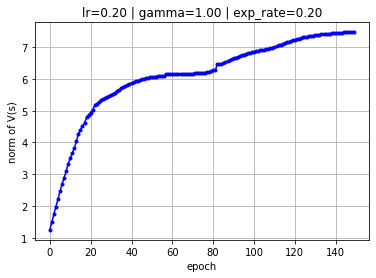

In [12]:

plt.figure()
plt.plot(ag.VnormList,'b.-')
plt.grid(True)
plt.xlabel('epoch')
plt.ylabel('norm of V(s)')
plt.title('lr=%1.2f | gamma=%1.2f | exp_rate=%1.2f' % (ag.lr,ag.gamma,ag.exp_rate))
plt.show()

In [13]:
ag.SetParameters(lr=0.2,gamma=0.8,exp_rate=0.2)
ag.reset()
ag.play(150);

-----------------------------------
| +0.448 |+0.565 |+0.717 |+1.000 |
-----------------------------------
| +0.315 |+0.000 |+0.521 |-1.000 |
-----------------------------------
| +0.245 |+0.095 |-0.030 |-0.092 |
-----------------------------------


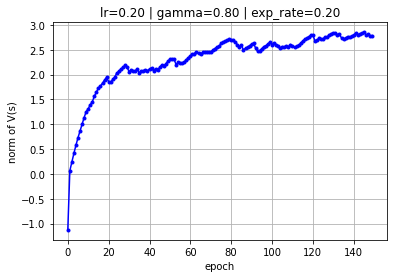

In [14]:
ag.showValues()
plt.figure()
plt.plot(ag.VnormList,'b.-')
plt.grid(True)
plt.xlabel('epoch')
plt.ylabel('norm of V(s)')
plt.title('lr=%1.2f | gamma=%1.2f | exp_rate=%1.2f' % (ag.lr,ag.gamma,ag.exp_rate))
plt.show()

In [15]:
ag.SetParameters(lr=0.02,gamma=0.8,exp_rate=0.2)
ag.reset()
ag.play(150);

-----------------------------------
| +0.241 |+0.450 |+0.701 |+1.000 |
-----------------------------------
| +0.120 |+0.000 |+0.082 |-1.000 |
-----------------------------------
| +0.013 |+0.000 |-0.001 |-0.075 |
-----------------------------------


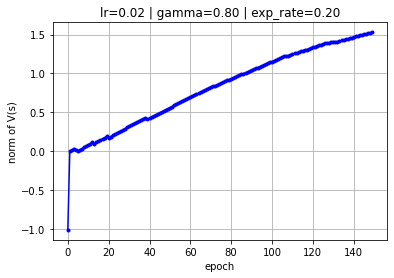

In [16]:
ag.showValues()
plt.figure()
plt.plot(ag.VnormList,'b.-')
plt.grid(True)
plt.xlabel('epoch')
plt.ylabel('norm of V(s)')
plt.title('lr=%1.2f | gamma=%1.2f | exp_rate=%1.2f' % (ag.lr,ag.gamma,ag.exp_rate))
plt.show()

<img src="ost_logo.png" width="240" height="240" align="right"/>
<div style="text-align: left"> <b> Machine Learning </b> <br> MSE FTP MachLe <br> 
<a href="mailto:christoph.wuersch@ost.ch"> Christoph Würsch </a> </div>

# Lab10 A3 Q-Learning in the Grid-World
(`Lab10_A3_QLearning_Gridboard_SOLUTION.ipynb`)

[Adapted from Jeremy Zhang:](https://towardsdatascience.com/implement-grid-world-with-q-learning-51151747b455)

Whereas $V(s)$ is a mapping from state $s$ to estimated value of that state, the $Q$ function — $Q(s, a)$ is only one component different from $V$ function. Instead of thinking that you receive a value when you are in a specific state $s$, think one step forward, you are in a state $s$ and by taking a specific action $a$ you receive a corresponding value. 

The result of grid world using value iteration was that we get a estimated value $V(s)$ for each state, but to have our policy $\pi(s, a)$, which is a mapping from state $s$ to action $a$, we need to go one step further by choosing the action that could get into the maximum value of next state. However, in Q-function, state and action are paired in the first place, which means when one has the optimal Q-function, he has the optimal action of that state.

Besides the Q-function, we are going to add more fun to our game:
- The agent action is **non-deterministic**, i.e. there is a transition probability $P_{ss'}$ from one state $s$ to another state $s'$
- Reward decays with ratio $\gamma$

Non-deterministic means that the agent will not be able to go where it intends to go. When it takes an action, it will has a probability to crash in a different action.




<img src="board2.png" alt="drawing" width="600"/>

---
When the agent moving up, it has **0.8** probability moving up and **0.1** probability of going left or right. (non-deterministic)



## Q-learning algorithm


One of the early breakthroughs in reinforcement learning was the development of an
off-policy TD control algorithm known as Q-learning (Watkins, 1989), defined by

$$ Q(s_t,a_t) \leftarrow Q(s_t,a_t)+ \alpha \cdot \left[ R_{t+1}+ \gamma \max_a Q(s_{t+1},a)-Q(s_t,a_t)\right]$$

- In this case, the learned action-value function, $Q$, directly approximates $Q^*$, the optimal action-value function, *independent of the policy being followed*. This dramatically simplifies the analysis of the algorithm and enabled early convergence proofs. The policy still has an effect in that it determines which state–action pairs are visited and updated. The policy can directly be derived from $Q$, e.g. using an $\varepsilon$-greedy approach.
- However, all that is required for correct convergence is that all pairs continue to be updated. Under this assumption and a variant of the usual stochastic approximation conditions on the sequence of step-size parameters, $Q$ has been shown to converge with probability $1$ to $Q^*$. The Q-learning algorithm is shown below in procedural form.



The *Q-learning-algorithm* is intrinsically **off-policy**, since it does not draw samples from a given policy $\pi$.

1. **Perform an action** $a$ in a state $s$ to end up in $s'$ with reward $r$, i.e. consider the tuple $(s,a,s',r)$
2. **Compute the intermediate Q-value:**
$$ \hat{Q}(s,a)=R(s,a,s')+\gamma \max_{a'} Q_k(s',a')$$

3. Incorporate that new evidence into the existing value using a **running average**: ($\alpha$ is the learning rate)
$$Q_{k+1}(s,a)=(1-\alpha)\cdot Q_k(s,a)+\alpha\cdot \hat{Q}(s,a)$$

This can be rewritten in a **gradient-descent update rule** fashion as:

$$ Q_{k+1}(s,a) = Q_k(s,a)+\alpha \cdot \left( \hat{Q}(s,a)-Q_k(s,a) \right)$$


In [1]:
import numpy as np
import matplotlib.pyplot as plt

In [2]:
BOARD_ROWS = 3
BOARD_COLS = 4
WIN_STATE = (0, BOARD_ROWS)
LOSE_STATE = (1, BOARD_ROWS)
START = (2, 0)
DETERMINISTIC = False
DO_PRINT = False

In [3]:
class Environment:
    def __init__(self, state=START):
        self.board = np.zeros([BOARD_ROWS, BOARD_COLS])
        self.board[1, 1] = -1
        self.state = state
        self.isEnd = False
        self.determine = DETERMINISTIC
        
    def giveReward(self):
        if self.state == WIN_STATE:
            return 1
        elif self.state == LOSE_STATE:
            return -1
        else:
            return 0
    
    def isEndFunc(self):
        if (self.state == WIN_STATE) or (self.state == LOSE_STATE):
            self.isEnd = True

    def _chooseActionProb(self, action):
        if action == "up":
            return np.random.choice(["up", "left", "right"], p=[0.8, 0.1, 0.1])
        if action == "down":
            return np.random.choice(["down", "left", "right"], p=[0.8, 0.1, 0.1])
        if action == "left":
            return np.random.choice(["left", "up", "down"], p=[0.8, 0.1, 0.1])
        if action == "right":
            return np.random.choice(["right", "up", "down"], p=[0.8, 0.1, 0.1])
        
    def nxtPosition(self, action):
        """
        action: up, down, left, right
        -------------
        0 | 1 | 2| 3|
        1 |
        2 |
        return next position on board
        """
        if self.determine:
            if action == "up":
                nxtState = (self.state[0]-1, self.state[1])
            elif action == "down":
                nxtState = (self.state[0]+1, self.state[1])
            elif action == "left":
                nxtState = (self.state[0], self.state[1]-1)
            else:
                nxtState = (self.state[0], self.state[1]+1)
            self.determine = False
        else:
            # non-deterministic
            action = self._chooseActionProb(action)
            self.determine = True
            nxtState = self.nxtPosition(action)
                        
        # if next state is legal
        if (nxtState[0] >= 0) and (nxtState[0] <= BOARD_ROWS-1):
            if (nxtState[1] >= 0) and (nxtState[1] <= BOARD_COLS-1):
                if nxtState != (1, 1):
                    return nxtState
        return self.state
    
    def showBoard(self):
        self.board[self.state] = 1
        for i in range(0, BOARD_ROWS):
            print('-----------------')
            out = '| '
            for j in range(0, BOARD_COLS):
                if self.board[i, j] == 1:
                    token = '*'
                if self.board[i, j] == -1:
                    token = 'z'
                if self.board[i, j] == 0:
                    token = '0'
                out += token + ' | '
            print(out)
        print('-----------------')    

### Temporal Difference Learning

- Firstly, at each step, an agent takes action $a$ , collecting corresponding reward $r$ , and moves from state $s$ to $s'$. So a whole pair of $(s, a, s',r)$ is considered at each step.
- Secondly, we give an estimation of current $Q$ value, which equals to current reward plus maximum $Q$ value of next state times a decay rate $\gamma$. One thing worth noting is that we set all intermediate reward as 0, so the agent won’t be able to collect any non-zero reward until the end state, either 1 or -1.(This is not compulsory, you can try out other reward and see how the agent acts)
- Lastly, we update the estimation of the current Q value by adding $\alpha$ times a **temporal difference** (which is the difference between new estimation and current value).

### Action
- In terms of action taking, it will still be based on exploration rate.
- When the agent exploits the state, **it will take the action that maximises the Q value according to current estimation of Q-value**.



In [43]:
class Agent:
    
    def __init__(self):
        self.states = []  # record position and action taken at the position
        self.actions = ["up", "down", "left", "right"]
        self.State = Environment()
        self.isEnd = self.State.isEnd
        self.lr = 0.2
        self.exp_rate = 0.3
        self.decay_gamma = 0.9
        
        #(b) initialize the value function
        #initial V values # V_values is a list
        self.state_values = {}
        
        #initial policy
        self.policy={}
        
        # initial Q values
        self.Q_values = {}
        for i in range(BOARD_ROWS):
            for j in range(BOARD_COLS):
                self.state_values[(i,j)]=0
                self.Q_values[(i, j)] = {}
                for a in self.actions:
                    self.Q_values[(i, j)][a] = 0  # Q value is a dict of dict  
    
    def chooseAction(self):
        # choose action with most expected value
        mx_nxt_reward = 0
        action = ""
        
        if np.random.uniform(0, 1) <= self.exp_rate:
            action = np.random.choice(self.actions)
        else:
            # greedy action
            for a in self.actions:
                current_position = self.State.state
                nxt_reward = self.Q_values[current_position][a]
                if nxt_reward >= mx_nxt_reward:
                    action = a
                    mx_nxt_reward = nxt_reward
            #print("current pos: {}, greedy aciton: {}".format(self.State.state, action))
        return action
    
    def takeAction(self, action):
        position = self.State.nxtPosition(action)
        # update State
        return Environment(state=position)     
    
    def reset(self):
        self.states = []
        self.State = Environment()
        self.isEnd = self.State.isEnd
    
    def play(self, rounds=10):
        i = 0
        while i < rounds:
            # to the end of game back propagate reward
            if self.State.isEnd:
                # back propagate
                reward = self.State.giveReward()
                for a in self.actions:
                    self.Q_values[self.State.state][a] = reward
                if DO_PRINT:
                    print("Game End Reward", reward)
                for s in reversed(self.states):
                    current_q_value = self.Q_values[s[0]][s[1]]
                    reward = current_q_value + self.lr*(self.decay_gamma*reward - current_q_value)
                    self.Q_values[s[0]][s[1]] = round(reward, 3)
                self.reset()
                i += 1
            else:
                action = self.chooseAction()
                # append trace
                self.states.append([(self.State.state), action])
                if DO_PRINT:
                    print("current position {} action {}".format(self.State.state, action))
                # by taking the action, it reaches the next state
                self.State = self.takeAction(action)
                # mark is end
                self.State.isEndFunc()
                if DO_PRINT:
                    print("nxt state", self.State.state)
                    print("---------------------")
                self.isEnd = self.State.isEnd
    
    #(b) calculate the value function V*(s) and the optimum policy pi*
    def CalcValueFunction(self):
        for i in range(BOARD_ROWS):
            for j in range(BOARD_COLS):
                Q=np.zeros(4)
                for k,a in enumerate(self.actions):
                    Q[k]=self.Q_values[(i, j)][a]
                
                #following the optimum policy
                self.policy[(i,j)]=np.argmax(Q)
                self.state_values[(i,j)]=self.state_values[(i,j)]+np.max(Q)
    
    #(b) display the value function V*(s)
    def showValues(self):
        self.CalcValueFunction()
        for i in range(0, BOARD_ROWS):
            print('-----------------------------------')
            out = '| '
            for j in range(0, BOARD_COLS):
                out += "%+1.3f |" % self.state_values[(i, j)]
            print(out)
        print('-----------------------------------')
        
    #(c) display the optimum policy pi*(s)    
    def showPolicy(self):
        self.CalcValueFunction()
        for i in range(0, BOARD_ROWS):
            print('-----------------------------------')
            out = '| '
            for j in range(0, BOARD_COLS):
                myPolicy=self.actions[self.policy[(i,j)]]
                if myPolicy=='up':
                    direction=' ^  '
                if myPolicy=='down':
                    direction=' v  '
                if myPolicy=='left':
                    direction=' <--'
                if myPolicy=='right':
                    direction=' -->'   
                    
                out += "%s\t|" % direction
            print(out)
        print('-----------------------------------')
        
        

In [58]:
ag = Agent()
ag.reset()

In [59]:
ag.Q_values

{(0, 0): {'up': 0, 'down': 0, 'left': 0, 'right': 0},
 (0, 1): {'up': 0, 'down': 0, 'left': 0, 'right': 0},
 (0, 2): {'up': 0, 'down': 0, 'left': 0, 'right': 0},
 (0, 3): {'up': 0, 'down': 0, 'left': 0, 'right': 0},
 (1, 0): {'up': 0, 'down': 0, 'left': 0, 'right': 0},
 (1, 1): {'up': 0, 'down': 0, 'left': 0, 'right': 0},
 (1, 2): {'up': 0, 'down': 0, 'left': 0, 'right': 0},
 (1, 3): {'up': 0, 'down': 0, 'left': 0, 'right': 0},
 (2, 0): {'up': 0, 'down': 0, 'left': 0, 'right': 0},
 (2, 1): {'up': 0, 'down': 0, 'left': 0, 'right': 0},
 (2, 2): {'up': 0, 'down': 0, 'left': 0, 'right': 0},
 (2, 3): {'up': 0, 'down': 0, 'left': 0, 'right': 0}}

In [60]:
ag.play(100)

In [61]:
ag.Q_values

{(0, 0): {'up': 0.341, 'down': 0.368, 'left': 0.312, 'right': 0.492},
 (0, 1): {'up': 0.461, 'down': 0.45, 'left': 0.367, 'right': 0.672},
 (0, 2): {'up': 0.566, 'down': 0.22, 'left': 0.436, 'right': 0.88},
 (0, 3): {'up': 1, 'down': 1, 'left': 1, 'right': 1},
 (1, 0): {'up': 0.38, 'down': 0.173, 'left': 0.239, 'right': 0.266},
 (1, 1): {'up': 0, 'down': 0, 'left': 0, 'right': 0},
 (1, 2): {'up': 0.388, 'down': 0.013, 'left': 0.137, 'right': -0.322},
 (1, 3): {'up': -1, 'down': -1, 'left': -1, 'right': -1},
 (2, 0): {'up': 0.304, 'down': 0.167, 'left': 0.194, 'right': 0.153},
 (2, 1): {'up': 0.086, 'down': 0.079, 'left': 0.212, 'right': 0.009},
 (2, 2): {'up': -0.002, 'down': 0, 'left': 0.056, 'right': -0.026},
 (2, 3): {'up': -0.032, 'down': 0, 'left': 0, 'right': -0.147}}

In [62]:
ag.showValues()

-----------------------------------
| +0.492 |+0.672 |+0.880 |+1.000 |
-----------------------------------
| +0.380 |+0.000 |+0.388 |-1.000 |
-----------------------------------
| +0.304 |+0.212 |+0.056 |+0.000 |
-----------------------------------


In [63]:
ag.state_values

{(0, 0): 0.492,
 (0, 1): 0.672,
 (0, 2): 0.88,
 (0, 3): 1.0,
 (1, 0): 0.38,
 (1, 1): 0.0,
 (1, 2): 0.388,
 (1, 3): -1.0,
 (2, 0): 0.304,
 (2, 1): 0.212,
 (2, 2): 0.056,
 (2, 3): 0.0}

In [64]:
ag.showPolicy()

-----------------------------------
|  -->	| -->	| -->	| ^  	|
-----------------------------------
|  ^  	| ^  	| ^  	| ^  	|
-----------------------------------
|  ^  	| <--	| <--	| v  	|
-----------------------------------


<img src="ost_logo.png" width="240" height="240" align="right"/>
<div style="text-align: left"> <b> Machine Learning </b> <br> MSE FTP MachLe <br> 
<a href="mailto:christoph.wuersch@ost.ch"> Christoph Würsch </a> </div>

Tic Tac Toe
---
Two players against each other

<img style="float:left" src="board.png" alt="drawing" width="200"/>

In [1]:
import numpy as np
import pickle

In [2]:
BOARD_ROWS = 3
BOARD_COLS = 3

### Board State
---
Reflect & Judge the state

2 players p1 and p2; p1 uses symbol 1 and p2 uses symbol 2, vacancy as 0

In [3]:
class State:
    def __init__(self, p1, p2):
        self.board = np.zeros((BOARD_ROWS, BOARD_COLS))
        self.p1 = p1
        self.p2 = p2
        self.isEnd = False
        self.boardHash = None
        # init p1 plays first
        self.playerSymbol = 1
    
    # get unique hash of current board state
    def getHash(self):
        self.boardHash = str(self.board.reshape(BOARD_COLS*BOARD_ROWS))
        return self.boardHash
    
    def winner(self):
        # row
        for i in range(BOARD_ROWS):
            if sum(self.board[i, :]) == 3:
                self.isEnd = True
                return 1
            if sum(self.board[i, :]) == -3:
                self.isEnd = True
                return -1
        # col
        for i in range(BOARD_COLS):
            if sum(self.board[:, i]) == 3:
                self.isEnd = True
                return 1
            if sum(self.board[:, i]) == -3:
                self.isEnd = True
                return -1
        # diagonal
        diag_sum1 = sum([self.board[i, i] for i in range(BOARD_COLS)])
        diag_sum2 = sum([self.board[i, BOARD_COLS-i-1] for i in range(BOARD_COLS)])
        diag_sum = max(diag_sum1, diag_sum2)
        if diag_sum == 3:
            self.isEnd = True
            return 1
        if diag_sum == -3:
            self.isEnd = True
            return -1
        
        # tie
        # no available positions
        if len(self.availablePositions()) == 0:
            self.isEnd = True
            return 0
        # not end
        self.isEnd = False
        return None
    
    def availablePositions(self):
        positions = []
        for i in range(BOARD_ROWS):
            for j in range(BOARD_COLS):
                if self.board[i, j] == 0:
                    positions.append((i, j))  # need to be tuple
        return positions
    
    def updateState(self, position):
        self.board[position] = self.playerSymbol
        # switch to another player
        self.playerSymbol = -1 if self.playerSymbol == 1 else 1
    
    # only when game ends
    def giveReward(self):
        result = self.winner()
        # backpropagate reward
        if result == 1:
            self.p1.feedReward(1)
            self.p2.feedReward(0)
        elif result == -1:
            self.p1.feedReward(0)
            self.p2.feedReward(1)
        else:
            self.p1.feedReward(0.1)
            self.p2.feedReward(0.5)
    
    # board reset
    def reset(self):
        self.board = np.zeros((BOARD_ROWS, BOARD_COLS))
        self.boardHash = None
        self.isEnd = False
        self.playerSymbol = 1
    
    def play(self, rounds=100):
        for i in range(rounds):
            if i%1000 == 0:
                print("Rounds {}".format(i))
            while not self.isEnd:
                # Player 1
                positions = self.availablePositions()
                p1_action = self.p1.chooseAction(positions, self.board, self.playerSymbol)
                # take action and upate board state
                self.updateState(p1_action)
                board_hash = self.getHash()
                self.p1.addState(board_hash)
                # check board status if it is end

                win = self.winner()
                if win is not None:
                    # self.showBoard()
                    # ended with p1 either win or draw
                    self.giveReward()
                    self.p1.reset()
                    self.p2.reset()
                    self.reset()
                    break

                else:
                    # Player 2
                    positions = self.availablePositions()
                    p2_action = self.p2.chooseAction(positions, self.board, self.playerSymbol)
                    self.updateState(p2_action)
                    board_hash = self.getHash()
                    self.p2.addState(board_hash)
                    
                    win = self.winner()
                    if win is not None:
                        # self.showBoard()
                        # ended with p2 either win or draw
                        self.giveReward()
                        self.p1.reset()
                        self.p2.reset()
                        self.reset()
                        break
    
    # play with human
    def play2(self):
        while not self.isEnd:
            # Player 1
            positions = self.availablePositions()
            p1_action = self.p1.chooseAction(positions, self.board, self.playerSymbol)
            # take action and upate board state
            self.updateState(p1_action)
            self.showBoard()
            # check board status if it is end
            win = self.winner()
            if win is not None:
                if win == 1:
                    print(self.p1.name, "wins!")
                else:
                    print("tie!")
                self.reset()
                break

            else:
                # Player 2
                positions = self.availablePositions()
                p2_action = self.p2.chooseAction(positions)

                self.updateState(p2_action)
                self.showBoard()
                win = self.winner()
                if win is not None:
                    if win == -1:
                        print(self.p2.name, "wins!")
                    else:
                        print("tie!")
                    self.reset()
                    break

    def showBoard(self):
        # p1: x  p2: o
        for i in range(0, BOARD_ROWS):
            print('-------------')
            out = '| '
            for j in range(0, BOARD_COLS):
                if self.board[i, j] == 1:
                    token = 'x'
                if self.board[i, j] == -1:
                    token = 'o'
                if self.board[i, j] == 0:
                    token = ' '
                out += token + ' | '
            print(out)
        print('-------------')    

In [4]:
class Player:
    def __init__(self, name, exp_rate=0.3):
        self.name = name
        self.states = []  # record all positions taken
        self.lr = 0.2
        self.exp_rate = exp_rate
        self.decay_gamma = 0.9
        self.states_value = {}  # state -> value
    
    def getHash(self, board):
        boardHash = str(board.reshape(BOARD_COLS*BOARD_ROWS))
        return boardHash
    
    def chooseAction(self, positions, current_board, symbol):
        if np.random.uniform(0, 1) <= self.exp_rate:
            # take random action
            idx = np.random.choice(len(positions))
            action = positions[idx]
        else:
            value_max = -999
            for p in positions:
                next_board = current_board.copy()
                next_board[p] = symbol
                next_boardHash = self.getHash(next_board)
                value = 0 if self.states_value.get(next_boardHash) is None else self.states_value.get(next_boardHash)
                # print("value", value)
                if value >= value_max:
                    value_max = value
                    action = p
        # print("{} takes action {}".format(self.name, action))
        return action
    
    # append a hash state
    def addState(self, state):
        self.states.append(state)
    
    # at the end of game, backpropagate and update states value
    def feedReward(self, reward):
        for st in reversed(self.states):
            if self.states_value.get(st) is None:
                self.states_value[st] = 0
            self.states_value[st] += self.lr*(self.decay_gamma*reward - self.states_value[st])
            reward = self.states_value[st]
            
    def reset(self):
        self.states = []
        
    def savePolicy(self):
        fw = open('policy_' + str(self.name), 'wb')
        pickle.dump(self.states_value, fw)
        fw.close()

    def loadPolicy(self, file):
        fr = open(file,'rb')
        self.states_value = pickle.load(fr)
        fr.close()

In [5]:
class HumanPlayer:
    def __init__(self, name):
        self.name = name 
    
    def chooseAction(self, positions):
        while True:
            row = int(input("Input your action row:"))
            col = int(input("Input your action col:"))
            action = (row, col)
            if action in positions:
                return action
    
    # append a hash state
    def addState(self, state):
        pass
    
    # at the end of game, backpropagate and update states value
    def feedReward(self, reward):
        pass
            
    def reset(self):
        pass

### Training

In [6]:
p1 = Player("p1")
p2 = Player("p2")

st = State(p1, p2)
print("training...")
st.play(50000)

training...
Rounds 0
Rounds 1000
Rounds 2000
Rounds 3000
Rounds 4000
Rounds 5000
Rounds 6000
Rounds 7000
Rounds 8000
Rounds 9000
Rounds 10000
Rounds 11000
Rounds 12000
Rounds 13000
Rounds 14000
Rounds 15000
Rounds 16000
Rounds 17000
Rounds 18000
Rounds 19000
Rounds 20000
Rounds 21000
Rounds 22000
Rounds 23000
Rounds 24000
Rounds 25000
Rounds 26000
Rounds 27000
Rounds 28000
Rounds 29000
Rounds 30000
Rounds 31000
Rounds 32000
Rounds 33000
Rounds 34000
Rounds 35000
Rounds 36000
Rounds 37000
Rounds 38000
Rounds 39000
Rounds 40000
Rounds 41000
Rounds 42000
Rounds 43000
Rounds 44000
Rounds 45000
Rounds 46000
Rounds 47000
Rounds 48000
Rounds 49000


In [7]:
p1.savePolicy()
p2.savePolicy()

In [8]:
p1.loadPolicy("policy_p1")

### Human vs Computer

In [ ]:
p1 = Player("computer", exp_rate=0)
p1.loadPolicy("policy_p1")

p2 = HumanPlayer("human")

st = State(p1, p2)
st.play2()

-------------
|   |   | x | 
-------------
|   |   |   | 
-------------
|   |   |   | 
-------------


In [ ]:
p1 = Player("computer", exp_rate=0)
p1.loadPolicy("policy_p1")

p2 = HumanPlayer("human")

st = State(p1, p2)
st.play2()

<img src="ost_logo.png" width="240" height="240" align="right"/>
<div style="text-align: left"> <b> Machine Learning </b> <br> MSE FTP MachLe <br> 
<a href="mailto:christoph.wuersch@ost.ch"> Christoph Würsch </a> </div>

# The Curse of Dimensionality



- MSE FTP_MachLE
- *Author: Prof. Dr. Christoph Würsch, Institute for Computational Engineering ICE, OST*
- based on a blog by Martin Thoma: [link](https://martin-thoma.com/curse-of-dimensionality/)

In machine learning, the "curse of dimensionality" is often stated but much less often explained. At least not in detail. One just gets told that points are farer away from each other in high dimensional spaces.

## 1. Maximum minimal distance ¶
One approach to this is to calculate the maximum minimal distance of 

One approach to this is to calculate the maximum minimal distance of $k$ points in $[0,1]$. So you try to place 
$k$ points in such a way, that the minimum over the pairwise distances of those $k$ points is maximal. Let's call this $\alpha(n,k)$. However, it is not easily possible to calculate $\alpha(n,k)$ for arbitrary $n>2$.

But the special case $k=2$ and $n=2$ it is easy:

- $\alpha(n,2)=\sqrt{n}$
- $\alpha(n,2^n)=1$

So you can see that two points get can be farer apart in higher dimensions and that it needs much more points in higher dimensions to force at least two of them to have distance $1$.

## 2. Average distance

Another approach is to calculate the average Euclidian distance of $k$ uniformly randomly sampled points in $[0,1]^n$. Let's call it 
$\beta(n,k)$.

One first insight is that $\beta(n,k)=\beta(n,j)$ for $k,j\ge2$. Hence, we will only use $\beta(n)$ in the following.
It is possible to calculate this, but it is rather tedious ([see link](https://math.stackexchange.com/questions/1254129/average-distance-between-two-random-points-in-a-square/1254154#1254154)).

Just two calculated solutions for $k=2$:

- $\beta(1) = \frac{1}{3}$
- $\beta(2) = \frac{2+\sqrt{2}+5\operatorname{arcsinh}(1)}{15}=\frac{2+\sqrt{2}+5\log(1+\sqrt{2})}{15} \approx 0.52140543316472\ldots$

We have to compute:
$$I=\int_{[0,1]^4}\sqrt{(x_1-x_2)^2+(y_1-y_2)^2}\,d\mu. \tag{1}$$
Assuming that $X_1$ and $X_2$ are two independent random variables, uniformly distributed over [0,1], the pdf of their difference $\Delta X=X_1−X_2$ is given by:

$$I=\int_{[0,1]^4}\sqrt{(x_1-x_2)^2+(y_1-y_2)^2}\,d\mu. \tag{1}$$

hence:
$$\begin{eqnarray*} I &=& \iint_{[-1,1]^2}(1-|x|)(1-|y|)\sqrt{x^2+y^2}\,dx\,dy \\&=&4\iint_{[0,1]^2}xy\sqrt{(1-x)^2+(1-y)^2}\,dx\,dy\tag{3}\end{eqnarray*}$$
that is tedious to compute but still possible; we have:

$$I = \frac{2+\sqrt{2}+5\operatorname{arcsinh}(1)}{15}=\frac{2+\sqrt{2}+5\log(1+\sqrt{2})}{15}=0.52140543316472\ldots$$

In general, this distance is very hard to compute, see [MathWorld](https://mathworld.wolfram.com/HypercubeLinePicking.html).

## 3. A simple upper bound for the average Euclidian distance

A simple argument via Jensen's inequality gives an upper bound; we first note that if $X=(X_1,…,X_n)$ is uniform on $[0,1]^n$ then each of the marginals $X_i \in [0,1]$ are independent and uniform. Then

\begin{aligned}
\beta(n)= \mathbb{E} \left[ |X - Y|\right] 
& = \mathbb{E} \left[ \left( \sum_{i=1}^n(X_i - Y_i)^2 \right)^{1/2} \right] \\ 
& \leq \mathbb{E} \left[ \sum_{i=1}^n(X_i - Y_i)^2 \right]^{1/2} 
 = \sqrt{n} \cdot \mathbb{E} [(X_1 - Y_1)^2]^{1/2}
 = \sqrt{\frac{n}6}
\end{aligned}

This is because the distance squared for $n=1$ is given by:
\begin{aligned}
\mathbb{E} [\Delta x^2] &= \int \int \left[ p(x)\cdot x - p(x')\cdot x' \right]^2 dx dx' \\
& =\int_0^1 \int_0^1 (x - x')^2 dx dx'\\
& =\int_0^1 \int_0^1 (x^2-2xx' + x'^2) dx dx' =\frac{1}{6}
\end{aligned}

Text(0, 0.5, 'average distance')

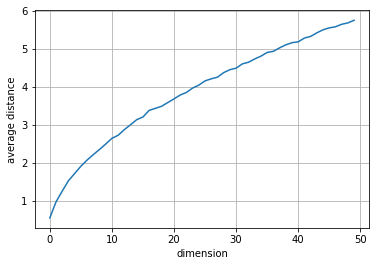

In [1]:
# seed the pseudorandom number generator
import numpy as np
from numpy.random import seed
from numpy.random import rand
import seaborn as sns
import matplotlib.pyplot as plt

N=100
seed(1)
beta=list()
DimList=np.linspace(2,200)


for d in DimList:
    # seed random number generator
    # generate some random numbers
    x=rand(np.int32(d),N)
    y=rand(np.int32(d),N)
    #print(np.shape(x))
    z=np.power(x-y,2)
    #print(np.shape(z))
    beta.append(np.mean(np.sqrt(np.sum(z,axis=0))))


plt.figure
plt.plot(beta)
plt.grid()
plt.xlabel('dimension')
plt.ylabel('average distance')
# reset the seed



## 4. Density of Hypercubes

One interesting question is how much of the $n$-dimensional hypercube can be filled by one inscribed $n$-dimensional hyperball. The volume of an $n$-dimensional hypercube is $V_C(a) = a^n$ where $a$ is the cubes side length. So for one dimension it is $a$, for 2 dimensions (a square) it is $a^2$ and for $n=3$ it is the volume of a cube.


The volume of an $n$-dimensional ball is given by:

$$V_S(r) = r^n \cdot \frac{\pi^{n/2}}{\Gamma (\frac{n}{2} + 1)}$$

\begin{aligned}
n=1: \quad & r \cdot \frac{\sqrt{\pi}}{\Gamma(1.5)} = r \frac{\sqrt{\pi}}{0.5 \Gamma(0.5)} = 2r \\
n=2: \quad & r^2 \cdot \frac{\pi}{\Gamma (2)} = r^2 \frac{\pi}{\Gamma (1)} = r^2 \pi \\
n=3: \quad & r^3 \cdot \frac{\pi^{3/2}}{\Gamma (\frac{5}{2})} = r^3 \frac{\pi^{3/2}}{1.5 \cdot 0.5 \cdot \Gamma (\frac{1}{2})} = r^3 \frac{\pi}{\frac{3}{4}}
\end{aligned}


This means the __percentage of space of a unit hypercube which can be filled by the biggest inscribed hyperball__ is:

\begin{align}
\frac{V_S(0.5)}{V_C(1)}
&= \frac{r^n \frac{\pi^{n/2}}{\Gamma (\frac{n}{2} + 1)}}{1} 
= \frac{0.5^n \pi^{n/2}}{\Gamma (\frac{n}{2} + 1)} \\
&= \frac{0.5^n \pi^{n/2}}{\frac{n}{2} \cdot \Gamma (\frac{n}{2})} 
= \frac{0.5^n \cdot 2 \cdot \pi^{n/2}}{n \cdot \frac{2 \frac{n}{2}!}{n}} \\
&= \frac{0.5^n \cdot \pi^{n/2}}{\frac{n}{2}!}
\end{align}

__You can see that this term goes to zero with increasing dimension. This means most of the volume is not in the center, but in the edges of the $n$ dimensional hypercube. It also means that $k$ nearest neighbors with Euclidean Distance measure will need enormously large spheres to get to the next neighbours__.


## 5. Average Angle

One interesting question is how the average angle between two points (and the origin) changes with higher dimensions. Suppose all points are in the $[0,1]^n$ hypercube.

I thought about this for a while and came to the conclusion that it should be 90° in average due to symmetry. No matter how high the dimension is, because the higer the dimension $n$ becomes, the closer the data is concentrated to the axes.

A short experiment confirms that:

    1 dim: 90.0000 avg angle


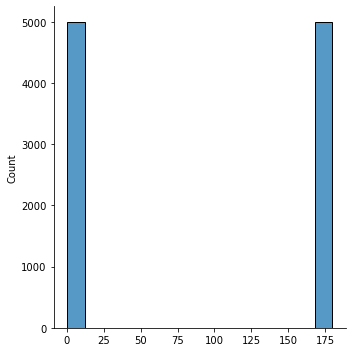

    2 dim: 88.1192 avg angle


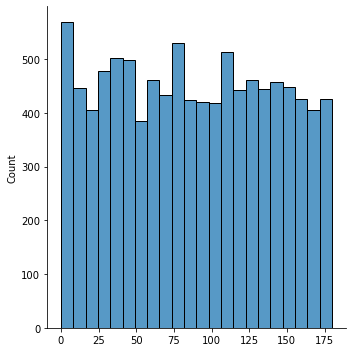

    3 dim: 88.9689 avg angle


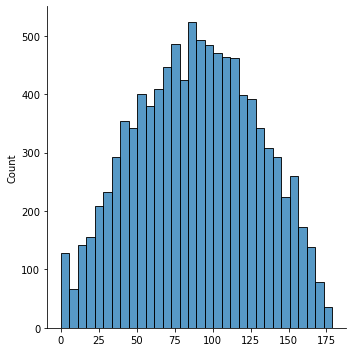

    4 dim: 88.5391 avg angle


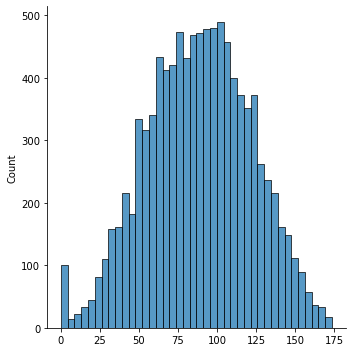

    5 dim: 88.7889 avg angle


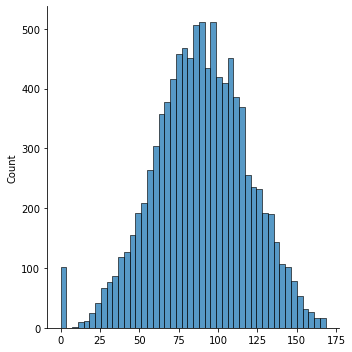

    6 dim: 89.3063 avg angle


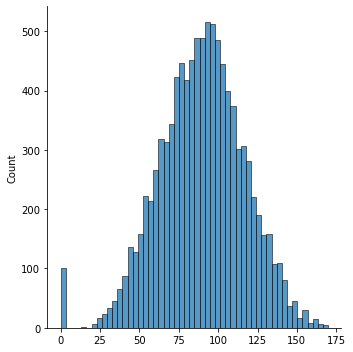

    7 dim: 89.2500 avg angle


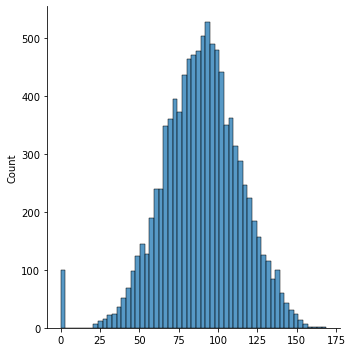

    8 dim: 89.3102 avg angle


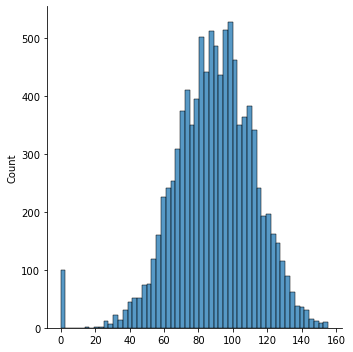

    9 dim: 89.1824 avg angle


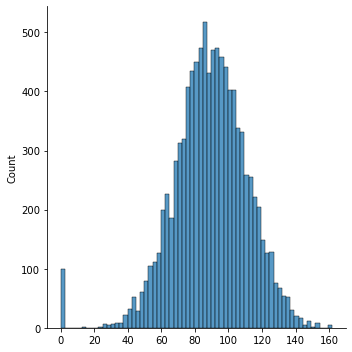

   10 dim: 89.3358 avg angle


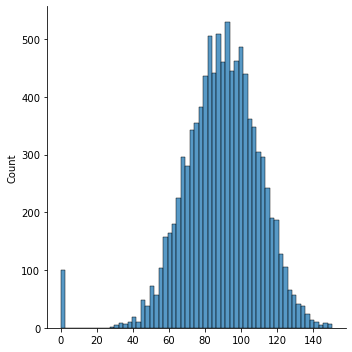

  100 dim: 89.1531 avg angle


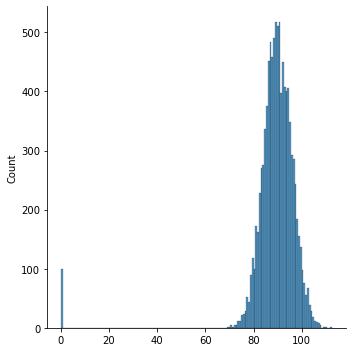

 1000 dim: 89.1088 avg angle


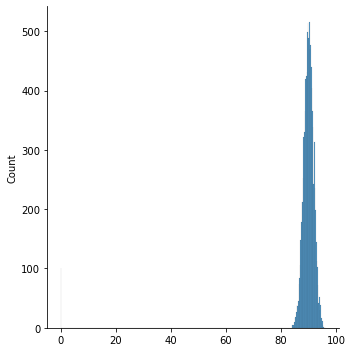

10000 dim: 89.0964 avg angle


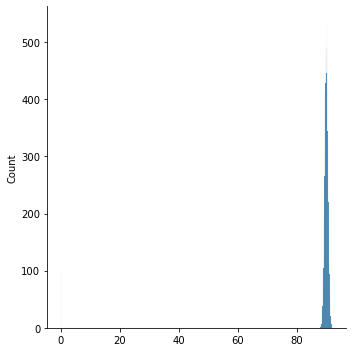

In [2]:

from scipy import spatial
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

def cosine_dist(p1, p2):
    """
    Calculate the cosine distance between to points in R^n.

    Examples
    --------
    >>> cosine_dist([1, 0], [0, 1])
    90.0
    >>> cosine_dist([1, 0], [2, 0])
    0.0
    >>> cosine_dist([1, 0], [-1, 0])
    180.0
    """
    ang = 1 - spatial.distance.cosine(p1, p2)
    if not (-1 <= ang <= 1):
        if ang >= 1:
            return 0
        if ang <= -1:
            return 180
    return np.degrees(np.arccos(ang))


def get_angles(n, num_points=100):
    """Get angles of random points in n-dimensional unit hypercube."""
    points = 2 * np.random.rand(num_points, n) - 1
    angles = []
    for p1 in points:
        for p2 in points:
            angles.append(cosine_dist(p1, p2))
    return angles


if __name__ == "__main__":
    import doctest

    doctest.testmod()
    for n in [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 100, 1000, 10000]:
        angles = get_angles(n)
        print("{:>5} dim: {:0.4f} avg angle".format(n, sum(angles) / len(angles)))
        sns.displot(angles, kde=False, rug=False)
        plt.show()

Sebastian Raschka   
last updated: 02/07/2017  

- Link to the containing GitHub Repository: [https://github.com/rasbt/pattern_classification](https://github.com/rasbt/pattern_classification)  


# Stepping through a Principal Component Analysis
(using Python's `numpy` and `matplotlib`)


### Sections

- <a href="#introduction">Introduction</a>  
- <a href="#sample_data">Generating 3-dimensional sample data</a>
- <a href="#gen_data">The step by step approach</a>
    - 1.&nbsp;<a href="#drop_labels">Taking the whole dataset ignoring the class labels</a>  
    - 2.&nbsp;<a href="#mean_vec">Compute the $d$-dimensional mean vector</a>
    - 3.&nbsp;<a href="#comp_scatter">Computing the scatter matrix (alternatively, the covariance matrix)</a>
    - 4.&nbsp;<a href="#eig_vec">Computing eigenvectors and corresponding eigenvalues</a>
    - 5.&nbsp;<a href="#sort_eig">Ranking and choosing $k$ eigenvectors</a>
    - 6.&nbsp;<a href="#transform">Transforming the samples onto the new subspace</a>
- <a href="#mat_pca">Using the `PCA()` class from the `matplotlib.mlab` library</a>
    - &nbsp;<a href="#diff_mat_pca">Differences between the step by step approach and matplotlib.mlab.PCA()</a>
- <a href="#sklearn_pca">Using the `PCA()` class from the sklearn.decomposition library to confirm our results</a>    

<br>
<a name="introduction"></a>


# Introduction

The main purposes of a principal component analysis are the analysis of data to identify patterns and finding patterns to reduce the dimensions of the dataset with minimal loss of information.

Here, our desired outcome of the principal component analysis is to project a feature space (our dataset consisting of $n$ $d$-dimensional samples) onto a smaller subspace that represents our data "well". A possible application would be a pattern classification task, where we want to reduce the computational costs and the error of parameter estimation by reducing the number of dimensions of our feature space by extracting a subspace that describes our data "best".

### Principal Component Analysis (PCA) Vs. Multiple Discriminant Analysis (MDA)

Both Multiple Discriminant Analysis (MDA) and Principal Component Analysis (PCA) are linear transformation methods and closely related to each other. In PCA, we are interested to find the directions (components) that maximize the variance in our dataset, where in MDA, we are additionally interested to find the directions that maximize the separation (or discrimination) between different classes (for example, in pattern classification problems where our dataset consists of multiple classes. In contrast two PCA, which ignores the class labels).  
***In other words, via PCA, we are projecting the entire set of data (without class labels) onto a different subspace, and in MDA, we are trying to determine a suitable subspace to distinguish between patterns that belong to different classes. Or, roughly speaking in PCA we are trying to find the axes with maximum variances where the data is most spread (within a class, since PCA treats the whole data set as one class), and in MDA we are additionally maximizing the spread between classes. ***  
In typical pattern recognition problems, a PCA is often followed by an MDA.

#### What is a "good" subspace?
Let's assume that our goal is to reduce the dimensions of a $d$-dimensional dataset by projecting it onto a $(k)$-dimensional subspace (where $k\;<\;d$). 
So, how do we know what size we should choose for $k$, and how do we know if we have a feature space that represents our data "well"?  
Later, we will compute eigenvectors (the components) from our data set and collect them in a so-called scatter-matrix (or alternatively calculate them from the covariance matrix). Each of those eigenvectors is associated with an eigenvalue, which tell us about the "length" or "magnitude" of the eigenvectors. If we observe that all the eigenvalues are of very similar magnitude, this is a good indicator that our data is already in a "good" subspace. Or if some of the eigenvalues are much much higher than others, we might be interested in keeping only those eigenvectors with the much larger eigenvalues, since they contain more information about our data distribution. Vice versa, eigenvalues that are close to 0 are less informative and we might consider in dropping those when we construct the new feature subspace.

### Summarizing the PCA approach

Listed below are the 6 general steps for performing a principal component analysis, which we will investigate in the following sections.

1. <a href="#drop_labels"> Take the whole dataset consisting of $d$-dimensional samples ignoring the class labels</a>  
2. <a href="#mean_vec"> Compute the $d$-dimensional mean vector</a> (i.e., the means for every dimension of the whole dataset)
3. <a href="#sc_matrix">Compute the scatter matrix (alternatively, the covariance matrix) of the whole data set</a>
4. <a href="#eig_vec">Compute eigenvectors ($\pmb e_1, \; \pmb e_2, \; ..., \; \pmb e_d $) and corresponding eigenvalues ($\pmb \lambda_1, \; \pmb \lambda_2, \; ..., \; \pmb \lambda_d$)</a>
5. <a href="#sort_eig">Sort the eigenvectors by decreasing eigenvalues and choose $k$ eigenvectors with the largest eigenvalues to form a $d \times k $ dimensional matrix $\pmb W\;$</a>(where every column represents an eigenvector)
6. <a href="#transform">Use this $d \times k $ eigenvector matrix to transform the samples onto the new subspace.</a> This can be summarized by the mathematical equation: $\pmb y = \pmb W^T \times \pmb x$ (where $\pmb x$ is a $d \times 1$-dimensional vector representing one sample, and $\pmb y$ is the transformed $k \times 1$-dimensional sample in the new subspace.)

<br>
<br>
<a name="sample_data"></a>


# Generating some 3-dimensional sample data

For the following example, we will generate $2N=80$ 3-dimensional samples randomly drawn from a multivariate Gaussian distribution.   
Here, we will assume that the samples stem from two different classes, where one half (i.e., N=40) samples of our data set are labeled $\omega_1$ (class 1) and the other half $\omega_2$ (class 2).  

$\pmb{\mu_1} = $
$\begin{bmatrix}0\\0\\0\end{bmatrix}$ 
$\quad\pmb{\mu_2} = $ 
$\begin{bmatrix}1\\1\\1\end{bmatrix}\quad$(sample means)

$\pmb{\Sigma_1} = $
$\begin{bmatrix}1\quad 0\quad 0\\0\quad 1\quad0\\0\quad0\quad1\end{bmatrix}$
$\quad\pmb{\Sigma_2} = $
$\begin{bmatrix}1\quad 0\quad 0\\0\quad 1\quad0\\0\quad0\quad1\end{bmatrix}\quad$ (covariance matrices)

### Why are we chosing a 3-dimensional sample?
The problem of multi-dimensional data is its visualization, which would make it quite tough to follow our example principal component analysis (at least visually). We could also choose a 2-dimensional sample data set for the following examples, but since the goal of the PCA in an "Diminsionality Reduction" application is to drop at least one of the dimensions, I find it more intuitive and visually appealing to start with a 3-dimensional dataset that we reduce to an 2-dimensional dataset by dropping 1 dimension.



In [1]:
import numpy as np

np.random.seed(0)
N=40

mu_vec1 = np.array([0, 0, 0])
cov_mat1 = np.array([[1, 0, 0], [0, 1, 0], [0, 0, 0.1]])
class1_sample = np.random.multivariate_normal(mu_vec1, cov_mat1, N).T
assert class1_sample.shape == (3, N), "The matrix has not the dimensions 3xN"

mu_vec2 = np.array([1, 1, 1])
cov_mat2 = np.array([[1, 0, 0],[0, 1, 0], [0, 0, 0.1]])
class2_sample = np.random.multivariate_normal(mu_vec2, cov_mat2, N).T
assert class2_sample.shape == (3, N), "The matrix has not the dimensions 3xN"

Using the code above, we created two $3\times20$ datasets - one dataset for each class $\omega_1$ and $\omega_2$ -  
where each column can be pictured as a 3-dimensional vector $\pmb x = \begin{pmatrix} x_1 \\ x_2 \\ x_3 \end{pmatrix}$ so that our dataset will have the form  
$\pmb X = \begin{pmatrix} x_{1_1}\; x_{1_2} \; ... \; x_{1_{20}}\\ x_{2_1} \; x_{2_2} \; ... \; x_{2_{20}}\\ x_{3_1} \; x_{3_2} \; ... \; x_{3_{20}}\end{pmatrix}$

Just to get a rough idea how the samples of our two classes $\omega_1$ and $\omega_2$ are distributed, let us plot them in a 3D scatter plot.

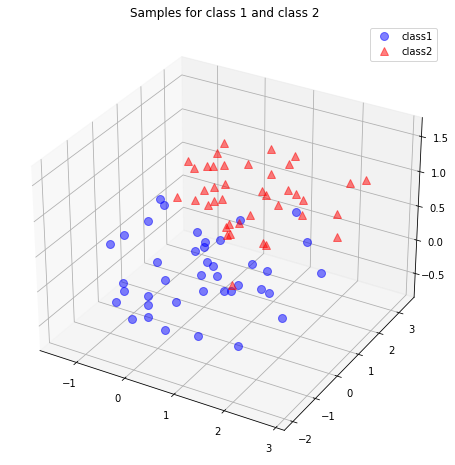

In [2]:
%matplotlib inline

from matplotlib import pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from mpl_toolkits.mplot3d import proj3d

fig = plt.figure(figsize=(8, 8))
ax = fig.add_subplot(111, projection='3d')
plt.rcParams['legend.fontsize'] = 10   
ax.plot(class1_sample[0, :], class1_sample[1, :], 
        class1_sample[2, :], 'o', markersize=8, 
        color='blue', alpha=0.5, label='class1')
ax.plot(class2_sample[0, :], class2_sample[1, :], 
        class2_sample[2, :], '^', markersize=8, 
        alpha=0.5, color='red', label='class2')

plt.title('Samples for class 1 and class 2')
ax.legend(loc='upper right')

plt.show()

<br>
<br>
<a name='drop_labels'></a>

# 1. Taking the whole dataset ignoring the class labels

Because we don't need class labels for the PCA analysis, let us merge the samples for our 2 classes into one $3\times40$-dimensional array.

In [3]:

all_samples = np.concatenate((class1_sample, class2_sample), axis=1)
assert all_samples.shape == (3, 2*N), "The matrix has not the dimensions 3x2N"

<br>
<br>
<a name='mean_vec'></a>

# 2. Computing the d-dimensional mean vector

In [4]:
mean_x = np.mean(all_samples[0, :])
mean_y = np.mean(all_samples[1, :])
mean_z = np.mean(all_samples[2, :])

mean_vector = np.array([[mean_x],[mean_y],[mean_z]])

print('Mean Vector:\n', mean_vector)

Mean Vector:
 [[0.62126397]
 [0.63102898]
 [0.46545201]]


<br>
<br>
<a name="comp_scatter"></a>


# 3. a) Computing the Scatter Matrix $S$

The scatter matrix is computed by the following equation:  
$$S = \sum\limits_{k=1}^n (\pmb x_k - \pmb \mu)\;(\pmb x_k - \pmb \mu)^T$$  
where $\pmb \mu$ is the mean vector  
$$\pmb \mu = \frac{1}{n} \sum\limits_{k=1}^n \; \pmb x_k$$

In [5]:
scatter_matrix = np.zeros((3, 3))
for i in range(all_samples.shape[1]):
    scatter_matrix += (all_samples[:, i].reshape(3, 1)\
                       - mean_vector).dot((all_samples[:, i].reshape(3, 1)
                                           - mean_vector).T)
print('Scatter Matrix:\n', scatter_matrix)

Scatter Matrix:
 [[ 78.84955958   7.16472646  15.00557512]
 [  7.16472646 101.75582353  19.70553213]
 [ 15.00557512  19.70553213  27.3546555 ]]


<br>
<br>
<a name="comp_cov"></a>

# 3. b) Computing the Covariance Matrix $\Sigma=C =\frac{1}{N-1} S$
(alternatively to the scatter matrix)

Alternatively, instead of calculating the scatter matrix, we could also calculate the covariance matrix using the in-built `numpy.cov()` function.  The equations for the covariance matrix and scatter matrix are very similar, the only difference is, that we use the scaling factor $\frac{1}{N-1}$ (here: $\frac{1}{40-1} = \frac{1}{39}$) for the covariance matrix. Thus, their ***eigenspaces*** will be identical (identical eigenvectors, only the eigenvalues are scaled differently by a constant factor).



$\Sigma_i = \Bigg[ 
\begin{array}{cc}
\sigma_{11}^2 & \sigma_{12}^2 & \sigma_{13}^2\\
\sigma_{21}^2 & \sigma_{22}^2 & \sigma_{23}^2\\
\sigma_{31}^2 & \sigma_{32}^2 & \sigma_{33}^2\\
\end{array} \Bigg]$

In [6]:
cov_mat = np.cov([all_samples[0, :], 
                  all_samples[1, :], 
                  all_samples[2, :]])
print('Covariance Matrix:\n', cov_mat)

Covariance Matrix:
 [[0.99809569 0.09069274 0.18994399]
 [0.09069274 1.2880484  0.24943712]
 [0.18994399 0.24943712 0.34626146]]


Scaled Scatter Matrix $S$

In [7]:
scatter_matrix/(N-1)

array([[2.02178358, 0.18371093, 0.38475834],
       [0.18371093, 2.60912368, 0.50527005],
       [0.38475834, 0.50527005, 0.70140142]])

<br>
<br>
<a name="eig_vec"></a>

# 4. Computing eigenvectors and corresponding eigenvalues

To show that the eigenvectors are indeed identical whether we derived them from the scatter or the covariance matrix, let us put an `assert` statement into the code. Also, we will see that the eigenvalues were indeed scaled by the factor 39 when we derived it from the scatter matrix.

In [8]:
# eigenvectors and eigenvalues for the from the scatter matrix
eig_val_sc, eig_vec_sc = np.linalg.eig(scatter_matrix)

# eigenvectors and eigenvalues for the from the covariance matrix
eig_val_cov, eig_vec_cov = np.linalg.eig(cov_mat)

for i in range(len(eig_val_sc)):
    eigvec_sc = eig_vec_sc[:, i].reshape(1, 3).T
    eigvec_cov = eig_vec_cov[:,i].reshape(1, 3).T
    assert eigvec_sc.all() == eigvec_cov.all(), 'Eigenvectors are not identical'
    
    print('Eigenvector {}: \n{}'.format(i+1, eigvec_sc))
    print('Eigenvalue {} from scatter matrix: {}'.format(i+1, eig_val_sc[i]))
    print('Eigenvalue {} from covariance matrix: {}'.format(i+1, eig_val_cov[i]))
    print('Scaling factor: ', eig_val_sc[i]/eig_val_cov[i])
    print(40 * '-')

Eigenvector 1: 
[[ 0.21616489]
 [ 0.20989637]
 [-0.95352832]]
Eigenvalue 1 from scatter matrix: 19.615191401686616
Eigenvalue 1 from covariance matrix: 0.2482935620466663
Scaling factor:  78.99999999999991
----------------------------------------
Eigenvector 2: 
[[-0.91708422]
 [ 0.37874599]
 [-0.12453118]]
Eigenvalue 2 from scatter matrix: 77.928216189408
Eigenvalue 2 from covariance matrix: 0.9864331163216215
Scaling factor:  78.99999999999991
----------------------------------------
Eigenvector 3: 
[[-0.33500638]
 [-0.90138504]
 [-0.27436423]]
Eigenvalue 3 from scatter matrix: 110.41663103073263
Eigenvalue 3 from covariance matrix: 1.397678873806742
Scaling factor:  79.0
----------------------------------------


### Checking the eigenvector-eigenvalue calculation

Let us quickly check that the eigenvector-eigenvalue calculation is correct and satisfy the equation

$\pmb\Sigma\pmb{v} = \lambda\pmb{v}$  

<br>
where  
$\pmb\Sigma = Covariance \; matrix\\
\pmb{v} = \; Eigenvector\\
\lambda = \; Eigenvalue$

In [9]:
for i in range(len(eig_val_sc)):
    eigv = eig_vec_sc[:, i].reshape(1, 3).T
    np.testing.assert_array_almost_equal(scatter_matrix.dot(eigv), eig_val_sc[i] * eigv, 
                                         decimal=6, err_msg='', verbose=True)

### Visualizing the eigenvectors

And before we move on to the next step, just to satisfy our own curiosity, we plot the eigenvectors centered at the sample mean.

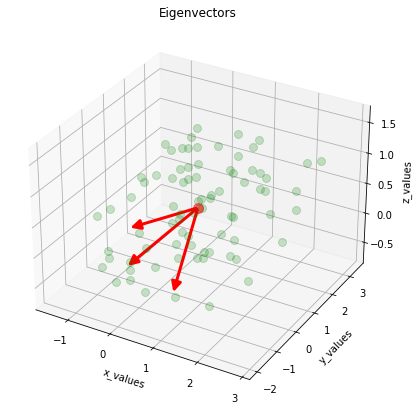

In [10]:
from matplotlib import pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from mpl_toolkits.mplot3d import proj3d
from matplotlib.patches import FancyArrowPatch


class Arrow3D(FancyArrowPatch):
    def __init__(self, xs, ys, zs, *args, **kwargs):
        FancyArrowPatch.__init__(self, (0, 0), (0, 0), *args, **kwargs)
        self._verts3d = xs, ys, zs

    def draw(self, renderer):
        xs3d, ys3d, zs3d = self._verts3d
        xs, ys, zs = proj3d.proj_transform(xs3d, ys3d, zs3d, renderer.M)
        self.set_positions((xs[0], ys[0]), (xs[1],ys[1]))
        FancyArrowPatch.draw(self, renderer)

fig = plt.figure(figsize=(7, 7))
ax = fig.add_subplot(111, projection='3d')

ax.plot(all_samples[0, :], all_samples[1, :], all_samples[2, :], 
        'o', markersize=8, color='green', alpha=0.2)
ax.plot([mean_x], [mean_y], [mean_z], 
        'o', markersize=10, color='red', alpha=0.5)

for v in eig_vec_sc.T:
    a = Arrow3D([mean_x, v[0]], [mean_y, v[1]], 
                [mean_z, v[2]], mutation_scale=20, 
                lw=3, arrowstyle="-|>", color="r")
    ax.add_artist(a)

ax.set_xlabel('x_values')
ax.set_ylabel('y_values')
ax.set_zlabel('z_values')

plt.title('Eigenvectors')

plt.show()

<br>
<br>
<a name="sort_eig"></a>

<a name="sort_eig"></a>
<br>
<br>

# 5.1. Sorting the eigenvectors by decreasing eigenvalues
We started with the goal to reduce the dimensionality of our feature space, i.e., projecting the feature space via PCA onto a smaller subspace, where the eigenvectors will form the axes of this new feature subspace. However, the eigenvectors only define the directions of the new axis, since they have all the same unit length 1, which we can confirm by the following code:

In [11]:
for ev in eig_vec_sc:
    np.testing.assert_array_almost_equal(1.0, np.linalg.norm(ev))
    # instead of 'assert' because of rounding errors

So, in order to decide which eigenvector(s) we want to drop for our lower-dimensional subspace, we have to take a look at the corresponding eigenvalues of the eigenvectors. Roughly speaking, the eigenvectors with the lowest eigenvalues bear the least information about the distribution of the data, and those are the ones we want to drop.  
The common approach is to rank the eigenvectors from highest to lowest corresponding eigenvalue and choose the top $k$ eigenvectors.

In [12]:
# Make a list of (eigenvalue, eigenvector) tuples
eig_pairs = [(np.abs(eig_val_sc[i]), 
              eig_vec_sc[:, i]) for i in range(len(eig_val_sc))]

# Sort the (eigenvalue, eigenvector) tuples from high to low
eig_pairs.sort(key=lambda x: x[0], reverse=True)

# Visually confirm that the list is correctly sorted by decreasing eigenvalues
for i in eig_pairs:
    print(i[0])

110.41663103073263
77.928216189408
19.615191401686616


<br>
<br>


# 5.2. Choosing *k* eigenvectors with the largest eigenvalues
For our simple example, where we are reducing a 3-dimensional feature space to a 2-dimensional feature subspace, we are combining the two eigenvectors with the highest eigenvalues to construct our $d \times k$-dimensional eigenvector matrix $\pmb W$.

In [13]:
matrix_w = np.hstack((eig_pairs[0][1].reshape(3, 1), 
                      eig_pairs[1][1].reshape(3, 1)))
print('Matrix W:\n', matrix_w)

Matrix W:
 [[-0.33500638 -0.91708422]
 [-0.90138504  0.37874599]
 [-0.27436423 -0.12453118]]


<br>
<br>
<a name='transform'></a>

# 6. Transforming the samples onto the new subspace
In the last step, we use the $2 \times 3$-dimensional matrix $\pmb W$ that we just computed to transform our samples onto the new subspace via the equation  $\pmb y = \pmb W^T \times \pmb x$.

In [14]:
transformed = matrix_w.T.dot(all_samples)
assert transformed.shape == (2, 2*N), "The matrix is not 2x40 dimensional."

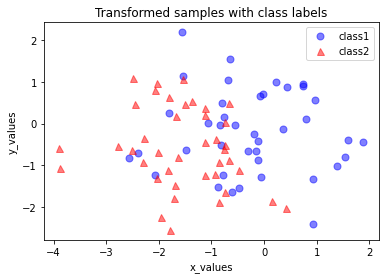

In [15]:
plt.plot(transformed[0, 0:N], transformed[1, 0:N], 
         'o', markersize=7, color='blue', 
         alpha=0.5, label='class1')
plt.plot(transformed[0, N:2*N], transformed[1, N:2*N], '^', 
         markersize=7, color='red', alpha=0.5, label='class2')

plt.xlabel('x_values')
plt.ylabel('y_values')
plt.legend()
plt.title('Transformed samples with class labels')

plt.show()

<br>
<br>
<a name="mat_pca"></a>


# Using the PCA() class from the sklearn.decomposition library to confirm our results

In order to make sure that we have not made a mistake in our step by step approach, we will use another library that doesn't rescale the input data by default.  
Here, we will use the PCA class from the `scikit-learn` machine-learning library. The documentation can be found here:  
[http://scikit-learn.org/stable/modules/generated/sklearn.decomposition.PCA.html](http://scikit-learn.org/stable/modules/generated/sklearn.decomposition.PCA.html).  

For our convenience, we can directly specify to how many components we want to reduce our input dataset via the `n_components` parameter. 

Next, we just need to use the `.fit_transform()` in order to perform the dimensionality reduction.

In [16]:
np.shape(all_samples)

(3, 80)

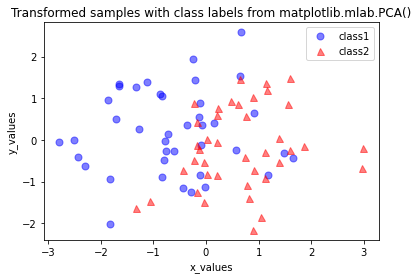

In [17]:
from sklearn.decomposition import PCA as sklearnPCA

sklearn_pca = sklearnPCA(n_components=2, svd_solver='full')
sklearn_transf = sklearn_pca.fit_transform(all_samples.T)

plt.plot(sklearn_transf[0:N, 0],sklearn_transf[0:N, 1], 
         'o', markersize=7, color='blue', alpha=0.5, label='class1')
plt.plot(sklearn_transf[N:2*N, 0], sklearn_transf[N:2*N, 1], 
         '^', markersize=7, color='red', alpha=0.5, label='class2')

plt.xlabel('x_values')
plt.ylabel('y_values')

plt.legend()
plt.title('Transformed samples with class labels from matplotlib.mlab.PCA()')

plt.show()

Depending on your computing environmnent, you may find that the plot above is the exact mirror image of the plot from out step by step approach. This is due to the fact that the signs of the eigenvectors can be either positive or negative, since the eigenvectors are scaled to the unit length 1, both we can simply multiply the transformed data by $\times(-1)$ to revert the mirror image.

Please note that this is not an issue: If $v$ is an eigenvector of a matrix $\Sigma$, we have,

$$\Sigma v = \lambda v,$$

where $\lambda$ is our eigenvalue. Then $-v$ is also an eigenvector that has the same eigenvalue, since

$$\Sigma(-v) = -\Sigma v = -\lambda v = \lambda(-v).$$

Also, see the note in the scikit-learn documentation:

> __Due to implementation subtleties of the Singular Value Decomposition (SVD), which is used in this implementation, running fit twice on the same matrix can lead to principal components with signs flipped (change in direction). For this reason, it is important to always use the same estimator object to transform data in a consistent fashion.__

(http://scikit-learn.org/stable/modules/generated/sklearn.decomposition.PCA.html)

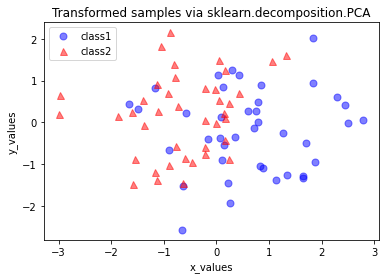

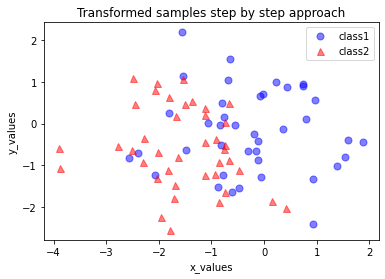

In [18]:
# sklearn.decomposition.PCA

sklearn_transf *= (-1) 

plt.plot(sklearn_transf[0:N, 0], sklearn_transf[0:N, 1] , 'o', 
         markersize=7, color='blue', alpha=0.5, label='class1')
plt.plot(sklearn_transf[N:2*N, 0], sklearn_transf[N:2*N, 1] , '^',
         markersize=7, color='red', alpha=0.5, label='class2')
plt.xlabel('x_values')
plt.ylabel('y_values')
plt.legend()
plt.title('Transformed samples via sklearn.decomposition.PCA')
plt.show()

# step by step PCA
plt.plot(transformed[0, 0:N], transformed[1, 0:N], 
         'o', markersize=7, color='blue', alpha=0.5, label='class1')
plt.plot(transformed[0, N:2*N], transformed[1, N:2*N], 
         '^', markersize=7, color='red', alpha=0.5, label='class2')

plt.xlabel('x_values')
plt.ylabel('y_values')
plt.legend()
plt.title('Transformed samples step by step approach')
plt.show()

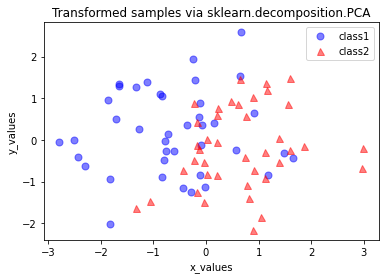

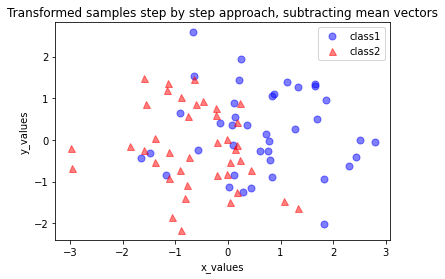

In [19]:
# sklearn.decomposition.PCA

sklearn_transf *= (-1) 

plt.plot(sklearn_transf[0:N, 0], sklearn_transf[0:N, 1] , 'o', 
         markersize=7, color='blue', alpha=0.5, label='class1')
plt.plot(sklearn_transf[N:2*N, 0], sklearn_transf[N:2*N, 1] , '^',
         markersize=7, color='red', alpha=0.5, label='class2')
plt.xlabel('x_values')
plt.ylabel('y_values')
plt.legend()
plt.title('Transformed samples via sklearn.decomposition.PCA')
plt.show()

# step by step PCA

transformed = matrix_w.T.dot(all_samples - mean_vector)

plt.plot(transformed[0, 0:N], transformed[1, 0:N], 
         'o', markersize=7, color='blue', alpha=0.5, label='class1')
plt.plot(transformed[0, N:2*N], transformed[1, N:2*N], 
         '^', markersize=7, color='red', alpha=0.5, label='class2')

plt.xlabel('x_values')
plt.ylabel('y_values')
plt.legend()
plt.title('Transformed samples step by step approach, subtracting mean vectors')
plt.show()

<img src="ost_logo.png" width="240" height="240" align="right"/>
<div style="text-align: left"> <b> Machine Learning </b> <br> MSE FTP MachLe <br> 
<a href="mailto:christoph.wuersch@ost.ch"> Christoph Würsch </a> </div>



# V11 Dimensionality Reduction (TSM_MachLE)
## Comparison of different methods

- Author: Christoph Würsch
- MSE TSM_MachLe

based on a Jupyter notebook by Aurelien Géron


# Setup

First, let's make sure this notebook works well in both python 2 and 3, import a few common modules, ensure MatplotLib plots figures inline and prepare a function to save the figures:

In [1]:
# To support both python 2 and python 3
from __future__ import division, print_function, unicode_literals

# Common imports
import numpy as np
import os

# to make this notebook's output stable across runs
np.random.seed(42)

# To plot pretty figures
%matplotlib inline
import matplotlib
import matplotlib.pyplot as plt
plt.rcParams['axes.labelsize'] = 14
plt.rcParams['xtick.labelsize'] = 12
plt.rcParams['ytick.labelsize'] = 12


Generate a 3D dataset:

In [2]:
np.random.seed(4)
m = 60
w1, w2 = 0.1, 0.3
noise = 0.1

angles = np.random.rand(m) * 3 * np.pi / 2 - 0.5
X = np.empty((m, 3))
X[:, 0] = np.cos(angles) + np.sin(angles)/2 + noise * np.random.randn(m) / 2
X[:, 1] = np.sin(angles) * 0.7 + noise * np.random.randn(m) / 2
X[:, 2] = X[:, 0] * w1 + X[:, 1] * w2 + noise * np.random.randn(m)

## PCA using Scikit-Learn

With Scikit-Learn, PCA is really trivial. It even takes care of mean centering for you:

In [3]:
from sklearn.decomposition import PCA

pca = PCA(n_components = 2)
X2D = pca.fit_transform(X)

In [4]:
X2D[:5]

array([[ 1.26203346,  0.42067648],
       [-0.08001485, -0.35272239],
       [ 1.17545763,  0.36085729],
       [ 0.89305601, -0.30862856],
       [ 0.73016287, -0.25404049]])

In [5]:
X3D_inv = pca.inverse_transform(X2D)

Of course, there was some loss of information during the projection step, so the recovered 3D points are not exactly equal to the original 3D points:

In [6]:
np.allclose(X3D_inv, X)

False

We can compute the reconstruction error:

In [7]:
np.mean(np.sum(np.square(X3D_inv - X), axis=1))

0.010170337792848549

The `PCA` object gives access to the principal components that it computed:

In [8]:
pca.components_

array([[-0.93636116, -0.29854881, -0.18465208],
       [ 0.34027485, -0.90119108, -0.2684542 ]])

Now let's look at the explained variance ratio:

In [9]:
pca.explained_variance_ratio_

array([0.84248607, 0.14631839])

The first dimension explains 84.2% of the variance, while the second explains 14.6%.

By projecting down to 2D, we lost about 1.1% of the variance:

In [10]:
1 - pca.explained_variance_ratio_.sum()

0.011195535570688975

Next, let's generate some nice figures! :)

Utility class to draw 3D arrows (copied from http://stackoverflow.com/questions/11140163)

In [11]:
from matplotlib.patches import FancyArrowPatch
from mpl_toolkits.mplot3d import proj3d

class Arrow3D(FancyArrowPatch):
    def __init__(self, xs, ys, zs, *args, **kwargs):
        FancyArrowPatch.__init__(self, (0,0), (0,0), *args, **kwargs)
        self._verts3d = xs, ys, zs

    def draw(self, renderer):
        xs3d, ys3d, zs3d = self._verts3d
        xs, ys, zs = proj3d.proj_transform(xs3d, ys3d, zs3d, renderer.M)
        self.set_positions((xs[0],ys[0]),(xs[1],ys[1]))
        FancyArrowPatch.draw(self, renderer)

Express the plane as a function of x and y.

In [12]:
axes = [-1.8, 1.8, -1.3, 1.3, -1.0, 1.0]

x1s = np.linspace(axes[0], axes[1], 10)
x2s = np.linspace(axes[2], axes[3], 10)
x1, x2 = np.meshgrid(x1s, x2s)

C = pca.components_
R = C.T.dot(C)
z = (R[0, 2] * x1 + R[1, 2] * x2) / (1 - R[2, 2])

Plot the 3D dataset, the plane and the projections on that plane.

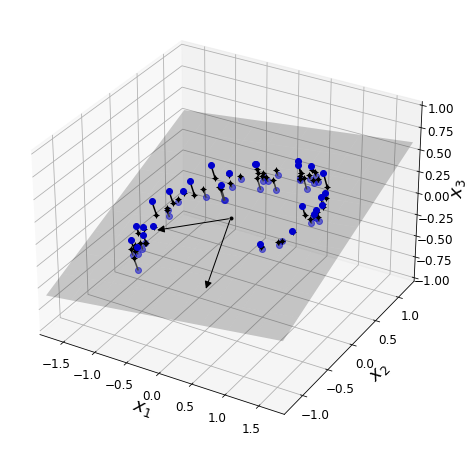

<Figure size 432x288 with 0 Axes>

In [13]:
from mpl_toolkits.mplot3d import Axes3D

fig = plt.figure(figsize=(8, 8))
ax = fig.add_subplot(111, projection='3d')

X3D_above = X[X[:, 2] > X3D_inv[:, 2]]
X3D_below = X[X[:, 2] <= X3D_inv[:, 2]]

ax.plot(X3D_below[:, 0], X3D_below[:, 1], X3D_below[:, 2], "bo", alpha=0.5)

ax.plot_surface(x1, x2, z, alpha=0.2, color="k")
np.linalg.norm(C, axis=0)
ax.add_artist(Arrow3D([0, C[0, 0]],[0, C[0, 1]],[0, C[0, 2]], mutation_scale=15, lw=1, arrowstyle="-|>", color="k"))
ax.add_artist(Arrow3D([0, C[1, 0]],[0, C[1, 1]],[0, C[1, 2]], mutation_scale=15, lw=1, arrowstyle="-|>", color="k"))
ax.plot([0], [0], [0], "k.")

for i in range(m):
    if X[i, 2] > X3D_inv[i, 2]:
        ax.plot([X[i][0], X3D_inv[i][0]], [X[i][1], X3D_inv[i][1]], [X[i][2], X3D_inv[i][2]], "k-")
    else:
        ax.plot([X[i][0], X3D_inv[i][0]], [X[i][1], X3D_inv[i][1]], [X[i][2], X3D_inv[i][2]], "k-", color="#505050")
    
ax.plot(X3D_inv[:, 0], X3D_inv[:, 1], X3D_inv[:, 2], "k+")
ax.plot(X3D_inv[:, 0], X3D_inv[:, 1], X3D_inv[:, 2], "k.")
ax.plot(X3D_above[:, 0], X3D_above[:, 1], X3D_above[:, 2], "bo")
ax.set_xlabel("$x_1$", fontsize=18)
ax.set_ylabel("$x_2$", fontsize=18)
ax.set_zlabel("$x_3$", fontsize=18)
ax.set_xlim(axes[0:2])
ax.set_ylim(axes[2:4])
ax.set_zlim(axes[4:6])

plt.show()
plt.savefig('PCA-demo.pdf')

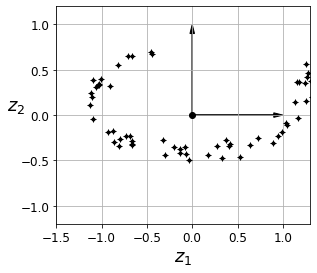

In [14]:
fig = plt.figure()
ax = fig.add_subplot(111, aspect='equal')

ax.plot(X2D[:, 0], X2D[:, 1], "k+")
ax.plot(X2D[:, 0], X2D[:, 1], "k.")
ax.plot([0], [0], "ko")
ax.arrow(0, 0, 0, 1, head_width=0.05, length_includes_head=True, head_length=0.1, fc='k', ec='k')
ax.arrow(0, 0, 1, 0, head_width=0.05, length_includes_head=True, head_length=0.1, fc='k', ec='k')
ax.set_xlabel("$z_1$", fontsize=18)
ax.set_ylabel("$z_2$", fontsize=18, rotation=0)
ax.axis([-1.5, 1.3, -1.2, 1.2])
ax.grid(True)
plt.savefig('PCA-demo_2D.pdf')

# Manifold learning
Swiss roll:

In [15]:
from sklearn.datasets import make_swiss_roll
X, t = make_swiss_roll(n_samples=1000, noise=0.2, random_state=42)

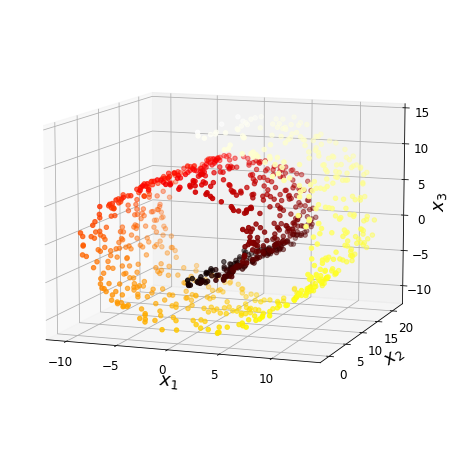

In [16]:
axes = [-11.5, 14, -2, 23, -12, 15]

fig = plt.figure(figsize=(8, 8))
ax = fig.add_subplot(111, projection='3d')

ax.scatter(X[:, 0], X[:, 1], X[:, 2], c=t, cmap=plt.cm.hot)
ax.view_init(10, -70)
ax.set_xlabel("$x_1$", fontsize=18)
ax.set_ylabel("$x_2$", fontsize=18)
ax.set_zlabel("$x_3$", fontsize=18)
ax.set_xlim(axes[0:2])
ax.set_ylim(axes[2:4])
ax.set_zlim(axes[4:6])

plt.savefig('SwissRoll.pdf')
plt.show()

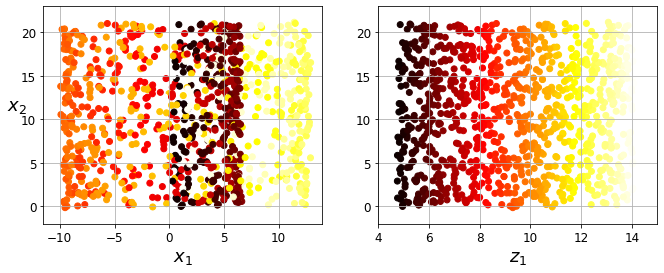

In [17]:
plt.figure(figsize=(11, 4))

plt.subplot(121)
plt.scatter(X[:, 0], X[:, 1], c=t, cmap=plt.cm.hot)
plt.axis(axes[:4])
plt.xlabel("$x_1$", fontsize=18)
plt.ylabel("$x_2$", fontsize=18, rotation=0)
plt.grid(True)

plt.subplot(122)
plt.scatter(t, X[:, 1], c=t, cmap=plt.cm.hot)
plt.axis([4, 15, axes[2], axes[3]])
plt.xlabel("$z_1$", fontsize=18)
plt.grid(True)

plt.savefig('squished_swiss_roll_plot.pdf')
plt.show()

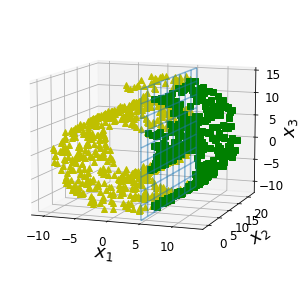

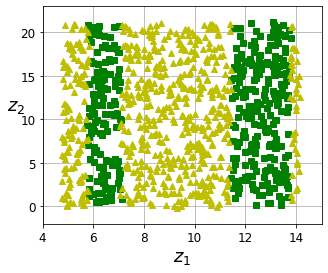

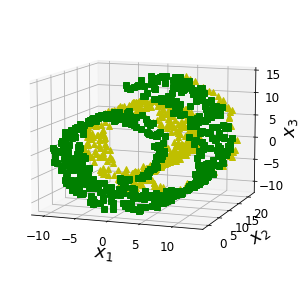

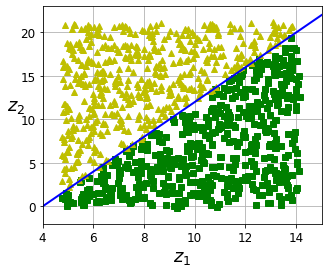

In [18]:
from matplotlib import gridspec

axes = [-11.5, 14, -2, 23, -12, 15]

x2s = np.linspace(axes[2], axes[3], 10)
x3s = np.linspace(axes[4], axes[5], 10)
x2, x3 = np.meshgrid(x2s, x3s)

fig = plt.figure(figsize=(6, 5))
ax = plt.subplot(111, projection='3d')

positive_class = X[:, 0] > 5
X_pos = X[positive_class]
X_neg = X[~positive_class]
ax.view_init(10, -70)
ax.plot(X_neg[:, 0], X_neg[:, 1], X_neg[:, 2], "y^")
ax.plot_wireframe(5, x2, x3, alpha=0.5)
ax.plot(X_pos[:, 0], X_pos[:, 1], X_pos[:, 2], "gs")
ax.set_xlabel("$x_1$", fontsize=18)
ax.set_ylabel("$x_2$", fontsize=18)
ax.set_zlabel("$x_3$", fontsize=18)
ax.set_xlim(axes[0:2])
ax.set_ylim(axes[2:4])
ax.set_zlim(axes[4:6])

plt.savefig('manifold_decision_boundary_1.pdf')
plt.show()

fig = plt.figure(figsize=(5, 4))
ax = plt.subplot(111)

plt.plot(t[positive_class], X[positive_class, 1], "gs")
plt.plot(t[~positive_class], X[~positive_class, 1], "y^")
plt.axis([4, 15, axes[2], axes[3]])
plt.xlabel("$z_1$", fontsize=18)
plt.ylabel("$z_2$", fontsize=18, rotation=0)
plt.grid(True)

plt.savefig('manifold_decision_boundary_2.pdf')
plt.show()

fig = plt.figure(figsize=(6, 5))
ax = plt.subplot(111, projection='3d')

positive_class = 2 * (t[:] - 4) > X[:, 1]
X_pos = X[positive_class]
X_neg = X[~positive_class]
ax.view_init(10, -70)
ax.plot(X_neg[:, 0], X_neg[:, 1], X_neg[:, 2], "y^")
ax.plot(X_pos[:, 0], X_pos[:, 1], X_pos[:, 2], "gs")
ax.set_xlabel("$x_1$", fontsize=18)
ax.set_ylabel("$x_2$", fontsize=18)
ax.set_zlabel("$x_3$", fontsize=18)
ax.set_xlim(axes[0:2])
ax.set_ylim(axes[2:4])
ax.set_zlim(axes[4:6])

plt.savefig('manifold_decision_boundary_3.pdf')
plt.show()

fig = plt.figure(figsize=(5, 4))
ax = plt.subplot(111)

plt.plot(t[positive_class], X[positive_class, 1], "gs")
plt.plot(t[~positive_class], X[~positive_class, 1], "y^")
plt.plot([4, 15], [0, 22], "b-", linewidth=2)
plt.axis([4, 15, axes[2], axes[3]])
plt.xlabel("$z_1$", fontsize=18)
plt.ylabel("$z_2$", fontsize=18, rotation=0)
plt.grid(True)

plt.savefig('manifold_decision_boundary_4.pdf')
plt.show()

# PCA

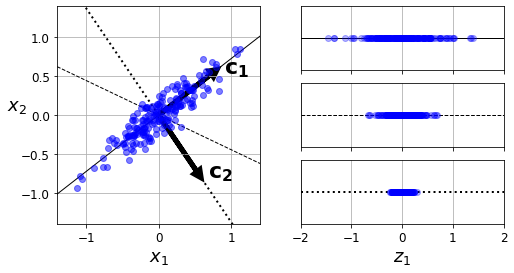

In [19]:
angle = np.pi / 5
stretch = 5
m = 200

np.random.seed(3)
X = np.random.randn(m, 2) / 10
X = X.dot(np.array([[stretch, 0],[0, 1]])) # stretch
X = X.dot([[np.cos(angle), np.sin(angle)], [-np.sin(angle), np.cos(angle)]]) # rotate

u1 = np.array([np.cos(angle), np.sin(angle)])
u2 = np.array([np.cos(angle - 2 * np.pi/6), np.sin(angle - 2 * np.pi/6)])
u3 = np.array([np.cos(angle - np.pi/2), np.sin(angle - np.pi/2)])

X_proj1 = X.dot(u1.reshape(-1, 1))
X_proj2 = X.dot(u2.reshape(-1, 1))
X_proj3 = X.dot(u3.reshape(-1, 1))

plt.figure(figsize=(8,4))
plt.subplot2grid((3,2), (0, 0), rowspan=3)
plt.plot([-1.4, 1.4], [-1.4*u1[1]/u1[0], 1.4*u1[1]/u1[0]], "k-", linewidth=1)
plt.plot([-1.4, 1.4], [-1.4*u2[1]/u2[0], 1.4*u2[1]/u2[0]], "k--", linewidth=1)
plt.plot([-1.4, 1.4], [-1.4*u3[1]/u3[0], 1.4*u3[1]/u3[0]], "k:", linewidth=2)
plt.plot(X[:, 0], X[:, 1], "bo", alpha=0.5)
plt.axis([-1.4, 1.4, -1.4, 1.4])
plt.arrow(0, 0, u1[0], u1[1], head_width=0.1, linewidth=5, length_includes_head=True, head_length=0.1, fc='k', ec='k')
plt.arrow(0, 0, u3[0], u3[1], head_width=0.1, linewidth=5, length_includes_head=True, head_length=0.1, fc='k', ec='k')
plt.text(u1[0] + 0.1, u1[1] - 0.05, r"$\mathbf{c_1}$", fontsize=22)
plt.text(u3[0] + 0.1, u3[1], r"$\mathbf{c_2}$", fontsize=22)
plt.xlabel("$x_1$", fontsize=18)
plt.ylabel("$x_2$", fontsize=18, rotation=0)
plt.grid(True)

plt.subplot2grid((3,2), (0, 1))
plt.plot([-2, 2], [0, 0], "k-", linewidth=1)
plt.plot(X_proj1[:, 0], np.zeros(m), "bo", alpha=0.3)
plt.gca().get_yaxis().set_ticks([])
plt.gca().get_xaxis().set_ticklabels([])
plt.axis([-2, 2, -1, 1])
plt.grid(True)

plt.subplot2grid((3,2), (1, 1))
plt.plot([-2, 2], [0, 0], "k--", linewidth=1)
plt.plot(X_proj2[:, 0], np.zeros(m), "bo", alpha=0.3)
plt.gca().get_yaxis().set_ticks([])
plt.gca().get_xaxis().set_ticklabels([])
plt.axis([-2, 2, -1, 1])
plt.grid(True)

plt.subplot2grid((3,2), (2, 1))
plt.plot([-2, 2], [0, 0], "k:", linewidth=2)
plt.plot(X_proj3[:, 0], np.zeros(m), "bo", alpha=0.3)
plt.gca().get_yaxis().set_ticks([])
plt.axis([-2, 2, -1, 1])
plt.xlabel("$z_1$", fontsize=18)
plt.grid(True)

plt.savefig('pca_best_projection.pdf')
plt.show()

# Kernel PCA

In [20]:
X, t = make_swiss_roll(n_samples=1000, noise=0.2, random_state=42)

In [21]:
from sklearn.decomposition import KernelPCA

rbf_pca = KernelPCA(n_components = 2, kernel="rbf", gamma=0.04)
X_reduced = rbf_pca.fit_transform(X)

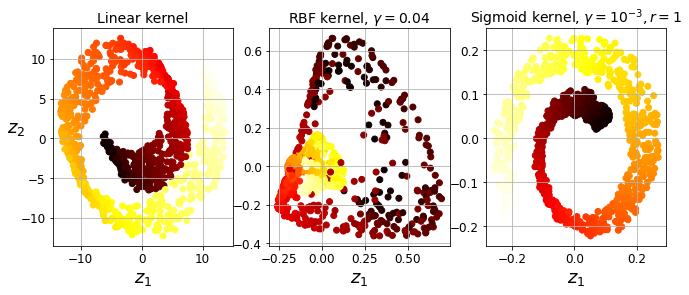

In [22]:
from sklearn.decomposition import KernelPCA

lin_pca = KernelPCA(n_components = 2, kernel="linear", fit_inverse_transform=True)
rbf_pca = KernelPCA(n_components = 2, kernel="rbf", gamma=0.0433, fit_inverse_transform=True)
sig_pca = KernelPCA(n_components = 2, kernel="sigmoid", gamma=0.001, coef0=1, fit_inverse_transform=True)

y = t > 6.9

plt.figure(figsize=(11, 4))
for subplot, pca, title in ((131, lin_pca, "Linear kernel"), (132, rbf_pca, "RBF kernel, $\gamma=0.04$"), (133, sig_pca, "Sigmoid kernel, $\gamma=10^{-3}, r=1$")):
    X_reduced = pca.fit_transform(X)
    if subplot == 132:
        X_reduced_rbf = X_reduced
    
    plt.subplot(subplot)
    #plt.plot(X_reduced[y, 0], X_reduced[y, 1], "gs")
    #plt.plot(X_reduced[~y, 0], X_reduced[~y, 1], "y^")
    plt.title(title, fontsize=14)
    plt.scatter(X_reduced[:, 0], X_reduced[:, 1], c=t, cmap=plt.cm.hot)
    plt.xlabel("$z_1$", fontsize=18)
    if subplot == 131:
        plt.ylabel("$z_2$", fontsize=18, rotation=0)
    plt.grid(True)

plt.savefig('kernel_pca_plot.pdf')
plt.show()

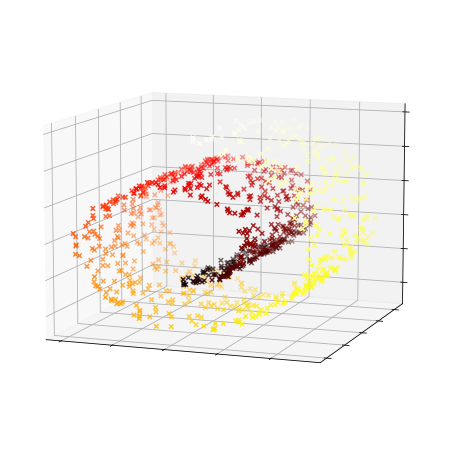

In [23]:
plt.figure(figsize=(8,8))

X_inverse = pca.inverse_transform(X_reduced_rbf)

ax = plt.subplot(111, projection='3d')
ax.view_init(10, -70)
ax.scatter(X_inverse[:, 0], X_inverse[:, 1], X_inverse[:, 2], c=t, cmap=plt.cm.hot, marker="x")
ax.set_xlabel("")
ax.set_ylabel("")
ax.set_zlabel("")
ax.set_xticklabels([])
ax.set_yticklabels([])
ax.set_zticklabels([])

plt.savefig('preimage_plot.pdf')
plt.show()

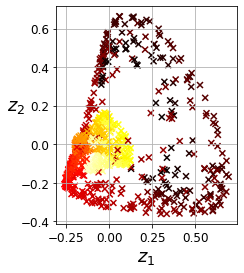

In [24]:
X_reduced = rbf_pca.fit_transform(X)

plt.figure(figsize=(11, 4))
plt.subplot(132)
plt.scatter(X_reduced[:, 0], X_reduced[:, 1], c=t, cmap=plt.cm.hot, marker="x")
plt.xlabel("$z_1$", fontsize=18)
plt.ylabel("$z_2$", fontsize=18, rotation=0)
plt.grid(True)

In [25]:
from sklearn.model_selection import GridSearchCV
from sklearn.linear_model import LogisticRegression
from sklearn.pipeline import Pipeline

clf = Pipeline([
        ("kpca", KernelPCA(n_components=2)),
        ("log_reg", LogisticRegression(solver='lbfgs'))
    ])

param_grid = [{
        "kpca__gamma": np.linspace(0.03, 0.05, 10),
        "kpca__kernel": ["rbf", "sigmoid"]
    }]

grid_search = GridSearchCV(clf, param_grid, cv=3)
grid_search.fit(X, y)

GridSearchCV(cv=3,
             estimator=Pipeline(steps=[('kpca', KernelPCA(n_components=2)),
                                       ('log_reg', LogisticRegression())]),
             param_grid=[{'kpca__gamma': array([0.03      , 0.03222222, 0.03444444, 0.03666667, 0.03888889,
       0.04111111, 0.04333333, 0.04555556, 0.04777778, 0.05      ]),
                          'kpca__kernel': ['rbf', 'sigmoid']}])

In [26]:
print(grid_search.best_params_)

{'kpca__gamma': 0.043333333333333335, 'kpca__kernel': 'rbf'}


In [27]:
rbf_pca = KernelPCA(n_components = 2, kernel="rbf", gamma=0.0433,
                    fit_inverse_transform=True)
X_reduced = rbf_pca.fit_transform(X)
X_preimage = rbf_pca.inverse_transform(X_reduced)

In [28]:
from sklearn.metrics import mean_squared_error

mean_squared_error(X, X_preimage)

1.0310956343208902e-26

# LLE

In [29]:
X, t = make_swiss_roll(n_samples=1000, noise=0.2, random_state=41)

In [30]:
from sklearn.manifold import LocallyLinearEmbedding

lle = LocallyLinearEmbedding(n_components=2, n_neighbors=10, random_state=42)
X_reduced = lle.fit_transform(X)

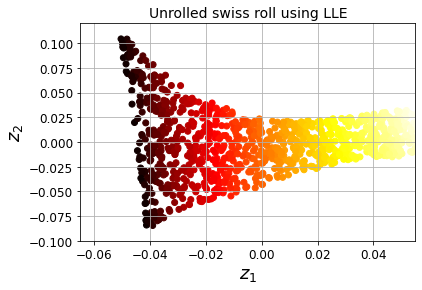

In [31]:
plt.title("Unrolled swiss roll using LLE", fontsize=14)
plt.scatter(X_reduced[:, 0], X_reduced[:, 1], c=t, cmap=plt.cm.hot)
plt.xlabel("$z_1$", fontsize=18)
plt.ylabel("$z_2$", fontsize=18)
plt.axis([-0.065, 0.055, -0.1, 0.12])
plt.grid(True)

plt.savefig('lle_unrolling_plot.pdf')
plt.show()

# MDS, Isomap and t-SNE

In [32]:
from sklearn.manifold import MDS

mds = MDS(n_components=2, random_state=42)
X_reduced_mds = mds.fit_transform(X)

In [33]:
from sklearn.manifold import Isomap

isomap = Isomap(n_components=2)
X_reduced_isomap = isomap.fit_transform(X)

In [34]:
from sklearn.manifold import TSNE

tsne = TSNE(n_components=2, random_state=42)
X_reduced_tsne = tsne.fit_transform(X)

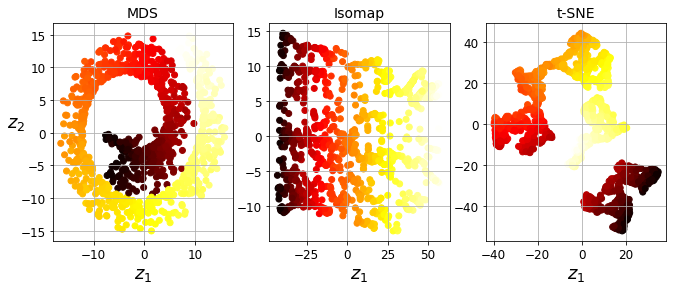

In [35]:
titles = ["MDS", "Isomap", "t-SNE"]

plt.figure(figsize=(11,4))

for subplot, title, X_reduced in zip((131, 132, 133), titles,
                                     (X_reduced_mds, X_reduced_isomap, X_reduced_tsne)):
    plt.subplot(subplot)
    plt.title(title, fontsize=14)
    plt.scatter(X_reduced[:, 0], X_reduced[:, 1], c=t, cmap=plt.cm.hot)
    plt.xlabel("$z_1$", fontsize=18)
    if subplot == 131:
        plt.ylabel("$z_2$", fontsize=18, rotation=0)
    plt.grid(True)

plt.savefig('other_dim_reduction_plot.pdf')
plt.show()

<img src="ost_logo.png" width="240" height="240" align="right"/>
<div style="text-align: left"> <b> Machine Learning </b> <br> MSE FTP MachLe <br> 
<a href="mailto:christoph.wuersch@ost.ch"> Christoph Würsch </a> </div>

#  Lab 11, A0 Principal Component Analysis

Up until now, we have been looking in depth at supervised learning estimators: those estimators that predict labels based on labeled training data.
Here we begin looking at several unsupervised estimators, which can highlight interesting aspects of the data without reference to any known labels.

In this section, we explore what is perhaps one of the most broadly used of unsupervised algorithms, principal component analysis (PCA).
PCA is fundamentally a dimensionality reduction algorithm, but it can also be useful as a tool for visualization, for noise filtering, for feature extraction and engineering, and much more.
After a brief conceptual discussion of the PCA algorithm, we will see a couple examples of these further applications.

We begin with the standard imports:

In [1]:
%matplotlib inline
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns; sns.set()

## Introducing Principal Component Analysis

Principal component analysis is a fast and flexible unsupervised method for dimensionality reduction in data, which we saw briefly in [Introducing Scikit-Learn](05.02-Introducing-Scikit-Learn.ipynb).
Its behavior is easiest to visualize by looking at a two-dimensional dataset.
Consider the following 200 points:

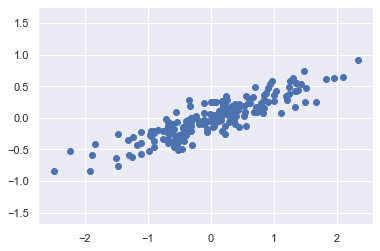

In [2]:
rng = np.random.RandomState(1)
X = np.dot(rng.rand(2, 2), rng.randn(2, 200)).T
plt.scatter(X[:, 0], X[:, 1])
plt.axis('equal');

By eye, it is clear that there is a nearly linear relationship between the x and y variables.
This is reminiscent of the linear regression data, but the problem setting here is slightly different: rather than attempting to *predict* the y values from the x values, the unsupervised learning problem attempts to learn about the *relationship* between the x and y values.

In principal component analysis, this relationship is quantified by finding a list of the *principal axes* in the data, and using those axes to describe the dataset.
Using Scikit-Learn's ``PCA`` estimator, we can compute this as follows:

In [3]:
from sklearn.decomposition import PCA
pca = PCA(n_components=2)
pca.fit(X)

PCA(n_components=2)

The fit learns some quantities from the data, most importantly the "components" and "explained variance":

In [4]:
print(pca.components_)

[[-0.94446029 -0.32862557]
 [-0.32862557  0.94446029]]


In [5]:
print(pca.explained_variance_)

[0.7625315 0.0184779]


To see what these numbers mean, let's visualize them as vectors over the input data, using the "components" to define the direction of the vector, and the "explained variance" to define the squared-length of the vector:

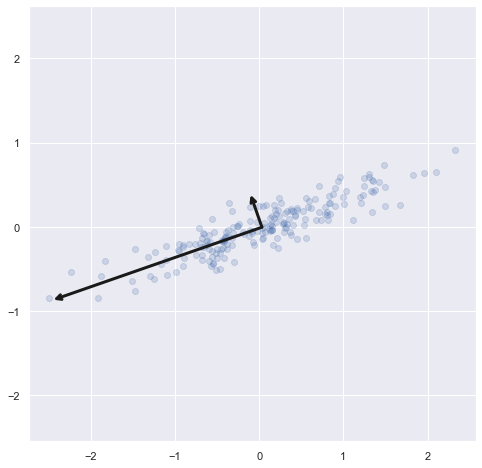

In [6]:
def draw_vector(v0, v1, ax=None):
    ax = ax or plt.gca()
    arrowprops=dict(arrowstyle='->',
                    linewidth=3,
                    color='k',
                    shrinkA=0, shrinkB=0)
    ax.annotate('', v1, v0, arrowprops=arrowprops)

# plot data
plt.figure(figsize=(8,8))
plt.scatter(X[:, 0], X[:, 1], alpha=0.2)
for length, vector in zip(pca.explained_variance_, pca.components_):
    v = vector * 3 * np.sqrt(length)
    draw_vector(pca.mean_, pca.mean_ + v)
plt.axis('equal');

These vectors represent the *principal axes* of the data, and the length of the vector is an indication of how "important" that axis is in describing the distribution of the data—more precisely, it is a measure of the variance of the data when projected onto that axis.
The projection of each data point onto the principal axes are the "principal components" of the data.

If we plot these principal components beside the original data, we see the plots shown here:

This transformation from data axes to principal axes is an *affine transformation*, which basically means it is composed of a translation, rotation, and uniform scaling.

While this algorithm to find principal components may seem like just a mathematical curiosity, it turns out to have very far-reaching applications in the world of machine learning and data exploration.

### PCA as dimensionality reduction

Using PCA for dimensionality reduction involves zeroing out one or more of the smallest principal components, resulting in a lower-dimensional projection of the data that preserves the maximal data variance.

Here is an example of using PCA as a dimensionality reduction transform:

In [7]:
pca = PCA(n_components=1)
pca.fit(X)
X_pca = pca.transform(X)
print("original shape:   ", X.shape)
print("transformed shape:", X_pca.shape)

original shape:    (200, 2)
transformed shape: (200, 1)


The transformed data has been reduced to a single dimension.
To understand the effect of this dimensionality reduction, we can perform the inverse transform of this reduced data and plot it along with the original data:

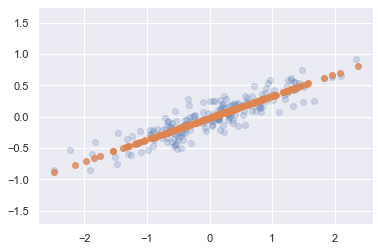

In [8]:
X_new = pca.inverse_transform(X_pca)
plt.scatter(X[:, 0], X[:, 1], alpha=0.2)
plt.scatter(X_new[:, 0], X_new[:, 1], alpha=0.8)
plt.axis('equal');

The light points are the original data, while the dark points are the projected version.
This makes clear what a PCA dimensionality reduction means: the information along the least important principal axis or axes is removed, leaving only the component(s) of the data with the highest variance.
The fraction of variance that is cut out (proportional to the spread of points about the line formed in this figure) is roughly a measure of how much "information" is discarded in this reduction of dimensionality.

This reduced-dimension dataset is in some senses "good enough" to encode the most important relationships between the points: despite reducing the dimension of the data by 50%, the overall relationship between the data points are mostly preserved.

## Principal Component Analysis Summary

In this section we have discussed the use of principal component analysis for dimensionality reduction, for visualization of high-dimensional data, for noise filtering, and for feature selection within high-dimensional data.
Because of the versatility and interpretability of PCA, it has been shown to be effective in a wide variety of contexts and disciplines.
Given any high-dimensional dataset, I tend to start with PCA in order to visualize the relationship between points (as we did with the digits), to understand the main variance in the data (as we did with the eigenfaces), and to understand the intrinsic dimensionality (by plotting the explained variance ratio).
Certainly PCA is not useful for every high-dimensional dataset, but it offers a straightforward and efficient path to gaining insight into high-dimensional data.

PCA's main weakness is that it tends to be highly affected by outliers in the data.
For this reason, many robust variants of PCA have been developed, many of which act to iteratively discard data points that are poorly described by the initial components.
Scikit-Learn contains a couple interesting variants on PCA, including ``RandomizedPCA`` and ``SparsePCA``, both also in the ``sklearn.decomposition`` submodule.
``RandomizedPCA``, which we saw earlier, uses a non-deterministic method to quickly approximate the first few principal components in very high-dimensional data, while ``SparsePCA`` introduces a regularization term  that serves to enforce sparsity of the components.

In the following sections, we will look at other unsupervised learning methods that build on some of the ideas of PCA.

<img src="ost_logo.png" width="240" height="240" align="right"/>
<div style="text-align: left"> <b> Machine Learning </b> <br> MSE FTP MachLe <br> 
<a href="mailto:christoph.wuersch@ost.ch"> Christoph Würsch </a> </div>


# Lab11, A4 Necessity of Feature-Scaling for the PCA


Feature scaling through **standardization** (or Z score normalization) can be an important pre-processing step for many machine learning processes. Since many algorithms (such as SVM, K-nearest neighbors, and logistic regression) require the normalization of features, we can analyze the importance of scaling data using the example of __Principal Component Analysis (PCA)__.

In PCA, we are interested in the components that maximize variance. If one component (e.g., height) varies less than another (e.g., weight) just because different scales are used (meters vs. kilos), PCA could determine that the direction of maximum variance is assigned to weight rather than size if these characteristics are not scaled. But the change in height of one meter can be considered much more important than the change in weight of one kilogram. This assignment is therefore clearly wrong.

To illustrate this, we now go through a PCA by scaling the data with the class `StandardScaler` from the module `sklearn.preprocessing`. The results are visualized and compared with the results of unscaled data. We will notice a clearer difference when using standardization. The data set used is the wine data set available from UCI. This data set has continuous features that are heterogeneous due to the different magnitudes of the characteristics they measure (e.g. alcohol content and malic acid).

The transformed data is then used to train a __naive Bayesian classifier__. Significant differences in predictive accuracy can be observed, with the data set that was scaled before PCA was applied far exceeding the unscaled version.



### (a) Import of the used classes

In [1]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.naive_bayes import GaussianNB
from sklearn import metrics
import matplotlib.pyplot as plt
from sklearn.datasets import load_wine
from sklearn.pipeline import make_pipeline


In [2]:
RANDOM_STATE = 42
FIG_SIZE = (10, 7)

features, target = load_wine(return_X_y=True)
target

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2])

### (b) Split in training and test dataset

In [3]:
# Make a train/test split using 30% test size
X_train, X_test, y_train, y_test = train_test_split(features, target,
                                                    test_size=0.30,
                                                    random_state=RANDOM_STATE)

### (c) Create a `pipeline` 

We use a __Pipeline__ to perform a PCA with two main components and then train a *Naive Bayes classifier*. Then we look at the Accuracy on the test data. We do this without scaling the features.

In [4]:
# Fit to data and predict using pipelined GNB and PCA.
unscaled_clf = make_pipeline(PCA(n_components=2), GaussianNB())
unscaled_clf.fit(X_train, y_train)
pred_test = unscaled_clf.predict(X_test)

# Show prediction accuracy in unscaled data.
print('\nPrediction accuracy for the normal test dataset with PCA')
print('{:.2%}\n'.format(metrics.accuracy_score(y_test, pred_test)))


Prediction accuracy for the normal test dataset with PCA
81.48%



### (d) PCA using 4 principal components (without standardization / scaling of the data)

In [5]:
unscaled_clf = make_pipeline(PCA(n_components=4), GaussianNB())
unscaled_clf.fit(X_train, y_train)
pred_test = unscaled_clf.predict(X_test)

# Show prediction accuracy in unscaled data.
print('\nPrediction accuracy for the normal test dataset with PCA')
print('{:.2%}\n'.format(metrics.accuracy_score(y_test, pred_test)))



Prediction accuracy for the normal test dataset with PCA
98.15%



### (f) New pipeline with scaled features
The features are now scaled for comparison.

In [6]:
# Fit to data and predict using pipelined scaling, GNB and PCA.
std_clf = make_pipeline(StandardScaler(), PCA(n_components=2), GaussianNB())
std_clf.fit(X_train, y_train)
pred_test_std = std_clf.predict(X_test)

### (g) Prediction accuracy for the scaled data (using two principal components)

In [7]:
# Show prediction accuracies in scaled and unscaled data.
print('\nPrediction accuracy for the normal test dataset with PCA')
print('{:.2%}\n'.format(metrics.accuracy_score(y_test, pred_test_std)))


Prediction accuracy for the normal test dataset with PCA
98.15%



### (h) plotting the main components

Now we get the main components, once for the unscaled, once for the scaled case.

In [8]:
# Extract PCA from pipeline
pca = unscaled_clf.named_steps['pca']
X_train_unscaled=pca.transform(X_train)
pca_std = std_clf.named_steps['pca']

In [9]:
# Show first principal componenets
print('\nPC 1 without scaling:\n', pca.components_[0])
print('\nPC 1 with scaling:\n', pca_std.components_[0])


PC 1 without scaling:
 [ 1.76342917e-03 -8.35544737e-04  1.54623496e-04 -5.31136096e-03
  2.01663336e-02  1.02440667e-03  1.53155502e-03 -1.11663562e-04
  6.31071580e-04  2.32645551e-03  1.53606718e-04  7.43176482e-04
  9.99775716e-01]

PC 1 with scaling:
 [ 0.13443023 -0.25680248 -0.0113463  -0.23405337  0.15840049  0.39194918
  0.41607649 -0.27871336  0.33129255 -0.11383282  0.29726413  0.38054255
  0.27507157]


The 1st main component in the unscaled set can be seen. You can see that feature #13 dominates the direction because it is several orders of magnitude above the other features. This is in contrast to viewing the main component for the scaled version of the data. In the scaled version, the orders of magnitude are approximately the same for all features.

In [10]:
# Scale and use PCA on X_train data for visualization.

scaler = std_clf.named_steps['standardscaler']
X_train_std = pca_std.transform(scaler.transform(X_train))

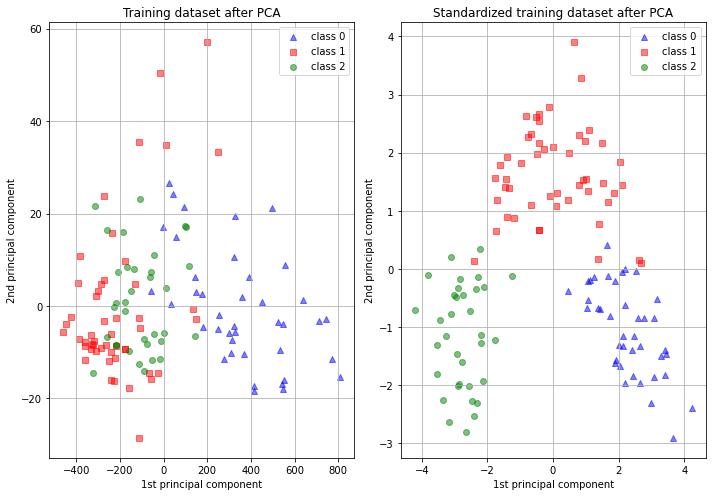

In [11]:
# visualize standardized vs. untouched dataset with PCA performed
fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=FIG_SIZE)


for l, c, m in zip(range(0, 3), ('blue', 'red', 'green'), ('^', 's', 'o')):
    ax1.scatter(X_train_unscaled[y_train == l, 0], X_train_unscaled[y_train == l, 1],
                color=c,
                label='class %s' % l,
                alpha=0.5,
                marker=m
                )

for l, c, m in zip(range(0, 3), ('blue', 'red', 'green'), ('^', 's', 'o')):
    ax2.scatter(X_train_std[y_train == l, 0], X_train_std[y_train == l, 1],
                color=c,
                label='class %s' % l,
                alpha=0.5,
                marker=m
                )

ax1.set_title('Training dataset after PCA')
ax2.set_title('Standardized training dataset after PCA')

for ax in (ax1, ax2):
    ax.set_xlabel('1st principal component')
    ax.set_ylabel('2nd principal component')
    ax.legend(loc='upper right')
    ax.grid()

plt.tight_layout()

plt.show()

<img src="ost_logo.png" width="240" height="240" align="right"/>
<div style="text-align: left"> <b> Machine Learning </b> <br> MSE FTP MachLe <br> 
<a href="mailto:christoph.wuersch@ost.ch"> Christoph Würsch </a> </div>

# Lab11, A5 – Dimensionality Reduction

## Exercice 5: Stochastic Neighbour Embedding on MNIST dataset

## Setup

First, let's make sure this notebook works well in both python 2 and 3, import a few common modules, ensure MatplotLib plots figures inline and prepare a function to save the figures:

In [1]:
# To support both python 2 and python 3
from __future__ import division, print_function, unicode_literals

# Common imports
import numpy as np
import os

# to make this notebook's output stable across runs
np.random.seed(42)

# To plot pretty figures
%matplotlib inline
import matplotlib
import matplotlib.pyplot as plt
plt.rcParams['axes.labelsize'] = 14
plt.rcParams['xtick.labelsize'] = 12
plt.rcParams['ytick.labelsize'] = 12

# Where to save the figures
PROJECT_ROOT_DIR = "."
CHAPTER_ID = "dim_reduction"

def save_fig(fig_id, tight_layout=True):
    path = os.path.join(PROJECT_ROOT_DIR, "images", CHAPTER_ID, fig_id + ".png")
    print("Saving figure", fig_id)
    if tight_layout:
        plt.tight_layout()
    plt.savefig(path, format='png', dpi=600)

### (a) Using t-SNE to reduce the dimensionality to two dimensions

*Exercise: Use t-SNE to reduce the MNIST dataset down to two dimensions and plot the result using Matplotlib. You can use a scatterplot using 10 different colors to represent each image's target class.*

In [2]:
from sklearn.decomposition import PCA

Let's start by loading the MNIST dataset:

In [3]:
from sklearn.datasets import fetch_openml
mnist = fetch_openml('mnist_784')

#custom_data_home='C:/temp'
#mnist = fetch_openml('mnist_784', data_home=custom_data_home)
mnist.DESCR

Dimensionality reduction on the full 60,000 images takes a very long time, so let's only do this on a random subset of 5,000 images:

In [55]:
np.random.seed(42)

m = 5000
idx = np.random.permutation(60000)[:m]


In [50]:
X = mnist.data.iloc[idx,:].values
y = mnist.target.iloc[idx].values

y[0:5]

['7', '3', '8', '9', '3']
Categories (10, object): ['0', '1', '2', '3', ..., '6', '7', '8', '9']

In [51]:
#we save the data to disk so that we can fetch it fast if we need it using the next cell:

import pandas as pd
mnist.data.to_pickle('mnist_data_784.pkl')
mnist.target.to_pickle('mnist_label_784.pkl');

In [59]:
#read data from pickle file if there is no internet connection
# Xp=pd.read_pickle('mnist_data_784.pkl').values
# yp=pd.read_pickle('mnist_label_784.pkl').values

# m = 5000
# idx = np.random.permutation(60000)[:m]
# X = Xp[idx,:]
# y = yp[idx]

Now let's use t-SNE to reduce dimensionality down to 2D so we can plot the dataset (This can take quite a while...):

In [60]:
from sklearn.manifold import TSNE

tsne = TSNE(n_components=2, random_state=42)
X_reduced = tsne.fit_transform(X)

Now let's use Matplotlib's `scatter()` function to plot a scatterplot, using a different color for each digit:

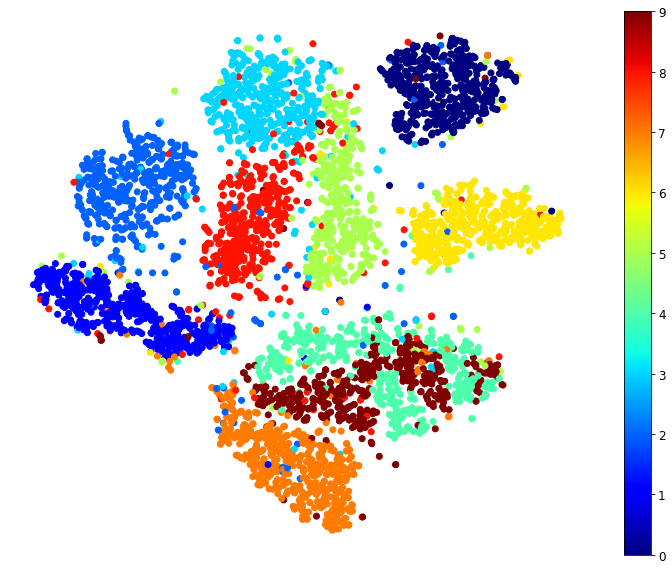

In [61]:
plt.figure(figsize=(13,10))
plt.scatter(X_reduced[:, 0], X_reduced[:, 1], c=y.astype(int), cmap="jet")
plt.axis('off')
plt.colorbar()
plt.show()

Isn't this just beautiful? :) This plot tells us which numbers are easily distinguishable from the others (e.g., 0s, 6s, and most 8s are rather well separated clusters), and it also tells us which numbers are often hard to distinguish (e.g., 4s and 9s, 5s and 3s, and so on).

### (b) Labelling the Clusters

Let's focus on digits 2, 3 and 5, which seem to overlap a lot.

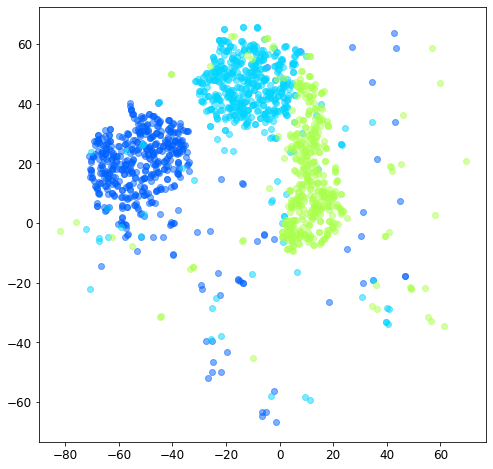

In [62]:
plt.figure(figsize=(8,8))
cmap = matplotlib.cm.get_cmap("jet")
for digit in (2, 3, 5):
    color=np.array(cmap(digit / 9)).reshape(1,4)
    plt.scatter(X_reduced[y.astype(int) == digit, 0], X_reduced[y.astype(int) == digit, 1], c=color,alpha=0.5)
#plt.axis('off')
plt.show()

### t-SNE instead of PCA

Let's see if we can produce a nicer image by running t-SNE on these 3 digits:

In [64]:
y

['1', '3', '4', '6', '3', ..., '8', '2', '5', '2', '1']
Length: 5000
Categories (10, object): ['0', '1', '2', '3', ..., '6', '7', '8', '9']

In [65]:
idx = (y == '2') | (y == '3') | (y == '5') 
X_subset = X[idx]
y_subset = y[idx]

tsne_subset = TSNE(n_components=2, random_state=42)
X_subset_reduced = tsne_subset.fit_transform(X_subset)

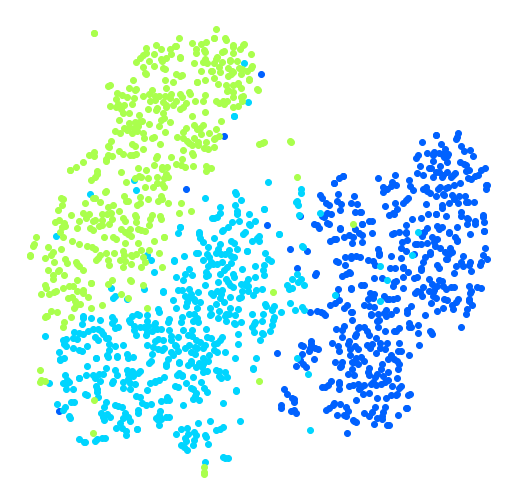

In [66]:
plt.figure(figsize=(9,9))
for digit in (2, 3, 5):
    color=np.array(cmap(digit / 9)).reshape(1,4)
    plt.scatter(X_subset_reduced[y_subset.astype(int) == digit, 0],
                X_subset_reduced[y_subset.astype(int) == digit, 1], c=color)
plt.axis('off')
plt.show()

Much better, now the clusters have far less overlap. But some 3s are all over the place. Plus, there are two distinct clusters of 2s, and also two distinct clusters of 5s. It would be nice if we could visualize a few digits from each cluster, to understand why this is the case. Let's do that now. 

*Exercise: Alternatively, you can write colored digits at the location of each instance, or even plot scaled-down versions of the digit images themselves (if you plot all digits, the visualization will be too cluttered, so you should either draw a random sample or plot an instance only if no other instance has already been plotted at a close distance). You should get a nice visualization with well-separated clusters of digits.*

Let's create a `plot_digits()` function that will draw a scatterplot (similar to the above scatterplots) plus write colored digits, with a minimum distance guaranteed between these digits. If the digit images are provided, they are plotted instead. This implementation was inspired from one of Scikit-Learn's excellent examples ([plot_lle_digits](http://scikit-learn.org/stable/auto_examples/manifold/plot_lle_digits.html), based on a different digit dataset).

In [67]:
from sklearn.preprocessing import MinMaxScaler
from matplotlib.offsetbox import AnnotationBbox, OffsetImage

def plot_digits(X, y, min_distance=0.05, images=None, figsize=(13, 10)):
    # Let's scale the input features so that they range from 0 to 1
    X_normalized = MinMaxScaler().fit_transform(X)
    # Now we create the list of coordinates of the digits plotted so far.
    # We pretend that one is already plotted far away at the start, to
    # avoid `if` statements in the loop below
    neighbors = np.array([[10., 10.]])
    # The rest should be self-explanatory
    plt.figure(figsize=figsize)
    cmap = matplotlib.cm.get_cmap("jet")
    digits = np.unique(y)
    for digit in digits:
        color=np.array(cmap(digit / 9)).reshape(1,4)
        plt.scatter(X_normalized[y == digit, 0], X_normalized[y == digit, 1], c=color)
    plt.axis("off")
    ax = plt.gcf().gca()  # get current axes in current figure
    for index, image_coord in enumerate(X_normalized):
        closest_distance = np.linalg.norm(np.array(neighbors) - image_coord, axis=1).min()
        if closest_distance > min_distance:
            neighbors = np.r_[neighbors, [image_coord]]
            if images is None:
                plt.text(image_coord[0], image_coord[1], str(int(y[index])),
                         color=cmap(y[index] / 9), fontdict={"weight": "bold", "size": 16})
            else:
                image = images[index].reshape(28, 28)
                imagebox = AnnotationBbox(OffsetImage(image, cmap="binary"), image_coord)
                ax.add_artist(imagebox)

Let's try it! First let's just write colored digits:

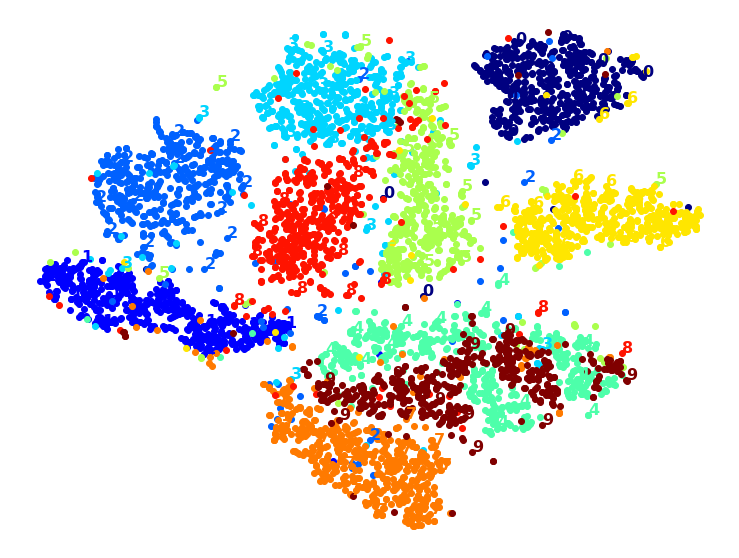

In [68]:
plot_digits(X_reduced, y.astype(int))

Well that's okay, but not that beautiful. Let's try with the digit images:

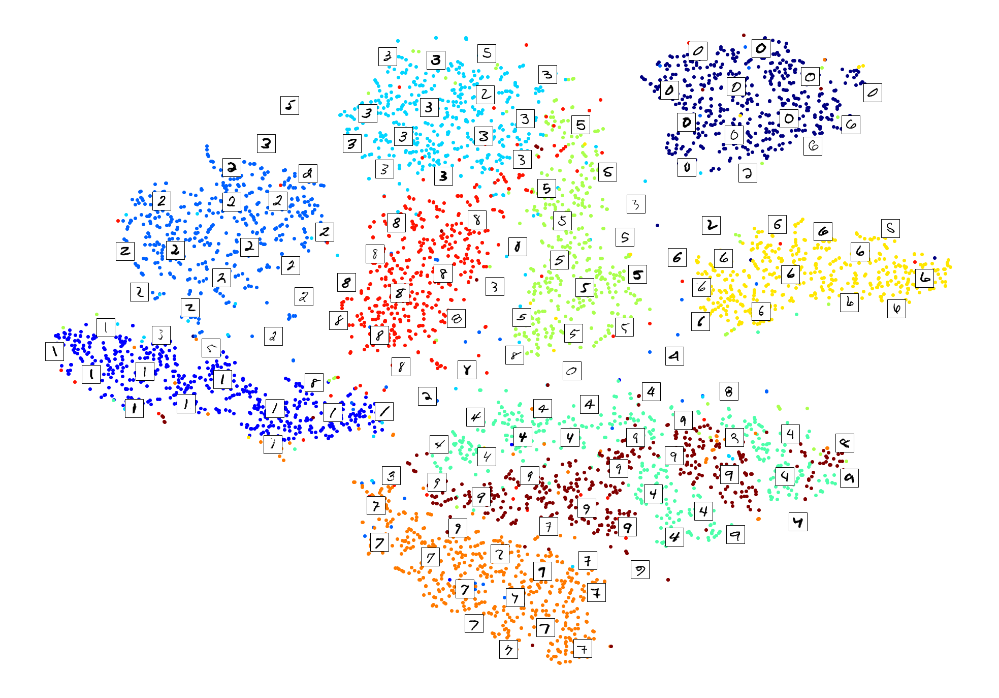

In [69]:
plot_digits(X_reduced, y.astype(int), images=X, figsize=(35, 25))

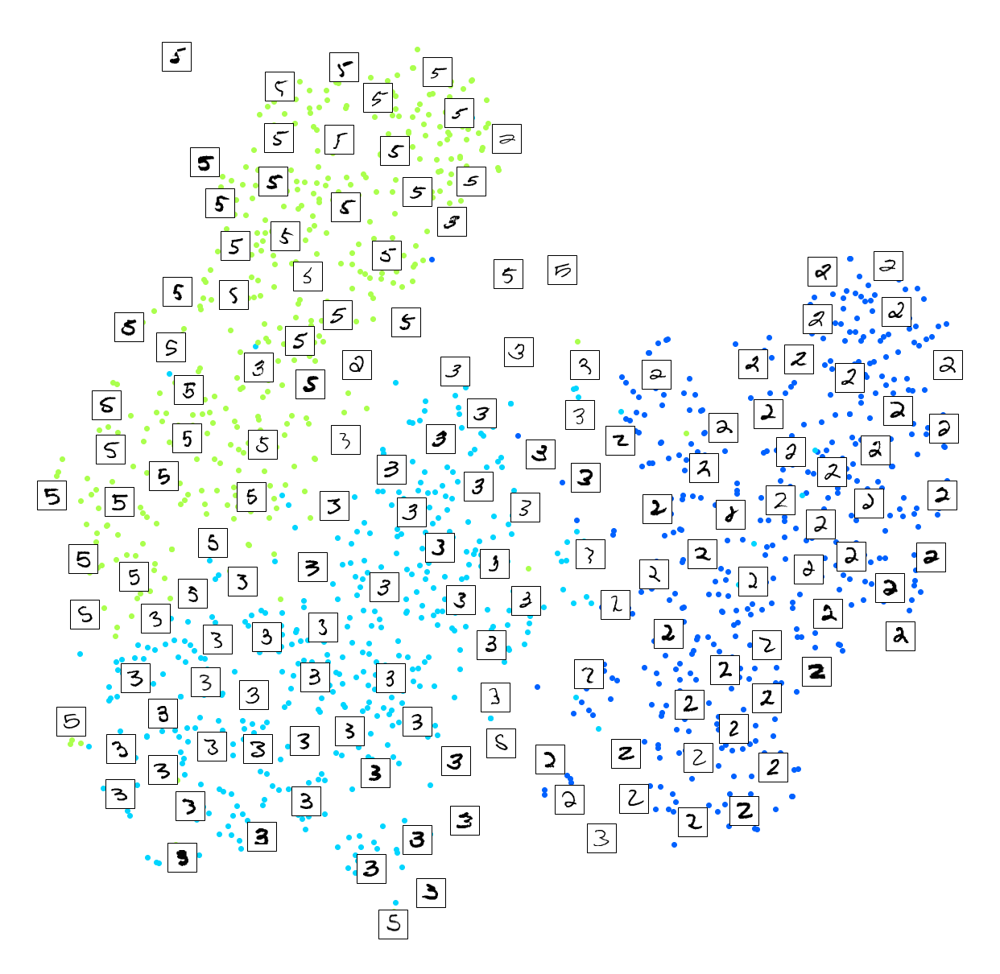

In [70]:
plot_digits(X_subset_reduced, y_subset.astype(int), images=X_subset, figsize=(22, 22))

*Exercise: Try using other dimensionality reduction algorithms such as PCA, LLE, or MDS and compare the resulting visualizations.*

Let's start with PCA. We will also time how long it takes:

PCA took 0.2s.


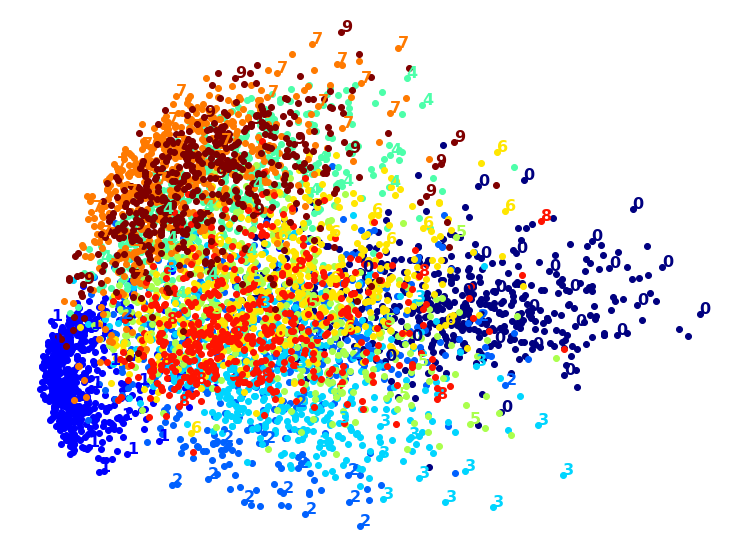

In [71]:
from sklearn.decomposition import PCA
import time

t0 = time.time()
X_pca_reduced = PCA(n_components=2, random_state=42).fit_transform(X)
t1 = time.time()
print("PCA took {:.1f}s.".format(t1 - t0))
plot_digits(X_pca_reduced, y.astype(int))
plt.show()

Wow, PCA is blazingly fast! But although we do see a few clusters, there's way too much overlap. Let's try LLE:

### (c) Using other dimensionality reduction algorithms such as LLE, MDS and t-SNE

*First we start with LLE, i.e. Local Linear Embedding which is part of the mainfold class of sklearn.*

LLE took 2.9s.


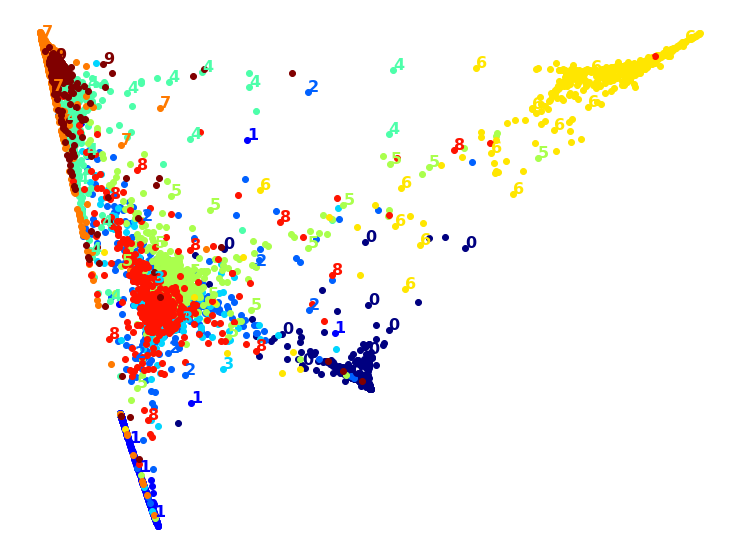

In [72]:
from sklearn.manifold import LocallyLinearEmbedding

t0 = time.time()
X_lle_reduced = LocallyLinearEmbedding(n_components=2, random_state=42).fit_transform(X)
t1 = time.time()
print("LLE took {:.1f}s.".format(t1 - t0))
plot_digits(X_lle_reduced, y.astype(int))
plt.show()

That took a while, and the result does not look too good. Let's see what happens if we apply PCA first, preserving 95% of the variance:

PCA+LLE took 3.4s.


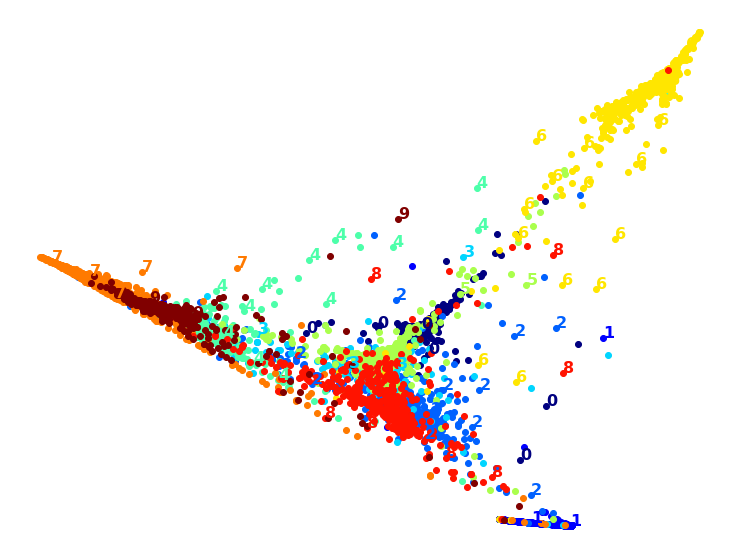

In [73]:
from sklearn.pipeline import Pipeline

pca_lle = Pipeline([
    ("pca", PCA(n_components=0.95, random_state=42)),
    ("lle", LocallyLinearEmbedding(n_components=2, random_state=42)),
])
t0 = time.time()
X_pca_lle_reduced = pca_lle.fit_transform(X)
t1 = time.time()
print("PCA+LLE took {:.1f}s.".format(t1 - t0))
plot_digits(X_pca_lle_reduced, y.astype(int))
plt.show()

The result is more or less the same, but this time it was almost 4× faster.

Let's try MDS. It's much too long if we run it on 10,000 instances, so let's just try 2,000 for now:

MDS took 226.3s (on just 2,000 MNIST images instead of 10,000).


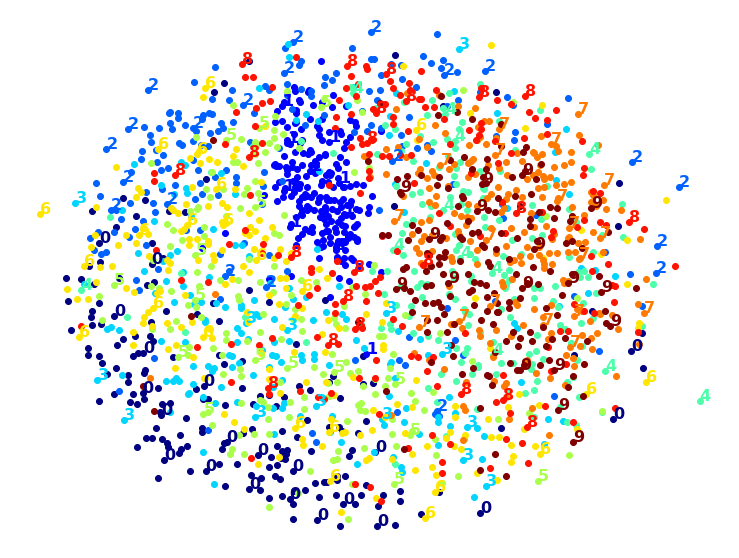

In [74]:
from sklearn.manifold import MDS

m = 2000
t0 = time.time()
X_mds_reduced = MDS(n_components=2, random_state=42).fit_transform(X[:m])
t1 = time.time()
print("MDS took {:.1f}s (on just 2,000 MNIST images instead of 10,000).".format(t1 - t0))
plot_digits(X_mds_reduced, y[:m].astype(int))
plt.show()

Meh. This does not look great, all clusters overlap too much. Let's try with PCA first, perhaps it will be faster?

PCA+MDS took 246.6s (on 2,000 MNIST images).


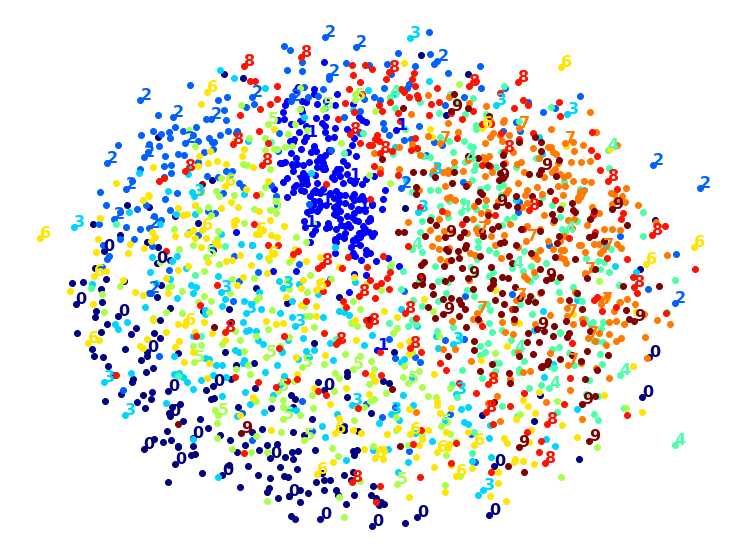

In [75]:
from sklearn.pipeline import Pipeline

pca_mds = Pipeline([
    ("pca", PCA(n_components=0.95, random_state=42)),
    ("mds", MDS(n_components=2, random_state=42)),
])
t0 = time.time()
X_pca_mds_reduced = pca_mds.fit_transform(X[:2000])
t1 = time.time()
print("PCA+MDS took {:.1f}s (on 2,000 MNIST images).".format(t1 - t0))
plot_digits(X_pca_mds_reduced, y[:2000].astype(int))
plt.show()

Same result, and no speedup: PCA did not help (or hurt).

Let's try LDA:

LDA took 1.2s.


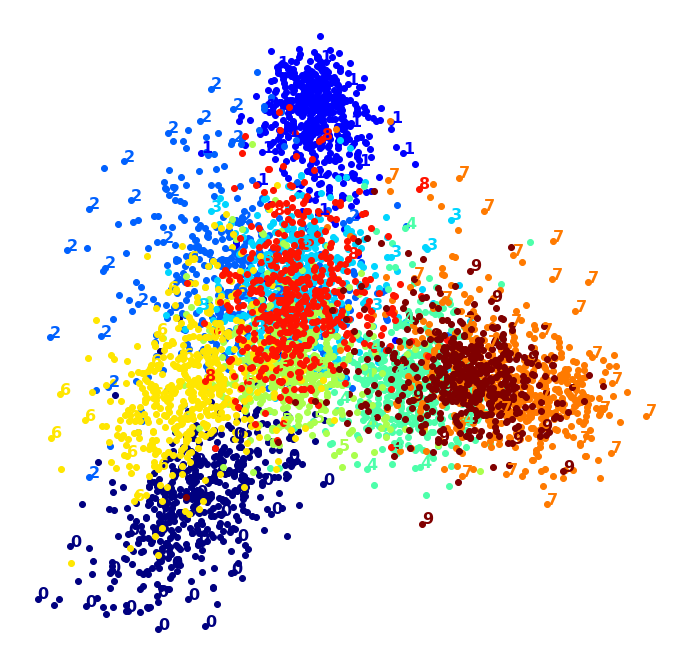

In [76]:
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis

t0 = time.time()
X_lda_reduced = LinearDiscriminantAnalysis(n_components=2).fit_transform(X, y)
t1 = time.time()
print("LDA took {:.1f}s.".format(t1 - t0))
plot_digits(X_lda_reduced, y.astype(int), figsize=(12,12))
plt.show()

This one is very fast, and it looks nice at first, until you realize that several clusters overlap severely.

Well, it's pretty clear that t-SNE won this little competition, wouldn't you agree? We did not time it, so let's do that now:

t-SNE took 48.1s.


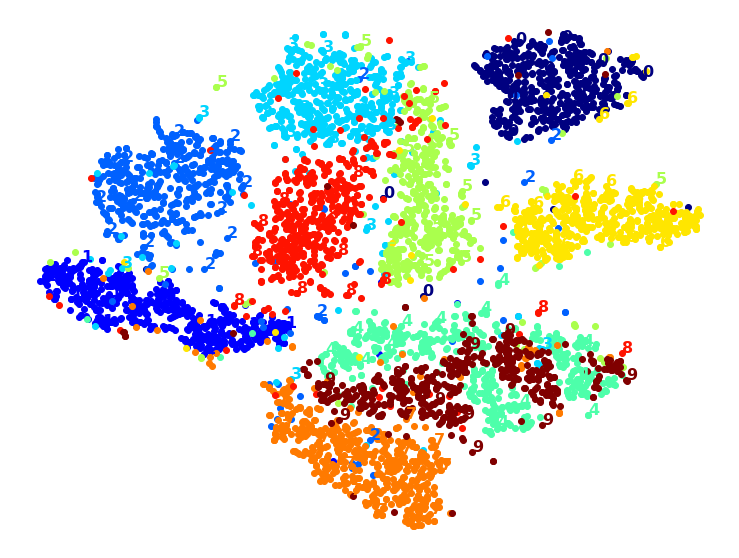

In [77]:
from sklearn.manifold import TSNE

t0 = time.time()
X_tsne_reduced = TSNE(n_components=2, random_state=42).fit_transform(X)
t1 = time.time()
print("t-SNE took {:.1f}s.".format(t1 - t0))
plot_digits(X_tsne_reduced, y.astype(int))
plt.show()

It's twice slower than LLE, but still much faster than MDS, and the result looks great. Let's see if a bit of PCA can speed it up:

PCA+t-SNE took 55.3s.


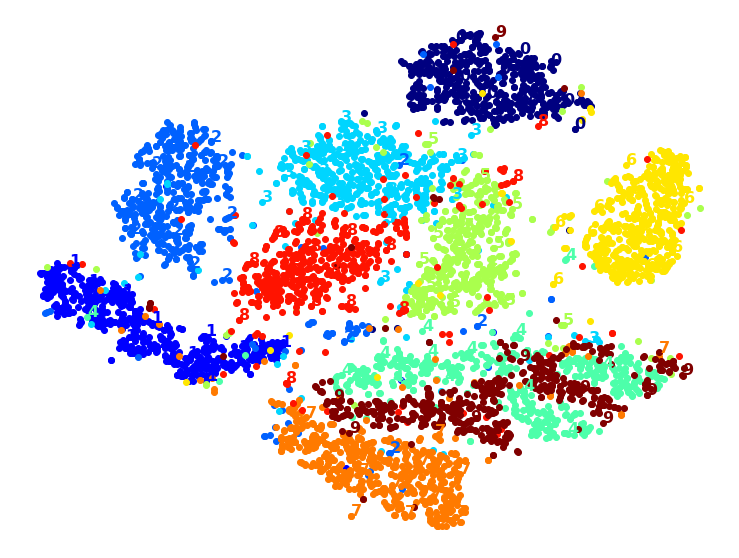

In [78]:
pca_tsne = Pipeline([
    ("pca", PCA(n_components=0.95, random_state=42)),
    ("tsne", TSNE(n_components=2, random_state=42)),
])
t0 = time.time()
X_pca_tsne_reduced = pca_tsne.fit_transform(X)
t1 = time.time()
print("PCA+t-SNE took {:.1f}s.".format(t1 - t0))
plot_digits(X_pca_tsne_reduced, y.astype(int))
plt.show()

Yes, PCA roughly gave us a 25% speedup, without damaging the result. We have a winner!

<img src="ost_logo.png" width="240" height="240" align="right"/>
<div style="text-align: left"> <b> Machine Learning </b> <br> MSE FTP MachLe <br> 
<a href="mailto:christoph.wuersch@ost.ch"> Christoph Würsch </a> </div>

# Lab 11, A6: Feature Engineering using PCA

First, let's make sure this notebook works well in both python 2 and 3, import a few common modules, ensure MatplotLib plots figures inline and prepare a function to save the figures:

## Setup

In [1]:
# To support both python 2 and python 3
from __future__ import division, print_function, unicode_literals

# Common imports
import numpy as np
import os

# to make this notebook's output stable across runs
np.random.seed(42)

# To plot pretty figures
%matplotlib inline
import matplotlib
import matplotlib.pyplot as plt
plt.rcParams['axes.labelsize'] = 14
plt.rcParams['xtick.labelsize'] = 12
plt.rcParams['ytick.labelsize'] = 12

# Where to save the figures
PROJECT_ROOT_DIR = "."
CHAPTER_ID = "dim_reduction"

def save_fig(fig_id, tight_layout=True):
    path = os.path.join(PROJECT_ROOT_DIR, "images", CHAPTER_ID, fig_id + ".png")
    print("Saving figure", fig_id)
    if tight_layout:
        plt.tight_layout()
    plt.savefig(path, format='png', dpi=300)

### (a) Loading the MINST Dataset

*Exercise: Load the MNIST dataset (introduced in chapter 3) and split it into a training set and a test set (take the first 60,000 instances for training, and the remaining 10,000 for testing).*

In [2]:
from sklearn.decomposition import PCA

In [3]:
#from sklearn.datasets import fetch_mldata

from sklearn.datasets import fetch_openml
mnist = fetch_openml('mnist_784')


In [19]:
X_train = mnist['data'][:60000].values
y_train = mnist['target'][:60000].astype(int).values

X_test = mnist['data'][60000:].values
y_test = mnist['target'][60000:].astype(int).values

In [20]:
X_train
y_train

array([5, 0, 4, ..., 5, 6, 8], dtype=int64)

In [10]:
#we save the data to disk so that we can fetch it fast if we need it using the next cell:

import pandas as pd
#mnist.data.to_pickle('mnist_data_784.pkl')
#mnist.target.to_pickle('mnist_label_784.pkl');

#read data from pickle file if there is no internet connection
X=pd.read_pickle('mnist_data_784.pkl').values
y=pd.read_pickle('mnist_label_784.pkl').values

X_train = X[:60000:,:]
y_train = y[:60000].astype(int)

X_test = X[60000:,:]
y_test = y[60000:].astype(int)

### (b) Training a Random Forest classifier on the dataset

*Exercise: Train a Random Forest classifier on the dataset and time how long it takes, then evaluate the resulting model on the test set.*

In [11]:
from sklearn.ensemble import RandomForestClassifier

rnd_clf = RandomForestClassifier(random_state=42)

In [12]:
import time

t0 = time.time()
rnd_clf.fit(X_train, y_train)
t1 = time.time()

In [13]:
print("Training took {:.2f}s".format(t1 - t0))

Training took 45.57s


In [14]:
from sklearn.metrics import accuracy_score

y_pred = rnd_clf.predict(X_test)
accuracy_score(y_test, y_pred)

0.9705

### (c) Use PCA to reduce the dataset’s dimensionality, with an explained variance ratio of 95%

*Exercise: Next, use PCA to reduce the dataset's dimensionality, with an explained variance ratio of 95%.*

In [21]:
from sklearn.decomposition import PCA

pca = PCA(n_components=0.95)
X_train_reduced = pca.fit_transform(X_train)

*Exercise: Train a new Random Forest classifier on the reduced dataset and see how long it takes. Was training much faster?*

In [22]:
rnd_clf2 = RandomForestClassifier(random_state=42)
t0 = time.time()
rnd_clf2.fit(X_train_reduced, y_train)
t1 = time.time()

In [23]:
print("Training took {:.2f}s".format(t1 - t0))

Training took 92.38s


Oh no! Training is actually more than twice slower now! How can that be? Well, as we saw in this chapter, dimensionality reduction does not always lead to faster training time: it depends on the dataset, the model and the training algorithm. See figure 8-6 (the `manifold_decision_boundary_plot*` plots above). If you try a softmax classifier instead of a random forest classifier, you will find that training time is reduced by a factor of 3 when using PCA. Actually, we will do this in a second, but first let's check the precision of the new random forest classifier.

### (d) Evaluate the classifier on the test set: how does it compare to the previous classifier?

In [24]:
X_test_reduced = pca.transform(X_test)

y_pred = rnd_clf2.predict(X_test_reduced)
accuracy_score(y_test, y_pred)

0.9481

It is common for performance to drop slightly when reducing dimensionality, because we do lose some useful signal in the process. However, the performance drop is rather severe in this case. So PCA really did not help: it slowed down training and reduced performance. :(

Let's see if it helps when using softmax regression:

In [25]:
from sklearn.linear_model import LogisticRegression

log_clf = LogisticRegression(multi_class="multinomial", solver="lbfgs", random_state=42,max_iter=1000)
t0 = time.time()
log_clf.fit(X_train, y_train)
t1 = time.time()

C:\Users\wurc\.conda\envs\ML\lib\site-packages\sklearn\linear_model\_logistic.py:765: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)


In [26]:
print("Training took {:.2f}s".format(t1 - t0))

Training took 165.93s


In [27]:
y_pred = log_clf.predict(X_test)
accuracy_score(y_test, y_pred)

0.9202

Okay, so softmax regression takes much longer to train on this dataset than the random forest classifier, plus it performs worse on the test set. But that's not what we are interested in right now, we want to see how much PCA can help softmax regression. Let's train the softmax regression model using the reduced dataset:

In [28]:
log_clf2 = LogisticRegression(multi_class="multinomial", solver="lbfgs", random_state=42,max_iter=1000)
t0 = time.time()
log_clf2.fit(X_train_reduced, y_train)
t1 = time.time()

C:\Users\wurc\.conda\envs\ML\lib\site-packages\sklearn\linear_model\_logistic.py:765: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)


In [29]:
print("Training took {:.2f}s".format(t1 - t0))

Training took 86.67s


Nice! Reducing dimensionality led to a 4× speedup. :)  Let's the model's accuracy:

In [30]:
y_pred = log_clf2.predict(X_test_reduced)
accuracy_score(y_test, y_pred)

0.9236

A very slight drop in performance, which might be a reasonable price to pay for a 4× speedup, depending on the application.

__So there you have it: PCA can give you a formidable speedup... but not always!__

<img src="ost_logo.png" width="240" height="240" align="right"/>
<div style="text-align: left"> <b> Machine Learning </b> <br> MSE FTP MachLe <br> 
<a href="mailto:christoph.wuersch@ost.ch"> Christoph Würsch </a> </div>

# Lab12: A2_Elbow Curve and `sklearn.cluster.KMeans`

Based on *Python Machine Learning 2nd Edition* by [Sebastian Raschka](https://sebastianraschka.com), Packt Publishing Ltd. 2017


In [1]:
%matplotlib inline

from IPython.display import Image
import matplotlib.pyplot as plt

# Grouping objects by similarity using k-means

## K-means clustering using scikit-learn

Using the following code lines, you can generate two-dimensional data clusters that can
be used for testing clustering algorithms. In this exercise, you will learn how to apply
k-means and how to determine the optimum number of clusters using the elbow
criterium of the inertia plot.

### (a) Scatterplot
Generate a distribution of 8 clusters with 250 samples and plot them as a scatterplot.
How many clusters do you recognize with your eye. Try to change the cluster standard
deviation cluster_std until it will be hard for you to discriminate the 8 different clusters.

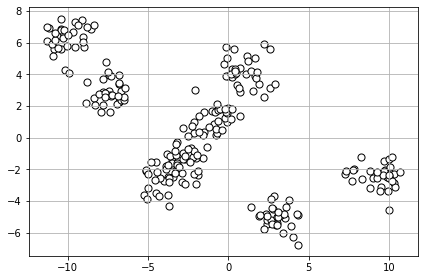

In [2]:
from sklearn.datasets import make_blobs

X, y = make_blobs(n_samples=250, 
                  n_features=8, 
                  centers=8, 
                  cluster_std=0.85, 
                  shuffle=True, 
                  random_state=0)

plt.scatter(X[:, 0], X[:, 1], 
            c='white', marker='o', edgecolor='black', s=50)
plt.grid()
plt.tight_layout()
#plt.savefig('images/11_01.png', dpi=300)
plt.show()

### b) `KMeans`
Import the method `KMeans` from `sklearn.cluster`. Instantiate a model km with 8 clusters
(`n_clusters=8`). Set the maximum number of iterations to `max_iter=300` and `n_init=10`.

Fit the model to the data and predict the cluster label using `km.fit_predict(X)`.
Hint: One way to deal with convergence problems is to choose larger values for `tol`, which
is a parameter that controls the tolerance with regard to the changes in the within-cluster
sum-squared-error to declare convergence. Try a tolerance of 1e-04.

In [3]:
from sklearn.cluster import KMeans

km = KMeans(n_clusters=8, 
            init='random', 
            n_init=10, 
            max_iter=300,
            tol=1e-04,
            random_state=0)

y_km = km.fit_predict(X)
km.score(X)



-1325.5013488192246

### (c) Display the clustered data

Use the function `PlotClusters` to display the clustered data.

In [4]:
from matplotlib import colors as mcolors
colors = dict(mcolors.BASE_COLORS, **mcolors.CSS4_COLORS)
ColorNames=list(colors.keys())
HSV=colors.values()


def PlotClusters(X,y, km):
    
    for ClusterNumber in range(km.n_clusters):
        plt.scatter(X[y == ClusterNumber, 0],
                X[y == ClusterNumber, 1],
                s=50, c=ColorNames[ClusterNumber+1],
                marker='s', edgecolor='black',
                label='cluster {0}'.format(ClusterNumber+1))
    plt.scatter(km.cluster_centers_[:, 0],
        km.cluster_centers_[:, 1],
        s=250, marker='*',
        c='red', edgecolor='black',
        label='centroids')
    plt.legend(scatterpoints=1)
    plt.grid()
    plt.tight_layout()
    #plt.savefig('images/11_02.png', dpi=300)
    plt.show()

### d) Variation of the number k of clusters 

Vary the number of clusters `n_clusters=8` in your `KMeans` clustering algorithm from 4 to
8 and display each time the result using the function `PlotClusters`.

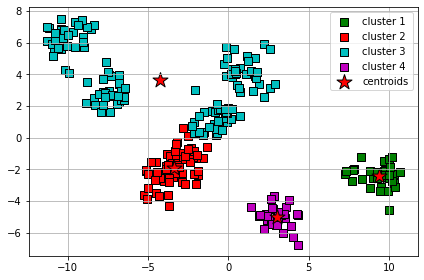

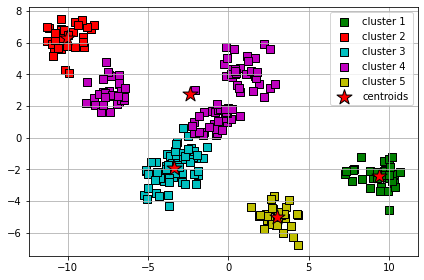

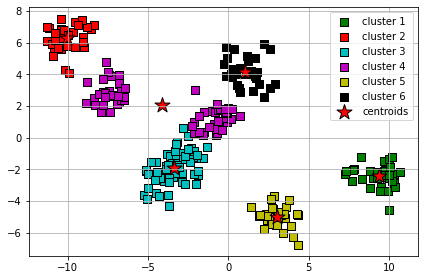

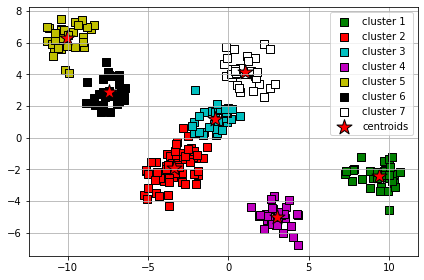

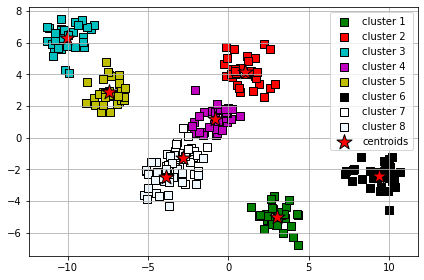

In [5]:

for n_clusters in range(4,9):
    km = KMeans(n_clusters=n_clusters,
                init='random', 
                n_init=10, 
                max_iter=300,
                tol=1e-04,
                random_state=0)

    y_km = km.fit_predict(X)
    PlotClusters(X,y_km, km)

<br>

## Using the elbow method to find the optimal number of clusters 

### (e) Elbow Method
Vary in a for loop the number of clusters from `n_clusters=8` to `n_clusters=15` and
cluster the data each time using the `km.fit_predict` method. Read out the inertia
`km.inertia_` and store it in a list called `distortions` as function of the number of clusters
using the `append` method. Display the inertia as function of the number of clusters
and determine the optimum number of clusters from the elbow curve.

In [9]:
print('Distortion: %.2f' % km.inertia_)

Distortion: 1325.50


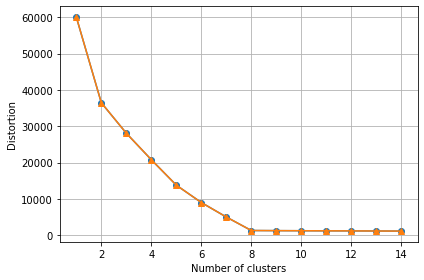

In [10]:
distortions = []
ScoreList   = []
maxNumberOfClusters=15

for i in range(1, maxNumberOfClusters):
    km = KMeans(n_clusters=i, 
                init='k-means++', 
                n_init=10, 
                max_iter=300, 
                random_state=0)
    km.fit(X)
    distortions.append(km.inertia_)
    ScoreList.append(-km.score(X))
    
    
plt.plot(range(1, maxNumberOfClusters), distortions, marker='o')
plt.plot(range(1, maxNumberOfClusters), ScoreList, marker='^')
plt.xlabel('Number of clusters')
plt.ylabel('Distortion')
plt.tight_layout()
plt.grid(True)
#plt.savefig('images/11_03.png', dpi=300)
plt.show()

### (f) kMeans++

Without explicit defintion, a random seed is used to place the initial centroids, which
can sometimes result in bad clusterings or slow convergence. Another strategy is to place
the initial centroids far away from each other via the k-means++ algorithm, which leads
to better and more consistent results than the classic k-means. This can be selected in
`sklearn.cluster.KMeans` by setting `init=k-means++`.

* D. Arthur and S. Vassilvitskii. k-means++: The Advantages of Careful Seeding. In Proceedings of the eighteenth annual ACM-SIAM symposium on Discrete algorithms, pages 1027–1035. Society for Industrial and Applied Mathematics, 2007). http://ilpubs.stanford.edu:8090/778/1/2006-13.pdf


<br>

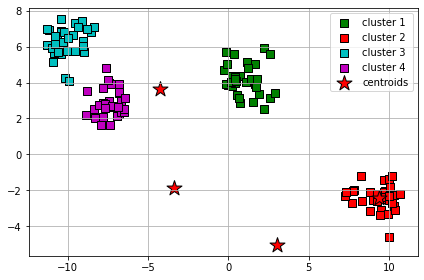

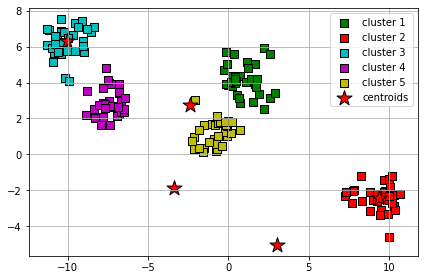

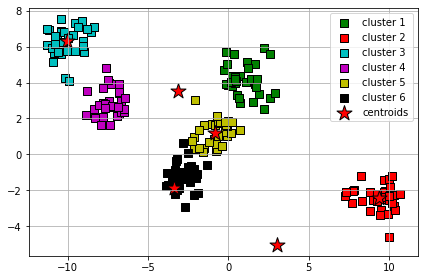

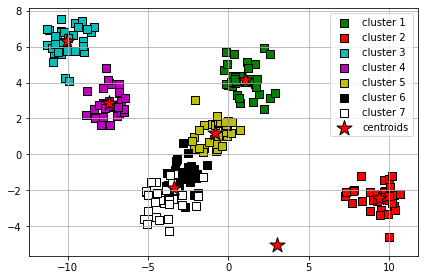

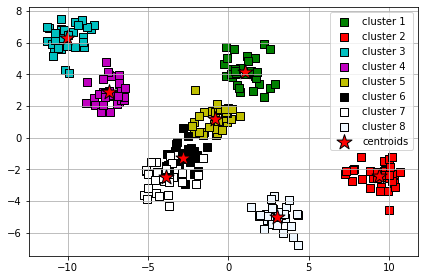

In [11]:
for n_clusters in range(4,9):
    km = KMeans(n_clusters=n_clusters,
                init='k-means++', 
                n_init=10, 
                max_iter=300,
                tol=1e-04,
                random_state=0)

    y_km = km.fit_predict(X)
    PlotClusters(X,y, km)

# Bonus

## Quantifying the quality of clustering  via silhouette plots

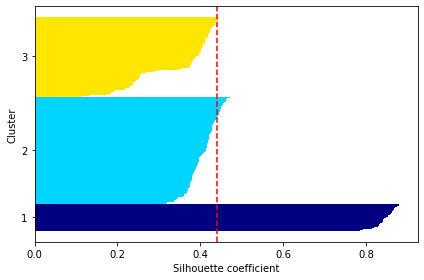

In [12]:
import numpy as np
from matplotlib import cm
from sklearn.metrics import silhouette_samples

km = KMeans(n_clusters=3, 
            init='k-means++', 
            n_init=10, 
            max_iter=300,
            tol=1e-04,
            random_state=0)
y_km = km.fit_predict(X)

cluster_labels = np.unique(y_km)
n_clusters = cluster_labels.shape[0]
silhouette_vals = silhouette_samples(X, y_km, metric='euclidean')
y_ax_lower, y_ax_upper = 0, 0
yticks = []
for i, c in enumerate(cluster_labels):
    c_silhouette_vals = silhouette_vals[y_km == c]
    c_silhouette_vals.sort()
    y_ax_upper += len(c_silhouette_vals)
    color = cm.jet(float(i) / n_clusters)
    plt.barh(range(y_ax_lower, y_ax_upper), c_silhouette_vals, height=1.0, 
             edgecolor='none', color=color)

    yticks.append((y_ax_lower + y_ax_upper) / 2.)
    y_ax_lower += len(c_silhouette_vals)
    
silhouette_avg = np.mean(silhouette_vals)
plt.axvline(silhouette_avg, color="red", linestyle="--") 

plt.yticks(yticks, cluster_labels + 1)
plt.ylabel('Cluster')
plt.xlabel('Silhouette coefficient')

plt.tight_layout()
#plt.savefig('images/11_04.png', dpi=300)
plt.show()

Comparison to "bad" clustering:

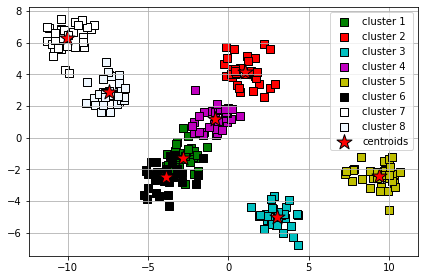

In [15]:
km = KMeans(n_clusters=8,
            init='k-means++',
            n_init=10,
            max_iter=300,
            tol=1e-04,
            random_state=0)
y_km = km.fit_predict(X)

PlotClusters(X,y_km, km)


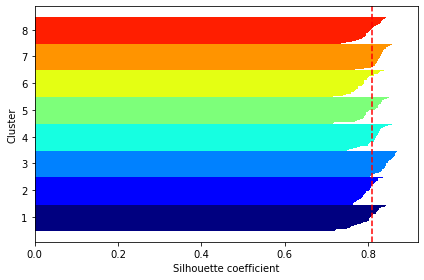

In [16]:
import numpy as np

cluster_labels = np.unique(y_km)
n_clusters = cluster_labels.shape[0]
silhouette_vals = silhouette_samples(X, y_km, metric='euclidean')
y_ax_lower, y_ax_upper = 0, 0
yticks = []
for i, c in enumerate(cluster_labels):
    c_silhouette_vals = silhouette_vals[y_km == c]
    c_silhouette_vals.sort()
    y_ax_upper += len(c_silhouette_vals)
    color = cm.jet(float(i) / n_clusters)
    plt.barh(range(y_ax_lower, y_ax_upper), c_silhouette_vals, height=1.0, 
             edgecolor='none', color=color)

    yticks.append((y_ax_lower + y_ax_upper) / 2.)
    y_ax_lower += len(c_silhouette_vals)
    
silhouette_avg = np.mean(silhouette_vals)
plt.axvline(silhouette_avg, color="red", linestyle="--") 

plt.yticks(yticks, cluster_labels + 1)
plt.ylabel('Cluster')
plt.xlabel('Silhouette coefficient')

plt.tight_layout()
#plt.savefig('images/11_06.png', dpi=300)
plt.show()

<br>
<br>

# Organizing clusters as a hierarchical tree

## Grouping clusters in bottom-up fashion

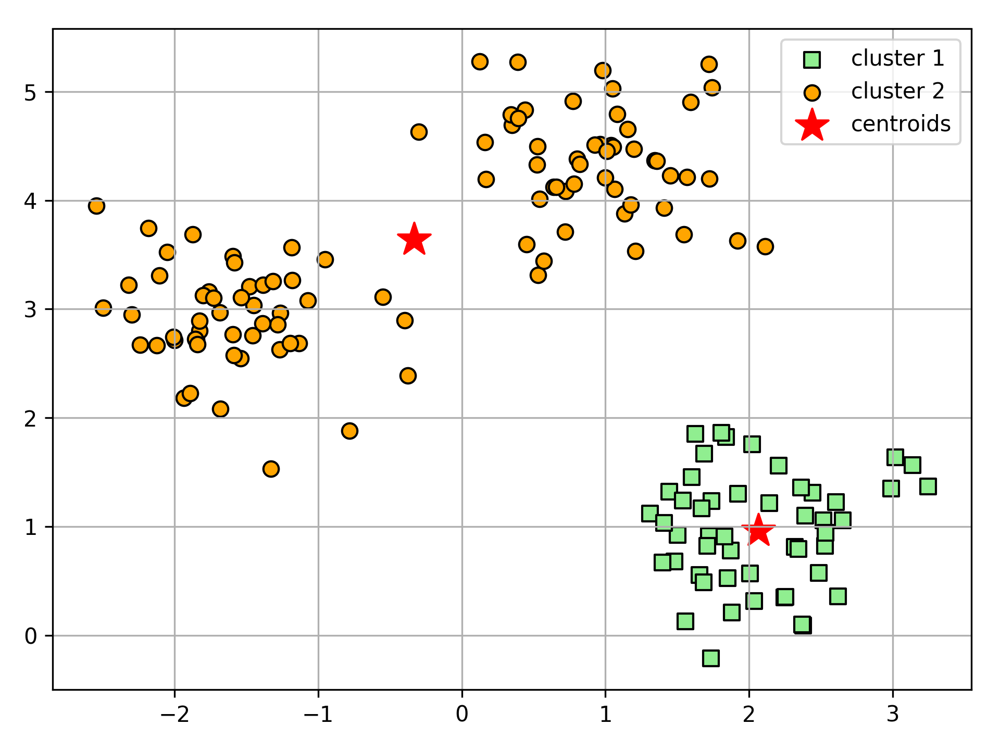

In [12]:
Image(filename='./images/11_05.png', width=400) 

In [13]:
import pandas as pd
import numpy as np

np.random.seed(123)

variables = ['X', 'Y', 'Z']
labels = ['ID_0', 'ID_1', 'ID_2', 'ID_3', 'ID_4']

X = np.random.random_sample([5, 3])*10
df = pd.DataFrame(X, columns=variables, index=labels)
df

,X,Y,Z
ID_0,6.964692,2.861393,2.268515
ID_1,5.513148,7.194690,4.231065
ID_2,9.807642,6.848297,4.809319
ID_3,3.921175,3.431780,7.290497
ID_4,4.385722,0.596779,3.980443


<br>

## Performing hierarchical clustering on a distance matrix

In [14]:
from scipy.spatial.distance import pdist, squareform

row_dist = pd.DataFrame(squareform(pdist(df, metric='euclidean')),
                        columns=labels,
                        index=labels)
row_dist

,ID_0,ID_1,ID_2,ID_3,ID_4
ID_0,0.000000,4.973534,5.516653,5.899885,3.835396
ID_1,4.973534,0.000000,4.347073,5.104311,6.698233
ID_2,5.516653,4.347073,0.000000,7.244262,8.316594
ID_3,5.899885,5.104311,7.244262,0.000000,4.382864
ID_4,3.835396,6.698233,8.316594,4.382864,0.000000


We can either pass a condensed distance matrix (upper triangular) from the `pdist` function, or we can pass the "original" data array and define the `metric='euclidean'` argument in `linkage`. However, we should not pass the squareform distance matrix, which would yield different distance values although the overall clustering could be the same.

In [15]:
# 1. incorrect approach: Squareform distance matrix

from scipy.cluster.hierarchy import linkage

row_clusters = linkage(row_dist, method='complete', metric='euclidean')
pd.DataFrame(row_clusters,
             columns=['row label 1', 'row label 2',
                      'distance', 'no. of items in clust.'],
             index=['cluster %d' % (i + 1)
                    for i in range(row_clusters.shape[0])])

C:\Anaconda3\lib\site-packages\ipykernel_launcher.py:5: ClusterWarning: scipy.cluster: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix
  """


,row label 1,row label 2,distance,no. of items in clust.
cluster 1,0.0,4.0,6.521973,2.0
cluster 2,1.0,2.0,6.729603,2.0
cluster 3,3.0,5.0,8.539247,3.0
cluster 4,6.0,7.0,12.444824,5.0


In [16]:
# 2. correct approach: Condensed distance matrix

row_clusters = linkage(pdist(df, metric='euclidean'), method='complete')
pd.DataFrame(row_clusters,
             columns=['row label 1', 'row label 2',
                      'distance', 'no. of items in clust.'],
             index=['cluster %d' % (i + 1) 
                    for i in range(row_clusters.shape[0])])

,row label 1,row label 2,distance,no. of items in clust.
cluster 1,0.0,4.0,3.835396,2.0
cluster 2,1.0,2.0,4.347073,2.0
cluster 3,3.0,5.0,5.899885,3.0
cluster 4,6.0,7.0,8.316594,5.0


In [17]:
# 3. correct approach: Input sample matrix

row_clusters = linkage(df.values, method='complete', metric='euclidean')
pd.DataFrame(row_clusters,
             columns=['row label 1', 'row label 2',
                      'distance', 'no. of items in clust.'],
             index=['cluster %d' % (i + 1)
                    for i in range(row_clusters.shape[0])])

,row label 1,row label 2,distance,no. of items in clust.
cluster 1,0.0,4.0,3.835396,2.0
cluster 2,1.0,2.0,4.347073,2.0
cluster 3,3.0,5.0,5.899885,3.0
cluster 4,6.0,7.0,8.316594,5.0


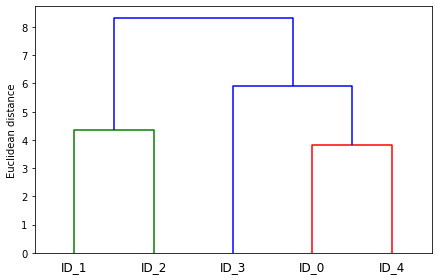

In [18]:
from scipy.cluster.hierarchy import dendrogram

# make dendrogram black (part 1/2)
# from scipy.cluster.hierarchy import set_link_color_palette
# set_link_color_palette(['black'])

row_dendr = dendrogram(row_clusters, 
                       labels=labels,
                       # make dendrogram black (part 2/2)
                       # color_threshold=np.inf
                       )
plt.tight_layout()
plt.ylabel('Euclidean distance')
#plt.savefig('images/11_11.png', dpi=300, 
#            bbox_inches='tight')
plt.show()

<br>

## Attaching dendrograms to a heat map

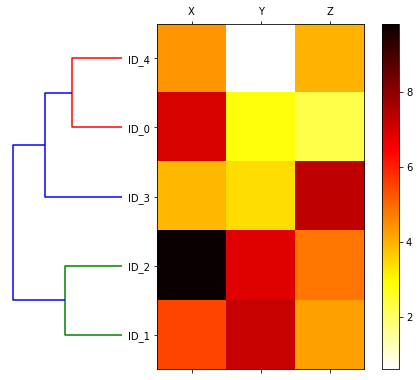

In [19]:
# plot row dendrogram
fig = plt.figure(figsize=(8, 8), facecolor='white')
axd = fig.add_axes([0.09, 0.1, 0.2, 0.6])

# note: for matplotlib < v1.5.1, please use orientation='right'
row_dendr = dendrogram(row_clusters, orientation='left')

# reorder data with respect to clustering
df_rowclust = df.iloc[row_dendr['leaves'][::-1]]

axd.set_xticks([])
axd.set_yticks([])

# remove axes spines from dendrogram
for i in axd.spines.values():
    i.set_visible(False)

# plot heatmap
axm = fig.add_axes([0.23, 0.1, 0.6, 0.6])  # x-pos, y-pos, width, height
cax = axm.matshow(df_rowclust, interpolation='nearest', cmap='hot_r')
fig.colorbar(cax)
axm.set_xticklabels([''] + list(df_rowclust.columns))
axm.set_yticklabels([''] + list(df_rowclust.index))

#plt.savefig('images/11_12.png', dpi=300)
plt.show()

<br>

## Applying agglomerative clustering via scikit-learn

In [20]:
from sklearn.cluster import AgglomerativeClustering

ac = AgglomerativeClustering(n_clusters=3, 
                             affinity='euclidean', 
                             linkage='complete')
labels = ac.fit_predict(X)
print('Cluster labels: %s' % labels)

Cluster labels: [1 0 0 2 1]


In [21]:
ac = AgglomerativeClustering(n_clusters=2, 
                             affinity='euclidean', 
                             linkage='complete')
labels = ac.fit_predict(X)
print('Cluster labels: %s' % labels)

Cluster labels: [0 1 1 0 0]


<br>
<br>

# Locating regions of high density via DBSCAN

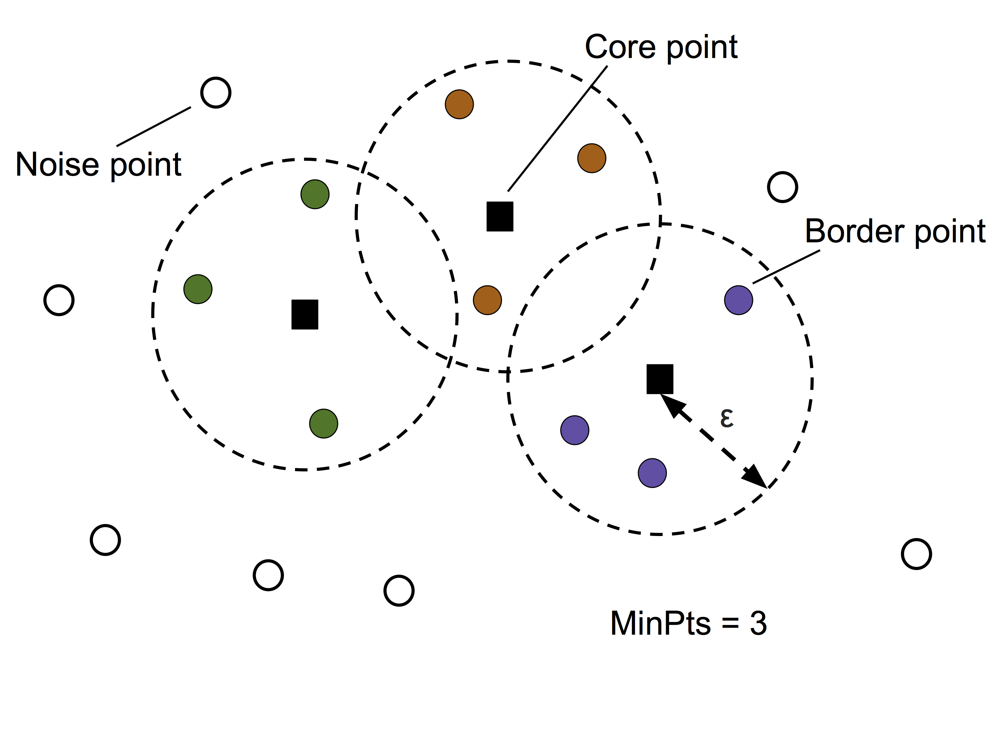

In [22]:
Image(filename='images/11_13.png', width=500) 

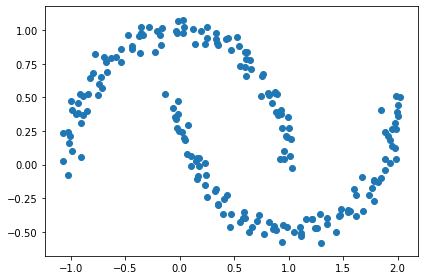

In [23]:
from sklearn.datasets import make_moons

X, y = make_moons(n_samples=200, noise=0.05, random_state=0)
plt.scatter(X[:, 0], X[:, 1])
plt.tight_layout()
#plt.savefig('images/11_14.png', dpi=300)
plt.show()

K-means and hierarchical clustering:

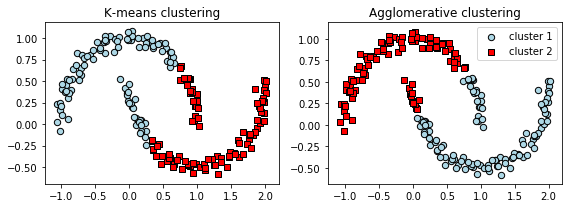

In [24]:
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(8, 3))

km = KMeans(n_clusters=2, random_state=0)
y_km = km.fit_predict(X)
ax1.scatter(X[y_km == 0, 0], X[y_km == 0, 1],
            edgecolor='black',
            c='lightblue', marker='o', s=40, label='cluster 1')
ax1.scatter(X[y_km == 1, 0], X[y_km == 1, 1],
            edgecolor='black',
            c='red', marker='s', s=40, label='cluster 2')
ax1.set_title('K-means clustering')

ac = AgglomerativeClustering(n_clusters=2,
                             affinity='euclidean',
                             linkage='complete')
y_ac = ac.fit_predict(X)
ax2.scatter(X[y_ac == 0, 0], X[y_ac == 0, 1], c='lightblue',
            edgecolor='black',
            marker='o', s=40, label='cluster 1')
ax2.scatter(X[y_ac == 1, 0], X[y_ac == 1, 1], c='red',
            edgecolor='black',
            marker='s', s=40, label='cluster 2')
ax2.set_title('Agglomerative clustering')

plt.legend()
plt.tight_layout()
# plt.savefig('images/11_15.png', dpi=300)
plt.show()

Density-based clustering:

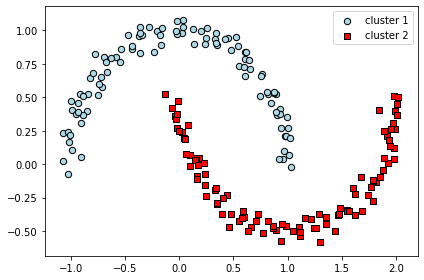

In [25]:
from sklearn.cluster import DBSCAN

db = DBSCAN(eps=0.2, min_samples=5, metric='euclidean')
y_db = db.fit_predict(X)
plt.scatter(X[y_db == 0, 0], X[y_db == 0, 1],
            c='lightblue', marker='o', s=40,
            edgecolor='black', 
            label='cluster 1')
plt.scatter(X[y_db == 1, 0], X[y_db == 1, 1],
            c='red', marker='s', s=40,
            edgecolor='black', 
            label='cluster 2')
plt.legend()
plt.tight_layout()
#plt.savefig('images/11_16.png', dpi=300)
plt.show()

<br>
<br>

<img src="ost_logo.png" width="240" height="240" align="right"/>
<div style="text-align: left"> <b> Machine Learning </b> <br> MSE FTP MachLe <br> 
<a href="mailto:christoph.wuersch@ost.ch"> Christoph Würsch </a> </div>

# Lab 12: A3 k-Means, Gaussian Mixture Models and the EM algorithm

In [1]:
import warnings
warnings.filterwarnings("ignore") 
from IPython.core.display import display, HTML

import time

import pandas as pd
#import pandas_datareader.data as web
import numpy as np
import scipy.stats as scs
from scipy.stats import multivariate_normal as mvn
import sklearn.mixture as mix

import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline


### To gain understanding of mixture models we have to start at the beginning with the expectation maximization algorithm and it's application

### First a little history on the EM-algorithm

Reference: 4

Demptser, Laird & Rubin (1977)
    -unified previously unrelated work under "The EM Algorithm"
    - unified previously unrelated work under "The EM Algorithm"
    - overlooked E-M works - see gaps between foundational authors
        - Newcomb (1887)
        - McKendrick (1926) [+39 years]
        - Hartley (1958) [+32 years]
        - Baum et. al. (1970) [+12 years]
        - Dempters et. al. (1977) [+7 years]

#### *EM Algorithm developed over 90 years*

## EM provides general framework for solving problems

Examples include:
    - Filling in missing data from a sample set
    - Discovering values of latent variables
    - Estimating parameters of HMMs
    - Estimating parameters of finite mixtures [models]
    - Unsupervised learning of clusters
    - etc...
    
### (a)  How does the EM algorithm work? 

EM is an iterative process that begins with a "naive" or random initialization and then alternates between the expectation and maximization steps until the algorithm reaches convergence. 

To describe this in words imagine we have a simple data set consisting of class heights with groups separated by gender.

In [2]:
# import class heights
f = 'https://raw.githubusercontent.com/BlackArbsCEO/Mixture_Models/K-Means%2C-E-M%2C-Mixture-Models/Class_heights.csv'

data = pd.read_csv(f)
data.to_csv('Class_heights.csv')
# data.info()

height = data['Height (in)']
data

,Gender,Height (in)
0,Male,72
1,Male,72
2,Female,63
3,Female,62
4,Female,62
5,Male,73
6,Female,64
7,Female,63
8,Female,67
9,Male,71


Now imagine that we did not have the convenient gender labels associated with each data point. How could we estimate the two group means? 

First let's set up our problem. 

In this example we hypothesize that these height data points are drawn from two distributions with two means - < $\mu_1$, $\mu_2$ >.

- The heights are the observed $x$ values. 

- The hidden variables, which EM is going to estimate, can be thought of in the following way. Each $x$ value has 2 associated $z$ values. These $z$ values < $z_1$, $z_2$ > represent the distribution (or class or cluster) that the data point is drawn from.

- Understanding the range of values the $z$ values can take is important. 

- In k-means, the two $z$'s can only take the values of 0 or 1. If the $x$ value came from the first distribution (cluster), then $z_1$=1 and $z_2$=0 and vice versa. This is called **hard** clustering. 

- In Gaussian Mixture Models, the $z$'s can take on any value between 0 and 1 because the x values are considered to be drawn probabilistically from 1 of the 2 distributions. For example $z$ values can be $z_1$=0.85 and $z_2$>=0.15, which represents a strong probability that the $x$ value came from distribution 1 and smaller probability that it came from distribution 2. This is called **soft** or **fuzzy** clustering. 


For this example, we will assume the x values are drawn from Gaussian distributions. 

To start the algorithm, we choose two random means. 

From there we repeat the following until convergence. 

#### The expectation step:

We calculate the expected values $E(z_{ij})$, which is the probability that $x_i$ was drawn from the $jth$ distribution.
    
$$E(z_{ij}) = \frac{p(x = x_i|\mu = \mu_j)}{\sum_{n=1}^2 p(x = x_i|\mu = \mu_j)}$$


$$= \frac{ e^{-\frac{1}{2\sigma^2}(x_i - \mu_j)^2} }
{ \sum_{n=1}^2e^{-\frac{1}{2\sigma^2}(x_i - \mu_n)^2} }$$

The formula simply states that the expected value for $z_{ij}$ is the probability $x_i$ given $\mu_j$ divided by the sum of the probabilities that $x_i$ belonged to each $\mu$

#### The maximization step:

After calculating all $E(z_{ij})$ values we can calculate (update) new $\mu$ values. 

$$ \mu_j = \frac {\sum_{i=1}^mE(z_{ij})x_i} {\sum_{i=1}^mE(z_{ij})}$$

This formula generates the maximum likelihood estimate. 

By repeating the E-step and M-step we are guaranteed to find a local maximum giving us a maximum likelihood estimation of our hypothesis. 

### What are Maximum Likelihood Estimates (MLE)

    1. Parameters describe characteristics (attributes) of a population. These parameter values are estimated from samples collected from that population.

    2. A MLE is a parameter estimate that is most consistent with the sampled data. By definition it maximizes the likelihood function. One way to accomplish this is to take the first derivative of the likelihood function w/ respect to the parameter theta and solve for 0. This value maximizes the likelihood function and is the MLE

### A quick example of a maximum likelihood estimate
    
#### You flip a coin 10 times and observe the following sequence (H, T, T, H, T, T, T, T, H, T)
#### What's the MLE of observing 3 heads in 10 trials?    

#### simple answer:    
    The frequentist MLE is (# of successes) / (# of trials) or 3/10

#### solving first derivative of binomial distribution answer:    

\begin{align}
\mathcal L(\theta) & = {10 \choose 3}\theta^3(1-\theta)^7 \\[1ex]
log\mathcal L(\theta) & = log{10 \choose 3} + 3log\theta + 7log(1 - \theta) \\[1ex]
\frac{dlog\mathcal L(\theta)}{d(\theta)} & = \frac 3\theta - \frac{7}{1-\theta} = 0 \\[1ex]
\frac 3\theta & = \frac{7}{1 - \theta} \Rightarrow \frac{3}{10}
\end{align}

#### That's a MLE! This is the estimate that is most consistent with the observed data

Back to our height example. Using the generalized Gaussian mixture model code sourced from Duke's computational statistics we can visualize this process. 

In [3]:
# Code sourced from:
#    http://people.duke.edu/~ccc14/sta-663/EMAlgorithm.html

def em_gmm_orig(xs, pis, mus, sigmas, tol=0.01, max_iter=100):

    n, p = xs.shape
    k = len(pis)

    ll_old = 0
    for i in range(max_iter):
        print('\nIteration: ', i)
        print()
        exp_A = []
        exp_B = []
        ll_new = 0

        # E-step
        ws = np.zeros((k, n))
        for j in range(len(mus)):
            for i in range(n):
                ws[j, i] = pis[j] * mvn(mus[j], sigmas[j]).pdf(xs[i])
        ws /= ws.sum(0)

        # M-step
        pis = np.zeros(k)
        for j in range(len(mus)):
            for i in range(n):
                pis[j] += ws[j, i]
        pis /= n

        mus = np.zeros((k, p))
        for j in range(k):
            for i in range(n):
                mus[j] += ws[j, i] * xs[i]
            mus[j] /= ws[j, :].sum()
        
        sigmas = np.zeros((k, p, p))
        for j in range(k):
            for i in range(n):
                ys = np.reshape(xs[i]- mus[j], (2,1))
                sigmas[j] += ws[j, i] * np.dot(ys, ys.T)
            sigmas[j] /= ws[j,:].sum()

        new_mus = (np.diag(mus)[0], np.diag(mus)[1])
        new_sigs = (np.unique(np.diag(sigmas[0]))[0], np.unique(np.diag(sigmas[1]))[0])
        df = (pd.DataFrame(index=[1, 2]).assign(mus = new_mus).assign(sigs = new_sigs))
        
        xx = np.linspace(0, 100, 100)
        yy = scs.multivariate_normal.pdf(xx, mean=new_mus[0], cov=new_sigs[0])
        
        colors = sns.color_palette('Dark2', 3)
        fig, ax = plt.subplots(figsize=(9, 7))
        ax.set_ylim(-0.001, np.max(yy))
        ax.plot(xx, yy, color=colors[1])
        ax.axvline(new_mus[0], ymin=0., color=colors[1])
        ax.fill_between(xx, 0, yy, alpha=0.5, color=colors[1])
        lo, hi = ax.get_ylim()
        ax.annotate(f'$\mu_1$: {new_mus[0]:3.2f}', 
                    fontsize=12, fontweight='demi',
                    xy=(new_mus[0], (hi-lo) / 2), 
                    xycoords='data', xytext=(80, (hi-lo) / 2),
                    arrowprops=dict(facecolor='black', connectionstyle="arc3,rad=0.2",shrink=0.05))
        ax.fill_between(xx, 0, yy, alpha=0.5, color=colors[2])
        
        yy2 = scs.multivariate_normal.pdf(xx, mean=new_mus[1], cov=new_sigs[1])
        
        ax.plot(xx, yy2, color=colors[2])
        ax.axvline(new_mus[1], ymin=0., color=colors[2])
        lo, hi = ax.get_ylim()
        ax.annotate(f'$\mu_2$: {new_mus[1]:3.2f}', 
                    fontsize=12, fontweight='demi',
            xy=(new_mus[1], (hi-lo) / 2), xycoords='data', xytext=(25, (hi-lo) / 2),
            arrowprops=dict(facecolor='black', connectionstyle="arc3,rad=0.2",shrink=0.05))
        ax.fill_between(xx, 0, yy2, alpha=0.5, color=colors[2])
        
        dot_kwds = dict(markerfacecolor='white', markeredgecolor='black', markeredgewidth=1, markersize=10)
        ax.plot(height, len(height)*[0], 'o', **dot_kwds)
        ax.set_ylim(-0.001, np.max(yy2))
        
        
        print(df.T)   
        
        # update complete log likelihoood
        ll_new = 0.0
        for i in range(n):
            s = 0
            for j in range(k):
                s += pis[j] * mvn(mus[j], sigmas[j]).pdf(xs[i])
            ll_new += np.log(s)
        print(f'log_likelihood: {ll_new:3.4f}')
        if np.abs(ll_new - ll_old) < tol:
            break
        ll_old = ll_new
        
    return ll_new, pis, mus, sigmas


Iteration:  0

               1           2
mus    61.362928   59.659685
sigs  469.240750  244.382352
log_likelihood: -141.8092

Iteration:  1

              1          2
mus    68.73773  63.620554
sigs  109.85442   7.228183
log_likelihood: -118.0520

Iteration:  2

              1          2
mus   70.569842  63.688825
sigs   4.424452   3.139277
log_likelihood: -100.2591

Iteration:  3

              1          2
mus   70.569842  63.688825
sigs   4.424427   3.139278
log_likelihood: -100.2591


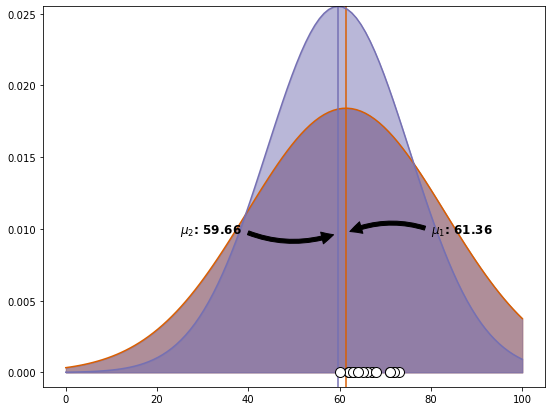

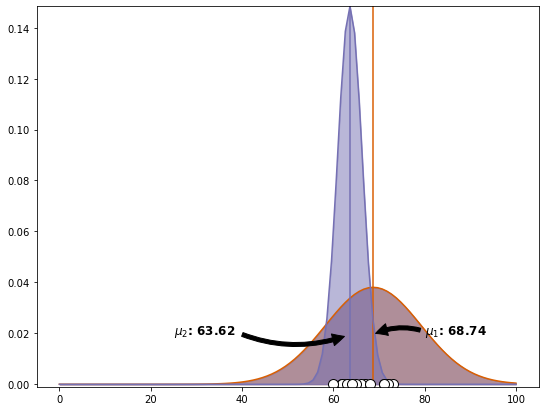

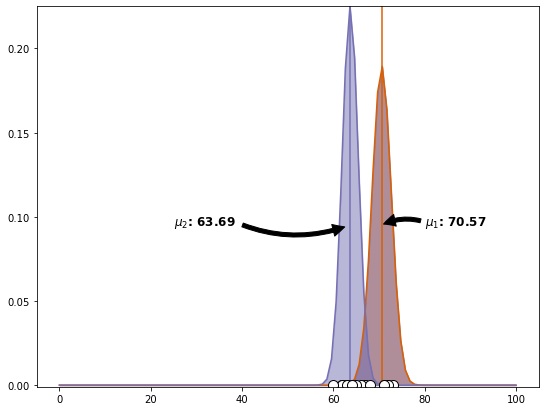

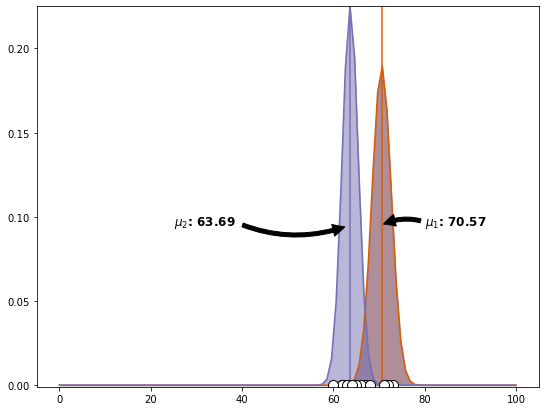

In [4]:
height = data['Height (in)']
n = len(height)

# Ground truthish
_mus = np.array([[0, data.groupby('Gender').mean().iat[0, 0]], 
                 [data.groupby('Gender').mean().iat[1, 0], 0]])
_sigmas = np.array([[[5, 0], [0, 5]], 
                    [[5, 0],[0, 5]]])
_pis = np.array([0.5, 0.5]) # priors

# initial random guesses for parameters
np.random.seed(0)

pis = np.random.random(2)
pis /= pis.sum()
mus = np.random.random((2,2))
sigmas = np.array([np.eye(2)] * 2) * height.std()

# generate our noisy x values
xs = np.concatenate([np.random.multivariate_normal(mu, sigma, int(pi*n))
                    for pi, mu, sigma in zip(_pis, _mus, _sigmas)])

ll, pis, mus, sigmas = em_gmm_orig(xs, pis, mus, sigmas)

# In the below plots the white dots represent the observed heights.

#### Notice how the algorithm was able to estimate the true means starting from random guesses for the parameters.

### Now that we have a grasp of the algorithm we can examine K-Means as a form of EM

K-Means is an unsupervised learning algorithm used for clustering multidimensional data sets.

The basic form of K-Means makes two *assumptions*

    1. Each data point is closer to its own cluster center than the other cluster centers
    2. A cluster center is the arithmetic mean of all the points that belong to the cluster.

The expectation step is done by calculating the pairwise distances  of every data point and assigning cluster membership to the closest center (mean)

The maximization step is simply the arithmetic mean of the previously assigned data points for each cluster

#### The following sections borrow heavily from Jake Vanderplas' [Python Data Science Handbook](https://www.amazon.com/gp/product/1491912057/ref=as_li_qf_sp_asin_il_tl?ie=UTF8&tag=blkarbs-20&camp=1789&creative=9325&linkCode=as2&creativeASIN=1491912057&linkId=e000ed9627cfe6b505be11c50118decb)

In [5]:
# Let's define some demo variables and make some blobs

# demo variables

k = 4
n_draws = 500
sigma = .7
random_state = 0
dot_size = 50
cmap = 'viridis'

Text(0.5, 1.0, 'k-means make blobs')

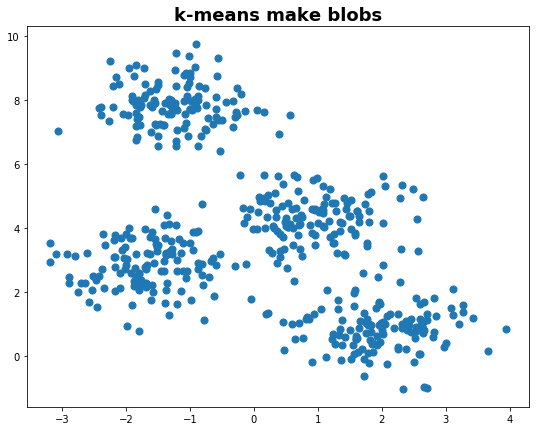

In [6]:
# make blobs

from sklearn.datasets.samples_generator import make_blobs

X, y_true = make_blobs(n_samples = n_draws,
                       centers = k,
                       cluster_std = sigma,
                       random_state = random_state)

fig, ax = plt.subplots(figsize=(9,7))
ax.scatter(X[:, 0], X[:, 1], s=dot_size)
plt.title('k-means make blobs', fontsize=18, fontweight='demi')

In [7]:
# sample implementation
# code sourced from: 
#   http://nbviewer.jupyter.org/github/jakevdp/PythonDataScienceHandbook/blob/master/notebooks/05.11-K-Means.ipynb

from sklearn.metrics import pairwise_distances_argmin

def find_clusters(X, n_clusters, rseed=2):
    # 1. Random initialization (choose random clusters)
    rng = np.random.RandomState(rseed)
    i = rng.permutation(X.shape[0])[:n_clusters]
    centers = X[i]

    while True:
        # 2a. Assign labels based on closest center
        labels = pairwise_distances_argmin(X, centers)

        # 2b. Find new centers from means of points
        new_centers = np.array([X[labels == i].mean(0) 
                                for i in range(n_clusters)])

        # 2c. Check for convergence
        if np.all(centers == new_centers):
            break
        centers = new_centers
    
    return centers, labels

Text(0.5, 1.0, 'sklearn k-means')

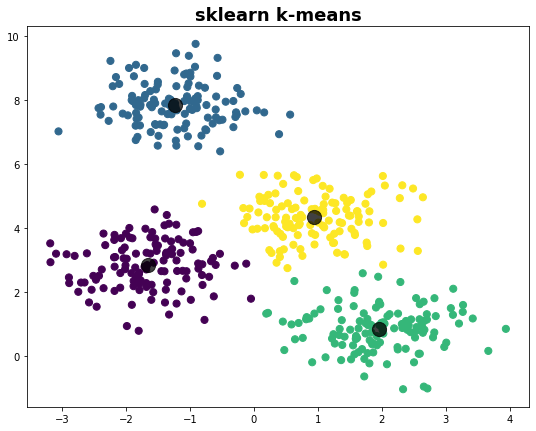

In [8]:
# now let's compare this to the sklearn's KMeans() algorithm

# fit k-means to blobs

from sklearn.cluster import KMeans

kmeans = KMeans(n_clusters=k)
kmeans.fit(X)
y_kmeans = kmeans.predict(X)

# visualize prediction
fig, ax = plt.subplots(figsize=(9,7))
ax.scatter(X[:, 0], X[:, 1], c=y_kmeans, s=dot_size, cmap=cmap)

# get centers for plot
centers = kmeans.cluster_centers_
ax.scatter(centers[:, 0], centers[:, 1], c='black', s=200, alpha=0.75)
plt.title('sklearn k-means', fontsize=18, fontweight='demi')

Text(0.5, 1.0, 'find_clusters() k-means func')

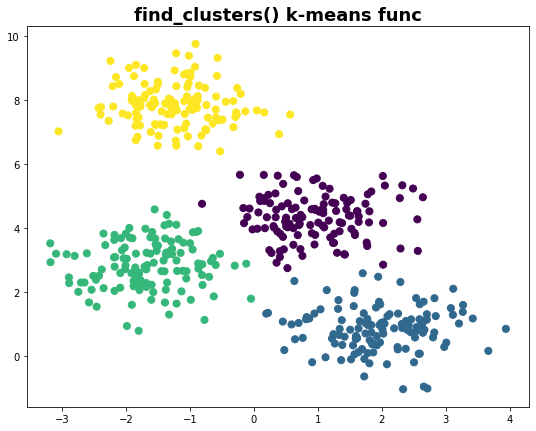

In [9]:
# let's test the implementation

centers, labels = find_clusters(X, k)

fig, ax = plt.subplots(figsize=(9,7))
ax.scatter(X[:, 0], X[:, 1], c=labels, s=dot_size, cmap=cmap)
plt.title('find_clusters() k-means func', fontsize=18, fontweight='demi')

#### To build our intuition of this process, play with the following interactive code from Jake Vanderplas in an Jupyter (IPython) notebook

In [10]:
# code sourced from:
#   http://nbviewer.jupyter.org/github/jakevdp/PythonDataScienceHandbook/blob/master/notebooks/06.00-Figure-Code.ipynb#Covariance-Type

from ipywidgets import interact

def plot_kmeans_interactive(min_clusters=1, max_clusters=6):
    X, y = make_blobs(n_samples=300, centers=4,
                      random_state=0, cluster_std=0.60)
        
    def plot_points(X, labels, n_clusters):
        plt.scatter(X[:, 0], X[:, 1], c=labels, s=50, cmap='viridis',
                    vmin=0, vmax=n_clusters - 1);
            
    def plot_centers(centers):
        plt.scatter(centers[:, 0], centers[:, 1], marker='o',
                    c=np.arange(centers.shape[0]),
                    s=200, cmap='viridis')
        plt.scatter(centers[:, 0], centers[:, 1], marker='o',
                    c='black', s=50)
            

    def _kmeans_step(frame=0, n_clusters=4):
        rng = np.random.RandomState(2)
        labels = np.zeros(X.shape[0])
        centers = rng.randn(n_clusters, 2)

        nsteps = frame // 3

        for i in range(nsteps + 1):
            old_centers = centers
            if i < nsteps or frame % 3 > 0:
                labels = pairwise_distances_argmin(X, centers)

            if i < nsteps or frame % 3 > 1:
                centers = np.array([X[labels == j].mean(0)
                                    for j in range(n_clusters)])
                nans = np.isnan(centers)
                centers[nans] = old_centers[nans]

        # plot the data and cluster centers
        plot_points(X, labels, n_clusters)
        plot_centers(old_centers)

        # plot new centers if third frame
        if frame % 3 == 2:
            for i in range(n_clusters):
                plt.annotate('', centers[i], old_centers[i], 
                             arrowprops=dict(arrowstyle='->', linewidth=1))
            plot_centers(centers)

        plt.xlim(-4, 4)
        plt.ylim(-2, 10)

        
        if frame % 3 == 1:
            plt.text(3.8, 9.5, "1. Reassign points to nearest centroid",
                     ha='right', va='top', size=14)
        elif frame % 3 == 2:
            plt.text(3.8, 9.5, "2. Update centroids to cluster means",
                     ha='right', va='top', size=14)
    
    return interact(_kmeans_step, frame=[0, 10, 20, 30, 40, 50, 300],
                    n_clusters=np.arange(min_clusters, max_clusters+1))

plot_kmeans_interactive(min_clusters=1, max_clusters=6)

interactive(children=(Dropdown(description='frame', options=(0, 10, 20, 30, 40, 50, 300), value=0), Dropdown(d…

<function __main__.plot_kmeans_interactive.<locals>._kmeans_step(frame=0, n_clusters=4)>

In [11]:
plot_kmeans_interactive(min_clusters=1, max_clusters=6)

interactive(children=(Dropdown(description='frame', options=(0, 10, 20, 30, 40, 50, 300), value=0), Dropdown(d…

<function __main__.plot_kmeans_interactive.<locals>._kmeans_step(frame=0, n_clusters=4)>

### Now we are ready to explore some of the nuances/issues of implementing K-Means as an expectation maximization algorithm

### the globally optimal result is not guaranteed
    - EM is guaranteed to improve the result in each iteration but there are no guarantees that it will find the global best. See the following example, where we initalize the algorithm with a different seed.

### practical solution: 
    - Run the algorithm w/ multiple random initializations
    - This is done by default in sklearn

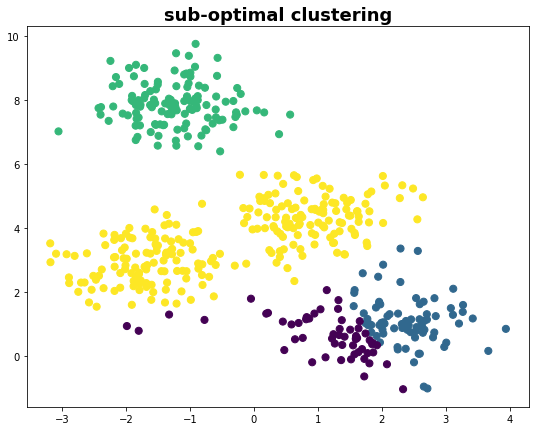

In [12]:
centers, labels = find_clusters(X, k, rseed=11)

fig, ax = plt.subplots(figsize=(9,7))
ax.set_title('sub-optimal clustering', fontsize=18, fontweight='demi')
ax.scatter(X[:, 0], X[:, 1], c=labels, s=dot_size, cmap=cmap)

### number of means (clusters) have to be selected beforehand
    - k-means cannot learn the optimal number of clusters from the data. If we ask for six clusters it will find six clusters, which may or may not be meaningful.
    
### practical solution:
    - use a more complex clustering algorithm like Gaussian Mixture Models, or one that can choose a suitable number of clusters (DBSCAN, mean-shift, affinity propagation)

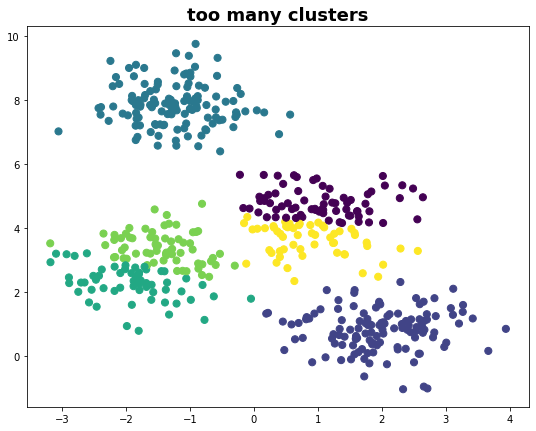

In [13]:
labels6 = KMeans(6, random_state=random_state).fit_predict(X)

fig, ax = plt.subplots(figsize=(9,7))
ax.set_title('too many clusters', fontsize=18, fontweight='demi')
ax.scatter(X[:, 0], X[:, 1], c=labels6, s=dot_size, cmap=cmap)

### k-means is terrible for non-linear data:
    - this results because of the assumption that points will be closer to their own cluster center than others

### practical solutions:
    - transform data into higher dimension where linear separation is possible e.g., spectral clustering

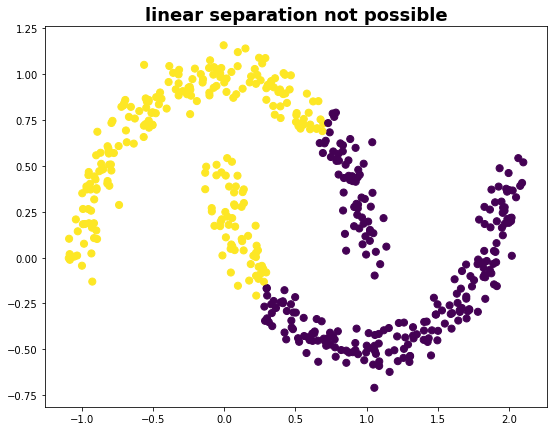

In [14]:
from sklearn.datasets import make_moons

X_mn, y_mn = make_moons(500, noise=.07, random_state=random_state)

labelsM = KMeans(2, random_state=random_state).fit_predict(X_mn)

fig, ax = plt.subplots(figsize=(9,7))
ax.set_title('linear separation not possible', fontsize=18, fontweight='demi')
ax.scatter(X_mn[:, 0], X_mn[:, 1], c=labelsM, s=dot_size, cmap=cmap)

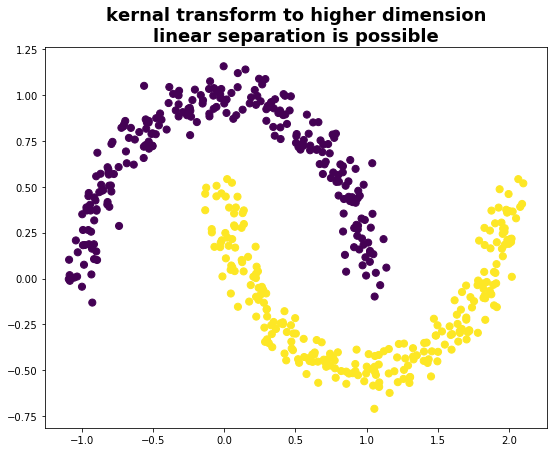

In [15]:
from sklearn.cluster import SpectralClustering

model = SpectralClustering(n_clusters=2, affinity='nearest_neighbors',
                          assign_labels='kmeans')

labelsS = model.fit_predict(X_mn)

fig, ax = plt.subplots(figsize=(9,7))
ax.set_title('kernal transform to higher dimension\nlinear separation is possible', fontsize=18, fontweight='demi')
plt.scatter(X_mn[:, 0], X_mn[:, 1], c=labelsS, s=dot_size, cmap=cmap)

### K-Means is known as a hard clustering algorithm because clusters are not allowed to overlap.  

> ___"One way to think about the k-means model is that it places a circle (or, in higher dimensions, a hyper-sphere) at the center of each cluster, with a radius defined by the most distant point in the cluster. This radius acts as a hard cutoff for cluster assignment within the training set: any point outside this circle is not considered a member of the cluster.___ -- <cite> [Jake VanderPlas Python Data Science Handbook] [1]</cite>

[1]:http://nbviewer.jupyter.org/github/jakevdp/PythonDataScienceHandbook/blob/master/notebooks/05.12-Gaussian-Mixtures.ipynb

Text(0.5, 1.0, 'Clusters are hard circular boundaries')

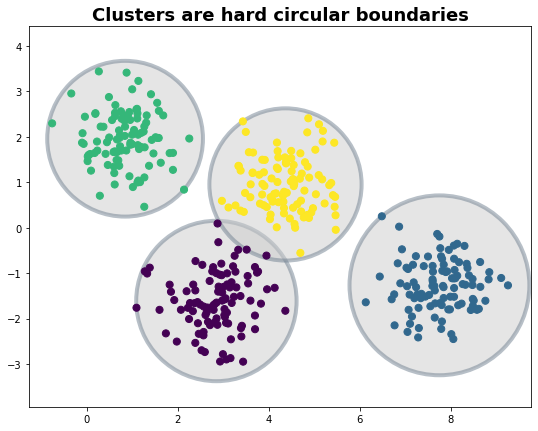

In [16]:
# k-means weaknesses that mixture models address directly
# code sourced from:
#   http://nbviewer.jupyter.org/github/jakevdp/PythonDataScienceHandbook/blob/master/notebooks/05.12-Gaussian-Mixtures.ipynb

from scipy.spatial.distance import cdist

def plot_kmeans(kmeans, X, n_clusters=k, rseed=2, ax=None):
    labels = kmeans.fit_predict(X)
    
    # plot input data
    #ax = ax or plt.gca() # <-- nice trick
    fig, ax = plt.subplots(figsize=(9,7))    
    ax.axis('equal')
    ax.scatter(X[:, 0], X[:, 1],
               c=labels, s=dot_size, cmap=cmap, zorder=2)
    
    # plot the representation of Kmeans model
    centers = kmeans.cluster_centers_
    radii = [cdist(X[labels==i], [center]).max() 
             for i, center in enumerate(centers)]
    
    for c, r in zip(centers, radii):
        ax.add_patch(plt.Circle(c, r, fc='#CCCCCC',edgecolor='slategrey',
                                lw=4, alpha=0.5, zorder=1))
    return      
                     
X3, y_true = make_blobs(n_samples = 400,
                       centers = k,
                       cluster_std = .6,
                       random_state = random_state)
X3 = X3[:, ::-1] # better plotting

kmeans = KMeans(n_clusters=k, random_state=random_state)
plot_kmeans(kmeans, X3)
plt.title('Clusters are hard circular boundaries', fontsize=18, fontweight='demi')

#### A resulting issue of K-Means' circular boundaries is that it has no way to account for oblong or elliptical clusters. 

Text(0.5, 1.0, 'Clusters cannot adjust to elliptical data structures')

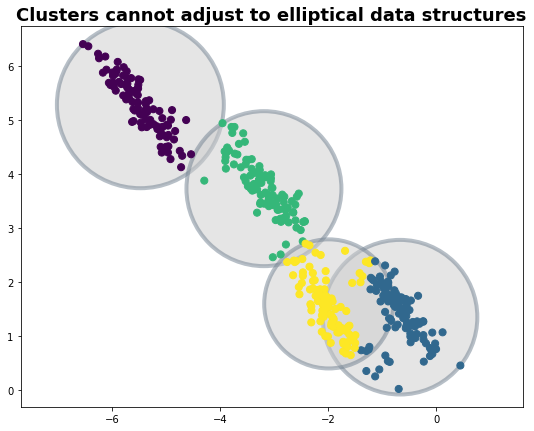

In [17]:
rng = np.random.RandomState(13)
X3_stretched = np.dot(X3, rng.randn(2, 2))

kmeans = KMeans(n_clusters=k, random_state=random_state)
plot_kmeans(kmeans, X3_stretched)
plt.title('Clusters cannot adjust to elliptical data structures',
         fontsize=18, fontweight='demi')

### There are two ways we can extend K-Means

    1. measure uncertainty in cluster assignments by comparing distances to all cluster centers
    2. allow for flexibility in the shape of the cluster boundaries by using ellipses

### Recall our previous height example, and let's  assume that each cluster is a Gaussian distribution!

#### Gaussian distributions give flexibility to the clustering, and the same basic two step E-M algorithm used in K-Means is applied here as well. 

1. Randomly initialize location and shape
2. Repeat until converged:
       E-step: for each point, find weights encoding the probability of membership in each cluster.
       
       M-step: for each cluster, update its location, normalization, and shape based on all data points, making use of the weights
       
#### The result of this process is that we end up with a smooth Gaussian cluster better fitted to the shape of the data, instead of a rigid inflexible circle. 

#### Note that because we still are using the E-M algorithm there is no guarantee of a globally optimal result. We can visualize the results of the model. 

In [18]:
# code sourced from:
#  http://nbviewer.jupyter.org/github/jakevdp/PythonDataScienceHandbook/blob/master/notebooks/05.12-Gaussian-Mixtures.ipynb
from matplotlib.patches import Ellipse 

def draw_ellipse(position, covariance, ax=None, **kwargs):
    """Draw an ellipse with a given position and covariance"""
    
    # Convert covariance to principal axes
    if covariance.shape == (2, 2):
        U, s, Vt = np.linalg.svd(covariance)
        angle = np.degrees(np.arctan2(U[1, 0], U[0, 0]))
        width, height = 2 * np.sqrt(s)
    else:
        angle = 0
        width, height = 2 * np.sqrt(covariance)
        
    # Draw the Ellipse
    for nsig in range(1, 4):
        ax.add_patch(Ellipse(position, nsig * width, nsig * height, 
                            angle, **kwargs))
        
def plot_gmm(gmm, X, label=True, ax=None):
    
    fig, ax = plt.subplots(figsize=(9,7))      
    ax = ax or plt.gca()
    labels = gmm.fit(X).predict(X)
    
    if label:
        ax.scatter(X[:, 0], X[:, 1], c=labels, s=dot_size, cmap=cmap, zorder=2)
    else:
        ax.scatter(X[:, 0], X[:, 1], s=dot_size, zorder=2)
    ax.axis('equal')
    
    w_factor = 0.2 / gmm.weights_.max()
    for pos, covar, w in zip(gmm.means_, gmm.covariances_, gmm.weights_):
        draw_ellipse(pos, covar, ax=ax, alpha=w * w_factor)

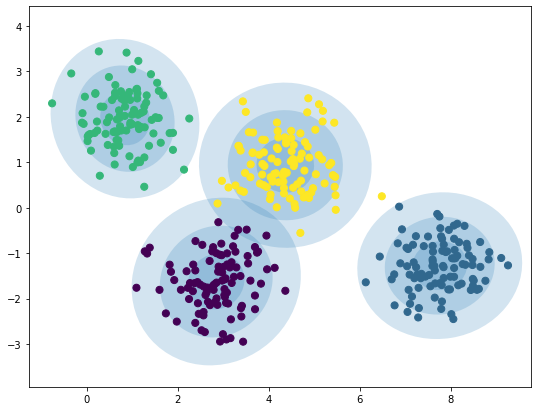

In [19]:
gmm = mix.GaussianMixture(n_components=k, random_state=random_state)
plot_gmm(gmm, X3)

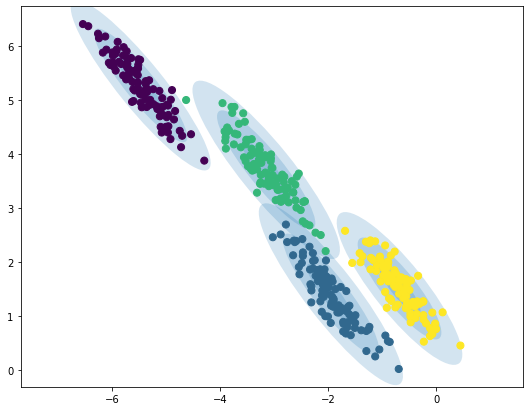

In [20]:
# lets test on the stretched data set

gmm = mix.GaussianMixture(n_components=k, random_state=random_state+1)
plot_gmm(gmm, X3_stretched)

#### Notice how much better the model is able to fit the clusters when we assume each cluster is a Gaussian distribution instead of circle whose radius is defined by the most distant point.

## Gaussian Mixture Models as a tool for Density Estimation

#### The technical term for this type of model is: 

> __generative probabilistic model__

#### Why you ask? 

Because this model is really about characterizing the distribution of the entire dataset and not necessarily clustering. The power of these types of models is that they allow us to generate __new__ samples that __mimic__ the original underlying data!

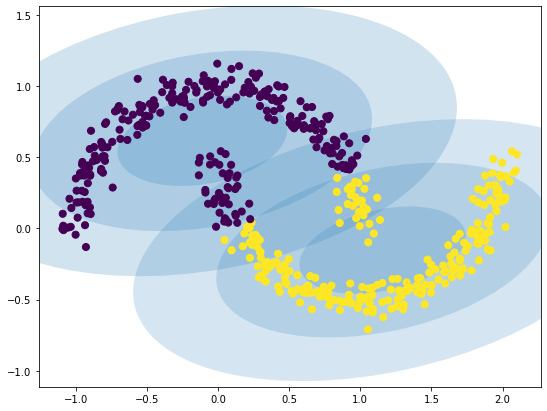

In [21]:
gmm2 = mix.GaussianMixture(n_components=2, covariance_type='full',
                          random_state=random_state)
plot_gmm(gmm2, X_mn)

If we try to cluster this data set we run into the same issue as before.

Instead let's ignore individual clusters and model the whole distribution of data as a collection of many Gaussians. 

Text(0.5, 1.0, 'Collective Gaussian clusters')

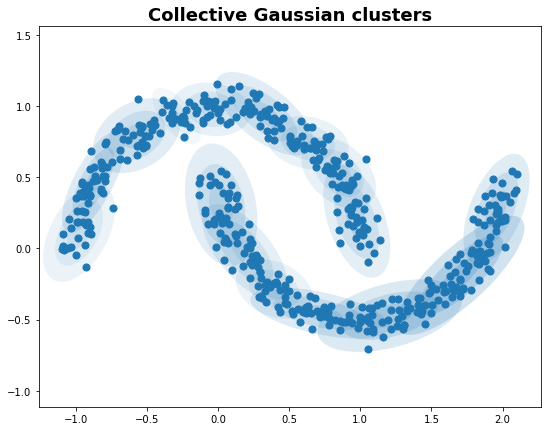

In [22]:
gmm16 = mix.GaussianMixture(n_components=16, covariance_type='full', 
                           random_state=random_state)

plot_gmm(gmm16, X_mn, label=False)
plt.title('Collective Gaussian clusters',
            fontsize=18, fontweight='demi')

Looks like the collection of clusters has fit the data set reasonably well. Now let's see if the model has actually _learned_ about this data set, such that we can create entirely new samples that _look_ like the original.

Text(0.5, 1.0, 'New samples drawn from fitted model')

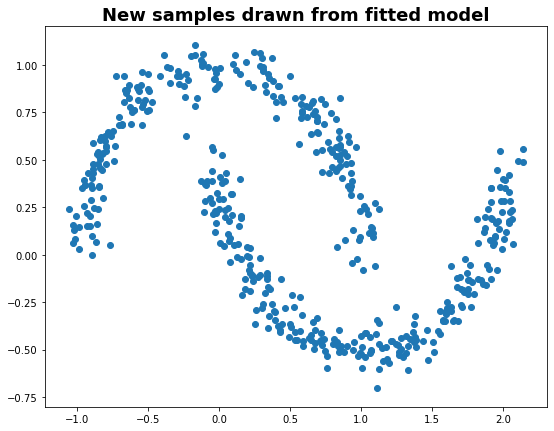

In [23]:
Xnew, ynew = gmm16.sample(500)

fig, ax = plt.subplots(figsize=(9,7))
ax.scatter(Xnew[:, 0], Xnew[:, 1]);
ax.set_title('New samples drawn from fitted model',
            fontsize=18, fontweight='demi')

Generative models allow for multiple methods to determine optimal number of components. Because it is a probability distribution we can evaluate the likelihood of the data using cross validation and/or using AIC or BIC. 

Sklearn makes this easy.

Text(0.5, 0, 'n_components')

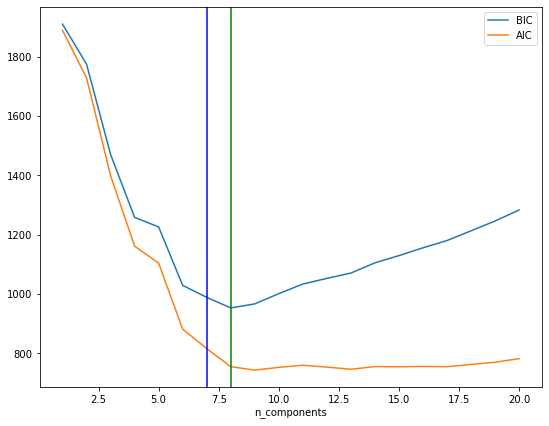

In [24]:
n_components = np.arange(1, 21)
models = [mix.GaussianMixture(n, covariance_type='full',
                             random_state=random_state).fit(X_mn)
         for n in n_components]

fig, ax = plt.subplots(figsize=(9,7))
ax.plot(n_components, [m.bic(X_mn) for m in models], label='BIC')
ax.plot(n_components, [m.aic(X_mn) for m in models], label='AIC')
ax.axvline(np.argmin([m.bic(X_mn) for m in models]), color='blue')
ax.axvline(np.argmin([m.aic(X_mn) for m in models]), color='green')

plt.legend(loc='best')
plt.xlabel('n_components')

<img src="ost_logo.png" width="240" height="240" align="right"/>
<div style="text-align: left"> <b> Machine Learning </b> <br> MSE FTP MachLe <br> 
<a href="mailto:christoph.wuersch@ost.ch"> Christoph Würsch </a> </div>

# Lab12: A4 Image Compression using `kMeans`

Clustering can be used to reduce colors in an image. Similar colors will be assigned to the same
cluster label or color palette. In In the following exercise, you will load an image as a $\left[ w, h, 3\right]$
`numpy.array` of type float64 , where $w$ and $h$ are the width and height in pixels respecively.
The last dimension of the three dimensional array are three the RGB color channels. Using
kMeans, we will reduce the color depth from 24 bits to 64 colors (6 bits) and to 16 colors (4
bits).

### (a) Reading an Image

Start by reading in an image from the Python imaging library PIL (https://en.wikipedia.org/wiki/Python_Imaging_Library) in your Jupyter notebook.

In [1]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from sklearn.utils import shuffle
from PIL import Image

# First we read and flatten the image. 
original_img = np.array(Image.open('.\images\Hirsch.jpg'), dtype=np.float64) / 255
print(original_img.shape)
original_dimensions = tuple(original_img.shape)
width, height, depth = tuple(original_img.shape)


(1960, 4032, 3)


### (b) Flatten the image

Flatten the image to a $\left[w \cdot h, 3 \right]$-dimensional numpy.array and shuffle the pixels using
sklearn.utils.shuffle.

In [2]:
image_flattened = np.reshape(original_img, (width * height, depth))

### (c) Quantization to 64 colors

Create an instance of the `kMeans` class called estimator. Use the `fit` method of `kMeans` to create sixty-four clusters (`n_clusters=64`) from a sample of one thousand randomly selected colors, e.g. the first 1000 colors of the shuffled pixels. The new color palette is given by the cluster centers that are accessible in `estimator.cluster_centers_`.
Each of the clusters will be a color in the compressed palette.

In [3]:
image_array_sample = shuffle(image_flattened, random_state=0)[:1000]
estimator = KMeans(n_clusters=8, random_state=0)
estimator.fit(image_array_sample)

KMeans(random_state=0)

### (d) Prediction of the cluster assignment (labels)

Assign the cluster labels to each pixel in the original image using the `.predict` method
of your `kMeans` instance. Now, you know to which color in your reduced palette each pixel
belongs to, i.e. we predict the cluster assignment for each of the pixels in the original image.

In [4]:
cluster_assignments = estimator.predict(image_flattened)

### (e) Create a compressed image using only 64 colors

Finally, we create the compressed image from the compressed palette and cluster assignments. 

Loop over all pixels and assign the new color palette corresponding to the label of the
pixel and create a new, reduced color picture. Plot the images using plt.imshow, compare
the original image and the 64 color image. Try the same with 32 and 16 colors.


In [5]:
compressed_palette = estimator.cluster_centers_
compressed_img = np.zeros((width, height, compressed_palette.shape[1]))
label_idx = 0
for i in range(width):
    for j in range(height):
        compressed_img[i][j] = compressed_palette[cluster_assignments[label_idx]]
        label_idx += 1



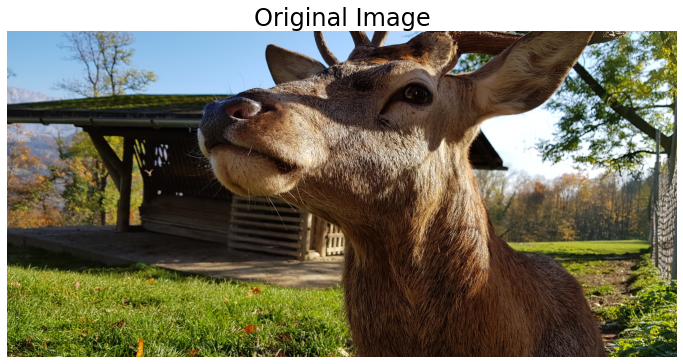

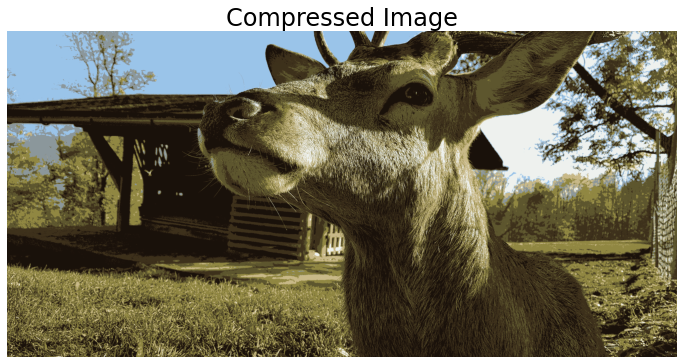

In [6]:
plt.figure(figsize=(12,12))
#plt.subplot(121)
plt.title('Original Image', fontsize=24)
plt.imshow(original_img, origin='lower')
plt.axis('off')
#plt.subplot(122)
plt.figure(figsize=(12,12))
plt.title('Compressed Image', fontsize=24)
plt.imshow(compressed_img,origin='lower')
plt.axis('off')
plt.show()

<img src="ost_logo.png" width="240" height="240" align="right"/>
<div style="text-align: left"> <b> Machine Learning </b> <br> MSE FTP MachLe <br> 
<a href="mailto:christoph.wuersch@ost.ch"> Christoph Würsch </a> </div>

# ML12 A5 Detecting similar Faces using `DBSCAN?

The labelled faces dataset of sckit-learn contains gray scale images of 62 differnet famous personalites
from politics. In this exercise, we assume that there are no target labels, i.e. the names of
the persons are *unknown*. We want to find a method to cluster similar images. This can be done
using a _dimensionality reduction algorithm like PCA_ for feature generation and a subsequent
clustering e.g. using `DBSCAN`.

In [1]:
%matplotlib inline
from IPython.display import set_matplotlib_formats, display
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from cycler import cycler
plt.rcParams['image.cmap'] = "gray"

In [2]:
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()

### (a) Loading the Faces Dataset

Open the Jupyter notebook `DBSCAN_DetectSimilarFaces.jpynb` and have a look at the
first few faces of the dataset. Not every person is represented equally frequent in this
unbalanced dataset. For classification, we would have to take this into account. We extract
the first 50 images of each person and put them into a flat array called X_people. The
correspinding targets (y-values, names), are storeed in the y_people array.

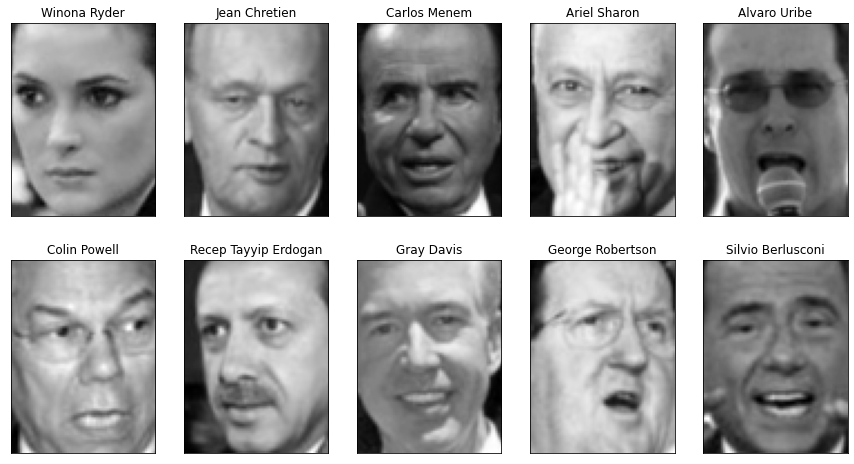

In [3]:
from sklearn.datasets import fetch_lfw_people
people = fetch_lfw_people(min_faces_per_person=20, resize=0.7)
image_shape = people.images[0].shape

fig, axes = plt.subplots(2, 5, figsize=(15, 8),
                         subplot_kw={'xticks': (), 'yticks': ()})
for target, image, ax in zip(people.target, people.images, axes.ravel()):
    ax.imshow(image)
    ax.set_title(people.target_names[target])

In [4]:
people.target_names

array(['Alejandro Toledo', 'Alvaro Uribe', 'Amelie Mauresmo',
       'Andre Agassi', 'Angelina Jolie', 'Ariel Sharon',
       'Arnold Schwarzenegger', 'Atal Bihari Vajpayee', 'Bill Clinton',
       'Carlos Menem', 'Colin Powell', 'David Beckham', 'Donald Rumsfeld',
       'George Robertson', 'George W Bush', 'Gerhard Schroeder',
       'Gloria Macapagal Arroyo', 'Gray Davis', 'Guillermo Coria',
       'Hamid Karzai', 'Hans Blix', 'Hugo Chavez', 'Igor Ivanov',
       'Jack Straw', 'Jacques Chirac', 'Jean Chretien',
       'Jennifer Aniston', 'Jennifer Capriati', 'Jennifer Lopez',
       'Jeremy Greenstock', 'Jiang Zemin', 'John Ashcroft',
       'John Negroponte', 'Jose Maria Aznar', 'Juan Carlos Ferrero',
       'Junichiro Koizumi', 'Kofi Annan', 'Laura Bush',
       'Lindsay Davenport', 'Lleyton Hewitt', 'Luiz Inacio Lula da Silva',
       'Mahmoud Abbas', 'Megawati Sukarnoputri', 'Michael Bloomberg',
       'Naomi Watts', 'Nestor Kirchner', 'Paul Bremer', 'Pete Sampras',
       'Rece

In [5]:
print("people.images.shape: {}".format(people.images.shape))
print("Number of classes: {}".format(len(people.target_names)))

people.images.shape: (3023, 87, 65)
Number of classes: 62


In [6]:
# count how often each target appears
counts = np.bincount(people.target)
# print counts next to target names:
for i, (count, name) in enumerate(zip(counts, people.target_names)):
    print("{0:25} {1:3}".format(name, count), end='   ')
    if (i + 1) % 3 == 0:
        print()

Alejandro Toledo           39   Alvaro Uribe               35   Amelie Mauresmo            21   
Andre Agassi               36   Angelina Jolie             20   Ariel Sharon               77   
Arnold Schwarzenegger      42   Atal Bihari Vajpayee       24   Bill Clinton               29   
Carlos Menem               21   Colin Powell              236   David Beckham              31   
Donald Rumsfeld           121   George Robertson           22   George W Bush             530   
Gerhard Schroeder         109   Gloria Macapagal Arroyo    44   Gray Davis                 26   
Guillermo Coria            30   Hamid Karzai               22   Hans Blix                  39   
Hugo Chavez                71   Igor Ivanov                20   Jack Straw                 28   
Jacques Chirac             52   Jean Chretien              55   Jennifer Aniston           21   
Jennifer Capriati          42   Jennifer Lopez             21   Jeremy Greenstock          24   
Jiang Zemin                20 

In [7]:
87*65

5655

In [10]:
mask = np.zeros(people.target.shape, dtype=np.bool)
for target in np.unique(people.target):
    mask[np.where(people.target == target)[0][:50]] = 1
    
X_people = people.data[mask]
y_people = people.target[mask]

# scale the grey-scale values to be between 0 and 1
# instead of 0 and 255 for better numeric stability:
X_people = X_people / 255.

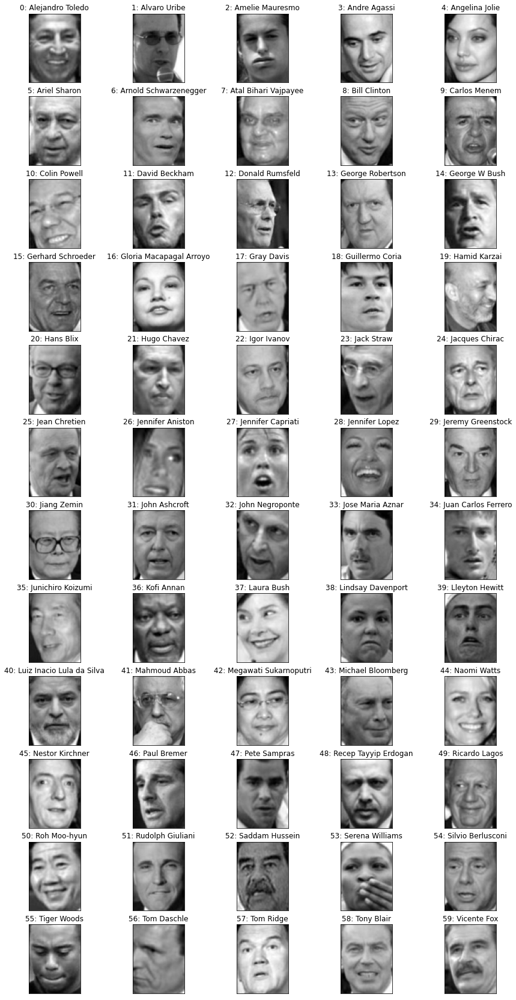

In [11]:
NumberOfPeople=np.unique(people.target).shape[0]
TargetNames  = [];
n=5

#find the first 5 images from each person
fig, axes = plt.subplots(12, 5, figsize=(15, 30),
                         subplot_kw={'xticks': (), 'yticks': ()})

for target,ax in zip(np.unique(people.target),axes.ravel()):
    #get the first n pictures from each person
    indices=np.where(people.target == target)[0][1:n+1]
    TargetNames.append(people.target_names[target])
    
    image=people.images[indices[0]]
    ax.imshow(image)
    ax.set_title(str(target)+': '+TargetNames[target])

    

### (b) Principal Component Analysis

Apply now a principal component analysis `X_pca=pca.fit_transform(X_people)` and
extract the first 100 components of each image. Reconstruct the first 10 entries of the dataset
using the 100 components of the PCA transformed data by applying the
`pca.inverse_transform` method and reshaping the image to the original size using
np.reshape. 

What is the minimum number of components necessary such that you recognize
the persons? Try it out.


In [13]:
NumberOfPeople

62

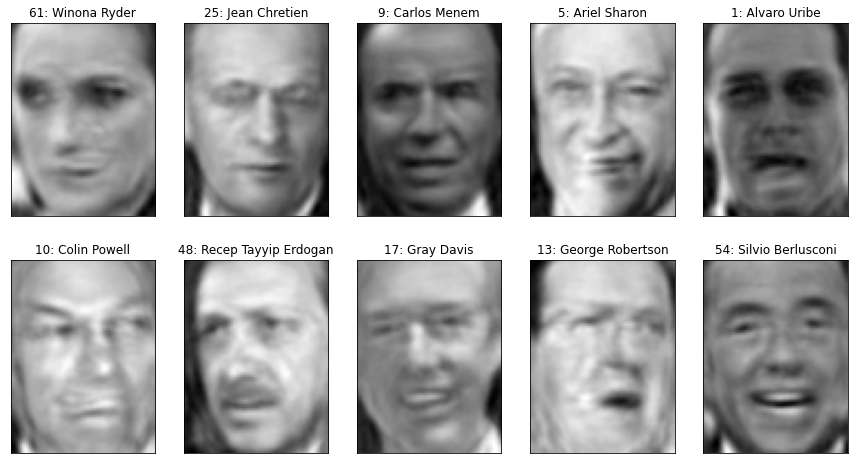

In [22]:
#extract eigenfaces from lfw data and transform data
from sklearn.decomposition import PCA
pca = PCA(n_components=200, whiten=True, random_state=0)
X_pca = pca.fit_transform(X_people)
#X_pca = pca.transform(X_people)

image_shape = people.images[0].shape
NumberOfSamples=X_pca.shape[0]

fig, axes = plt.subplots(2, 5, figsize=(15, 8),
                         subplot_kw={'xticks': (), 'yticks': ()})

for ix, target, ax in zip(np.arange(NumberOfSamples), y_people, axes.ravel()):
    image=np.reshape(pca.inverse_transform(X_pca[ix,:]),image_shape)
    ax.imshow(image)
    ax.set_title(str(y_people[ix])+': '+people.target_names[target])


### (c) Apply DBSCAN on these features

Import DBSCAN class from sklearn.cluster, generate an instance called dbscan and
apply it to the pca transformed data X_pca and extract the cluster labels using labels
= dbscan.fit_predict(X_pca). Use first the standard parameters for the method and
check how many unique clusters the algorithm could find by analyzing the number of
unique entries in the predicted cluster labels.

In [23]:
# apply DBSCAN with default parameters
from sklearn.cluster import DBSCAN
dbscan = DBSCAN()
labels = dbscan.fit_predict(X_pca)
print("Unique labels: {}".format(np.unique(labels)))

Unique labels: [-1]


### (d) Variation of the `eps` parameter

Change the parameter eps of the dbscan using `dbscan(min_samples=3, eps=5)`. Change
the value of eps in the range from 5 to 10 in steps of 0.5 using a for loop and check for
each value of eps how many clusters could be determined.

In [25]:
for eps in np.linspace(14,20,11):
    print("\neps={}".format(eps))
    dbscan = DBSCAN(eps=eps, min_samples=3)
    labels = dbscan.fit_predict(X_pca)
    print("Number of clusters: {}".format(len(np.unique(labels))))
    print("Cluster sizes: {}".format(np.bincount(labels + 1)))


eps=14.0
Number of clusters: 4
Cluster sizes: [1195  862    3    3]

eps=14.6
Number of clusters: 3
Cluster sizes: [ 967 1093    3]

eps=15.2
Number of clusters: 3
Cluster sizes: [ 754 1306    3]

eps=15.8
Number of clusters: 2
Cluster sizes: [ 586 1477]

eps=16.4
Number of clusters: 2
Cluster sizes: [ 440 1623]

eps=17.0
Number of clusters: 2
Cluster sizes: [ 332 1731]

eps=17.6
Number of clusters: 2
Cluster sizes: [ 261 1802]

eps=18.2
Number of clusters: 2
Cluster sizes: [ 191 1872]

eps=18.8
Number of clusters: 2
Cluster sizes: [ 134 1929]

eps=19.4
Number of clusters: 2
Cluster sizes: [  97 1966]

eps=20.0
Number of clusters: 2
Cluster sizes: [  75 1988]


### (e) Maxumum number of clusters found

Select the value of `eps` where the numbers of clusters found is maximum and plot the
members of the clusters found using the follwing python code.

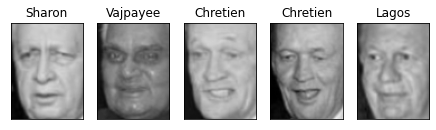

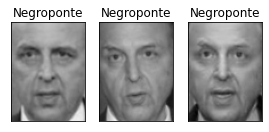

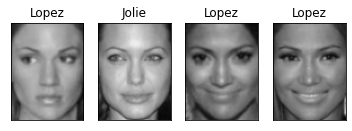

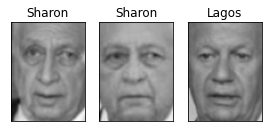

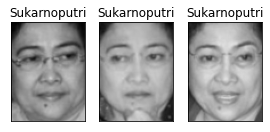

...

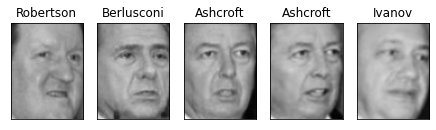

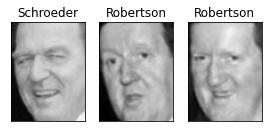

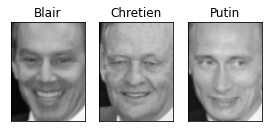

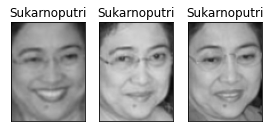

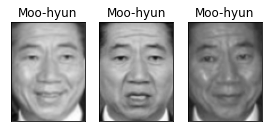

In [17]:
dbscan = DBSCAN(min_samples=3, eps=7.50)
labels = dbscan.fit_predict(X_pca)

for cluster in range(max(labels) + 1):
    mask = labels == cluster
    n_images =  np.sum(mask)
    if n_images<7:
        fig, axes = plt.subplots(1, n_images, figsize=(n_images * 1.5, 4),
                             subplot_kw={'xticks': (), 'yticks': ()})
        for image, label, ax in zip(X_people[mask], y_people[mask], axes):

            ax.imshow(image.reshape(image_shape), vmin=0, vmax=1)
            ax.set_title(people.target_names[label].split()[-1])

# Bonus: Agglomerative and Spectral Clustering (optional)

SpectralClustering(affinity='nearest_neighbors', assign_labels='kmeans',
                   coef0=1, degree=3, eigen_solver='arpack', eigen_tol=0.0,
                   gamma=1.0, kernel_params=None, n_clusters=14,
                   n_components=None, n_init=10, n_jobs=None, n_neighbors=10,
                   random_state=None)
SpectralClustering: 2.5 sec
labels found: 14
_____________________________________________
       SpectralClustering                                     
_____________________________________________
max image: 8



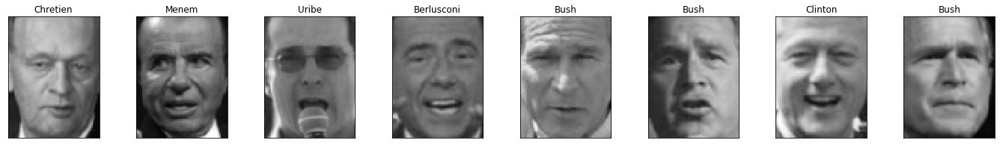

max image: 8



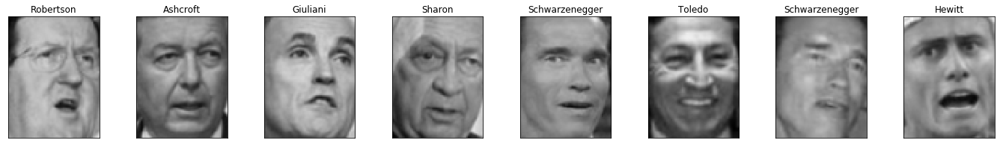

max image: 8



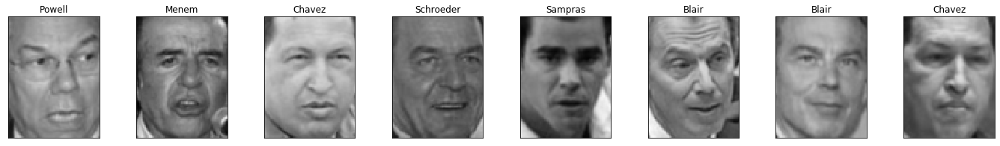

max image: 8



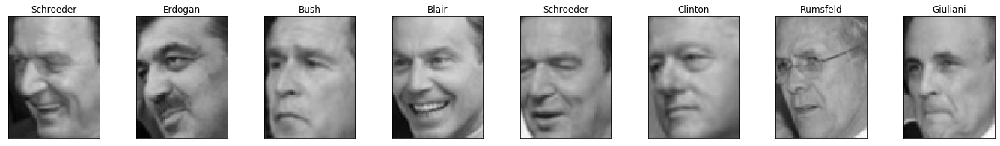

max image: 8



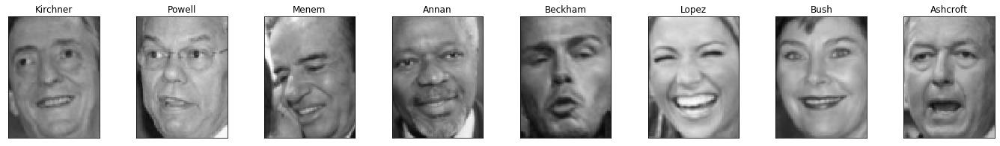

max image: 8



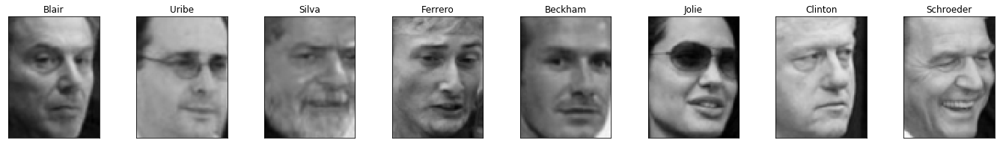

max image: 8



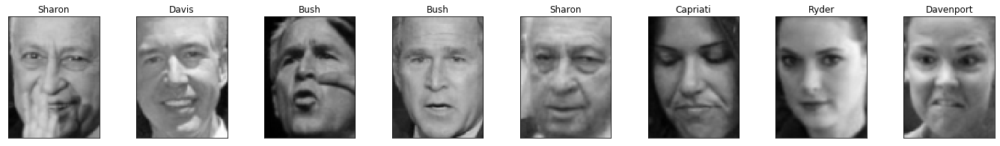

max image: 8



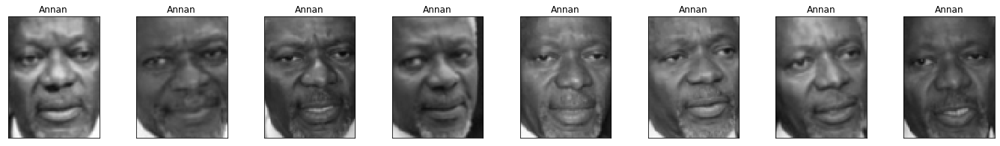

max image: 8



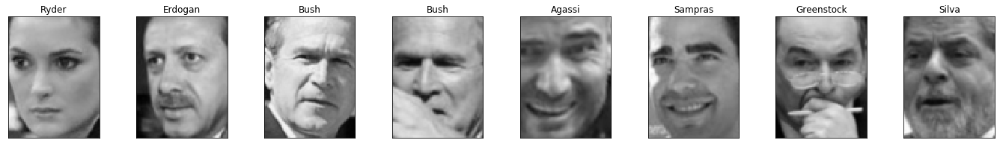

max image: 8



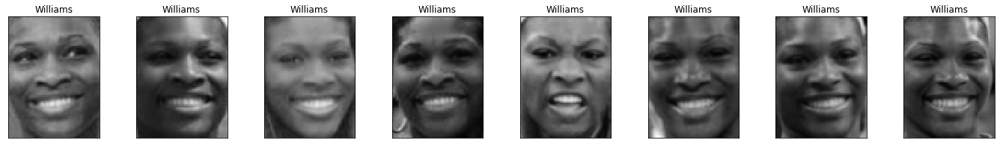

max image: 8



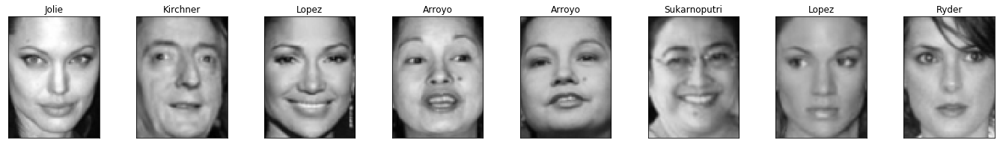

max image: 8



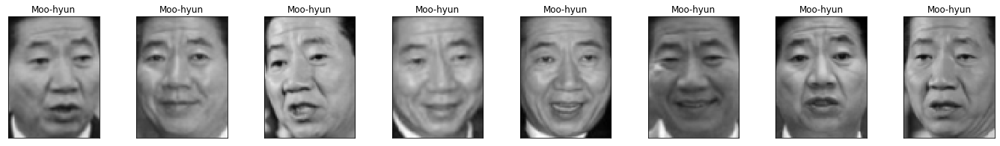

max image: 8



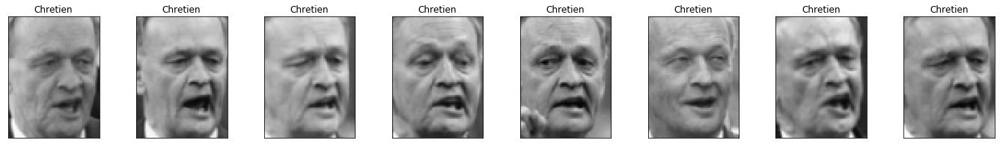

max image: 8



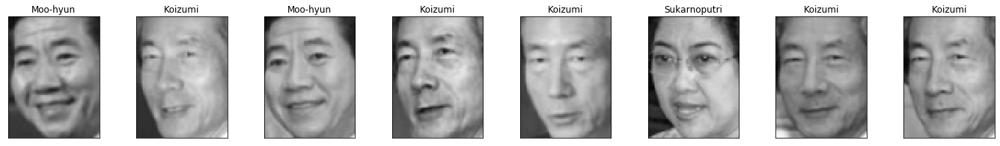

AgglomerativeClustering(affinity='euclidean', compute_full_tree='auto',
                        connectivity=<2063x2063 sparse matrix of type '<class 'numpy.float64'>'
	with 53332 stored elements in Compressed Sparse Row format>,
                        distance_threshold=None, linkage='ward', memory=None,
                        n_clusters=14)
Ward: 2.3 sec
labels found: 14
_____________________________________________
       Ward                                     
_____________________________________________
max image: 8



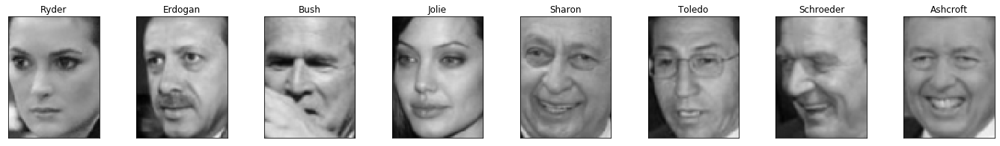

max image: 8



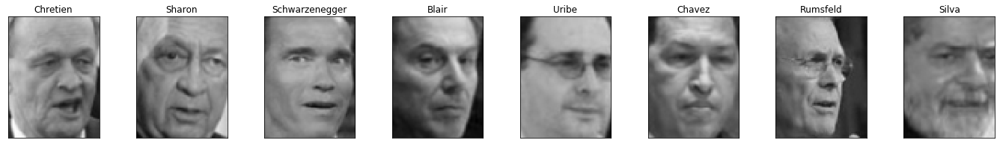

max image: 8



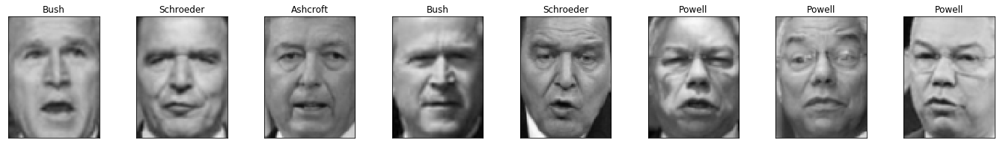

max image: 8



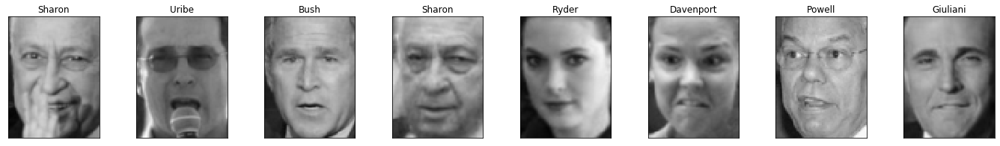

max image: 8



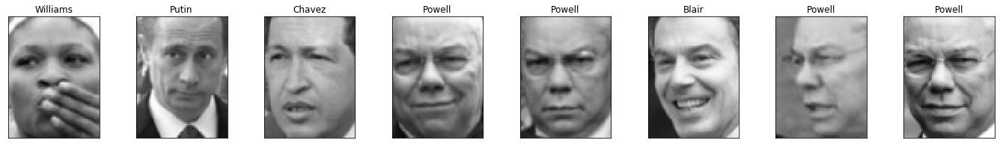

max image: 8



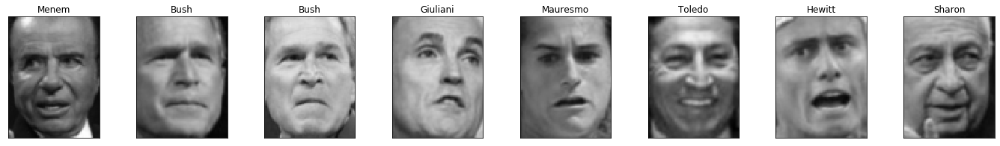

max image: 8



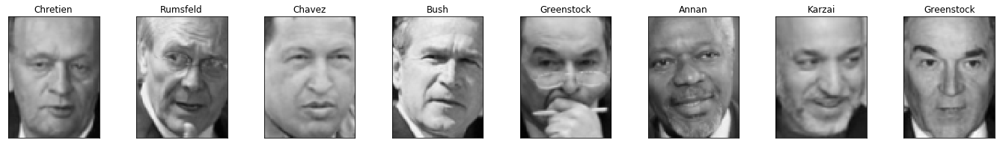

max image: 8



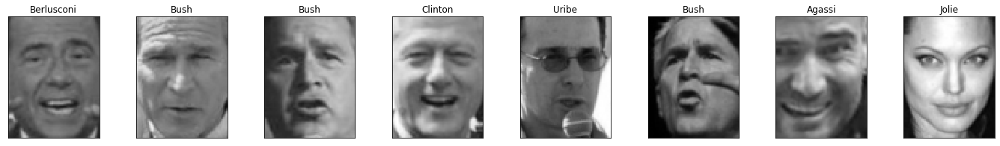

max image: 8



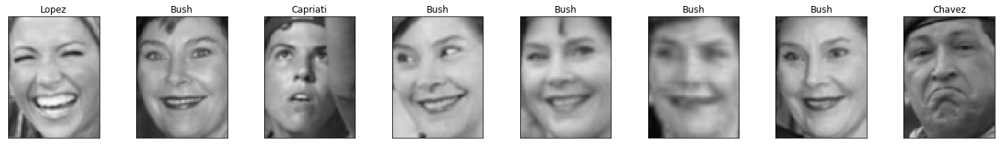

max image: 8



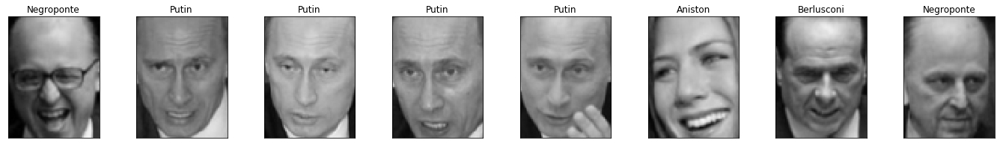

max image: 8



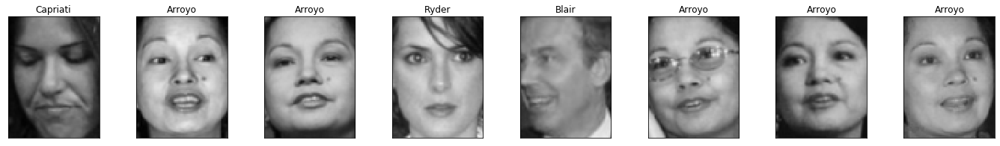

max image: 8



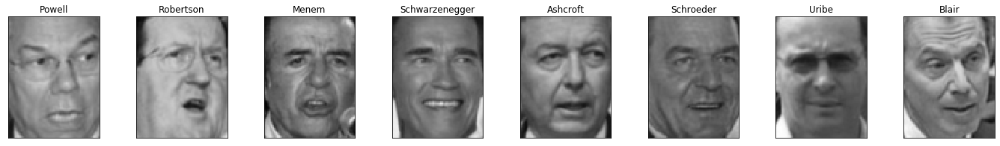

max image: 8



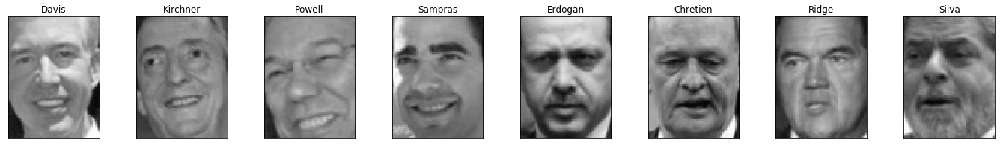

max image: 8



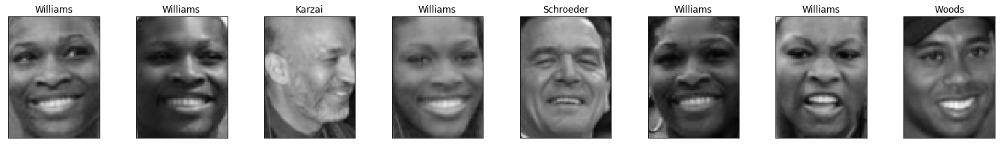

AgglomerativeClustering(affinity='cityblock', compute_full_tree='auto',
                        connectivity=<2063x2063 sparse matrix of type '<class 'numpy.float64'>'
	with 53332 stored elements in Compressed Sparse Row format>,
                        distance_threshold=None, linkage='average', memory=None,
                        n_clusters=14)
AverageLinkage: 6.2 sec
labels found: 14
_____________________________________________
       AverageLinkage                                     
_____________________________________________
max image: 8



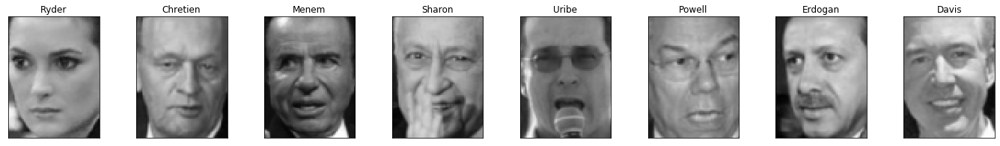

max image: 1

1989


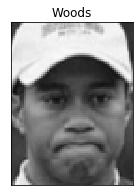

max image: 2



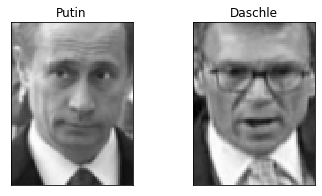

max image: 1

1606


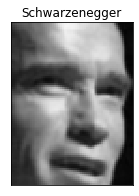

max image: 1

1881


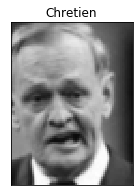

max image: 1

1982


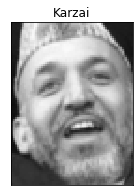

max image: 2



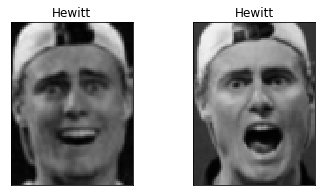

max image: 1

627


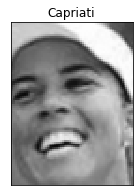

max image: 1

1090


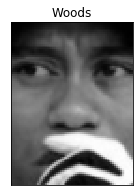

max image: 1

1507


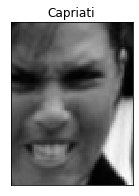

max image: 1

595


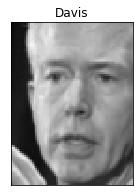

max image: 1

661


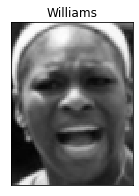

max image: 1

1543


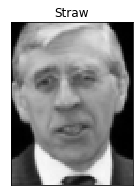

max image: 1

1219


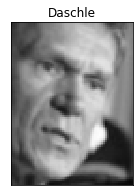

In [15]:
# %% using other cluster algorithms learner on the pca transformed data
from time import time
from sklearn import cluster
from sklearn.neighbors import kneighbors_graph

n_clusters=14

clustering_names = ['SpectralClustering', 'Ward', 'AverageLinkage']

connectivity = kneighbors_graph(X_pca, n_neighbors=n_clusters, include_self=False)
# make connectivity symmetric
connectivity = 0.5 * (connectivity + connectivity.T)

spectral = cluster.SpectralClustering(n_clusters=n_clusters,
                                          eigen_solver='arpack',
                                          affinity="nearest_neighbors")

ward = cluster.AgglomerativeClustering(n_clusters=n_clusters, linkage='ward',
                                           connectivity=connectivity)

average_linkage = cluster.AgglomerativeClustering(
        linkage="average", affinity="cityblock", n_clusters=n_clusters,
        connectivity=connectivity)


clustering_algorithms = [spectral, ward, average_linkage]

# %matplotlib inline
for name, algorithm in zip(clustering_names, clustering_algorithms):
    # predict cluster memberships
    print(algorithm)
    t0 = time()
    algorithm.fit(X_pca)
    t1 = time()
        
    if hasattr(algorithm, 'labels_'):
        labels = algorithm.labels_.astype(np.int)
    else:
        labels = algorithm.predict(X_pca)
    
    print("%s: %.2g sec" % (name,t1 - t0))
    print('labels found: %i' % (max(labels) + 1))
    print("_____________________________________________")
    print("       %s                                     " % (name))
    print("_____________________________________________")
    
    for cluster in range(max(labels) + 1):
        mask = labels == cluster
        ind=np.where(mask==True)[0]
        n_images = np.size(ind)
        submask=np.zeros(X_pca.shape[0])
        submask=submask.astype(dtype=bool)
        submask[ind]=True
        #n_images =  np.sum(mask)
        #print(n_images)
            
        max_image=np.min([n_images,8])
        print('max image: %i\n' % (max_image))
        fig, axes = plt.subplots(1, max_image, figsize=(max_image * 3, 3),
                         subplot_kw={'xticks': (), 'yticks': ()})
        
        if max_image==1:
            print(ind[0])
            image=X_people[ind[0]]
            label=y_people[ind[0]]
            plt.imshow(image.reshape(image_shape), vmin=0, vmax=1)
            plt.title(people.target_names[label].split()[-1])
        else:
            for image, label, ax in zip(X_people[submask], y_people[submask], axes):
                ax.imshow(image.reshape(image_shape), vmin=0, vmax=1)
                ax.set_title(people.target_names[label].split()[-1])
        
        plt.show()

<img src="images/ost_logo.png" width="240" height="240" align="right"/>
<div style="text-align: left"> <b> Machine Learning </b> <br> MSE FTP MachLe <br> 
<a href="mailto:christoph.wuersch@ost.ch"> Christoph Würsch </a> </div>

# k-Means, Gaussian Mixture Models and the EM algorithm

In [1]:
import warnings
warnings.filterwarnings("ignore") 
from IPython.core.display import display, HTML

import time

import pandas as pd
#import pandas_datareader.data as web
import numpy as np
import scipy.stats as scs
from scipy.stats import multivariate_normal as mvn
import sklearn.mixture as mix

import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline


### To gain understanding of mixture models we have to start at the beginning with the expectation maximization algorithm and it's application

### First a little history on the EM-algorithm

Reference: 4

Demptser, Laird & Rubin (1977)
    -unified previously unrelated work under "The EM Algorithm"
    - unified previously unrelated work under "The EM Algorithm"
    - overlooked E-M works - see gaps between foundational authors
        - Newcomb (1887)
        - McKendrick (1926) [+39 years]
        - Hartley (1958) [+32 years]
        - Baum et. al. (1970) [+12 years]
        - Dempters et. al. (1977) [+7 years]

#### *EM Algorithm developed over 90 years*

## EM provides general framework for solving problems

Examples include:
    - Filling in missing data from a sample set
    - Discovering values of latent variables
    - Estimating parameters of HMMs
    - Estimating parameters of finite mixtures [models]
    - Unsupervised learning of clusters
    - etc...
    
### (a)  How does the EM algorithm work? 

EM is an iterative process that begins with a "naive" or random initialization and then alternates between the expectation and maximization steps until the algorithm reaches convergence. 

To describe this in words imagine we have a simple data set consisting of class heights with groups separated by gender.

In [39]:
# import class heights
f = 'https://raw.githubusercontent.com/BlackArbsCEO/Mixture_Models/K-Means%2C-E-M%2C-Mixture-Models/Class_heights.csv'

data = pd.read_csv(f)
data.to_csv('Class_heights.csv')
# data.info()

height = data['Height (in)']
data.head()

,Gender,Height (in)
0,Male,72
1,Male,72
2,Female,63
3,Female,62
4,Female,62


In [40]:
data.describe()

,Height (in)
count,21.000000
mean,66.190476
std,4.130606
min,60.000000
25%,63.000000
50%,65.000000
75%,71.000000
max,73.000000


Now imagine that we did not have the convenient gender labels associated with each data point. How could we estimate the two group means? 

First let's set up our problem. 

In this example we hypothesize that these height data points are drawn from two distributions with two means - < $\mu_1$, $\mu_2$ >.

- The heights are the observed $x$ values. 

- The hidden variables, which EM is going to estimate, can be thought of in the following way. Each $x$ value has 2 associated $z$ values. These $z$ values < $z_1$, $z_2$ > represent the distribution (or class or cluster) that the data point is drawn from.

- Understanding the range of values the $z$ values can take is important. 

- In k-means, the two $z$'s can only take the values of 0 or 1. If the $x$ value came from the first distribution (cluster), then $z_1$=1 and $z_2$=0 and vice versa. This is called **hard** clustering. 

- In Gaussian Mixture Models, the $z$'s can take on any value between 0 and 1 because the x values are considered to be drawn probabilistically from 1 of the 2 distributions. For example $z$ values can be $z_1$=0.85 and $z_2$>=0.15, which represents a strong probability that the $x$ value came from distribution 1 and smaller probability that it came from distribution 2. This is called **soft** or **fuzzy** clustering. 


For this example, we will assume the x values are drawn from Gaussian distributions. 

To start the algorithm, we choose two random means. 

From there we repeat the following until convergence. 

#### The expectation step:

We calculate the expected values $E(z_{ij})$, which is the probability that $x_i$ was drawn from the $jth$ distribution.
    
$$E(z_{ij}) = \frac{p(x = x_i|\mu = \mu_j)}{\sum_{n=1}^2 p(x = x_i|\mu = \mu_j)}$$


$$= \frac{ e^{-\frac{1}{2\sigma^2}(x_i - \mu_j)^2} }
{ \sum_{n=1}^2e^{-\frac{1}{2\sigma^2}(x_i - \mu_n)^2} }$$

The formula simply states that the expected value for $z_{ij}$ is the probability $x_i$ given $\mu_j$ divided by the sum of the probabilities that $x_i$ belonged to each $\mu$

#### The maximization step:

After calculating all $E(z_{ij})$ values we can calculate (update) new $\mu$ values. 

$$ \mu_j = \frac {\sum_{i=1}^mE(z_{ij})x_i} {\sum_{i=1}^mE(z_{ij})}$$

This formula generates the maximum likelihood estimate. 

By repeating the E-step and M-step we are guaranteed to find a local maximum giving us a maximum likelihood estimation of our hypothesis. 

### What are Maximum Likelihood Estimates (MLE)

    1. Parameters describe characteristics (attributes) of a population. These parameter values are estimated from samples collected from that population.

    2. A MLE is a parameter estimate that is most consistent with the sampled data. By definition it maximizes the likelihood function. One way to accomplish this is to take the first derivative of the likelihood function w/ respect to the parameter theta and solve for 0. This value maximizes the likelihood function and is the MLE

### A quick example of a maximum likelihood estimate
    
#### You flip a coin 10 times and observe the following sequence (H, T, T, H, T, T, T, T, H, T)
#### What's the MLE of observing 3 heads in 10 trials?    

#### simple answer:    
    The frequentist MLE is (# of successes) / (# of trials) or 3/10

#### solving first derivative of binomial distribution answer:    

\begin{align}
\mathcal L(\theta) & = {10 \choose 3}\theta^3(1-\theta)^7 \\[1ex]
log\mathcal L(\theta) & = log{10 \choose 3} + 3log\theta + 7log(1 - \theta) \\[1ex]
\frac{dlog\mathcal L(\theta)}{d(\theta)} & = \frac 3\theta - \frac{7}{1-\theta} = 0 \\[1ex]
\frac 3\theta & = \frac{7}{1 - \theta} \Rightarrow \frac{3}{10}
\end{align}

#### That's a MLE! This is the estimate that is most consistent with the observed data

Back to our height example. Using the generalized Gaussian mixture model code sourced from Duke's computational statistics we can visualize this process. 

In [42]:
# Code sourced from:
#    http://people.duke.edu/~ccc14/sta-663/EMAlgorithm.html

def em_gmm_orig(xs, pis, mus, sigmas, tol=0.01, max_iter=20):

    n, p = xs.shape
    k = len(pis)

    ll_old = 0
    for itercount in range(max_iter):
        print('\nIteration: ', itercount)
        print()
        exp_A = []
        exp_B = []
        ll_new = 0

        # E-step
        ws = np.zeros((k, n))
        for j in range(len(mus)):
            for i in range(n):
                ws[j, i] = pis[j] * mvn(mus[j], sigmas[j]).pdf(xs[i])
        ws /= ws.sum(0)

        # M-step
        pis = np.zeros(k)
        for j in range(len(mus)):
            for i in range(n):
                pis[j] += ws[j, i]
        pis /= n

        mus = np.zeros((k, p))
        for j in range(k):
            for i in range(n):
                mus[j] += ws[j, i] * xs[i]
            mus[j] /= ws[j, :].sum()
        
        sigmas = np.zeros((k, p, p))
        for j in range(k):
            for i in range(n):
                ys = np.reshape(xs[i]- mus[j], (2,1))
                sigmas[j] += ws[j, i] * np.dot(ys, ys.T)
            sigmas[j] /= ws[j,:].sum()

        new_mus = (np.diag(mus)[0], np.diag(mus)[1])
        new_sigs = (np.unique(np.diag(sigmas[0]))[0], np.unique(np.diag(sigmas[1]))[0])
        df = (pd.DataFrame(index=[1, 2]).assign(mus = new_mus).assign(sigs = new_sigs))
        
        xx = np.linspace(0, 100, 100)
        yy = scs.multivariate_normal.pdf(xx, mean=new_mus[0], cov=new_sigs[0])
        
        colors = sns.color_palette('Dark2', 3)
        fig, ax = plt.subplots(figsize=(9, 7))
        ax.set_ylim(-0.001, np.max(yy))
        ax.plot(xx, yy, color=colors[1])
        ax.axvline(new_mus[0], ymin=0., color=colors[1])
        ax.fill_between(xx, 0, yy, alpha=0.5, color=colors[1])
        lo, hi = ax.get_ylim()
        ax.annotate(f'$\mu_1$: {new_mus[0]:3.2f}', 
                    fontsize=12, fontweight='demi',
                    xy=(new_mus[0], (hi-lo) / 2), 
                    xycoords='data', xytext=(80, (hi-lo) / 2),
                    arrowprops=dict(facecolor='black', connectionstyle="arc3,rad=0.2",shrink=0.05))
        ax.fill_between(xx, 0, yy, alpha=0.5, color=colors[2])
        
        yy2 = scs.multivariate_normal.pdf(xx, mean=new_mus[1], cov=new_sigs[1])
        
        ax.plot(xx, yy2, color=colors[2])
        ax.axvline(new_mus[1], ymin=0., color=colors[2])
        lo, hi = ax.get_ylim()
        ax.annotate(f'$\mu_2$: {new_mus[1]:3.2f}', 
                    fontsize=12, fontweight='demi',
            xy=(new_mus[1], (hi-lo) / 2), xycoords='data', xytext=(25, (hi-lo) / 2),
            arrowprops=dict(facecolor='black', connectionstyle="arc3,rad=0.2",shrink=0.05))
        ax.fill_between(xx, 0, yy2, alpha=0.5, color=colors[2])
        
        dot_kwds = dict(markerfacecolor='white', markeredgecolor='black', markeredgewidth=1, markersize=10)
        ax.plot(height, len(height)*[0], 'o', **dot_kwds)
        ax.set_ylim(-0.001, np.max(yy2))
        
        figureFileName="EM_GMM_iter_%i.png" % itercount
        print(figureFileName)
        plt.savefig(figureFileName,dpi=600)
        
        
        print(df.T)   
        
        # update complete log likelihoood
        ll_new = 0.0
        for i in range(n):
            s = 0
            for j in range(k):
                s += pis[j] * mvn(mus[j], sigmas[j]).pdf(xs[i])
            ll_new += np.log(s)
        print(f'log_likelihood: {ll_new:3.4f}')
        if np.abs(ll_new - ll_old) < tol:
            break
        ll_old = ll_new
        
    return ll_new, pis, mus, sigmas


Iteration:  0

EM_GMM_iter_0.png
               1           2
mus    61.362928   59.659685
sigs  469.240750  244.382352
log_likelihood: -141.8092

Iteration:  1

EM_GMM_iter_1.png
              1          2
mus    68.73773  63.620554
sigs  109.85442   7.228183
log_likelihood: -118.0520

Iteration:  2

EM_GMM_iter_2.png
              1          2
mus   70.569842  63.688825
sigs   4.424452   3.139277
log_likelihood: -100.2591

Iteration:  3

EM_GMM_iter_3.png
              1          2
mus   70.569842  63.688825
sigs   4.424427   3.139278
log_likelihood: -100.2591


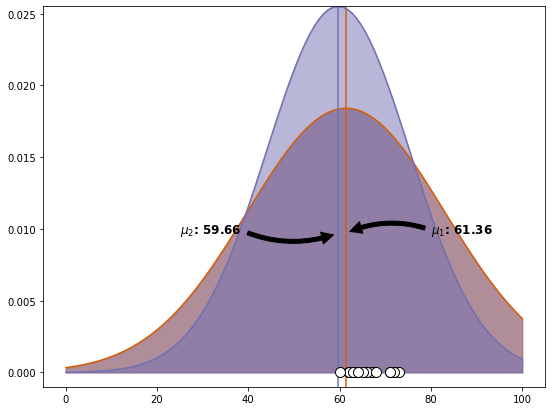

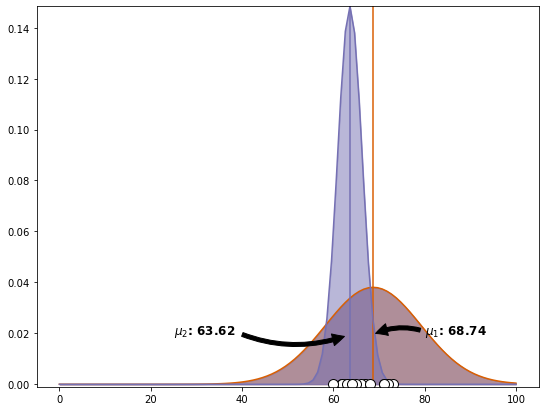

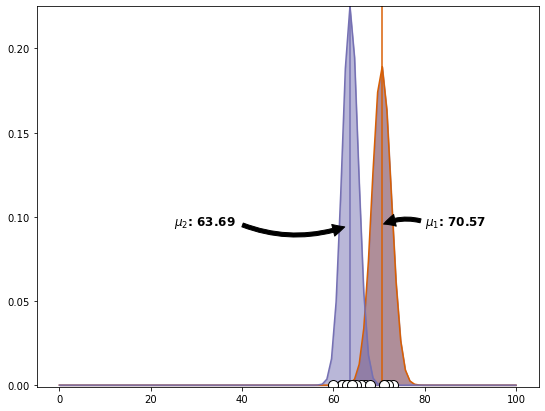

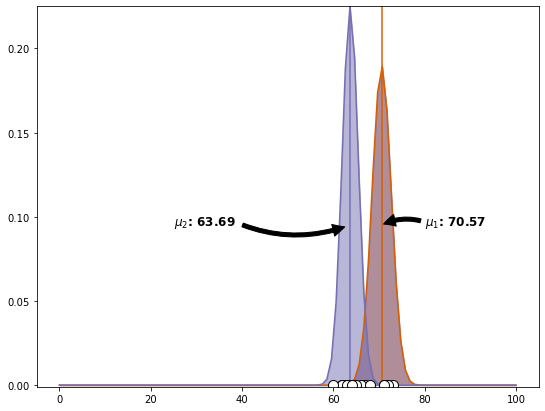

In [43]:
height = data['Height (in)']
n = len(height)

# Ground truthish
_mus = np.array([[0, data.groupby('Gender').mean().iat[0, 0]], 
                 [data.groupby('Gender').mean().iat[1, 0], 0]])
_sigmas = np.array([[[5, 0], [0, 5]], 
                    [[5, 0],[0, 5]]])
_pis = np.array([0.5, 0.5]) # priors

# initial random guesses for parameters
np.random.seed(0)

pis = np.random.random(2)
pis /= pis.sum()
mus = np.random.random((2,2))
sigmas = np.array([np.eye(2)] * 2) * height.std()

# generate our noisy x values
xs = np.concatenate([np.random.multivariate_normal(mu, sigma, int(pi*n))
                    for pi, mu, sigma in zip(_pis, _mus, _sigmas)])

ll, pis, mus, sigmas = em_gmm_orig(xs, pis, mus, sigmas)

# In the below plots the white dots represent the observed heights.

#### Notice how the algorithm was able to estimate the true means starting from random guesses for the parameters.

### Now that we have a grasp of the algorithm we can examine K-Means as a form of EM

K-Means is an unsupervised learning algorithm used for clustering multidimensional data sets.

The basic form of K-Means makes two *assumptions*

    1. Each data point is closer to its own cluster center than the other cluster centers
    2. A cluster center is the arithmetic mean of all the points that belong to the cluster.

The expectation step is done by calculating the pairwise distances  of every data point and assigning cluster membership to the closest center (mean)

The maximization step is simply the arithmetic mean of the previously assigned data points for each cluster

#### The following sections borrow heavily from Jake Vanderplas' [Python Data Science Handbook](https://www.amazon.com/gp/product/1491912057/ref=as_li_qf_sp_asin_il_tl?ie=UTF8&tag=blkarbs-20&camp=1789&creative=9325&linkCode=as2&creativeASIN=1491912057&linkId=e000ed9627cfe6b505be11c50118decb)

In [19]:
# Let's define some demo variables and make some blobs

# demo variables

k = 4
n_draws = 500
sigma = .7
random_state = 0
dot_size = 50
cmap = 'viridis'

Text(0.5, 1.0, 'k-means make blobs')

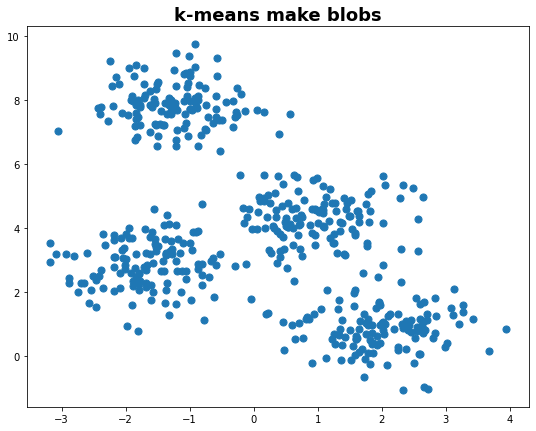

In [20]:
# make blobs

from sklearn.datasets.samples_generator import make_blobs

X, y_true = make_blobs(n_samples = n_draws,
                       centers = k,
                       cluster_std = sigma,
                       random_state = random_state)

fig, ax = plt.subplots(figsize=(9,7))
ax.scatter(X[:, 0], X[:, 1], s=dot_size)
plt.title('k-means make blobs', fontsize=18, fontweight='demi')

In [21]:
# sample implementation
# code sourced from: 
#   http://nbviewer.jupyter.org/github/jakevdp/PythonDataScienceHandbook/blob/master/notebooks/05.11-K-Means.ipynb

from sklearn.metrics import pairwise_distances_argmin

def find_clusters(X, n_clusters, rseed=2):
    # 1. Random initialization (choose random clusters)
    rng = np.random.RandomState(rseed)
    i = rng.permutation(X.shape[0])[:n_clusters]
    centers = X[i]

    while True:
        # 2a. Assign labels based on closest center
        labels = pairwise_distances_argmin(X, centers)

        # 2b. Find new centers from means of points
        new_centers = np.array([X[labels == i].mean(0) 
                                for i in range(n_clusters)])

        # 2c. Check for convergence
        if np.all(centers == new_centers):
            break
        centers = new_centers
    
    return centers, labels

Text(0.5, 1.0, 'sklearn k-means')

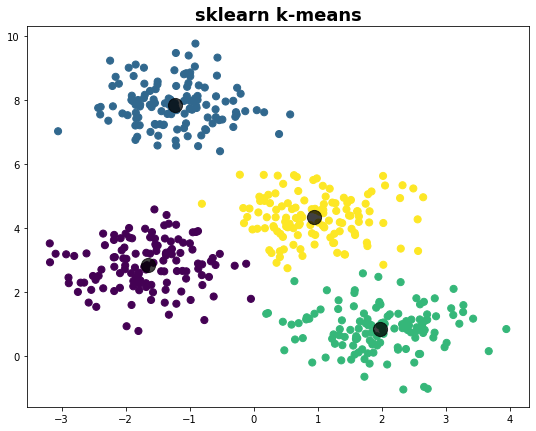

In [22]:
# now let's compare this to the sklearn's KMeans() algorithm

# fit k-means to blobs

from sklearn.cluster import KMeans

kmeans = KMeans(n_clusters=k)
kmeans.fit(X)
y_kmeans = kmeans.predict(X)

# visualize prediction
fig, ax = plt.subplots(figsize=(9,7))
ax.scatter(X[:, 0], X[:, 1], c=y_kmeans, s=dot_size, cmap=cmap)

# get centers for plot
centers = kmeans.cluster_centers_
ax.scatter(centers[:, 0], centers[:, 1], c='black', s=200, alpha=0.75)
plt.title('sklearn k-means', fontsize=18, fontweight='demi')

Text(0.5, 1.0, 'find_clusters() k-means func')

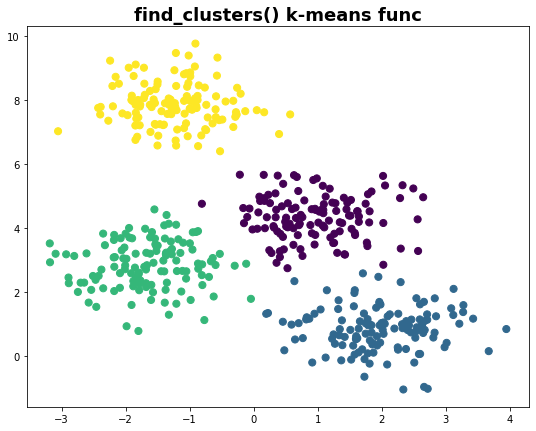

In [23]:
# let's test the implementation

centers, labels = find_clusters(X, k)

fig, ax = plt.subplots(figsize=(9,7))
ax.scatter(X[:, 0], X[:, 1], c=labels, s=dot_size, cmap=cmap)
plt.title('find_clusters() k-means func', fontsize=18, fontweight='demi')

#### To build our intuition of this process, play with the following interactive code from Jake Vanderplas in an Jupyter (IPython) notebook

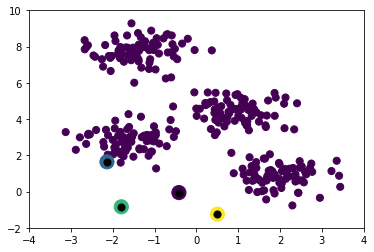

<function __main__.plot_kmeans_interactive.<locals>._kmeans_step(frame=0, n_clusters=4)>

In [25]:
# code sourced from:
#   http://nbviewer.jupyter.org/github/jakevdp/PythonDataScienceHandbook/blob/master/notebooks/06.00-Figure-Code.ipynb#Covariance-Type

from ipywidgets import interact

def plot_kmeans_interactive(min_clusters=1, max_clusters=6):
    X, y = make_blobs(n_samples=300, centers=4,
                      random_state=0, cluster_std=0.60)
        
    def plot_points(X, labels, n_clusters):
        plt.scatter(X[:, 0], X[:, 1], c=labels, s=50, cmap='viridis',
                    vmin=0, vmax=n_clusters - 1);
            
    def plot_centers(centers):
        plt.scatter(centers[:, 0], centers[:, 1], marker='o',
                    c=np.arange(centers.shape[0]),
                    s=200, cmap='viridis')
        plt.scatter(centers[:, 0], centers[:, 1], marker='o',
                    c='black', s=50)
            

    def _kmeans_step(frame=0, n_clusters=4):
        rng = np.random.RandomState(2)
        labels = np.zeros(X.shape[0])
        centers = rng.randn(n_clusters, 2)

        nsteps = frame // 3

        for i in range(nsteps + 1):
            old_centers = centers
            if i < nsteps or frame % 3 > 0:
                labels = pairwise_distances_argmin(X, centers)

            if i < nsteps or frame % 3 > 1:
                centers = np.array([X[labels == j].mean(0)
                                    for j in range(n_clusters)])
                nans = np.isnan(centers)
                centers[nans] = old_centers[nans]

        # plot the data and cluster centers
        plot_points(X, labels, n_clusters)
        plot_centers(old_centers)

        # plot new centers if third frame
        if frame % 3 == 2:
            for i in range(n_clusters):
                plt.annotate('', centers[i], old_centers[i], 
                             arrowprops=dict(arrowstyle='->', linewidth=1))
            plot_centers(centers)

        plt.xlim(-4, 4)
        plt.ylim(-2, 10)

        if frame % 3 == 1:
            plt.text(3.8, 9.5, "1. Reassign points to nearest centroid",
                     ha='right', va='top', size=14)
        elif frame % 3 == 2:
            plt.text(3.8, 9.5, "2. Update centroids to cluster means",
                     ha='right', va='top', size=14)
    
    return interact(_kmeans_step, frame=[0, 10, 20, 30, 40, 50, 300],
                    n_clusters=np.arange(min_clusters, max_clusters+1))

plot_kmeans_interactive()

### Now we are ready to explore some of the nuances/issues of implementing K-Means as an expectation maximization algorithm

### the globally optimal result is not guaranteed
    - EM is guaranteed to improve the result in each iteration but there are no guarantees that it will find the global best. See the following example, where we initalize the algorithm with a different seed.

### practical solution: 
    - Run the algorithm w/ multiple random initializations
    - This is done by default in sklearn

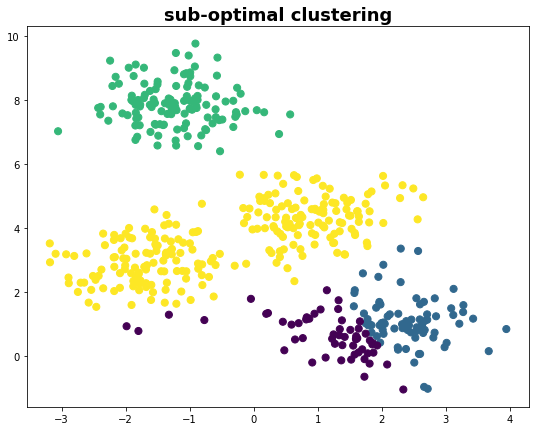

In [26]:
centers, labels = find_clusters(X, k, rseed=11)

fig, ax = plt.subplots(figsize=(9,7))
ax.set_title('sub-optimal clustering', fontsize=18, fontweight='demi')
ax.scatter(X[:, 0], X[:, 1], c=labels, s=dot_size, cmap=cmap)

### number of means (clusters) have to be selected beforehand
    - k-means cannot learn the optimal number of clusters from the data. If we ask for six clusters it will find six clusters, which may or may not be meaningful.
    
### practical solution:
    - use a more complex clustering algorithm like Gaussian Mixture Models, or one that can choose a suitable number of clusters (DBSCAN, mean-shift, affinity propagation)

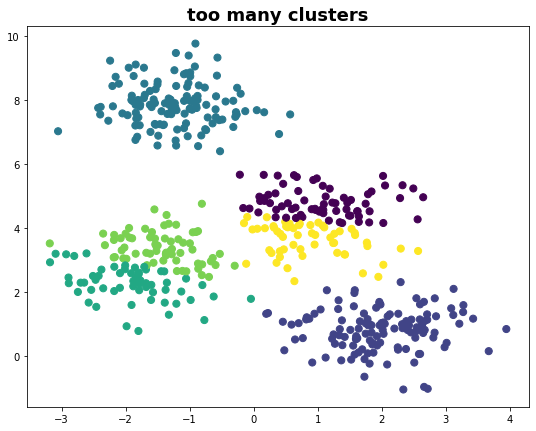

In [27]:
labels6 = KMeans(6, random_state=random_state).fit_predict(X)

fig, ax = plt.subplots(figsize=(9,7))
ax.set_title('too many clusters', fontsize=18, fontweight='demi')
ax.scatter(X[:, 0], X[:, 1], c=labels6, s=dot_size, cmap=cmap)

### k-means is terrible for non-linear data:
    - this results because of the assumption that points will be closer to their own cluster center than others

### practical solutions:
    - transform data into higher dimension where linear separation is possible e.g., spectral clustering

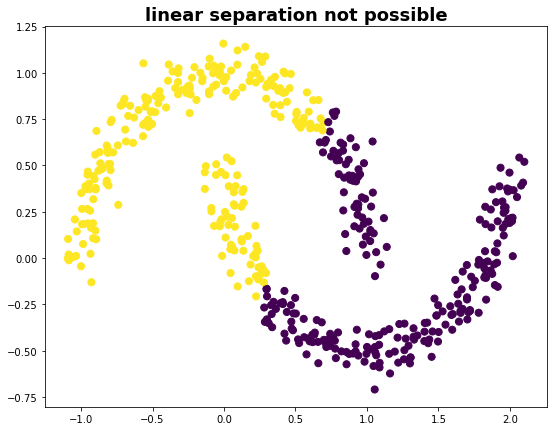

In [28]:
from sklearn.datasets import make_moons

X_mn, y_mn = make_moons(500, noise=.07, random_state=random_state)

labelsM = KMeans(2, random_state=random_state).fit_predict(X_mn)

fig, ax = plt.subplots(figsize=(9,7))
ax.set_title('linear separation not possible', fontsize=18, fontweight='demi')
ax.scatter(X_mn[:, 0], X_mn[:, 1], c=labelsM, s=dot_size, cmap=cmap)

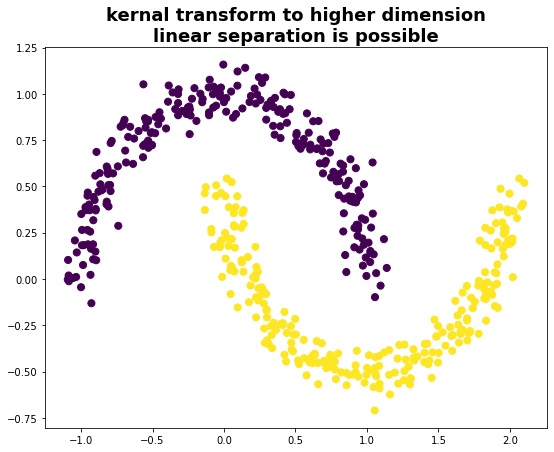

In [29]:
from sklearn.cluster import SpectralClustering

model = SpectralClustering(n_clusters=2, affinity='nearest_neighbors',
                          assign_labels='kmeans')

labelsS = model.fit_predict(X_mn)

fig, ax = plt.subplots(figsize=(9,7))
ax.set_title('kernal transform to higher dimension\nlinear separation is possible', fontsize=18, fontweight='demi')
plt.scatter(X_mn[:, 0], X_mn[:, 1], c=labelsS, s=dot_size, cmap=cmap)

### K-Means is known as a hard clustering algorithm because clusters are not allowed to overlap.  

> ___"One way to think about the k-means model is that it places a circle (or, in higher dimensions, a hyper-sphere) at the center of each cluster, with a radius defined by the most distant point in the cluster. This radius acts as a hard cutoff for cluster assignment within the training set: any point outside this circle is not considered a member of the cluster.___ -- <cite> [Jake VanderPlas Python Data Science Handbook] [1]</cite>

[1]:http://nbviewer.jupyter.org/github/jakevdp/PythonDataScienceHandbook/blob/master/notebooks/05.12-Gaussian-Mixtures.ipynb

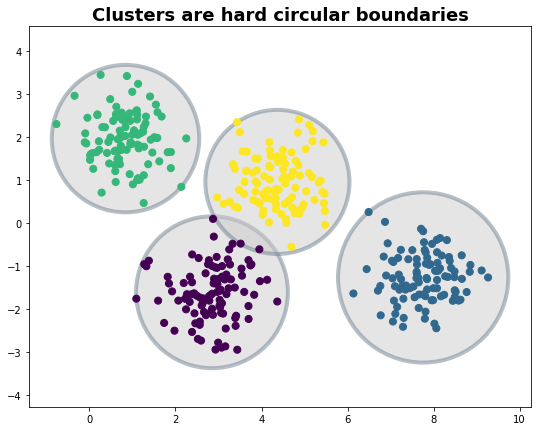

In [30]:
# k-means weaknesses that mixture models address directly
# code sourced from:
#   http://nbviewer.jupyter.org/github/jakevdp/PythonDataScienceHandbook/blob/master/notebooks/05.12-Gaussian-Mixtures.ipynb

from scipy.spatial.distance import cdist

def plot_kmeans(kmeans, X, n_clusters=k, rseed=2, ax=None):
    labels = kmeans.fit_predict(X)
    
    # plot input data
    #ax = ax or plt.gca() # <-- nice trick
    fig, ax = plt.subplots(figsize=(9,7))    
    ax.axis('equal')
    ax.scatter(X[:, 0], X[:, 1],
               c=labels, s=dot_size, cmap=cmap, zorder=2)
    
    # plot the representation of Kmeans model
    centers = kmeans.cluster_centers_
    radii = [cdist(X[labels==i], [center]).max() 
             for i, center in enumerate(centers)]
    
    for c, r in zip(centers, radii):
        ax.add_patch(plt.Circle(c, r, fc='#CCCCCC',edgecolor='slategrey',
                                lw=4, alpha=0.5, zorder=1))
    return      
                     
X3, y_true = make_blobs(n_samples = 400,
                       centers = k,
                       cluster_std = .6,
                       random_state = random_state)
X3 = X3[:, ::-1] # better plotting

kmeans = KMeans(n_clusters=k, random_state=random_state)
plot_kmeans(kmeans, X3)
plt.title('Clusters are hard circular boundaries', fontsize=18, fontweight='demi')
plt.savefig('Kmeans_circular.png',dpi=600)

#### A resulting issue of K-Means' circular boundaries is that it has no way to account for oblong or elliptical clusters. 

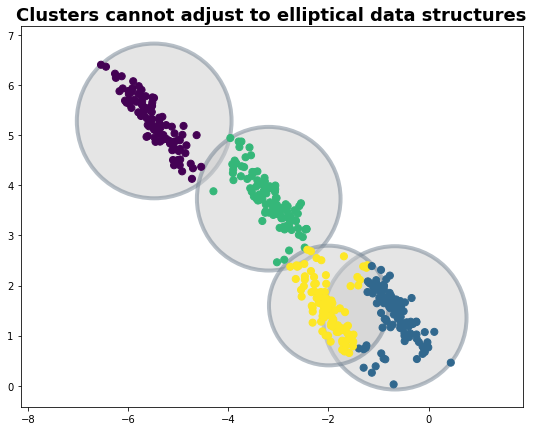

In [31]:
rng = np.random.RandomState(13)
X3_stretched = np.dot(X3, rng.randn(2, 2))

kmeans = KMeans(n_clusters=k, random_state=random_state)
plot_kmeans(kmeans, X3_stretched)
plt.title('Clusters cannot adjust to elliptical data structures',
         fontsize=18, fontweight='demi')
plt.savefig('Kmeans_elliptical.png',dpi=600)

### There are two ways we can extend K-Means

    1. measure uncertainty in cluster assignments by comparing distances to all cluster centers
    2. allow for flexibility in the shape of the cluster boundaries by using ellipses

### Recall our previous height example, and let's  assume that each cluster is a Gaussian distribution!

#### Gaussian distributions give flexibility to the clustering, and the same basic two step E-M algorithm used in K-Means is applied here as well. 

1. Randomly initialize location and shape
2. Repeat until converged:
       E-step: for each point, find weights encoding the probability of membership in each cluster.
       
       M-step: for each cluster, update its location, normalization, and shape based on all data points, making use of the weights
       
#### The result of this process is that we end up with a smooth Gaussian cluster better fitted to the shape of the data, instead of a rigid inflexible circle. 

#### Note that because we still are using the E-M algorithm there is no guarantee of a globally optimal result. We can visualize the results of the model. 

In [32]:
# code sourced from:
#  http://nbviewer.jupyter.org/github/jakevdp/PythonDataScienceHandbook/blob/master/notebooks/05.12-Gaussian-Mixtures.ipynb
from matplotlib.patches import Ellipse 

def draw_ellipse(position, covariance, ax=None, **kwargs):
    """Draw an ellipse with a given position and covariance"""
    
    # Convert covariance to principal axes
    if covariance.shape == (2, 2):
        U, s, Vt = np.linalg.svd(covariance)
        angle = np.degrees(np.arctan2(U[1, 0], U[0, 0]))
        width, height = 2 * np.sqrt(s)
    else:
        angle = 0
        width, height = 2 * np.sqrt(covariance)
        
    # Draw the Ellipse
    for nsig in range(1, 4):
        ax.add_patch(Ellipse(position, nsig * width, nsig * height, 
                            angle, **kwargs))
        
def plot_gmm(gmm, X, label=True, ax=None):
    
    fig, ax = plt.subplots(figsize=(9,7))      
    ax = ax or plt.gca()
    labels = gmm.fit(X).predict(X)
    
    if label:
        ax.scatter(X[:, 0], X[:, 1], c=labels, s=dot_size, cmap=cmap, zorder=2)
    else:
        ax.scatter(X[:, 0], X[:, 1], s=dot_size, zorder=2)
    ax.axis('equal')
    
    w_factor = 0.2 / gmm.weights_.max()
    for pos, covar, w in zip(gmm.means_, gmm.covariances_, gmm.weights_):
        draw_ellipse(pos, covar, ax=ax, alpha=w * w_factor)

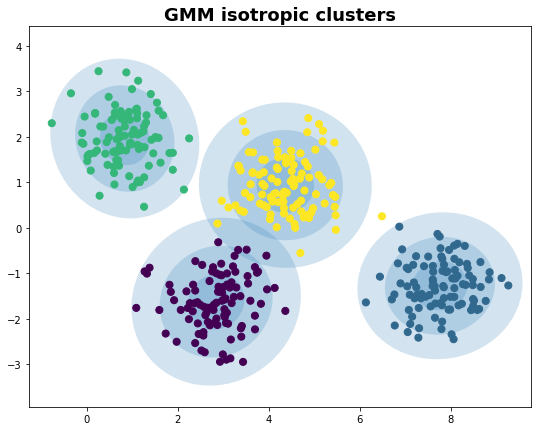

In [33]:
gmm = mix.GaussianMixture(n_components=k, random_state=random_state)
plot_gmm(gmm, X3)
plt.title('GMM isotropic clusters', fontsize=18, fontweight='demi')
plt.savefig('GMM_circular.png',dpi=600)

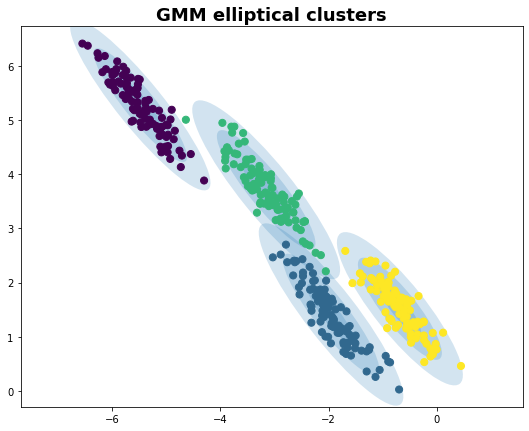

In [34]:
# lets test on the stretched data set

gmm = mix.GaussianMixture(n_components=k, random_state=random_state+1)
plot_gmm(gmm, X3_stretched)
plt.title('GMM elliptical clusters', fontsize=18, fontweight='demi')
plt.savefig('GMM_elliptical.png',dpi=600)

#### Notice how much better the model is able to fit the clusters when we assume each cluster is a Gaussian distribution instead of circle whose radius is defined by the most distant point.

## Gaussian Mixture Models as a tool for Density Estimation

#### The technical term for this type of model is: 

> __generative probabilistic model__

#### Why you ask? 

Because this model is really about characterizing the distribution of the entire dataset and not necessarily clustering. The power of these types of models is that they allow us to generate __new__ samples that __mimic__ the original underlying data!

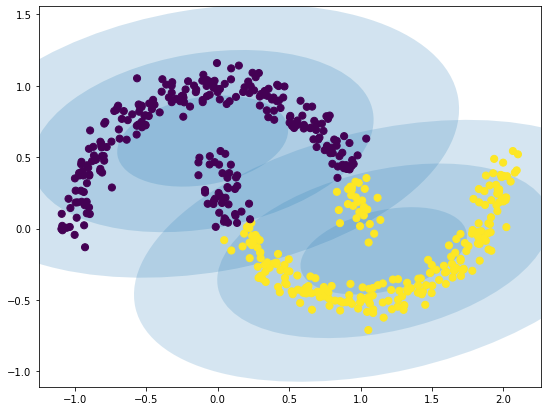

In [35]:
gmm2 = mix.GaussianMixture(n_components=2, covariance_type='full',
                          random_state=random_state)
plot_gmm(gmm2, X_mn)

If we try to cluster this data set we run into the same issue as before.

Instead let's ignore individual clusters and model the whole distribution of data as a collection of many Gaussians. 

Text(0.5, 1.0, 'Collective Gaussian clusters')

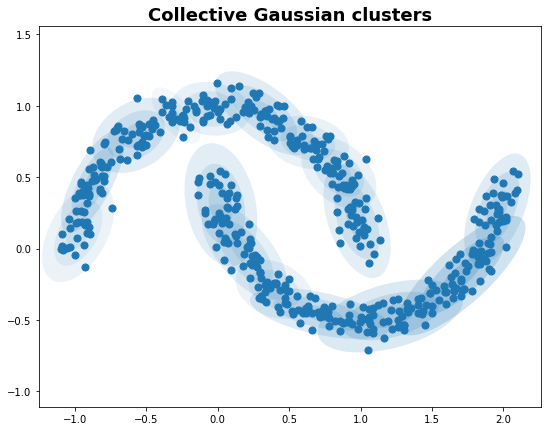

In [36]:
gmm16 = mix.GaussianMixture(n_components=16, covariance_type='full', 
                           random_state=random_state)

plot_gmm(gmm16, X_mn, label=False)
plt.title('Collective Gaussian clusters',
            fontsize=18, fontweight='demi')

Looks like the collection of clusters has fit the data set reasonably well. Now let's see if the model has actually _learned_ about this data set, such that we can create entirely new samples that _look_ like the original.

Text(0.5, 1.0, 'New samples drawn from fitted model')

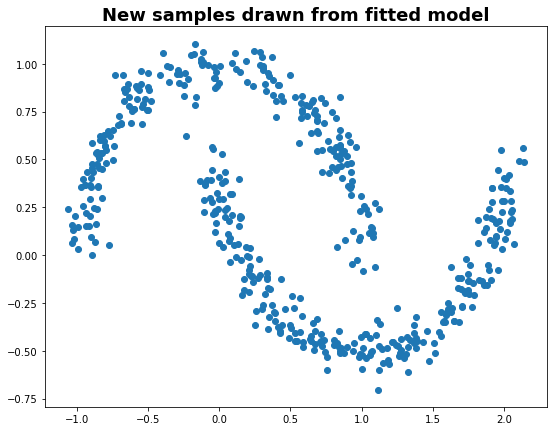

In [37]:
Xnew, ynew = gmm16.sample(500)

fig, ax = plt.subplots(figsize=(9,7))
ax.scatter(Xnew[:, 0], Xnew[:, 1]);
ax.set_title('New samples drawn from fitted model',
            fontsize=18, fontweight='demi')

Generative models allow for multiple methods to determine optimal number of components. Because it is a probability distribution we can evaluate the likelihood of the data using cross validation and/or using AIC or BIC. 

Sklearn makes this easy.

Text(0.5, 0, 'n_components')

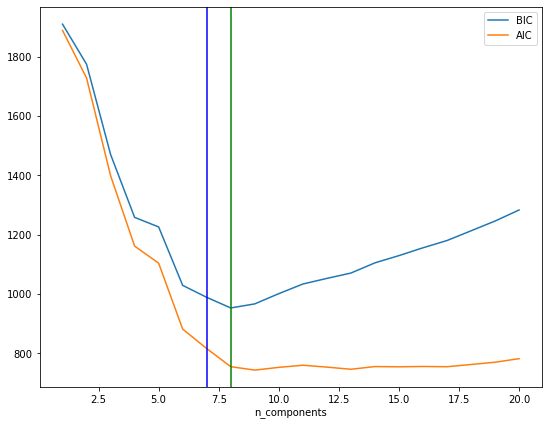

In [38]:
n_components = np.arange(1, 21)
models = [mix.GaussianMixture(n, covariance_type='full',
                             random_state=random_state).fit(X_mn)
         for n in n_components]

fig, ax = plt.subplots(figsize=(9,7))
ax.plot(n_components, [m.bic(X_mn) for m in models], label='BIC')
ax.plot(n_components, [m.aic(X_mn) for m in models], label='AIC')
ax.axvline(np.argmin([m.bic(X_mn) for m in models]), color='blue')
ax.axvline(np.argmin([m.aic(X_mn) for m in models]), color='green')

plt.legend(loc='best')
plt.xlabel('n_components')